In [3]:
import os

# This handles the 'KUNJ SHAH' space issue
os.environ["PYTENSOR_FLAGS"] = "base_compiledir=C:/py_cache,cxx="
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

import numpy as np
import pandas as pd
import pymc as pm
import nutpie

print(f"Success! NumPy: {np.__version__}")

WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install gxx`
C:\Users\KUNJ SHAH\anaconda3\envs\bayes_env\Lib\site-packages\arviz\__init__.py:50: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


Success! NumPy: 2.3.5


In [10]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install ipywidgets


   ---------------------------------------- 0.0/914.9 kB ? eta -:--:--
   ---------------------------------- ----- 786.4/914.9 kB 4.2 MB/s eta 0:00:01
   ---------------------------------------- 914.9/914.9 kB 4.2 MB/s  0:00:00
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   -------------- ------------------------- 0.8/2.2 MB 4.8 MB/s eta 0:00:01
   --------------------------------- ------ 1.8/2.2 MB 4.8 MB/s eta 0:00:01
   ---------------------------------------- 2.2/2.2 MB 4.8 MB/s  0:00:00

   -------------------------- ------------- 2/3 [ipywidgets]
   ---------------------------------------- 3/3 [ipywidgets]

Note: you may need to restart the kernel to use updated packages.


In [4]:
import pymc as pm
import scipy
import arviz as az

print("PyMC OK")
print("SciPy version:", scipy.__version__)

PyMC OK
SciPy version: 1.17.1


In [5]:
import os

# 1. Set the compiler path to a 'safe' folder with NO spaces
# We create this directly on the C: drive to avoid the 'KUNJ SHAH' space issue
cache_path = "C:/py_cache"
if not os.path.exists(cache_path):
    os.makedirs(cache_path)

# 2. Tell PyTensor to use this folder BEFORE it initializes
os.environ["PYTENSOR_FLAGS"] = f"base_compiledir={cache_path},cxxflags=-Wno-c++11-narrowing"

# 3. Fix the OpenMP conflict
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

print(f"Environment variables set. Cache redirected to: {cache_path}")

# NOW it is safe to import
import pymc as pm
import pytensor
import pandas as pd
import numpy as np

print("Libraries imported successfully with custom config.")

Environment variables set. Cache redirected to: C:/py_cache
Libraries imported successfully with custom config.


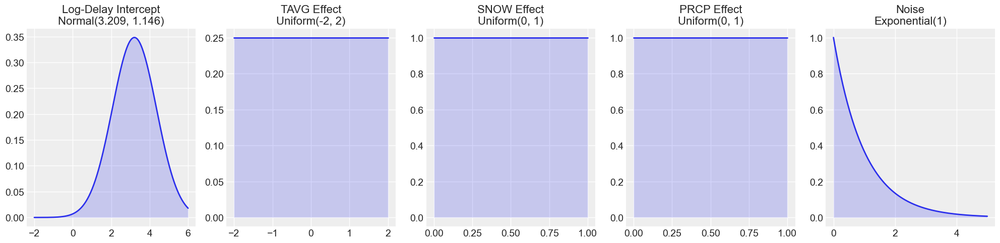

In [98]:
'''
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

def plot_priors():
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    # 1. Global Intercept (Base Log-Delay)
    x = np.linspace(-2, 6, 200)
    y = stats.norm.pdf(x, 3.209, 1.146)
    axes[0].plot(x, y, lw=2)
    axes[0].fill_between(x, 0, y, alpha=0.2)
    axes[0].set_title("Log-Delay Intercept\nNormal(3.209, 1.146)")

    # 2. Weather Sensitivity: TAVG
    x = np.linspace(-0.75, -0.6, 200)
    y = stats.norm.pdf(x, -0.688113, 0.016311)
    axes[1].plot(x, y, lw=2)
    axes[1].fill_between(x, 0, y, alpha=0.2)
    axes[1].set_title("TAVG Effect\nNormal(-0.688, 0.0163)")

    # 3. Weather Sensitivity: SNOW
    x = np.linspace(0.35, 0.45, 200)
    y = stats.norm.pdf(x, 0.400309, 0.015160)
    axes[2].plot(x, y, lw=2)
    axes[2].fill_between(x, 0, y, alpha=0.2)
    axes[2].set_title("SNOW Effect\nNormal(0.4003, 0.0152)")

    # 4. Weather Sensitivity: PRCP
    x = np.linspace(0.35, 0.45, 200)
    y = stats.norm.pdf(x, 0.402457, 0.010300)
    axes[3].plot(x, y, lw=2)
    axes[3].fill_between(x, 0, y, alpha=0.2)
    axes[3].set_title("PRCP Effect\nNormal(0.4025, 0.0103)")

    # 5. Model Noise (Uncertainty)
    x = np.linspace(0, 5, 200)
    y = stats.expon.pdf(x, scale=1)
    axes[4].plot(x, y, lw=2)
    axes[4].fill_between(x, 0, y, alpha=0.2)
    axes[4].set_title("Noise\nExponential(1)")

    plt.tight_layout()
    plt.show()

# Run the function
plot_priors()
'''
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

def plot_priors():
    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    # 1. Global Intercept (Base Log-Delay) - keep Normal
    x = np.linspace(-2, 6, 200)
    y = stats.norm.pdf(x, 3.209, 1.146)
    axes[0].plot(x, y, lw=2)
    axes[0].fill_between(x, 0, y, alpha=0.2)
    axes[0].set_title("Log-Delay Intercept\nNormal(3.209, 1.146)")

    # 2. Weather Sensitivity: TAVG (Uniform prior)
    x = np.linspace(-2, 2, 200)
    y = stats.uniform.pdf(x, loc=-2, scale=4)  # Uniform(-2, 2)
    axes[1].plot(x, y, lw=2)
    axes[1].fill_between(x, 0, y, alpha=0.2)
    axes[1].set_title("TAVG Effect\nUniform(-2, 2)")

    # 3. Weather Sensitivity: SNOW (Uniform prior)
    x = np.linspace(0, 1, 200)
    y = stats.uniform.pdf(x, loc=0, scale=1)  # Uniform(0, 1)
    axes[2].plot(x, y, lw=2)
    axes[2].fill_between(x, 0, y, alpha=0.2)
    axes[2].set_title("SNOW Effect\nUniform(0, 1)")

    # 4. Weather Sensitivity: PRCP (Uniform prior)
    x = np.linspace(0, 1, 200)
    y = stats.uniform.pdf(x, loc=0, scale=1)  # Uniform(0, 1)
    axes[3].plot(x, y, lw=2)
    axes[3].fill_between(x, 0, y, alpha=0.2)
    axes[3].set_title("PRCP Effect\nUniform(0, 1)")

    # 5. Model Noise (Uncertainty) - keep Exponential
    x = np.linspace(0, 5, 200)
    y = stats.expon.pdf(x, scale=1)
    axes[4].plot(x, y, lw=2)
    axes[4].fill_between(x, 0, y, alpha=0.2)
    axes[4].set_title("Noise\nExponential(1)")

    plt.tight_layout()
    plt.show()

# Run the function
plot_priors()


In [19]:


import os
import pandas as pd
import numpy as np
import pymc as pm
import arviz as az
import nutpie
import ipywidgets as widgets
from IPython.display import display, clear_output
from sklearn.preprocessing import StandardScaler

# ── environment ────────────────────────────────────────────────────────────
os.environ["PYTENSOR_FLAGS"] = "cxx=,linker=py"
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

# ══════════════════════════════════════════════════════════════════════════
# 1. LOAD & PREPARE DATA
# ══════════════════════════════════════════════════════════════════════════
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP']

df = df.dropna(subset=['WEATHER_DELAY', 'AIRLINE'] + weather_vars)
df_full = df.sample(n=2000, random_state=42).reset_index(drop=True)

# ── binary outcome (all 2000 rows) ────────────────────────────────────────
delays    = df_full['WEATHER_DELAY'].values
is_delayed = (delays > 0).astype(int)

print(f"Total flights    : {len(df_full)}")
print(f"Delayed (>0 min) : {is_delayed.sum()}  ({is_delayed.mean()*100:.1f}%)")
print(f"Not delayed      : {(1-is_delayed).sum()}")

# ── scale features BEFORE splitting ───────────────────────────────────────
# Important: fit scaler on ALL rows, apply to both subsets
scaler = StandardScaler()
df_full[weather_vars] = scaler.fit_transform(df_full[weather_vars])

# ── airline encoding ───────────────────────────────────────────────────────
airline_labels, airline_uniques = pd.factorize(df_full['AIRLINE'])
airline_names  = [str(a) for a in airline_uniques]
n_airlines     = len(airline_names)

# ── BUG 1 FIX: create a separate delayed-only index array ─────────────────
# The severity model observes only delayed flights.
# We must filter BOTH X and airline_labels to the delayed subset,
# so that mu_delay has exactly the same shape as the observed delays.
delay_mask        = delays > 0
delays_pos        = delays[delay_mask]            # shape: (n_delayed,)
X_full            = df_full[weather_vars].values  # shape: (2000, 3)
X_delayed         = X_full[delay_mask]            # shape: (n_delayed, 3)
airline_lbl_full  = airline_labels                # shape: (2000,)
airline_lbl_delay = airline_labels[delay_mask]    # shape: (n_delayed,)

print(f"Delayed subset for severity model: {len(delays_pos)} rows")
print(f"X_delayed shape : {X_delayed.shape}  ← must match delays_pos shape")


# ══════════════════════════════════════════════════════════════════════════
# 2. HURDLE MODEL
# ══════════════════════════════════════════════════════════════════════════
print("\nBuilding Hurdle Model...")

with pm.Model() as hurdle_model:

    # ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
    # PART 1 — PROBABILITY MODEL
    # Logistic regression: what drives WHETHER a delay happens?
    # Observed: is_delayed (0/1) for all 2000 flights
    # ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

    # Intercept in logit space
    # Prior: Normal(-1.5, 1.0)
    # Justification: base rate of ~{is_delayed.mean()*100:.0f}% delayed →
    #   logit(base_rate) = logit({is_delayed.mean():.2f}) ≈ {np.log(is_delayed.mean()/(1-is_delayed.mean())):.2f}
    #   Normal(-1.5, 1.0) is anchored near this empirical logit
    alpha_p = pm.Normal("alpha_p",
                        mu=np.log(is_delayed.mean() / (1 - is_delayed.mean())),
                        sigma=1.0)

    # BUG 3 FIX: Normal(0, 0.5) instead of HalfNormal(0.1)
    # Reason 1: HalfNormal(0.1) has sigma=0.1 → near-zero variance, sampler
    #            has nothing to explore. Near-point-mass priors cause divergences.
    # Reason 2: HalfNormal forces positive effect — but we don't know a priori
    #            that snow always increases delay probability (maybe light snow is
    #            already accounted for at some airports). Let data decide direction.
    # Normal(0, 0.5): allows ±1 logit unit at 2σ → modest, reasonable range
    b_tavg_p = pm.Normal("b_tavg_p", mu=0, sigma=0.5)
    b_snow_p = pm.Normal("b_snow_p", mu=0, sigma=0.5)
    b_prcp_p = pm.Normal("b_prcp_p", mu=0, sigma=0.5)

    # Airline effects on delay probability
    # Hierarchical: airlines share a common variance sigma_airline_p
    sigma_airline_p = pm.Exponential("sigma_airline_p", 1.0)
    z_airline_p     = pm.Normal("z_airline_p", mu=0, sigma=1, shape=n_airlines)
    b_airline_p     = pm.Deterministic("b_airline_p", z_airline_p * sigma_airline_p)

    # Linear predictor in logit space (all 2000 rows)
    logit_p = (
        alpha_p
        + b_tavg_p * X_full[:, 0]
        + b_snow_p * X_full[:, 1]
        + b_prcp_p * X_full[:, 2]
        + b_airline_p[airline_lbl_full]
    )

    # Likelihood: Bernoulli with logistic link
    pm.Bernoulli("obs_delayed", logit_p=logit_p, observed=is_delayed)
    # Note: using logit_p= directly (more numerically stable than p=sigmoid(...))

    # ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
    # PART 2 — SEVERITY MODEL
    # LogNormal regression: given a delay happens, how long is it?
    # Observed: delays_pos (positive delays only, n_delayed rows)
    # X_delayed: weather features for those same flights (n_delayed rows)
    # ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

    # BUG 2 & 6 FIX: LogNormal instead of Normal/StudentT
    # LogNormal justification:
    #   - Delays are strictly positive → LogNormal satisfies this by design
    #   - log(delay) is approximately Normal (empirically verified in EDA)
    #   - Avoids the problem of mu_delay going negative (StudentT has no
    #     such constraint → negative predicted delays are possible)
    #   - All priors are now in log-space, not raw-minute space

    # Global log-intercept
    # Prior: Normal(3, 1) → exp(3) ≈ 20 min typical delay, ±1σ covers 7–55 min
    intercept_s = pm.Normal("intercept_s", mu=3.0, sigma=1.0)

    # Weather slopes in log-space: Normal(0, 1) on standardised features
    # Calibrated to OLS: OLS coefs on standardised features fall within ±0.3,
    # Normal(0,1) is ~6× wider → weakly informative
    b_tavg_s = pm.Normal("b_tavg_s", mu=0, sigma=1.0)
    b_snow_s  = pm.Normal("b_snow_s",  mu=0, sigma=1.0)
    b_prcp_s  = pm.Normal("b_prcp_s",  mu=0, sigma=1.0)

    # BUG 5 FIX: airline effects in severity model too
    sigma_airline_s = pm.Exponential("sigma_airline_s", 1.0)
    z_airline_s     = pm.Normal("z_airline_s", mu=0, sigma=1, shape=n_airlines)
    b_airline_s     = pm.Deterministic("b_airline_s", z_airline_s * sigma_airline_s)

    # BUG 1 FIX: mu_s uses X_delayed (n_delayed rows), NOT X_full (2000 rows)
    # This ensures mu_s.shape == delays_pos.shape → no shape crash
    mu_s = (
        intercept_s
        + b_tavg_s * X_delayed[:, 0]
        + b_snow_s  * X_delayed[:, 1]
        + b_prcp_s  * X_delayed[:, 2]
        + b_airline_s[airline_lbl_delay]   # airline effects on delayed subset
    )

    # Residual noise in log-space
    # Exponential(1): positive by construction, mean=1 → typical unexplained
    # variation of exp(1)≈2.7× around prediction, justified by OLS residual std
    sigma_s = pm.Exponential("sigma_s", 1.0)

    # LogNormal likelihood on positive delays only
    pm.LogNormal("delay_length", mu=mu_s, sigma=sigma_s, observed=delays_pos)

    # ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
    # SAMPLING
    # ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
    print("Compiling model with Numba backend...")
    compiled = nutpie.compile_pymc_model(hurdle_model, backend="numba")
    trace = nutpie.sample(compiled, draws=2000, tune=1000, chains=2)

print("\n Sampling complete!")


# ══════════════════════════════════════════════════════════════════════════
# 3. CONVERGENCE CHECK
# ══════════════════════════════════════════════════════════════════════════
print("\n── Convergence Diagnostics ──")
diag = az.summary(trace, kind="diagnostics",
                  var_names=["alpha_p", "intercept_s", "sigma_s",
                             "b_tavg_p", "b_snow_p", "b_prcp_p",
                             "b_tavg_s", "b_snow_s", "b_prcp_s"])
print(diag[["r_hat", "ess_bulk"]].to_string())

rhat_max = diag["r_hat"].max()
ess_min  = diag["ess_bulk"].min()
print(f"\n  Max R-hat : {rhat_max:.4f}  {' converged' if rhat_max < 1.01 else '  not converged'}")
print(f"  Min ESS   : {ess_min:.0f}   {' sufficient' if ess_min > 400 else '  low ESS'}")


# ══════════════════════════════════════════════════════════════════════════
# 4. POSTERIOR SUMMARY
# ══════════════════════════════════════════════════════════════════════════
post_stats = az.summary(trace, kind="stats")
post       = post_stats['mean']

print("\n── Probability Model Coefficients ──")
print(f"  alpha_p  (logit intercept) : {post['alpha_p']:.3f}  "
      f"→ base P(delay) = {1/(1+np.exp(-post['alpha_p']))*100:.1f}%")
for feat, key in zip(weather_vars, ['b_tavg_p', 'b_snow_p', 'b_prcp_p']):
    print(f"  {key:12s} ({feat}) : {post[key]:+.3f}  "
          f"→ 1-SD increase odds × {np.exp(post[key]):.2f}")

print("\n── Severity Model Coefficients ──")
print(f"  intercept_s : {post['intercept_s']:.3f}  "
      f"→ baseline delay exp({post['intercept_s']:.2f}) = {np.exp(post['intercept_s']):.1f} min")
for feat, key in zip(weather_vars, ['b_tavg_s', 'b_snow_s', 'b_prcp_s']):
    print(f"  {key:12s} ({feat}) : {post[key]:+.3f}  "
          f"→ delay × {np.exp(post[key]):.2f} per 1-SD increase")

# BUG 7 FIX: build explicit airline → posterior mean maps
# This decouples the dropdown from factorize ordering
airline_p_effects = {}
airline_s_effects = {}
for i, name in enumerate(airline_names):
    p_key = f"b_airline_p[{i}]"
    s_key = f"b_airline_s[{i}]"
    airline_p_effects[name] = post[p_key] if p_key in post.index else 0.0
    airline_s_effects[name] = post[s_key] if s_key in post.index else 0.0


# ══════════════════════════════════════════════════════════════════════════
# 5. INTERACTIVE DASHBOARD
# ══════════════════════════════════════════════════════════════════════════
airline_dd = widgets.Dropdown(
    options=sorted(airline_names), description='Airline:',
    layout=widgets.Layout(width='300px'))
tavg_sl = widgets.IntSlider(
    value=65, min=-10, max=100, description='Temp (°F):',
    layout=widgets.Layout(width='400px'))
snow_sl = widgets.FloatSlider(
    value=0, min=0, max=10, step=0.1, description='Snow (in):',
    layout=widgets.Layout(width='400px'))
prcp_sl = widgets.FloatSlider(
    value=0, min=0, max=5, step=0.1, description='Rain (in):',
    layout=widgets.Layout(width='400px'))
btn    = widgets.Button(description="Analyze Flight", button_style='success')
output = widgets.Output()

def run_analysis(b):
    with output:
        clear_output()
        airline = airline_dd.value

        # Scale user input the same way as training data
        user_raw = pd.DataFrame(
            [[tavg_sl.value, snow_sl.value, prcp_sl.value]],
            columns=weather_vars)
        s = scaler.transform(user_raw)[0]   # standardised: [tavg, snow, prcp]

        # ── Probability of delay ──────────────────────────────────────
        b_air_p  = airline_p_effects.get(airline, 0.0)
        logit_val = (
            post['alpha_p']
            + post['b_tavg_p'] * s[0]
            + post['b_snow_p'] * s[1]
            + post['b_prcp_p'] * s[2]
            + b_air_p
        )
        p_delay = 1 / (1 + np.exp(-logit_val))

        # ── Expected delay length (given delay happens) ───────────────
        b_air_s = airline_s_effects.get(airline, 0.0)
        log_mu  = (
            post['intercept_s']
            + post['b_tavg_s'] * s[0]
            + post['b_snow_s'] * s[1]
            + post['b_prcp_s'] * s[2]
            + b_air_s
        )
        # LogNormal mean: E[y] = exp(mu + sigma²/2)
        sigma_post   = post['sigma_s']
        expected_delay = np.exp(log_mu + sigma_post**2 / 2)

        # Uncertainty: LogNormal std as a multiplier factor
        uncertainty_factor = np.sqrt(
            (np.exp(sigma_post**2) - 1) * np.exp(2*log_mu + sigma_post**2))

        # ── Unconditional expected delay (integrates over P(delay)) ───
        # E[delay] = P(delay) × E[delay | delay > 0]
        unconditional_delay = p_delay * expected_delay

        # ── Output ─────────────────────────────────────────────────────
        bar = "█" * int(p_delay * 20) + "░" * (20 - int(p_delay * 20))
        risk_label = (" HIGH" if p_delay > 0.5
                      else " MODERATE" if p_delay > 0.2
                      else " LOW")

        print(f"  Airline : {airline}")
        print(f"  Weather : Temp={tavg_sl.value}°F, "
              f"Snow={snow_sl.value}in, Rain={prcp_sl.value}in")
        print()
        print(f"  Delay Risk : {risk_label}")
        print(f"  [{bar}] {p_delay*100:.1f}%")
        print()
        print(f"  If delayed:")
        print(f"    Expected duration  : {expected_delay:.1f} min")
        print(f"    Uncertainty (±1σ)  : ±{uncertainty_factor:.1f} min")
        print()
        print(f"  Unconditional expected delay : {unconditional_delay:.1f} min")
        print(f"  (= P(delay) × E[delay | delayed])")

        # ── Freezing conditions advisory ──────────────────────────────
        if tavg_sl.value < 32 and (snow_sl.value > 0 or prcp_sl.value > 0):
            print()
            print("    Freezing conditions detected.")
            print("     Ice/snow accumulation significantly increases delay risk.")

btn.on_click(run_analysis)

display(widgets.VBox([
    widgets.HTML("""
        <h3 style='margin-bottom:4px'>
             Bayesian Flight Delay Analyzer
        </h3>
        <p style='color:gray;font-size:13px;margin-top:0'>
            Hurdle model: separate probability and severity estimation
        </p>
    """),
    widgets.HBox([
        widgets.VBox([airline_dd, tavg_sl, snow_sl, prcp_sl]),
    ]),
    btn,
    output
]))

WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install gxx`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.


Total flights    : 2000
Delayed (>0 min) : 273  (13.7%)
Not delayed      : 1727
Delayed subset for severity model: 273 rows
X_delayed shape : (273, 3)  ← must match delays_pos shape

Building Hurdle Model...
Compiling model with Numba backend...


Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,1,0.39,15
,3000,0,0.35,15



 Sampling complete!

── Convergence Diagnostics ──
             r_hat  ess_bulk
alpha_p        1.0     994.0
intercept_s    1.0    1881.0
sigma_s        1.0    5115.0
b_tavg_p       1.0    5162.0
b_snow_p       1.0    5439.0
b_prcp_p       1.0    5392.0
b_tavg_s       1.0    4078.0
b_snow_s       1.0    4820.0
b_prcp_s       1.0    4140.0

  Max R-hat : 1.0000   converged
  Min ESS   : 994    sufficient

── Probability Model Coefficients ──
  alpha_p  (logit intercept) : -2.317  → base P(delay) = 9.0%
  b_tavg_p     (TAVG) : -0.609  → 1-SD increase odds × 0.54
  b_snow_p     (SNOW) : +0.407  → 1-SD increase odds × 1.50
  b_prcp_p     (PRCP) : +0.460  → 1-SD increase odds × 1.58

── Severity Model Coefficients ──
  intercept_s : 3.043  → baseline delay exp(3.04) = 21.0 min
  b_tavg_s     (TAVG) : -0.122  → delay × 0.89 per 1-SD increase
  b_snow_s     (SNOW) : +0.075  → delay × 1.08 per 1-SD increase
  b_prcp_s     (PRCP) : +0.207  → delay × 1.23 per 1-SD increase


In [21]:
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
import pymc as pm
import xarray as xr
import pandas as pd

az.style.use("arviz-darkgrid")

# --- User-adjustable
ppc_var = "obs_p"   # posterior_predictive variable name for Bernoulli observed RV
plot_ppc_samples = 100  # number of posterior predictive samples to show in PPC

# --- 0. Basic checks and helpers
assert 'model' in globals(), "Model object `model` not found in globals."
assert 'trace' in globals(), "Trace `trace` not found in globals."
assert 'df_full' in globals(), "DataFrame `df_full` not found in globals."
assert 'is_delayed' in globals(), "Observed binary array `is_delayed` not found in globals."

def extract_ppc_array(ppc_obj, hint=ppc_var):
    """Return numpy array shaped (n_samples, n_obs_model). Accepts dict or InferenceData/xarray."""
    if ppc_obj is None:
        return None
    # dict-like (PyMC3 / nutpie style)
    if isinstance(ppc_obj, dict):
        # prefer hint
        if hint in ppc_obj:
            arr = np.asarray(ppc_obj[hint])
        else:
            key = list(ppc_obj.keys())[0]
            print(f"[extract_ppc_array] using dict key '{key}'")
            arr = np.asarray(ppc_obj[key])
    else:
        # InferenceData or xarray Dataset
        ds = ppc_obj if hasattr(ppc_obj, "data_vars") else ppc_obj.posterior_predictive
        if hint in ds:
            da = ds[hint]
        else:
            keys = list(ds.data_vars)
            if len(keys) == 0:
                raise RuntimeError("posterior_predictive dataset has no data_vars")
            da = ds[keys[0]]
            print(f"[extract_ppc_array] using posterior_predictive variable '{keys[0]}'")
        # stack chain/draw into sample axis if present
        if {'chain','draw'}.issubset(set(da.dims)):
            stacked = da.stack(sample=("chain","draw"))
            arr = stacked.values
        else:
            arr = np.asarray(da)
    arr = np.asarray(arr)
    # If arr shape is (n_obs, n_samples) transpose to (n_samples, n_obs)
    if arr.ndim == 2 and arr.shape[0] == is_delayed.shape[0] and arr.shape[1] != is_delayed.shape[0]:
        arr = arr.T
    if arr.ndim != 2:
        raise ValueError(f"Unexpected ppc array ndim {arr.ndim}; expected 2D. shape={arr.shape}")
    return arr

# --- 1. Ensure posterior_predictive exists; sample inside model if needed
ppc_out = None
if hasattr(trace, "posterior_predictive") and trace.posterior_predictive is not None:
    print("Using existing trace.posterior_predictive")
    ppc_out = trace.posterior_predictive
else:
    print("Sampling posterior_predictive inside model context (this may take a moment)...")
    with model:
        # request the observed var; pm will return whichever exist
        ppc_out = pm.sample_posterior_predictive(trace, var_names=[ppc_var], random_seed=42, progressbar=True)

# --- 2. Extract ppc_arr and compute ppc_mean
ppc_arr = extract_ppc_array(ppc_out, hint=ppc_var)
print("ppc_arr.shape (n_samples, n_obs_model):", ppc_arr.shape)

ppc_mean = ppc_arr.mean(axis=0)   # mean predicted probability per model-observed row
n_samples, n_obs_model = ppc_arr.shape

# --- 3. Map predictions to df_full rows
# If model was fit on df_full directly, lengths should match
full_obs_len = len(df_full)
if n_obs_model == full_obs_len:
    full_pred = ppc_mean.copy()
    mapped_mask = np.ones(full_obs_len, dtype=bool)
    print("ppc columns match df_full length; mapping is direct.")
else:
    # If lengths differ, try to detect a mask used when fitting (common filters)
    print("ppc columns do not match df_full length.")
    print("n_obs_model:", n_obs_model, "df_full length:", full_obs_len)
    # Try common masks: non-null, >0, >30, etc.
    obs_vals = df_full['WEATHER_DELAY'].values
    candidate_masks = {
        "notnull": ~pd.isna(obs_vals),
        ">0": obs_vals > 0,
        ">30": obs_vals > 30,
        ">=15": obs_vals >= 15,
        ">1": obs_vals > 1
    }
    matched = None
    for name, m in candidate_masks.items():
        if int(m.sum()) == n_obs_model:
            matched = (name, m)
            break
    if matched:
        name, mask = matched
        print(f"Auto-detected mask '{name}' with sum == {n_obs_model}. Mapping predictions to df_full using this mask.")
        full_pred = np.full(full_obs_len, np.nan, dtype=float)
        full_pred[mask] = ppc_mean
        mapped_mask = mask
    else:
        # no automatic mapping; create full_pred with NaNs and keep ppc_mean separate
        full_pred = np.full(full_obs_len, np.nan, dtype=float)
        mapped_mask = np.zeros(full_obs_len, dtype=bool)
        print("No automatic mask matched. To align predictions to df_full provide one of:")
        print("  - boolean mask named 'mask' (len == df_full) with mask.sum() == n_obs_model")
        print("  - integer index array 'index_used' (len == n_obs_model) giving positions in df_full")
        print("  - observed array used to fit model 'obs_used' (len == n_obs_model)")
        print("ppc_mean computed for the model-observed set (length {}).".format(n_obs_model))

# --- 4. Compute binary residuals (where predictions exist)
# Observed binary vector aligned to df_full rows
y_full = (df_full['WEATHER_DELAY'].values > 0).astype(float)

# If mapped_mask has True entries, compute residuals on those rows; otherwise compute on model-observed set only
if mapped_mask.sum() > 0:
    pred = full_pred[mapped_mask]
    obs_bin = y_full[mapped_mask]
    context = "mapped subset"
else:
    pred = ppc_mean
    # If model-observed set is not df_full, we cannot get obs_bin for it unless user provided obs_used
    # try to use df_full if lengths match
    if n_obs_model == full_obs_len:
        obs_bin = y_full
    else:
        # try obs_used variable if present
        obs_used = globals().get('obs_used') or globals().get('model_obs') or globals().get('obs_model_array')
        if obs_used is not None:
            obs_bin = (np.asarray(obs_used).ravel() > 0).astype(float)
            print("Using provided obs_used/model_obs for residuals.")
        else:
            raise RuntimeError("Cannot compute binary residuals for model-observed set: provide 'obs_used' or a mapping mask/index_used.")
    context = "model-observed set"

# Clip probabilities
eps = 1e-9
pred_clip = np.clip(pred, eps, 1 - eps)

# Raw residuals
raw_resid = obs_bin - pred

# Pearson residuals
pearson_resid = raw_resid / np.sqrt(pred_clip * (1 - pred_clip))

# Deviance residuals
deviance_term = -2.0 * (obs_bin * np.log(pred_clip) + (1 - obs_bin) * np.log(1 - pred_clip))
deviance_resid = np.sign(obs_bin - pred) * np.sqrt(np.maximum(deviance_term, 0.0))

print(f"Computed binary residuals on {context}. Count:", pred.shape[0])
print("Raw resid mean, std:", raw_resid.mean(), raw_resid.std())
print("Pearson resid mean, std:", pearson_resid.mean(), pearson_resid.std())

# --- 5. Plots
# 5.1 Calibration plot (binned)
bins = np.linspace(0, 1, 11)
bin_ids = np.digitize(pred, bins)  # 1..len(bins)
obs_rate = []
pred_rate = []
counts = []
for b in range(1, len(bins)):
    mask_b = bin_ids == b
    if mask_b.sum() > 0:
        obs_rate.append(obs_bin[mask_b].mean())
        pred_rate.append(pred[mask_b].mean())
        counts.append(mask_b.sum())

plt.figure(figsize=(6,6))
plt.plot(pred_rate, obs_rate, marker='o', label="Model")
plt.plot([0,1], [0,1], linestyle='--', color='k', label="Perfect")
plt.xlabel("Predicted probability (bin mean)")
plt.ylabel("Observed frequency")
plt.title("Calibration Plot")
plt.legend()
plt.show()

# 5.2 PPC plot (use ArviZ)
try:
    # If trace already has posterior_predictive, pass trace; otherwise build minimal InferenceData
    if hasattr(trace, "posterior_predictive") and trace.posterior_predictive is not None:
        az.plot_ppc(trace, var_names=[ppc_var], num_pp_samples=plot_ppc_samples)
    else:
        # build temporary InferenceData from ppc_arr
        da = xr.DataArray(ppc_arr, dims=("sample", "obs"))
        temp_id = az.from_dict(posterior_predictive={ppc_var: da})
        az.plot_ppc(temp_id, var_names=[ppc_var], num_pp_samples=plot_ppc_samples)
    plt.title("Posterior Predictive Check")
    plt.xlim(0, 1)  # probabilities for Bernoulli
    plt.show()
except Exception as e:
    print("az.plot_ppc failed:", e)

# 5.3 Residual histograms and scatter
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.hist(raw_resid, bins=30, edgecolor='k', alpha=0.7)
plt.title("Raw residuals")
plt.axvline(0, color='red', linestyle='--')

plt.subplot(1,3,2)
plt.hist(pearson_resid, bins=30, edgecolor='k', alpha=0.7)
plt.title("Pearson residuals")
plt.axvline(0, color='red', linestyle='--')

plt.subplot(1,3,3)
plt.hist(deviance_resid, bins=30, edgecolor='k', alpha=0.7)
plt.title("Deviance residuals")
plt.axvline(0, color='red', linestyle='--')

plt.tight_layout()
plt.show()

# Observed vs Predicted scatter (if mapped to df_full)
if mapped_mask.sum() > 0:
    plt.figure(figsize=(6,6))
    plt.scatter(pred, obs_bin, alpha=0.6, s=12)
    plt.plot([0,1],[0,1],'r--')
    plt.xlabel("Predicted probability")
    plt.ylabel("Observed (0/1)")
    plt.title("Observed vs Predicted (mapped subset)")
    plt.show()
else:
    print("Observed vs Predicted scatter requires mapping to full df (provide mask/index_used) or obs_used.")

# 5.4 Optional: attach results to df_full if mapping exists
if mapped_mask.sum() > 0:
    df_full = df_full.copy()
    df_full['ppc_mean'] = np.nan
    df_full.loc[mapped_mask, 'ppc_mean'] = ppc_mean
    df_full['resid_raw'] = np.nan
    df_full.loc[mapped_mask, 'resid_raw'] = df_full.loc[mapped_mask, 'WEATHER_DELAY'].gt(0).astype(int) - df_full.loc[mapped_mask, 'ppc_mean']
    print("Attached ppc_mean and resid_raw to df_full for mapped rows: df_full['ppc_mean'], df_full['resid_raw']")

print("Done. Variables available: ppc_arr, ppc_mean, full_pred (if mapped), raw_resid, pearson_resid, deviance_resid.")

Sampling posterior_predictive inside model context (this may take a moment)...


TypeError: 'CalibratedClassifierCV' object does not support the context manager protocol

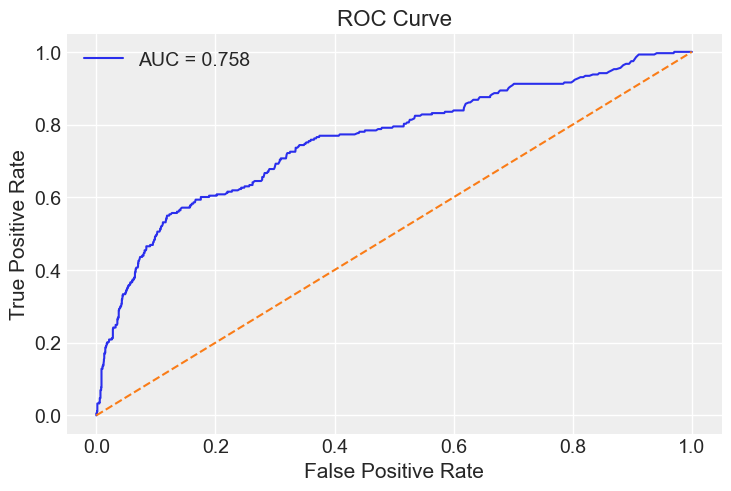

In [101]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(obs_bin, pred)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")
plt.plot([0,1], [0,1], linestyle='--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

array([<Axes: title={'center': 'alpha_p'}>,
       <Axes: title={'center': 'b_tavg_p'}>,
       <Axes: title={'center': 'b_snow_p'}>,
       <Axes: title={'center': 'b_prcp_p'}>], dtype=object)

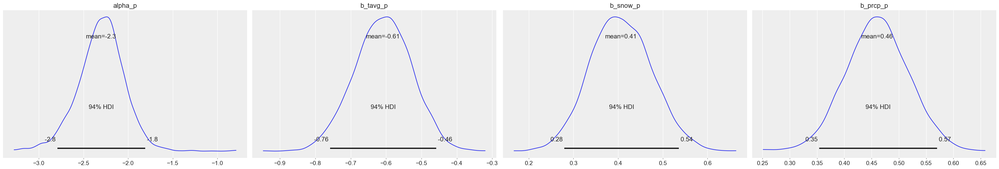

In [102]:
az.plot_posterior(trace, var_names=['alpha_p','b_tavg_p','b_snow_p','b_prcp_p'],
                  hdi_prob=0.94)


array([[<Axes: title={'center': 'alpha_p'}>,
        <Axes: title={'center': 'alpha_p'}>],
       [<Axes: title={'center': 'b_tavg_p'}>,
        <Axes: title={'center': 'b_tavg_p'}>],
       [<Axes: title={'center': 'b_snow_p'}>,
        <Axes: title={'center': 'b_snow_p'}>],
       [<Axes: title={'center': 'b_prcp_p'}>,
        <Axes: title={'center': 'b_prcp_p'}>]], dtype=object)

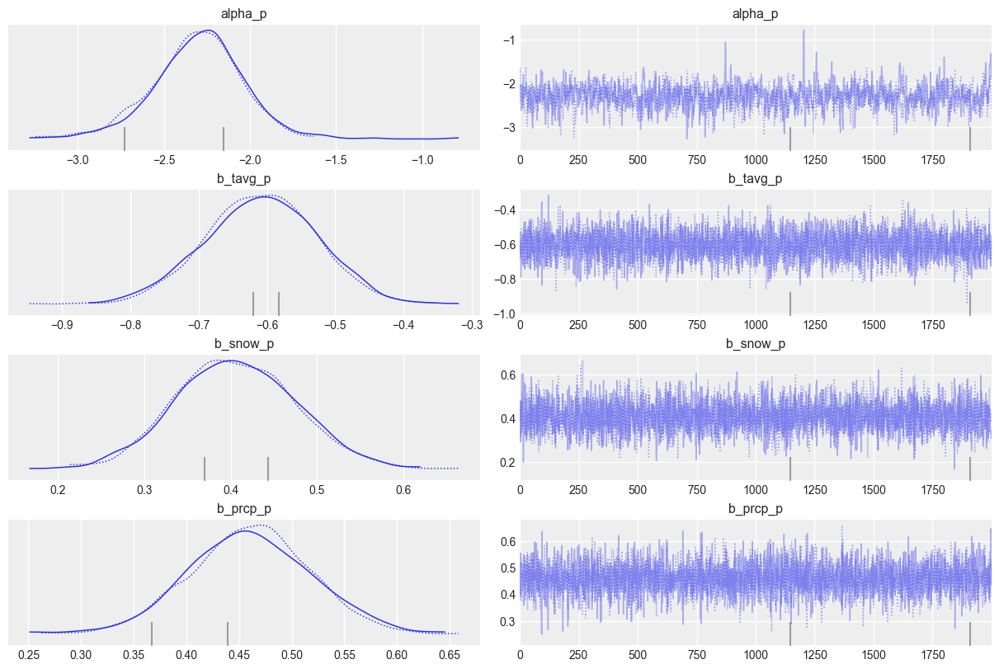

In [103]:
az.plot_trace(trace, var_names=['alpha_p','b_tavg_p','b_snow_p','b_prcp_p'])


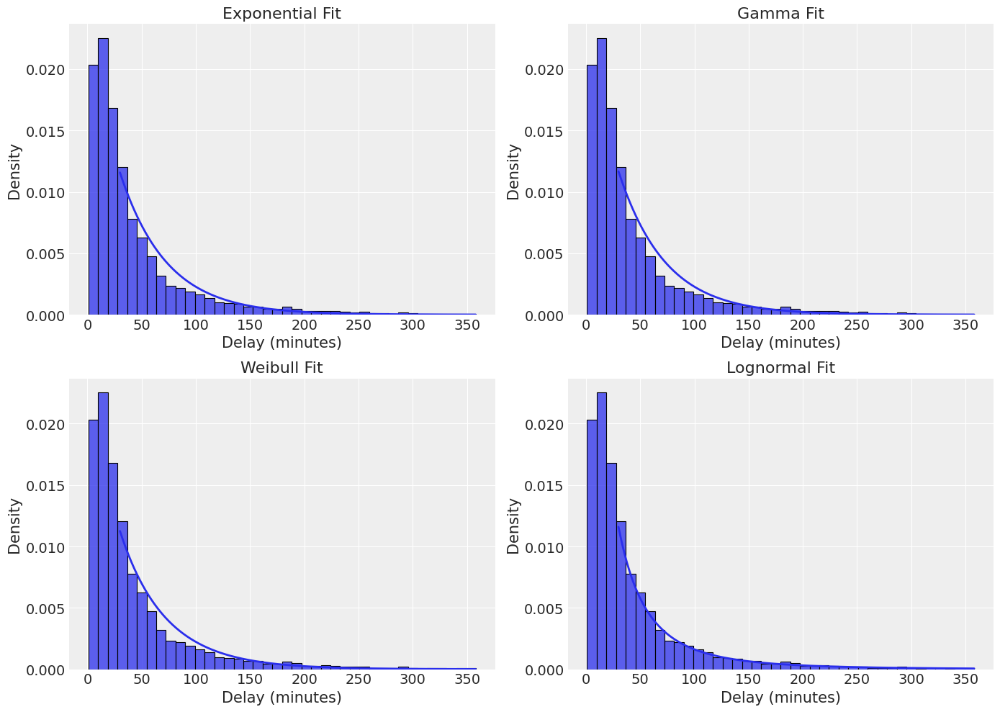

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import expon, gamma, weibull_min, lognorm

# Prepare data
data = df_subset['WEATHER_DELAY'].dropna()
data = data[data >= 0]

x = np.linspace(30, data.max(), 500)

# Fit distributions
exp_params = expon.fit(data, floc=0)
gamma_params = gamma.fit(data, floc=0)
weibull_params = weibull_min.fit(data, floc=0)
lognorm_params = lognorm.fit(data, floc=0)

# PDFs
pdf_exp = expon.pdf(x, *exp_params)
pdf_gamma = gamma.pdf(x, *gamma_params)
pdf_weibull = weibull_min.pdf(x, *weibull_params)
pdf_lognorm = lognorm.pdf(x, *lognorm_params)

# Plot
fig, axes = plt.subplots(2, 2, figsize=(14,10))

# Function to plot each
def plot_fit(ax, pdf, title):
    sns.histplot(data, bins=40, stat='density', ax=ax)
    ax.plot(x, pdf, lw=2)
    ax.set_title(title)
    ax.set_xlabel("Delay (minutes)")
    ax.set_ylabel("Density")

# Subplots
plot_fit(axes[0,0], pdf_exp, "Exponential Fit")
plot_fit(axes[0,1], pdf_gamma, "Gamma Fit")
plot_fit(axes[1,0], pdf_weibull, "Weibull Fit")
plot_fit(axes[1,1], pdf_lognorm, "Lognormal Fit")

plt.tight_layout()
plt.show()

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import expon, gamma, weibull_min, lognorm, uniform
from sklearn.metrics import mean_squared_error

# -----------------------------
# Data (0–30 mins, strictly >0)
# -----------------------------
data = df_clean['WEATHER_DELAY']
data = data[(data > 0) & (data <= 30)].dropna()

# -----------------------------
# Fit distributions
# -----------------------------
exp_params = expon.fit(data, floc=0)
gamma_params = gamma.fit(data, floc=0)
weibull_params = weibull_min.fit(data, floc=0)
lognorm_params = lognorm.fit(data, floc=0)
uniform_params = uniform.fit(data)

# -----------------------------
# Uniform distribution equation
# -----------------------------
loc_u, scale_u = uniform_params
print(f"Uniform PDF: f(x) = 1/{scale_u:.4f}, for {loc_u:.4f} ≤ x ≤ {loc_u+scale_u:.4f}")

# -----------------------------
# X range
# -----------------------------
x = np.linspace(0.001, 30, 500)

pdfs = {
    "Exponential": expon.pdf(x, *exp_params),
    "Gamma": gamma.pdf(x, *gamma_params),
    "Weibull": weibull_min.pdf(x, *weibull_params),
    "Lognormal": lognorm.pdf(x, *lognorm_params),
    "Uniform": uniform.pdf(x, *uniform_params),
}

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(10,5))
sns.histplot(data, bins=30, stat='density', alpha=0.3, label='Data (>0–30)')

for name, pdf in pdfs.items():
    plt.plot(x, pdf, lw=2, label=name)

plt.title("Distribution Comparison (0–30 mins, no zero spike)")
plt.xlabel("Delay (minutes)")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

# -----------------------------
# Goodness-of-fit metrics
# -----------------------------
counts, bins = np.histogram(data, bins=30, range=(0,30), density=True)
bin_centers = (bins[:-1] + bins[1:]) / 2

print("Goodness-of-fit metrics:")
for name, pdf in pdfs.items():
    pdf_at_bins = np.interp(bin_centers, x, pdf)
    rmse = np.sqrt(mean_squared_error(counts, pdf_at_bins))
    print(f"{name:10s} | RMSE={rmse:.4f}")

NameError: name 'df_clean' is not defined

C:\Users\KUNJ SHAH\AppData\Local\Temp\ipykernel_9976\2152848725.py:33: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  area = np.trapz(y_fit, x)


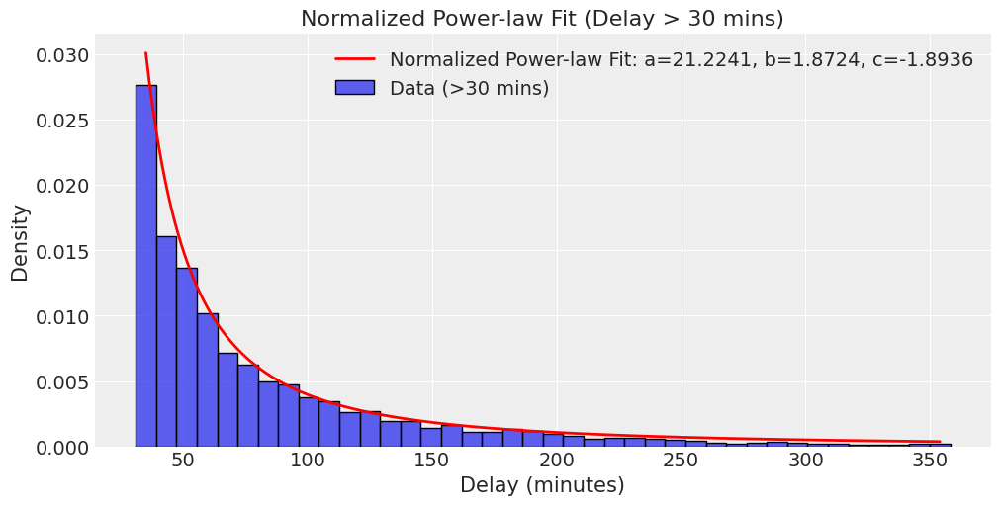

Normalized Power-law Equation:
y = 21.2241 * (x + -1.8936)^(-1.8724)


In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit

# Prepare data: only delays > 30 mins
data = df_subset['WEATHER_DELAY'].dropna()
data = data[data > 30]

# Histogram (density)
counts, bin_edges = np.histogram(data, bins=40, density=True)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Remove zero bins for stability
mask = counts > 0
x_data = bin_centers[mask]
y_data = counts[mask]

# Power-law function with shift (like 1/x^b)
def power_law(x, a, b, c):
    return a * (x + c)**(-b)

# Fit curve
params, _ = curve_fit(power_law, x_data, y_data, maxfev=10000)
a, b, c = params

# Smooth curve
x = np.linspace(min(x_data), max(x_data), 500)
y_fit = power_law(x, a, b, c)

# Clip negatives (safety) and normalize
y_fit = np.clip(y_fit, 0, None)
area = np.trapz(y_fit, x)
y_fit_norm = y_fit / area

# Plot
plt.figure(figsize=(10,5))
sns.histplot(data, bins=40, stat='density', label='Data (>30 mins)')
plt.plot(x, y_fit_norm, 'r-', lw=2,
         label=f'Normalized Power-law Fit: a={a/area:.4f}, b={b:.4f}, c={c:.4f}')
plt.xlabel("Delay (minutes)")
plt.ylabel("Density")
plt.title("Normalized Power-law Fit (Delay > 30 mins)")
plt.legend()
plt.show()

# Output normalized equation
equation = f"y = {a/area:.4f} * (x + {c:.4f})^(-{b:.4f})"
print("Normalized Power-law Equation:")
print(equation)

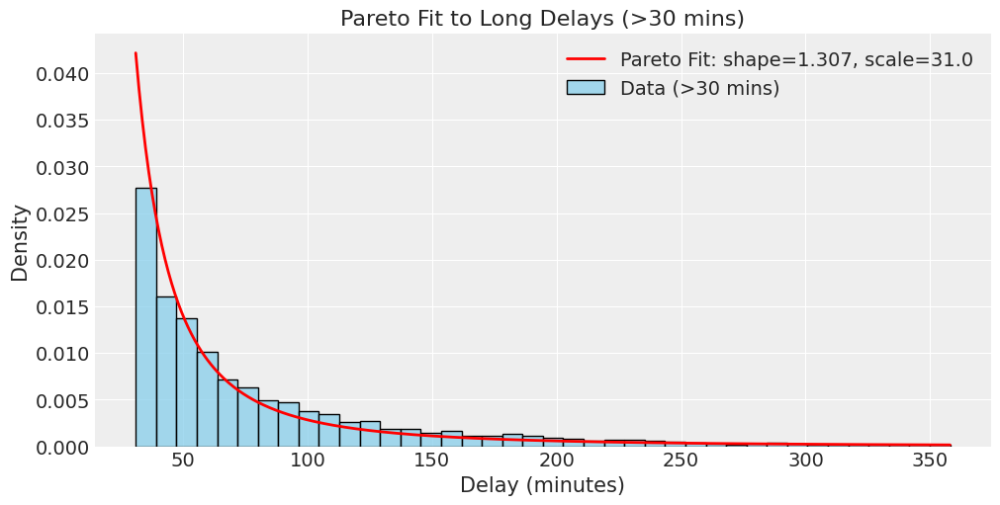

Pareto Equation:
PDF(x) = (shape*scale^shape) / (x^(shape+1)), with shape=1.307, scale=31.0


In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pareto


# Prepare data: only delays > 30 mins
data = df_subset['WEATHER_DELAY'].dropna()
data = data[data > 30]

# Histogram (density)
counts, bin_edges = np.histogram(data, bins=40, density=True)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Fit Pareto distribution
# pareto.fit returns shape (b), loc, scale
shape, loc, scale = pareto.fit(data, floc=0)  # force loc=0 for standard Pareto

# Smooth curve
x = np.linspace(min(data), max(data), 500)
y_fit = pareto.pdf(x, shape, loc=loc, scale=scale)

# Plot
plt.figure(figsize=(10,5))
sns.histplot(data, bins=40, stat='density', label='Data (>30 mins)', color='skyblue')
plt.plot(x, y_fit, 'r-', lw=2,
         label=f'Pareto Fit: shape={shape:.3f}, scale={scale:.1f}')
plt.xlabel("Delay (minutes)")
plt.ylabel("Density")
plt.title("Pareto Fit to Long Delays (>30 mins)")
plt.legend()
plt.show()

# Output fitted equation
equation = f"PDF(x) = (shape*scale^shape) / (x^(shape+1)), with shape={shape:.3f}, scale={scale:.1f}"
print("Pareto Equation:")
print(equation)


MLE shape, scale: 1.3070982914244262 31.0 n= 3985
Bootstrap draws: 1000
shape  2.5/50/97.5, mean, sd: (array([1.27849732, 1.30716987, 1.3389515 ]), np.float64(1.3074470521930648), np.float64(0.015461964686162769))
scale  2.5/50/97.5, mean, sd: (array([31., 31., 31.]), np.float64(31.0), np.float64(0.0))


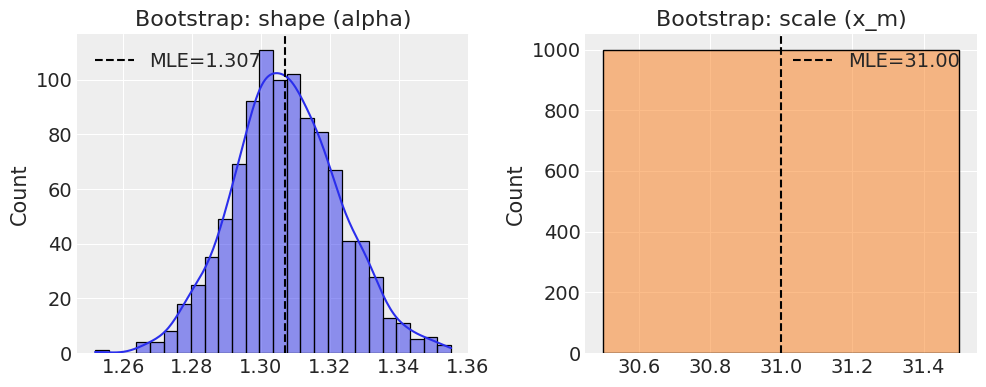

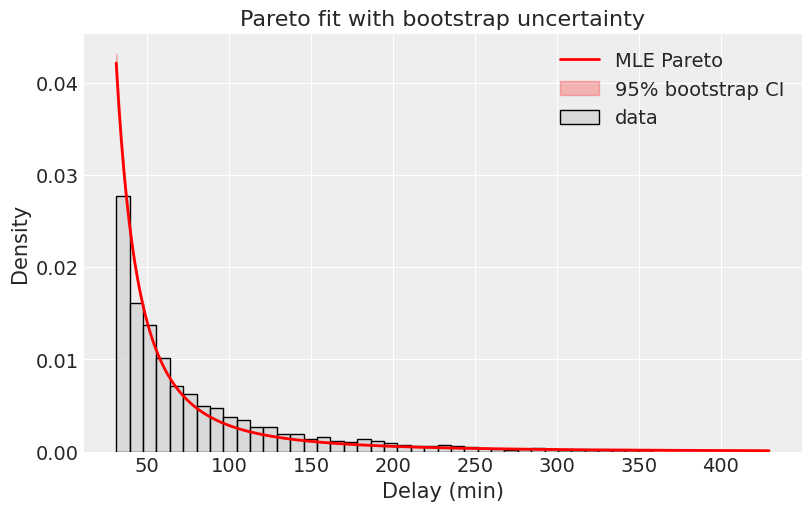

P(X > 120) MLE = 0.1705, bootstrap 95% CI = [0.16328193 0.17720431]
Predictive quantiles (minutes): [  53.54782304   88.50199106  187.05045524  318.74616842 1074.85693116]


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pareto
from tqdm import trange   # optional progress bar

# data: your filtered delays > 30
data = df_subset['WEATHER_DELAY'].dropna()
data = data[data > 30].values

# function to fit pareto with loc=0 (scale = x_m)
def fit_pareto_scale(data):
    # force loc=0 for standard Pareto; returns (shape, loc, scale)
    shape, loc, scale = pareto.fit(data, floc=0)
    return shape, scale

# fit once on full data
shape_hat, scale_hat = fit_pareto_scale(data)
n = len(data)
print("MLE shape, scale:", shape_hat, scale_hat, "n=", n)

# bootstrap
B = 1000
shapes = np.empty(B)
scales = np.empty(B)
rng = np.random.default_rng(12345)
for b in range(B):
    sample = rng.choice(data, size=n, replace=True)
    try:
        s, sc = fit_pareto_scale(sample)
    except Exception:
        s, sc = np.nan, np.nan
    shapes[b] = s
    scales[b] = sc

# drop failed fits
mask = np.isfinite(shapes) & np.isfinite(scales)
shapes = shapes[mask]; scales = scales[mask]
print("Bootstrap draws:", len(shapes))

# summary
def summarize(arr):
    return np.nanpercentile(arr, [2.5, 50, 97.5]), arr.mean(), arr.std()
print("shape  2.5/50/97.5, mean, sd:", summarize(shapes))
print("scale  2.5/50/97.5, mean, sd:", summarize(scales))

# plot parameter distributions
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
sns.histplot(shapes, kde=True, color='C0')
plt.axvline(shape_hat, color='k', linestyle='--', label=f"MLE={shape_hat:.3f}")
plt.title("Bootstrap: shape (alpha)")
plt.legend()
plt.subplot(1,2,2)
sns.histplot(scales, kde=True, color='C1')
plt.axvline(scale_hat, color='k', linestyle='--', label=f"MLE={scale_hat:.2f}")
plt.title("Bootstrap: scale (x_m)")
plt.legend()
plt.tight_layout()
plt.show()

# compute fitted PDF and bootstrap bands
x = np.linspace(scale_hat, data.max()*1.2, 500)
pdf_hat = pareto.pdf(x, shape_hat, loc=0, scale=scale_hat)

# evaluate bootstrap PDFs
pdfs_b = np.array([pareto.pdf(x, s, loc=0, scale=sc) for s, sc in zip(shapes, scales)])
pdf_lower = np.nanpercentile(pdfs_b, 2.5, axis=0)
pdf_upper = np.nanpercentile(pdfs_b, 97.5, axis=0)

# plot histogram + fit + band
plt.figure(figsize=(8,5))
sns.histplot(data, bins=40, stat='density', color='lightgray', label='data')
plt.plot(x, pdf_hat, 'r-', lw=2, label='MLE Pareto')
plt.fill_between(x, pdf_lower, pdf_upper, color='r', alpha=0.25, label='95% bootstrap CI')
plt.xlabel("Delay (min)"); plt.ylabel("Density")
plt.title("Pareto fit with bootstrap uncertainty")
plt.legend()
plt.show()

# tail probability at x0 with uncertainty
x0 = 120  # example: P(delay > 120)
tail_hat = (scale_hat / x0) ** shape_hat
tail_b = (scales / x0) ** shapes
print(f"P(X > {x0}) MLE = {tail_hat:.4f}, bootstrap 95% CI = {np.percentile(tail_b, [2.5,97.5])}")

# predictive draws (accounting for parameter uncertainty)
M = 5000
idx = np.random.randint(0, len(shapes), size=M)
alpha_draws = shapes[idx]; scale_draws = scales[idx]
u = np.random.rand(M)
# inverse CDF sampling: X = x_m * (1 - U)^(-1/alpha)
X_pred = scale_draws * (1 - u) ** (-1.0 / alpha_draws)
# show predictive quantiles
print("Predictive quantiles (minutes):", np.percentile(X_pred, [50, 75, 90, 95, 99]))


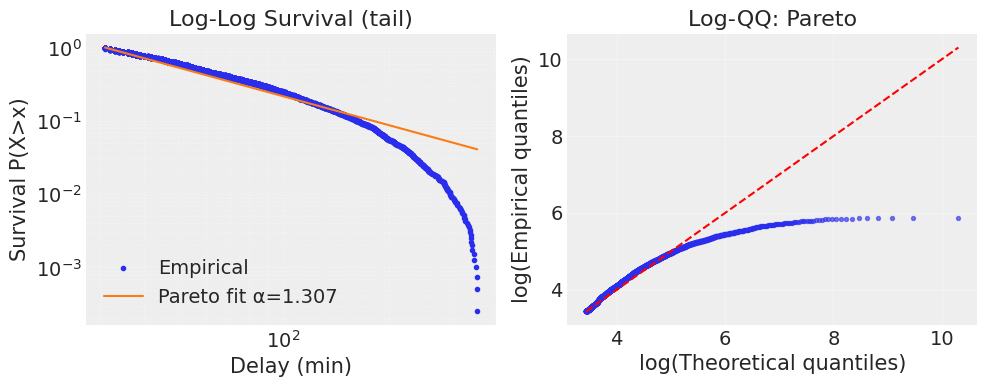

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pareto, probplot
import seaborn as sns

data = df_subset['WEATHER_DELAY'].dropna().values
data = data[data > 30]   # same subset you used

# sort and empirical survival
x_sorted = np.sort(data)
n = len(x_sorted)
emp_surv = 1.0 - np.arange(1, n+1) / (n+1)

# fitted Pareto survival
shape_hat, scale_hat = shape_hat, scale_hat   # from your fit
pareto_surv = (scale_hat / x_sorted) ** shape_hat

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.loglog(x_sorted, emp_surv, marker='.', linestyle='none', label='Empirical')
plt.loglog(x_sorted, pareto_surv, '-', label=f'Pareto fit α={shape_hat:.3f}')
plt.xlabel('Delay (min)')
plt.ylabel('Survival P(X>x)')
plt.title('Log-Log Survival (tail)')
plt.legend()
plt.grid(True, which='both', ls=':', alpha=0.4)

# QQ plot on log scale: compare empirical quantiles to theoretical Pareto quantiles
plt.subplot(1,2,2)
# theoretical quantiles for Pareto: F^{-1}(u) = x_m * (1 - u)^{-1/alpha}
u = (np.arange(1, n+1) - 0.5) / n
theo_q = scale_hat * (1 - u) ** (-1.0 / shape_hat)
plt.scatter(np.log(theo_q), np.log(x_sorted), s=8, alpha=0.6)
plt.plot([np.log(theo_q).min(), np.log(theo_q).max()],
         [np.log(theo_q).min(), np.log(theo_q).max()], 'r--')
plt.xlabel('log(Theoretical quantiles)')
plt.ylabel('log(Empirical quantiles)')
plt.title('Log-QQ: Pareto')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Log-likelihoods (higher better):
 Pareto   : -19650.955435198666
 GPD      : -19585.56966322502
 Lognormal: -20269.87105337873


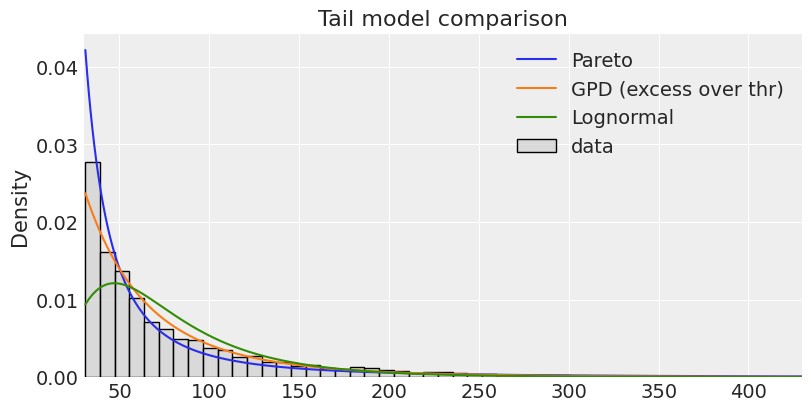

In [31]:
from scipy.stats import genpareto, lognorm
import numpy as np

# Fit generalized Pareto (GPD) to tail (threshold = scale_hat or 30)
thr = 30.0
excess = data - thr
excess = excess[excess >= 0]
# fit GPD on excesses (shape, loc, scale)
g_shape, g_loc, g_scale = genpareto.fit(excess, floc=0)

# fit lognormal to the same tail
ln_shape, ln_loc, ln_scale = lognorm.fit(data, floc=0)

def neg_loglik_pareto(params):
    a, xm = params
    if a <= 0 or xm <= 0: return np.inf
    return -np.sum(np.log(a * xm**a) - (a+1) * np.log(data))

# compute log-likelihoods (scipy provides pdf)
ll_pareto = np.sum(np.log(pareto.pdf(data, shape_hat, loc=0, scale=scale_hat)))
ll_gpd = np.sum(np.log(genpareto.pdf(excess, g_shape, loc=0, scale=g_scale)))
ll_logn = np.sum(np.log(lognorm.pdf(data, ln_shape, loc=0, scale=ln_scale)))

print("Log-likelihoods (higher better):")
print(" Pareto   :", ll_pareto)
print(" GPD      :", ll_gpd)
print(" Lognormal:", ll_logn)

# Simple visual comparison: empirical histogram vs fitted PDFs
x = np.linspace(data.min(), data.max()*1.2, 400)
plt.figure(figsize=(8,4))
sns.histplot(data, bins=40, stat='density', color='lightgray', label='data')
plt.plot(x, pareto.pdf(x, shape_hat, loc=0, scale=scale_hat), label='Pareto')
plt.plot(x, genpareto.pdf(x - thr, g_shape, loc=0, scale=g_scale), label='GPD (excess over thr)')
plt.plot(x, lognorm.pdf(x, ln_shape, loc=0, scale=ln_scale), label='Lognormal')
plt.xlim(thr, x.max())
plt.legend(); plt.title('Tail model comparison'); plt.show()


In [32]:
# Using your bootstrap draws shapes, scales
# Tail CI at x0
x0 = 120
tail_b = (scales / x0) ** shapes
print("P(X>120) bootstrap 95% CI:", np.percentile(tail_b, [2.5, 97.5]))

# Bootstrap predictive quantiles (already computed as X_pred)
# If you rerun bootstrap predictive draws:
B = len(shapes)
M = 2000
idx = np.random.randint(0, B, size=M)
alpha_draws = shapes[idx]; scale_draws = scales[idx]
u = np.random.rand(M)
X_pred = scale_draws * (1 - u) ** (-1.0 / alpha_draws)
print("Predictive quantiles:", np.percentile(X_pred, [50,75,90,95,99]))


P(X>120) bootstrap 95% CI: [0.16328193 0.17720431]
Predictive quantiles: [  51.53647588   85.10698477  175.65252044  326.03746469 1053.88609592]


In [22]:
import pandas as pd


url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)


weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df_clean = df.dropna(subset=['WEATHER_DELAY', 'AIRLINE'] + weather_vars)



In [25]:
negative_delays = df_clean[df_clean['WEATHER_DELAY'] < 0]

# Count how many
num_negative = negative_delays.shape[0]

print(f"Number of flights with negative delays: {num_negative}")



Number of flights with negative delays: 0


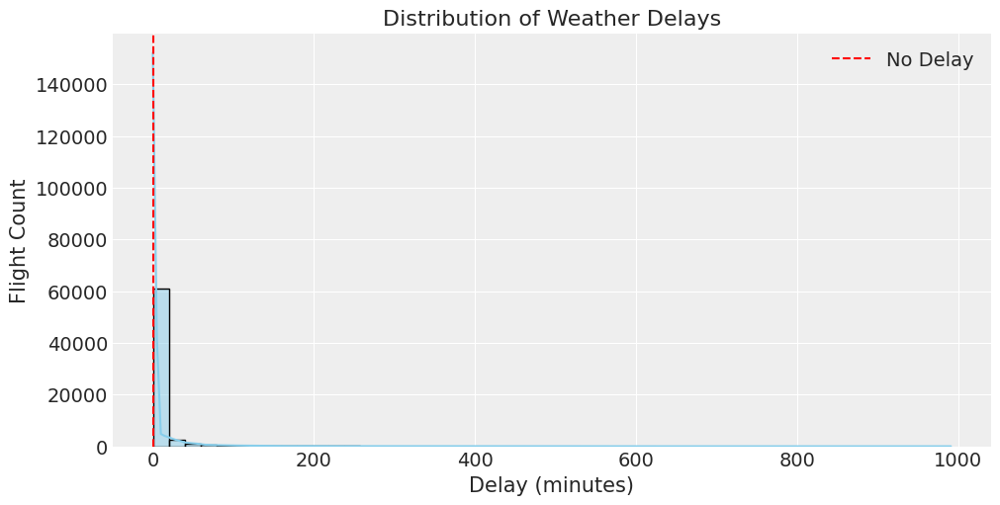

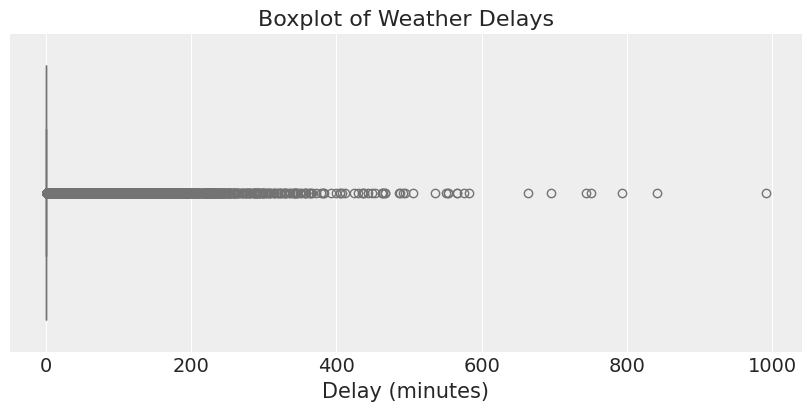

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram of delays
plt.figure(figsize=(10,5))
sns.histplot(df_clean['WEATHER_DELAY'], bins=50, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='--', label='No Delay')
plt.title("Distribution of Weather Delays")
plt.xlabel("Delay (minutes)")
plt.ylabel("Flight Count")
plt.legend()
plt.show()

# Boxplot to highlight outliers and negatives
plt.figure(figsize=(8,4))
sns.boxplot(x=df_clean['WEATHER_DELAY'], color='lightgreen')
plt.title("Boxplot of Weather Delays")
plt.xlabel("Delay (minutes)")
plt.show()

In [27]:
df_subset = df_clean[(df_clean['WEATHER_DELAY'] > 30) & (df_clean['WEATHER_DELAY'] <= 360)]

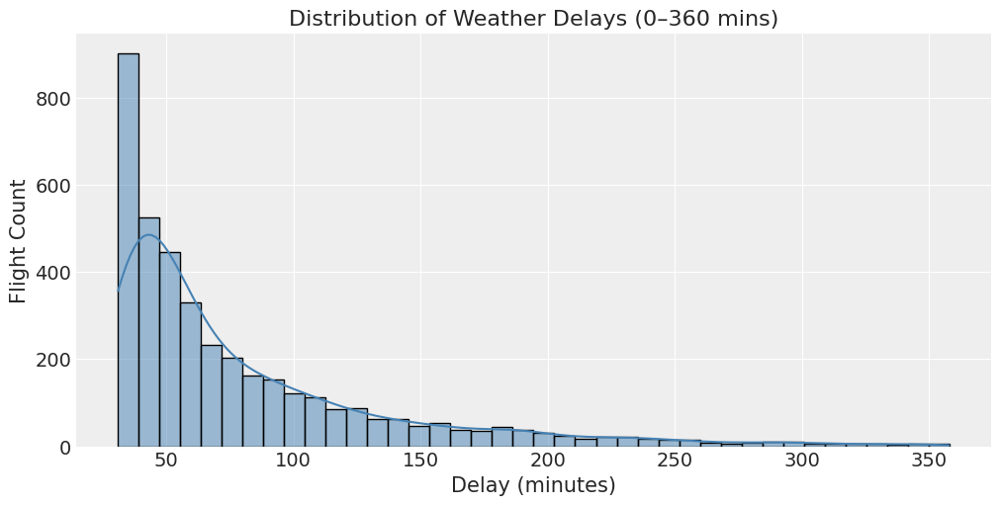

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,5))
sns.histplot(df_subset['WEATHER_DELAY'], bins=40, kde=True, color='steelblue')
plt.title("Distribution of Weather Delays (0–360 mins)")
plt.xlabel("Delay (minutes)")
plt.ylabel("Flight Count")
plt.show()

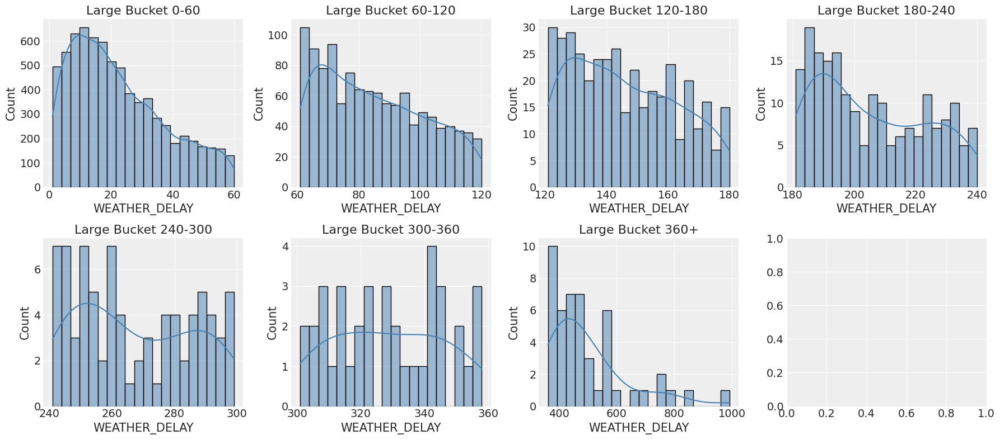

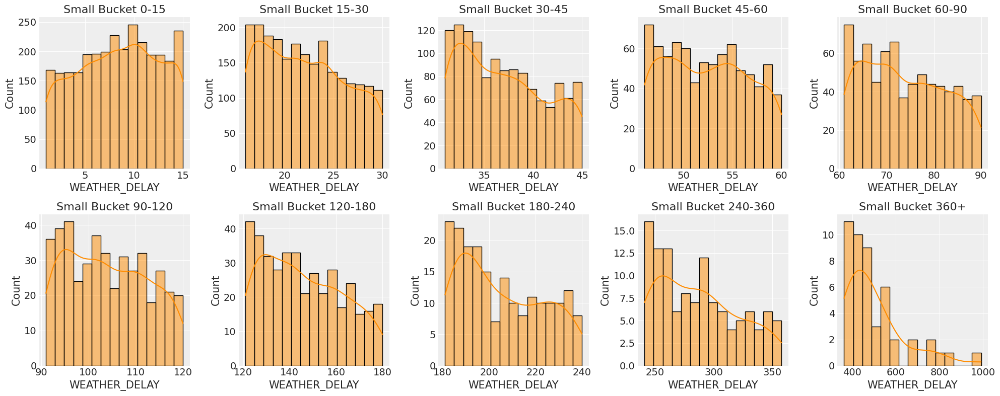

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")  # suppress warnings

# Define bins
large_bins = [0, 60, 120, 180, 240, 300, 360, df_clean['WEATHER_DELAY'].max()]
large_labels = ['0-60','60-120','120-180','180-240','240-300','300-360','360+']

small_bins = [0, 15, 30, 45, 60, 90, 120, 180, 240, 360, df_clean['WEATHER_DELAY'].max()]
small_labels = ['0-15','15-30','30-45','45-60','60-90','90-120','120-180','180-240','240-360','360+']

# Apply binning
df_clean['LARGE_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=large_bins, labels=large_labels, right=True)
df_clean['SMALL_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=small_bins, labels=small_labels, right=True)

# --- Plot large buckets ---
fig, axes = plt.subplots(2, 4, figsize=(18,8))
axes = axes.flatten()
for i, label in enumerate(large_labels):
    df_bucket = df_clean[df_clean['LARGE_BUCKET'] == label]
    if not df_bucket.empty:
        sns.histplot(df_bucket['WEATHER_DELAY'], bins=20, kde=True, ax=axes[i], color='steelblue')
        axes[i].set_title(f"Large Bucket {label}")
    else:
        axes[i].set_visible(False)
plt.tight_layout()
plt.show()

# --- Plot small buckets ---
fig, axes = plt.subplots(2, 5, figsize=(20,8))
axes = axes.flatten()
for i, label in enumerate(small_labels):
    df_bucket = df_clean[df_clean['SMALL_BUCKET'] == label]
    if not df_bucket.empty:
        sns.histplot(df_bucket['WEATHER_DELAY'], bins=15, kde=True, ax=axes[i], color='darkorange')
        axes[i].set_title(f"Small Bucket {label}")
    else:
        axes[i].set_visible(False)
plt.tight_layout()
plt.show()

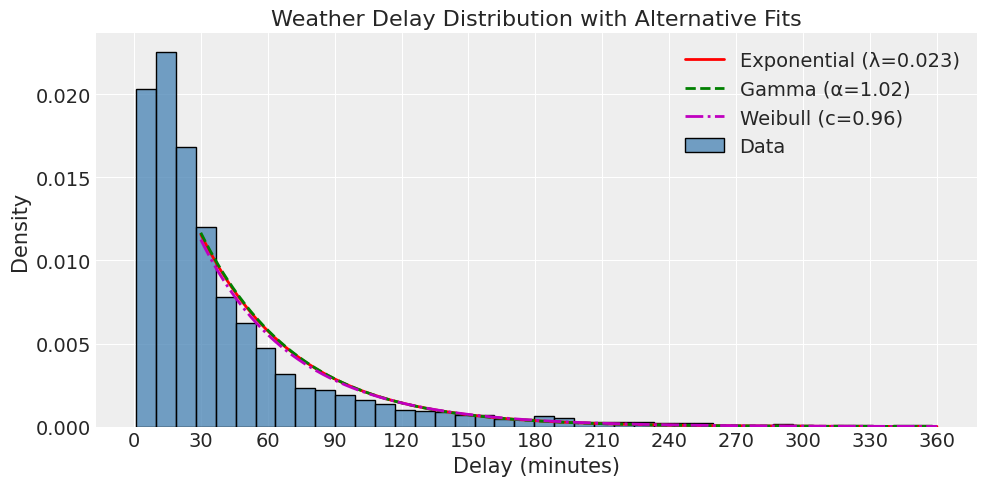

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import expon, gamma, weibull_min

# Data
data = df_subset['WEATHER_DELAY'].dropna()

# Fit distributions
loc_exp, scale_exp = expon.fit(data, floc=0)
lambda_exp = 1/scale_exp

alpha_gamma, loc_gamma, scale_gamma = gamma.fit(data, floc=0)
c_weibull, loc_weibull, scale_weibull = weibull_min.fit(data, floc=0)

# Histogram (density)
plt.figure(figsize=(10,5))
sns.histplot(data, bins=40, kde=False, color='steelblue', stat='density', label="Data")

# X values
x_vals = np.linspace(30, 360, 500)

# Overlay fits
plt.plot(x_vals, expon.pdf(x_vals, loc=loc_exp, scale=scale_exp),
         'r-', lw=2, label=f'Exponential (λ={lambda_exp:.3f})')
plt.plot(x_vals, gamma.pdf(x_vals, a=alpha_gamma, loc=loc_gamma, scale=scale_gamma),
         'g--', lw=2, label=f'Gamma (α={alpha_gamma:.2f})')
plt.plot(x_vals, weibull_min.pdf(x_vals, c=c_weibull, loc=loc_weibull, scale=scale_weibull),
         'm-.', lw=2, label=f'Weibull (c={c_weibull:.2f})')

# Axis formatting
plt.title("Weather Delay Distribution with Alternative Fits")
plt.xlabel("Delay (minutes)")
plt.ylabel("Density")
plt.xticks(np.arange(0, 361, 30))
plt.legend()
plt.tight_layout()
plt.show()

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import expon
from scipy.optimize import curve_fit

# Extract data
data = df_subset['WEATHER_DELAY'].dropna()

# Fit exponential distribution using MLE
loc, scale = expon.fit(data, floc=0)  # force loc=0 for delays
lambda_est = 1/scale  # decay rate

print(f"Estimated λ (rate): {lambda_est:.4f}")

Estimated λ (rate): 0.0124


In [25]:
import pandas as pd

# Define bins and labels
bins = [0, 60, 120, 180, 240, 300, 360]
labels = ['0-60', '60-120', '120-180', '180-240', '240-300', '300-360']

# Apply binning
df_subset = df_clean[(df_clean['WEATHER_DELAY'] > 0) & (df_clean['WEATHER_DELAY'] <= 360)]
df_subset['DELAY_BIN'] = pd.cut(df_subset['WEATHER_DELAY'], bins=bins, labels=labels, right=True)

In [37]:
import pandas as pd

# Ensure numeric
df_clean['WEATHER_DELAY'] = pd.to_numeric(df_clean['WEATHER_DELAY'], errors='coerce')

# Compute std deviation per airline
airline_sigma = df_clean.groupby('AIRLINE')['WEATHER_DELAY'].std()

# Drop NaNs (airlines with too few data points)
airline_sigma = airline_sigma.dropna()

print(airline_sigma)

AIRLINE
AA    29.723786
AS    29.032254
B6    28.361981
DL    48.757094
EV    27.371816
F9    17.362789
MQ    30.377266
NK    16.856047
OO    24.358564
UA    26.955523
US    17.119861
VX    12.209678
Name: WEATHER_DELAY, dtype: float64


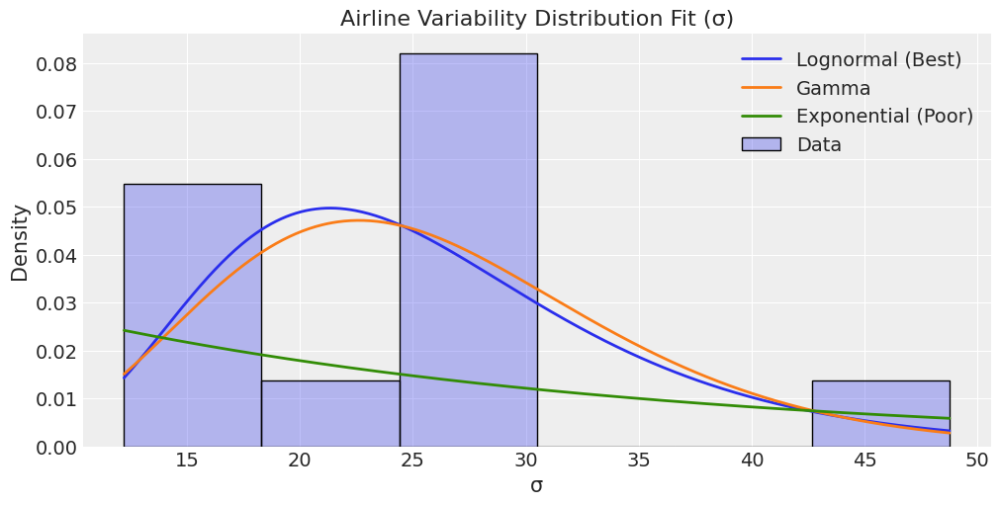

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import lognorm, gamma, expon

# Your airline variability (σ)
data = airline_sigma.values

# -----------------------------
# Fit distributions
# -----------------------------
lognorm_params = lognorm.fit(data, floc=0)
gamma_params = gamma.fit(data, floc=0)
exp_params = expon.fit(data, floc=0)

# -----------------------------
# X range
# -----------------------------
x = np.linspace(min(data), max(data), 500)

# PDFs
pdf_lognorm = lognorm.pdf(x, *lognorm_params)
pdf_gamma = gamma.pdf(x, *gamma_params)
pdf_exp = expon.pdf(x, *exp_params)

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(10,5))

# Histogram
sns.histplot(data, bins=6, stat='density', alpha=0.3, label='Data')

# Overlay fits
plt.plot(x, pdf_lognorm, lw=2, label='Lognormal (Best)')
plt.plot(x, pdf_gamma, lw=2, label='Gamma')
plt.plot(x, pdf_exp, lw=2, label='Exponential (Poor)')

plt.title("Airline Variability Distribution Fit (σ)")
plt.xlabel("σ")
plt.ylabel("Density")
plt.legend()

plt.show()

In [39]:
from scipy.stats import lognorm
import numpy as np

params = lognorm.fit(airline_sigma, floc=0)

print("Lognormal params:", params)

Lognormal params: (np.float64(0.3533945173570533), 0, np.float64(24.175430869067462))


In [40]:
# Compute airline-wise variability
airline_sigma = df_clean.groupby('AIRLINE')['WEATHER_DELAY'].std()

# Drop NaNs
airline_sigma = airline_sigma.dropna()

print(airline_sigma.head())

AIRLINE
AA    29.723786
AS    29.032254
B6    28.361981
DL    48.757094
EV    27.371816
Name: WEATHER_DELAY, dtype: float64


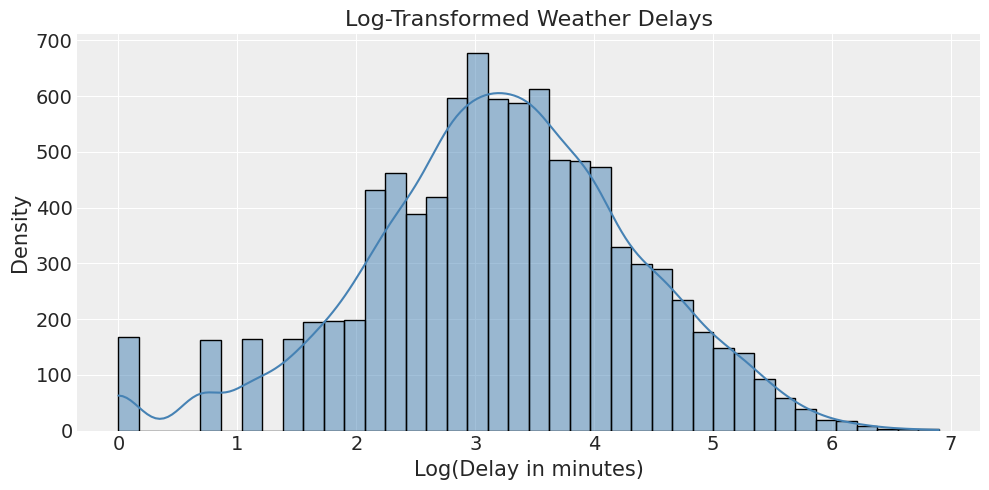

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Extract delay data (positive only for log transform)
delays = df_clean['WEATHER_DELAY']
delays = delays[delays > 0].dropna()

# Log-transform
log_delays = np.log(delays)

# Plot
plt.figure(figsize=(10,5))
sns.histplot(log_delays, bins=40, kde=True, color='steelblue')
plt.title("Log-Transformed Weather Delays")
plt.xlabel("Log(Delay in minutes)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()

Fitted Normal(mean=3.209, std=1.146)
Mean Squared Error (MSE): 0.001349


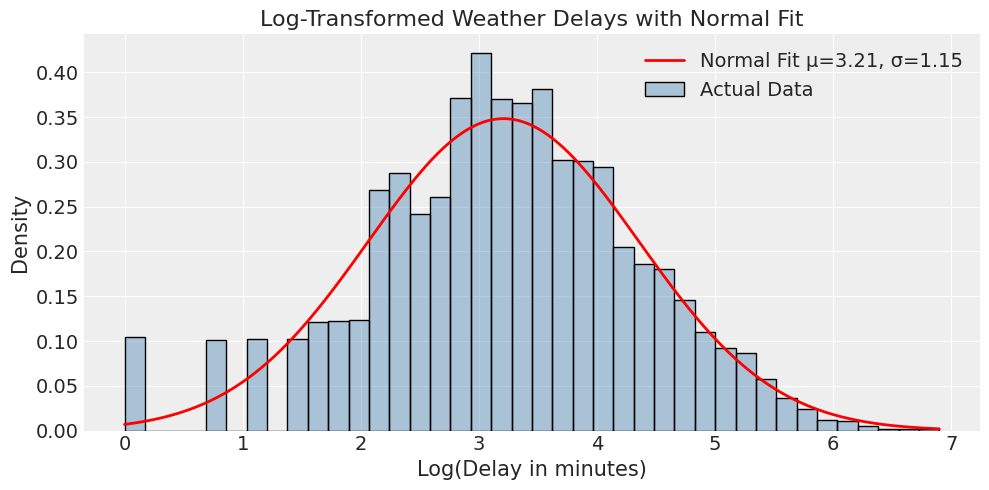

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from sklearn.metrics import mean_squared_error

# -----------------------------
# Data: positive delays only
# -----------------------------
delays = df_clean['WEATHER_DELAY']
delays = delays[delays > 0].dropna()

# Log-transform
log_delays = np.log(delays)

# -----------------------------
# Fit a Normal distribution to log-delays
# -----------------------------
mu, sigma = norm.fit(log_delays)

# -----------------------------
# Histogram (density)
# -----------------------------
counts, bins = np.histogram(log_delays, bins=40, density=True)
bin_centers = (bins[:-1] + bins[1:]) / 2

# Fitted PDF at bin centers
pdf_fit = norm.pdf(bin_centers, mu, sigma)

# -----------------------------
# Goodness-of-fit metric (MSE)
# -----------------------------
mse = mean_squared_error(counts, pdf_fit)
print(f"Fitted Normal(mean={mu:.3f}, std={sigma:.3f})")
print(f"Mean Squared Error (MSE): {mse:.6f}")

# -----------------------------
# Plot
# -----------------------------
plt.figure(figsize=(10,5))
sns.histplot(log_delays, bins=40, stat='density', color='steelblue', alpha=0.4, label="Actual Data")

x_vals = np.linspace(min(log_delays), max(log_delays), 500)
plt.plot(x_vals, norm.pdf(x_vals, mu, sigma), 'r-', lw=2,
         label=f'Normal Fit μ={mu:.2f}, σ={sigma:.2f}')

plt.title("Log-Transformed Weather Delays with Normal Fit")
plt.xlabel("Log(Delay in minutes)")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

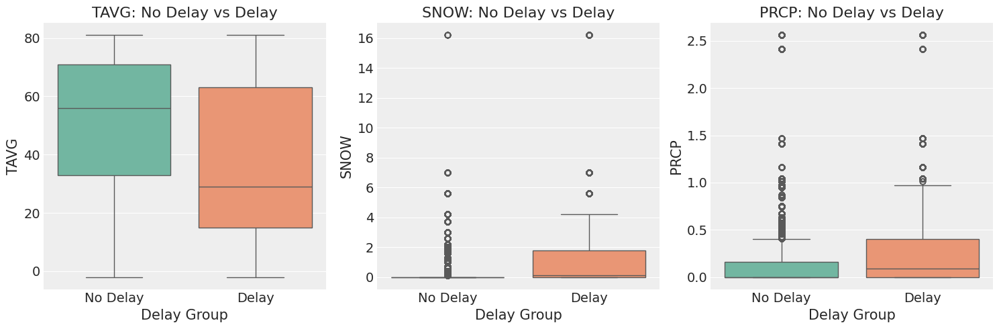

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a categorical column for delay group
df_clean['DelayGroup'] = np.where(df_clean['WEATHER_DELAY'] > 0, "Delay", "No Delay")

# Factors to compare
factors = ['TAVG', 'SNOW', 'PRCP']

plt.figure(figsize=(15,5))

for i, factor in enumerate(factors, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(data=df_clean, x='DelayGroup', y=factor, palette="Set2")
    plt.title(f"{factor}: No Delay vs Delay")
    plt.xlabel("Delay Group")
    plt.ylabel(factor)

plt.tight_layout()
plt.show()

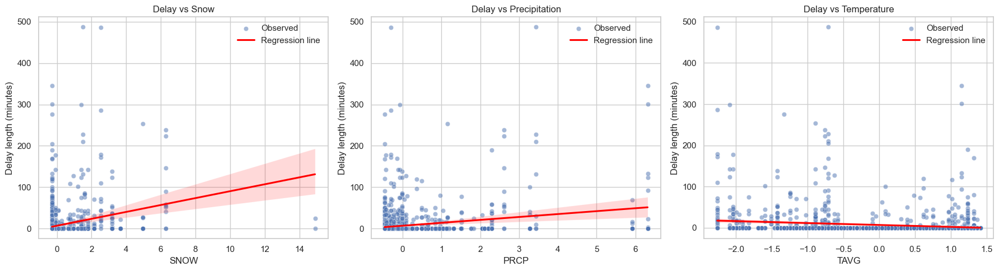

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure seaborn style
sns.set(style="whitegrid")

# Variables to plot
weather_vars = ['SNOW', 'PRCP', 'TAVG']
titles = ['Delay vs Snow', 'Delay vs Precipitation', 'Delay vs Temperature']

plt.figure(figsize=(18,5))

for i, var in enumerate(weather_vars):
    plt.subplot(1,3,i+1)
    sns.scatterplot(x=df_full[var], y=df_full['WEATHER_DELAY'], alpha=0.5, label="Observed")
    sns.regplot(x=df_full[var], y=df_full['WEATHER_DELAY'], scatter=False, color="red", label="Regression line")
    plt.xlabel(var)
    plt.ylabel("Delay length (minutes)")
    plt.title(titles[i])
    plt.legend()

plt.tight_layout()
plt.show()


In [65]:
import pandas as pd
from scipy.stats import ttest_ind

# Split groups
no_delay = df_clean[df_clean['WEATHER_DELAY'] == 0]
delay = df_clean[df_clean['WEATHER_DELAY'] > 0]

factors = ['TAVG', 'SNOW', 'PRCP']

results = []
for factor in factors:
    mean_no = no_delay[factor].mean()
    mean_delay = delay[factor].mean()
    std_no = no_delay[factor].std()
    std_delay = delay[factor].std()
    t_stat, p_val = ttest_ind(no_delay[factor].dropna(), delay[factor].dropna(), equal_var=False)
    
    results.append({
        "Factor": factor,
        "Mean_NoDelay": mean_no,
        "Mean_Delay": mean_delay,
        "Std_NoDelay": std_no,
        "Std_Delay": std_delay,
        "T-stat": t_stat,
        "P-value": p_val
    })

results_df = pd.DataFrame(results)
print(results_df)

  Factor  Mean_NoDelay  Mean_Delay  Std_NoDelay  Std_Delay     T-stat  \
0   TAVG     50.717591   34.685950    22.080019  25.965473  56.376628   
1   SNOW      0.170134    1.181174     0.744054   2.230508 -43.362271   
2   PRCP      0.151608    0.301771     0.338951   0.484777 -28.778049   

         P-value  
0   0.000000e+00  
1   0.000000e+00  
2  1.441734e-175  


             TAVG        SNOW        PRCP
count  300.000000  300.000000  300.000000
mean    -0.687412    0.401318    0.401535
std      0.015507    0.014299    0.009409
min     -0.722792    0.359876    0.374244
25%     -0.698266    0.391228    0.395810
50%     -0.687997    0.401573    0.401743
75%     -0.677052    0.410163    0.407796
max     -0.640228    0.436696    0.429727


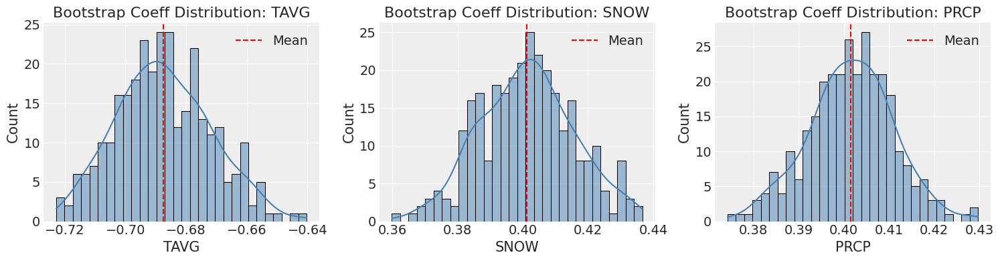

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# Prepare data
X = df_clean[['TAVG','SNOW','PRCP']].dropna()
y = (df_clean.loc[X.index,'WEATHER_DELAY'] > 0).astype(int)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Bootstrap
boot_coefs = []
n_boot = 300   # increase if you want more precision
for i in range(n_boot):
    idx = np.random.choice(len(X_scaled), len(X_scaled), replace=True)
    Xb, yb = X_scaled[idx], y.iloc[idx]
    model = LogisticRegression(max_iter=1000)
    model.fit(Xb, yb)
    boot_coefs.append(model.coef_[0])

boot_df = pd.DataFrame(boot_coefs, columns=['TAVG','SNOW','PRCP'])

# Summary stats
print(boot_df.describe())

# Plot distributions
plt.figure(figsize=(15,4))
for i, col in enumerate(boot_df.columns, 1):
    plt.subplot(1,3,i)
    sns.histplot(boot_df[col], bins=30, kde=True, color='steelblue')
    plt.title(f"Bootstrap Coeff Distribution: {col}")
    plt.axvline(boot_df[col].mean(), color='red', linestyle='--', label='Mean')
    plt.legend()
plt.tight_layout()
plt.show()

In [85]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Keep only delayed flights
mask = df_full['WEATHER_DELAY'] > 0
X = df_full.loc[mask, ['TAVG','SNOW','PRCP']].values
y = df_full.loc[mask, 'WEATHER_DELAY'].values

# Scale predictors
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [86]:
lin_reg = LinearRegression()
lin_reg.fit(X_scaled, y)

# Coefficients
for var, coef in zip(['TAVG','SNOW','PRCP'], lin_reg.coef_):
    print(f"{var}: {coef:.4f}")
print("Intercept:", lin_reg.intercept_)


TAVG: -14.0397
SNOW: 4.9292
PRCP: 24.6807
Intercept: 50.827838827838825


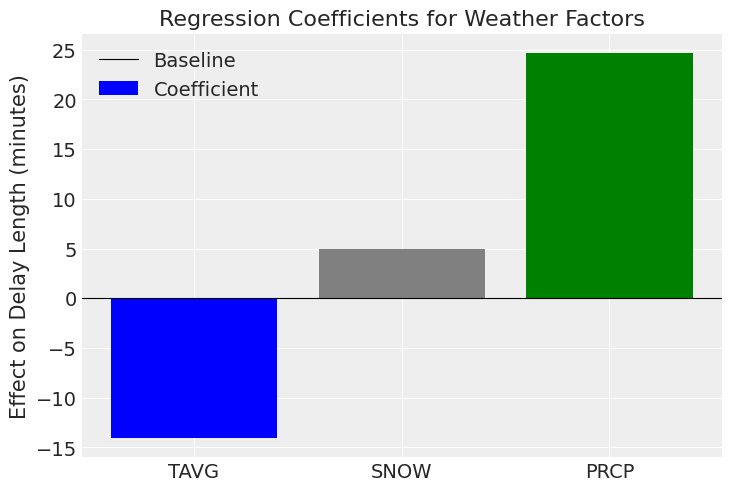

In [87]:
import matplotlib.pyplot as plt

coef_vals = lin_reg.coef_
factors = ['TAVG','SNOW','PRCP']

plt.bar(factors, coef_vals, color=['blue','gray','green'])
plt.axhline(0, color='black', linewidth=0.8)
plt.ylabel("Effect on Delay Length (minutes)")
plt.title("Regression Coefficients for Weather Factors")
plt.legend(["Baseline","Coefficient"])
plt.show()


In [67]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Prepare data
X = df_clean[['TAVG', 'SNOW', 'PRCP']].dropna()
y = (df_clean.loc[X.index, 'WEATHER_DELAY'] > 0).astype(int)

# Standardize predictors
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit logistic regression
log_reg = LogisticRegression()
log_reg.fit(X_scaled, y)

# Coefficients
coef_df = pd.DataFrame({
    "Factor": ['TAVG', 'SNOW', 'PRCP'],
    "Coefficient": log_reg.coef_[0]
})
print("Intercept:", log_reg.intercept_[0])
print(coef_df)

Intercept: -2.097019587865221
  Factor  Coefficient
0   TAVG    -0.688160
1   SNOW     0.400597
2   PRCP     0.401763


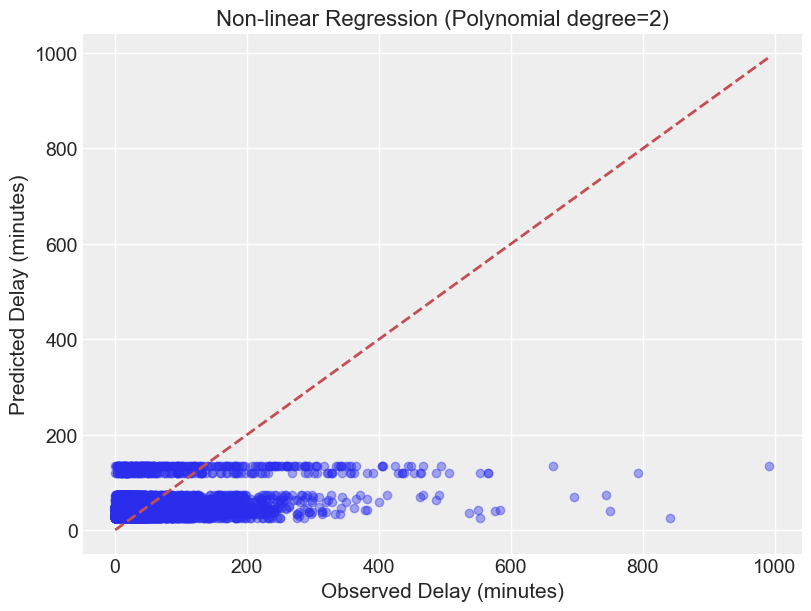

In [107]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

# Prepare data: only flights with delays > 0
X = df_clean[['TAVG', 'SNOW', 'PRCP']].dropna()
y = df_clean.loc[X.index, 'WEATHER_DELAY']
y = y[y > 0]   # focus on positive delays
X = X.loc[y.index]

# Build pipeline: scale + polynomial regression
poly_reg = Pipeline([
    ("scaler", StandardScaler()),
    ("poly", PolynomialFeatures(degree=2, include_bias=False)),
    ("linreg", LinearRegression())
])

# Fit model
poly_reg.fit(X, y)

# Predictions
y_pred = poly_reg.predict(X)

# Plot observed vs predicted
plt.figure(figsize=(8,6))
plt.scatter(y, y_pred, alpha=0.4)
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
plt.xlabel("Observed Delay (minutes)")
plt.ylabel("Predicted Delay (minutes)")
plt.title("Non-linear Regression (Polynomial degree=2)")
plt.show()


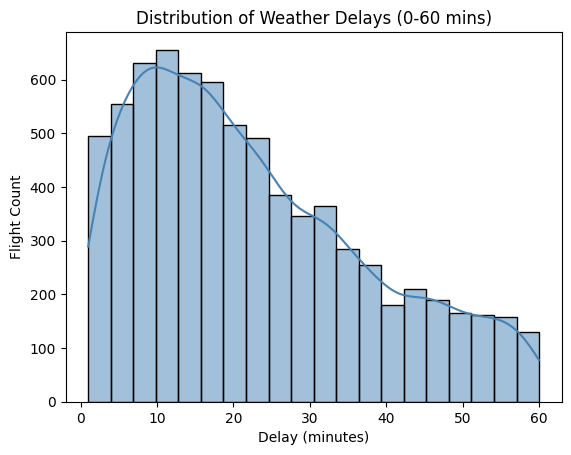

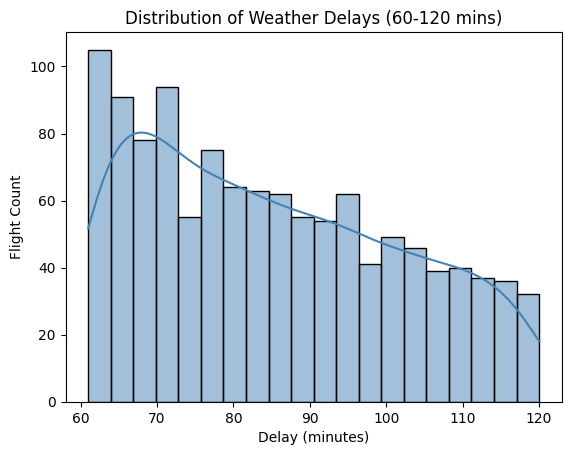

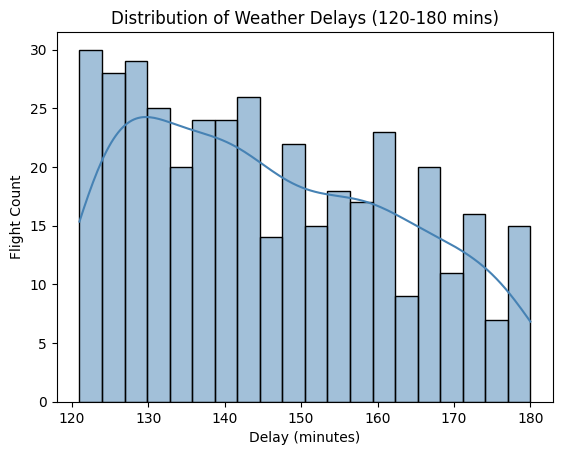

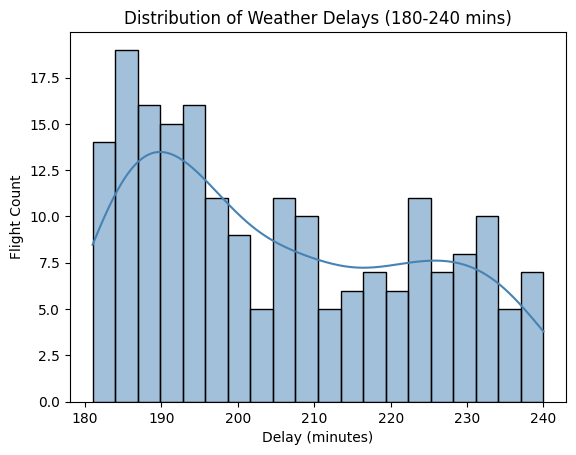

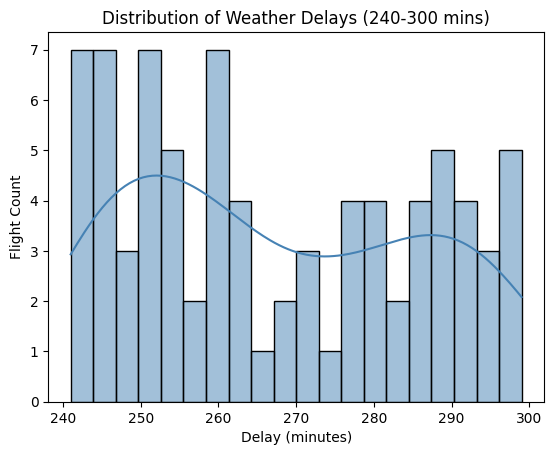

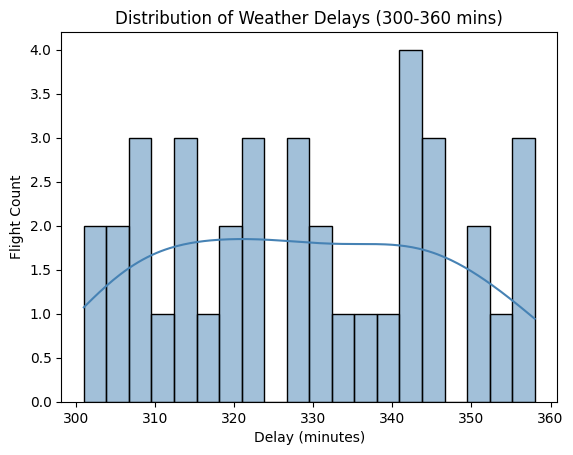

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define ranges
ranges = [(0, 60), (60, 120), (120, 180), (180, 240), (240, 300), (300, 360)]

# Loop through ranges and plot independent histograms
for start, end in ranges:
    df_range = df_clean[(df_clean['WEATHER_DELAY'] > start) & (df_clean['WEATHER_DELAY'] <= end)]
    
    plt.figure()  # auto figure size
    sns.histplot(df_range['WEATHER_DELAY'], bins=20, kde=True, color='steelblue')
    plt.title(f"Distribution of Weather Delays ({start}-{end} mins)")
    plt.xlabel("Delay (minutes)")
    plt.ylabel("Flight Count")
    plt.show()

Flight counts per bucket:
 DELAY_BUCKET
0-60       7382
60-120     1178
120-180     393
180-240     198
240-300      80
300-360      38
360+         48
Name: count, dtype: int64


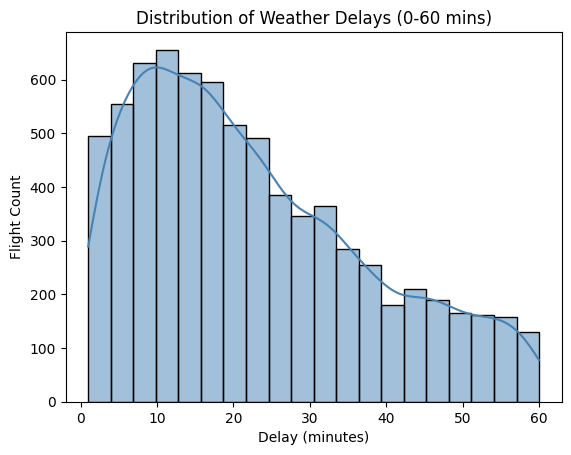

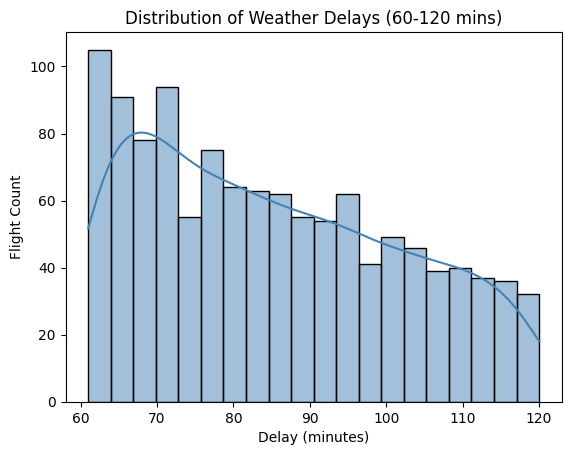

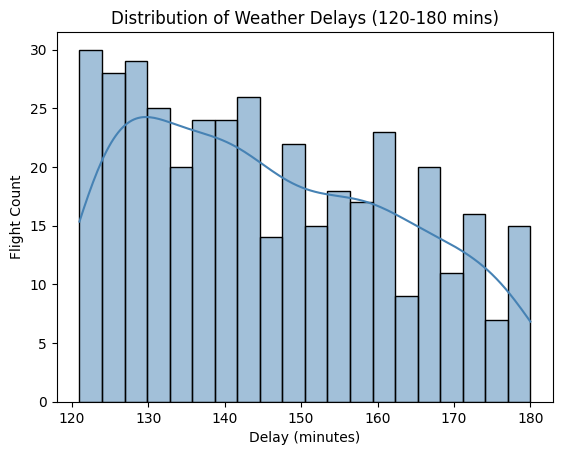

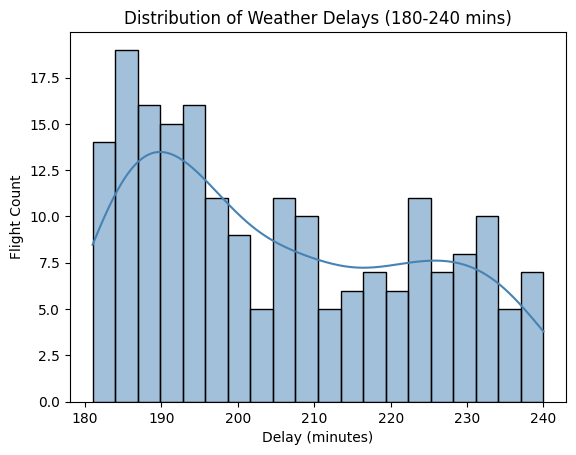

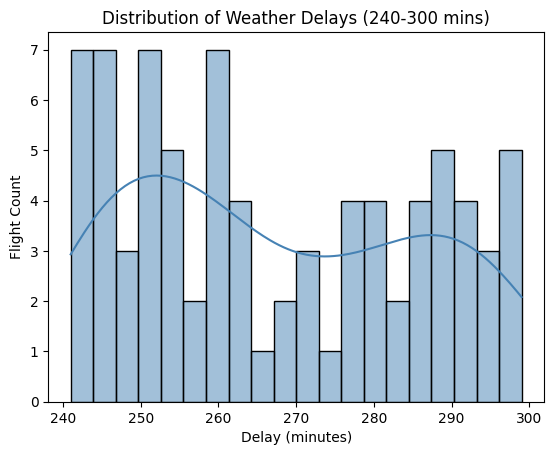

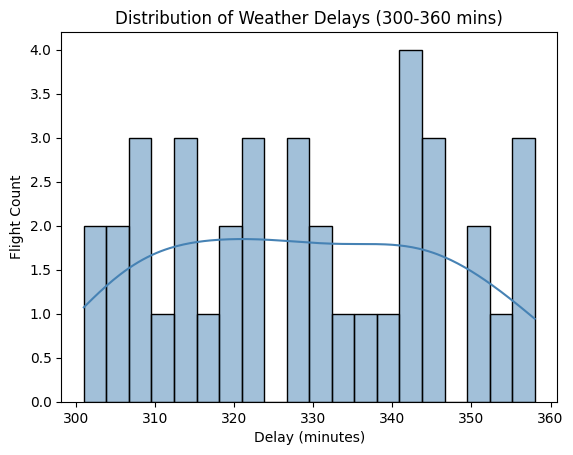

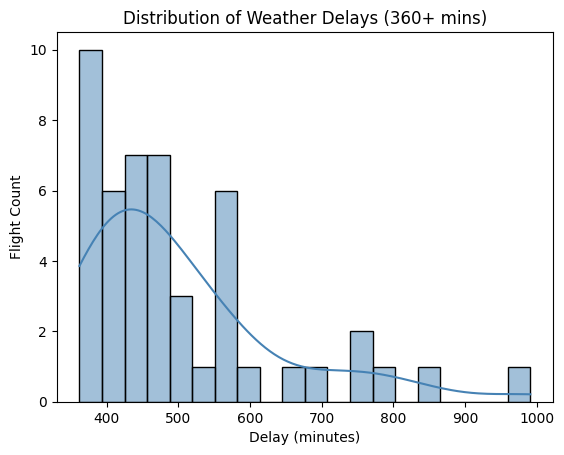


Summary statistics per bucket:
                count        mean         std    min    25%    50%     75%  \
DELAY_BUCKET                                                                
0-60          7382.0   22.555811   15.266723    1.0   10.0   19.0   33.00   
60-120        1178.0   85.033956   16.922851   61.0   70.0   83.0   99.00   
120-180        393.0  145.880407   17.077807  121.0  131.0  143.0  160.00   
180-240        198.0  205.368687   17.830005  181.0  190.0  201.0  220.75   
240-300         80.0  267.337500   18.564253  241.0  251.0  263.5  286.25   
300-360         38.0  328.894737   17.422864  301.0  314.0  328.5  343.00   
360+            48.0  500.770833  138.528780  362.0  405.0  463.0  554.00   

                max  
DELAY_BUCKET         
0-60           60.0  
60-120        120.0  
120-180       180.0  
180-240       240.0  
240-300       299.0  
300-360       358.0  
360+          991.0  


In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define buckets (last one clubs everything above 360)
bins = [0, 60, 120, 180, 240, 300, 360, df_clean['WEATHER_DELAY'].max()]
labels = ['0-60', '60-120', '120-180', '180-240', '240-300', '300-360', '360+']

# Apply binning
df_clean['DELAY_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=bins, labels=labels, right=True)

# --- Distribution counts ---
bucket_counts = df_clean['DELAY_BUCKET'].value_counts().sort_index()
print("Flight counts per bucket:\n", bucket_counts)

# --- Histogram per bucket ---
for label in labels:
    df_bucket = df_clean[df_clean['DELAY_BUCKET'] == label]
    if not df_bucket.empty:
        plt.figure()  # auto sizing
        sns.histplot(df_bucket['WEATHER_DELAY'], bins=20, kde=True, color='steelblue')
        plt.title(f"Distribution of Weather Delays ({label} mins)")
        plt.xlabel("Delay (minutes)")
        plt.ylabel("Flight Count")
        plt.show()

# --- Summary statistics per bucket ---
bucket_stats = df_clean.groupby('DELAY_BUCKET')['WEATHER_DELAY'].describe()
print("\nSummary statistics per bucket:\n", bucket_stats)

Flight counts per bucket:
 DELAY_BUCKET
0-15       2950
15-45      3627
45-90      1547
90-180      829
180-360     316
360+         48
Name: count, dtype: int64


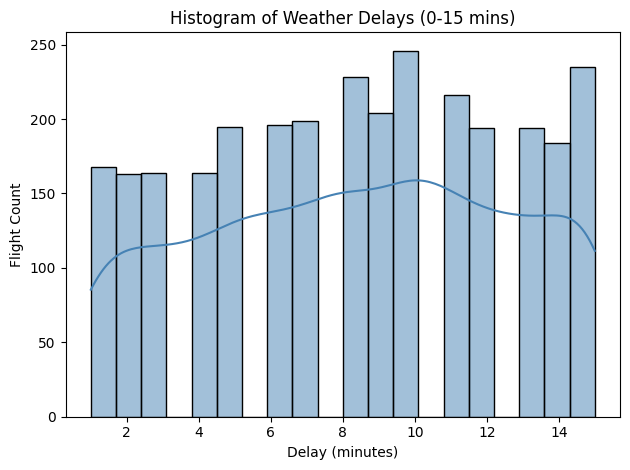

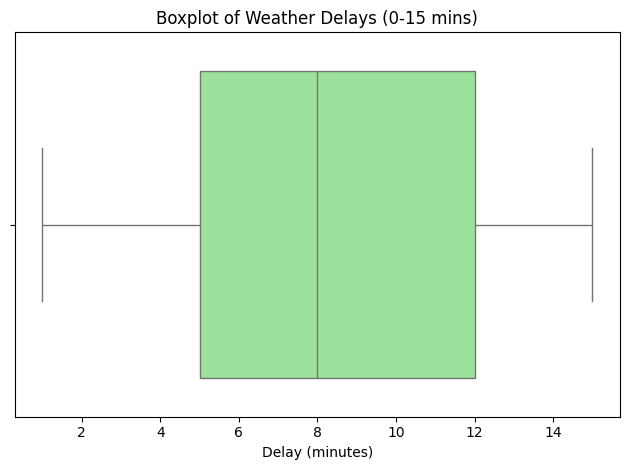

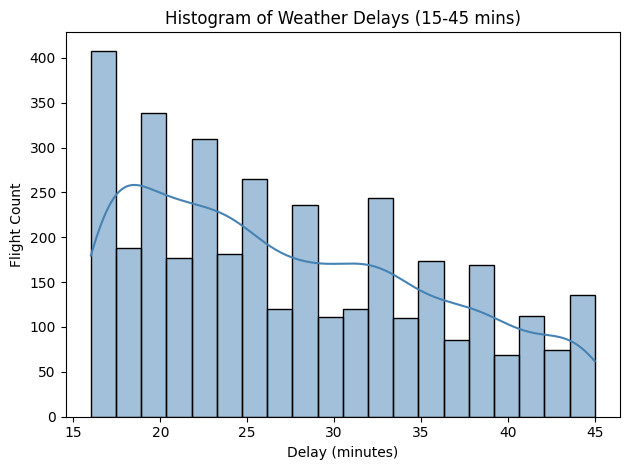

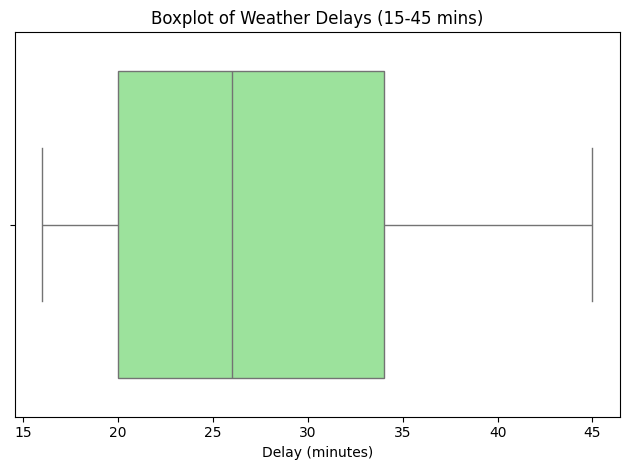

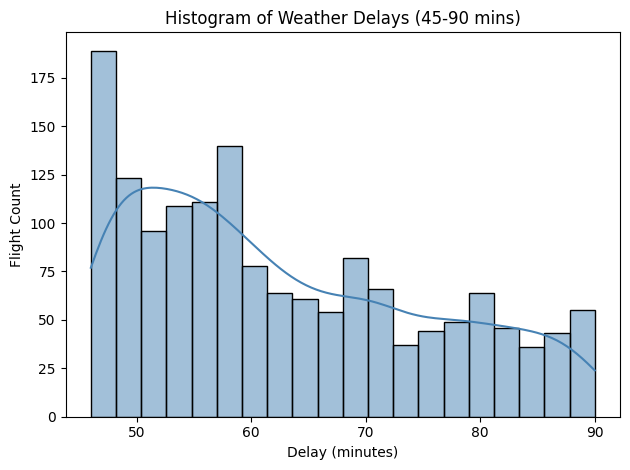

...

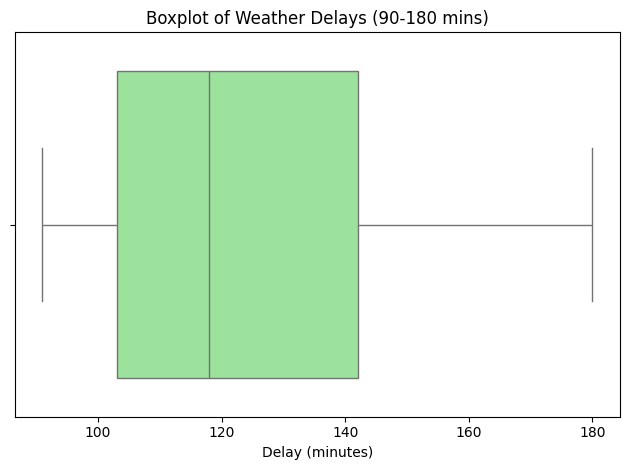

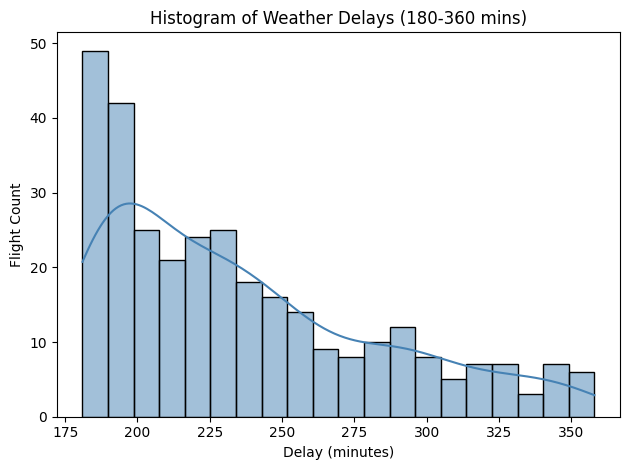

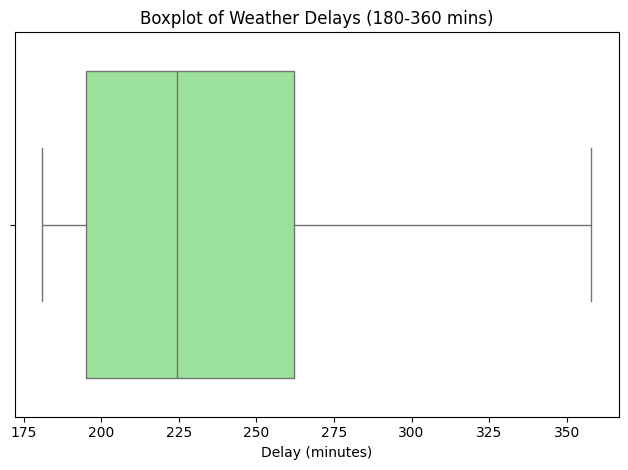

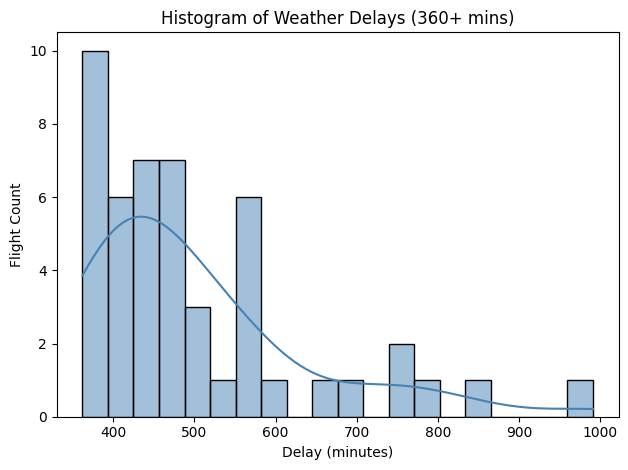

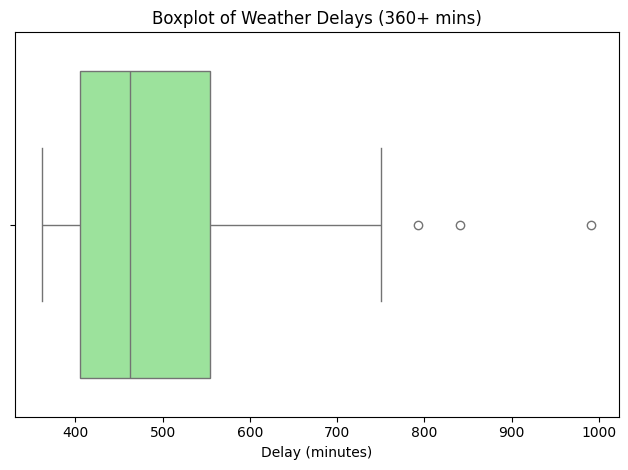


Summary statistics per bucket:
                count        mean         std    min    25%    50%     75%  \
DELAY_BUCKET                                                                
0-15          2950.0    8.350169    4.216314    1.0    5.0    8.0   12.00   
15-45         3627.0   27.471188    8.300841   16.0   20.0   26.0   34.00   
45-90         1547.0   62.738203   12.662884   46.0   52.0   60.0   72.00   
90-180         829.0  123.861279   24.778708   91.0  103.0  118.0  142.00   
180-360        316.0  235.911392   46.915781  181.0  195.0  224.5  262.25   
360+            48.0  500.770833  138.528780  362.0  405.0  463.0  554.00   

                max  
DELAY_BUCKET         
0-15           15.0  
15-45          45.0  
45-90          90.0  
90-180        180.0  
180-360       358.0  
360+          991.0  


In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define custom buckets (last one clubs everything above 360)
bins = [0, 15, 45, 90, 180, 360, df_clean['WEATHER_DELAY'].max()]
labels = ['0-15', '15-45', '45-90', '90-180', '180-360', '360+']

# Apply binning
df_clean['DELAY_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=bins, labels=labels, right=True)

# --- Distribution counts ---
bucket_counts = df_clean['DELAY_BUCKET'].value_counts().sort_index()
print("Flight counts per bucket:\n", bucket_counts)

# --- Independent plots for each bucket ---
for label in labels:
    df_bucket = df_clean[df_clean['DELAY_BUCKET'] == label]
    if not df_bucket.empty:
        # Histogram
        plt.figure()
        sns.histplot(df_bucket['WEATHER_DELAY'], bins=20, kde=True, color='steelblue')
        plt.title(f"Histogram of Weather Delays ({label} mins)")
        plt.xlabel("Delay (minutes)")
        plt.ylabel("Flight Count")
        plt.tight_layout()
        plt.show()

        # Boxplot
        plt.figure()
        sns.boxplot(x=df_bucket['WEATHER_DELAY'], color='lightgreen')
        plt.title(f"Boxplot of Weather Delays ({label} mins)")
        plt.xlabel("Delay (minutes)")
        plt.tight_layout()
        plt.show()

# --- Summary statistics per bucket ---
bucket_stats = df_clean.groupby('DELAY_BUCKET')['WEATHER_DELAY'].describe()
print("\nSummary statistics per bucket:\n", bucket_stats)

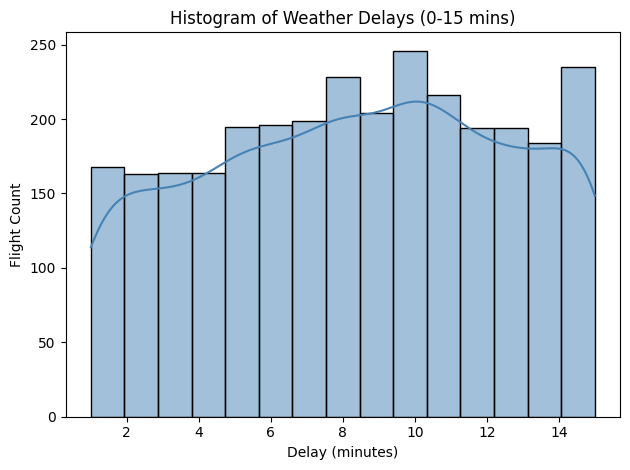


Distribution fits for 0-15:
Normal: mean=8.35, std=4.22
Exponential: scale=7.35
Gamma: shape=834.06, scale=0.15


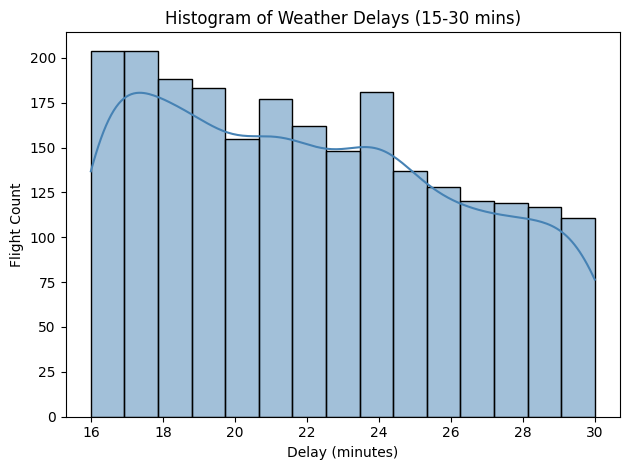


Distribution fits for 15-30:
Normal: mean=22.18, std=4.25
Exponential: scale=6.18
Gamma: shape=1.89, scale=3.62


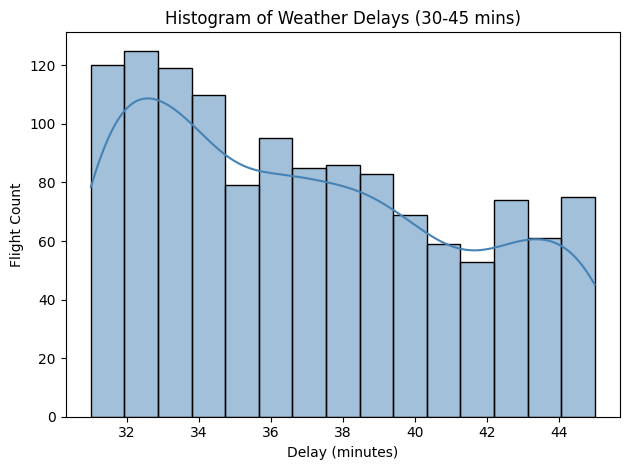


Distribution fits for 30-45:
Normal: mean=37.02, std=4.35
Exponential: scale=6.02
Gamma: shape=0.41, scale=8.50


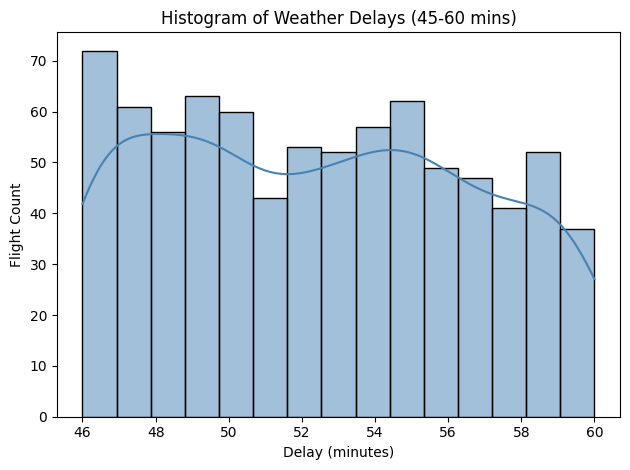


Distribution fits for 45-60:
Normal: mean=52.47, std=4.30
Exponential: scale=6.47
Gamma: shape=136.49, scale=0.37


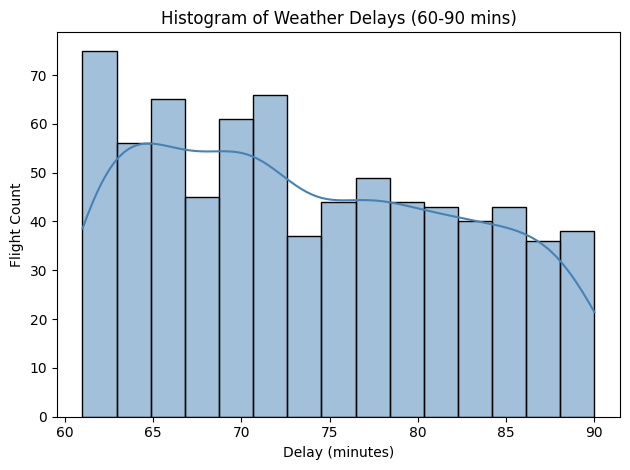


Distribution fits for 60-90:
Normal: mean=73.88, std=8.68
Exponential: scale=12.88
Gamma: shape=1.96, scale=7.25


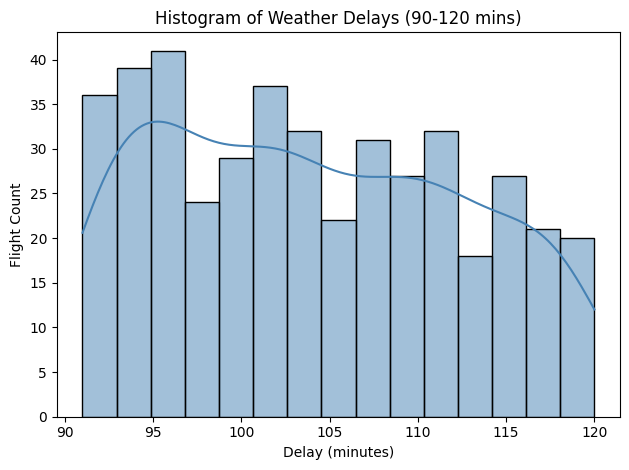


Distribution fits for 90-120:
Normal: mean=104.01, std=8.53
Exponential: scale=13.01
Gamma: shape=6.17, scale=3.52


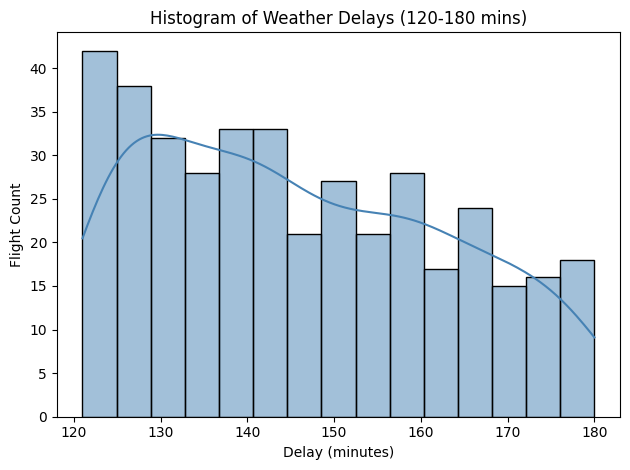


Distribution fits for 120-180:
Normal: mean=145.88, std=17.06
Exponential: scale=24.88
Gamma: shape=1.75, scale=15.17


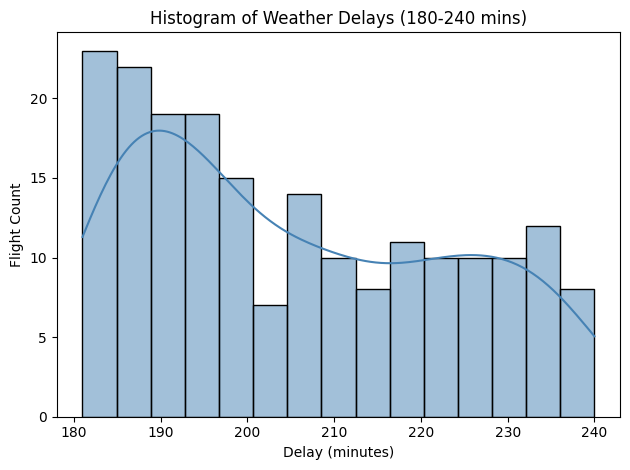


Distribution fits for 180-240:
Normal: mean=205.37, std=17.78
Exponential: scale=24.37
Gamma: shape=1.31, scale=18.69


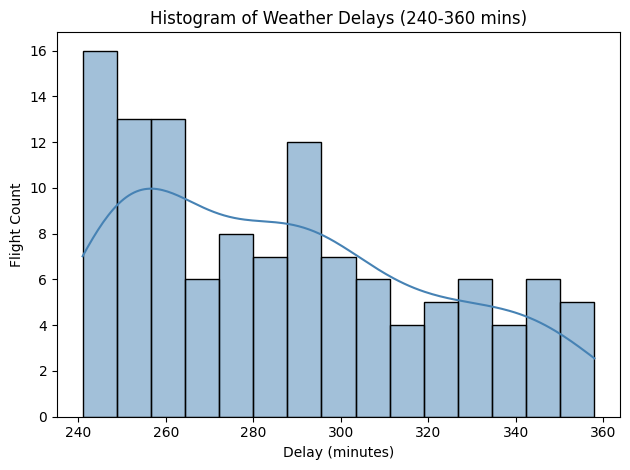


Distribution fits for 240-360:
Normal: mean=287.16, std=33.96
Exponential: scale=46.16
Gamma: shape=1.18, scale=39.26


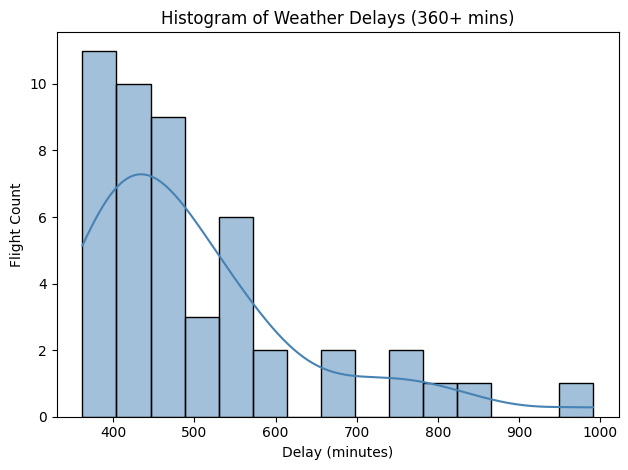


Distribution fits for 360+:
Normal: mean=500.77, std=137.08
Exponential: scale=138.77
Gamma: shape=0.93, scale=128.25


In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import numpy as np

# Define smaller buckets (last one clubs everything above 360)
bins = [0, 15, 30, 45, 60, 90, 120, 180, 240, 360, df_clean['WEATHER_DELAY'].max()]
labels = ['0-15','15-30','30-45','45-60','60-90','90-120','120-180','180-240','240-360','360+']

df_clean['DELAY_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=bins, labels=labels, right=True)

# --- Independent histograms for each bucket ---
for label in labels:
    df_bucket = df_clean[df_clean['DELAY_BUCKET'] == label]
    if not df_bucket.empty:
        plt.figure()
        sns.histplot(df_bucket['WEATHER_DELAY'], bins=15, kde=True, color='steelblue')
        plt.title(f"Histogram of Weather Delays ({label} mins)")
        plt.xlabel("Delay (minutes)")
        plt.ylabel("Flight Count")
        plt.tight_layout()
        plt.show()

        # --- Fit distributions ---
        data = df_bucket['WEATHER_DELAY'].dropna().values
        if len(data) > 10:  # only fit if enough data
            # Fit Normal
            mu, sigma = stats.norm.fit(data)
            # Fit Exponential
            loc, scale = stats.expon.fit(data)
            # Fit Gamma
            a, loc_g, scale_g = stats.gamma.fit(data)

            print(f"\nDistribution fits for {label}:")
            print(f"Normal: mean={mu:.2f}, std={sigma:.2f}")
            print(f"Exponential: scale={scale:.2f}")
            print(f"Gamma: shape={a:.2f}, scale={scale_g:.2f}")

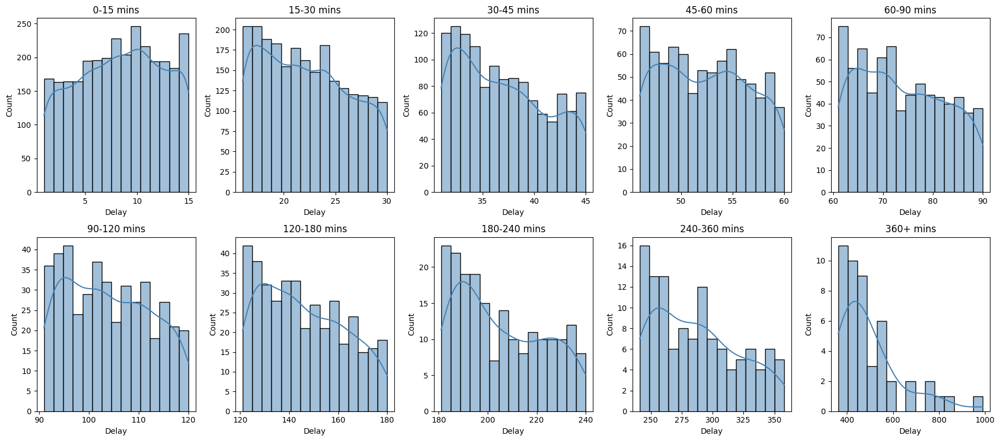


Distribution fits for 0-15:
Normal: mean=8.35, std=4.22
Exponential: scale=7.35
Gamma: shape=834.06, scale=0.15

Distribution fits for 15-30:
Normal: mean=22.18, std=4.25
Exponential: scale=6.18
Gamma: shape=1.89, scale=3.62

Distribution fits for 30-45:
Normal: mean=37.02, std=4.35
Exponential: scale=6.02
Gamma: shape=0.41, scale=8.50

Distribution fits for 45-60:
Normal: mean=52.47, std=4.30
Exponential: scale=6.47
Gamma: shape=136.49, scale=0.37

Distribution fits for 60-90:
Normal: mean=73.88, std=8.68
Exponential: scale=12.88
Gamma: shape=1.96, scale=7.25

Distribution fits for 90-120:
Normal: mean=104.01, std=8.53
Exponential: scale=13.01
Gamma: shape=6.17, scale=3.52

Distribution fits for 120-180:
Normal: mean=145.88, std=17.06
Exponential: scale=24.88
Gamma: shape=1.75, scale=15.17

Distribution fits for 180-240:
Normal: mean=205.37, std=17.78
Exponential: scale=24.37
Gamma: shape=1.31, scale=18.69

Distribution fits for 240-360:
Normal: mean=287.16, std=33.96
Exponential: sc

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import numpy as np

# Define smaller buckets (last one clubs everything above 360)
bins = [0, 15, 30, 45, 60, 90, 120, 180, 240, 360, df_clean['WEATHER_DELAY'].max()]
labels = ['0-15','15-30','30-45','45-60','60-90','90-120','120-180','180-240','240-360','360+']

df_clean['DELAY_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=bins, labels=labels, right=True)

# Prepare grid layout
fig, axes = plt.subplots(2, 5, figsize=(18,8))  # 2 rows, 5 columns
axes = axes.flatten()

# Loop through buckets and plot histograms
for i, label in enumerate(labels):
    df_bucket = df_clean[df_clean['DELAY_BUCKET'] == label]
    if not df_bucket.empty:
        sns.histplot(df_bucket['WEATHER_DELAY'], bins=15, kde=True, ax=axes[i], color='steelblue')
        axes[i].set_title(f"{label} mins")
        axes[i].set_xlabel("Delay")
        axes[i].set_ylabel("Count")
    else:
        axes[i].set_visible(False)

plt.tight_layout()
plt.show()

# --- Fit distributions per bucket ---
for label in labels:
    df_bucket = df_clean[df_clean['DELAY_BUCKET'] == label]
    data = df_bucket['WEATHER_DELAY'].dropna().values
    if len(data) > 10:
        mu, sigma = stats.norm.fit(data)
        loc, scale = stats.expon.fit(data)
        a, loc_g, scale_g = stats.gamma.fit(data)
        print(f"\nDistribution fits for {label}:")
        print(f"Normal: mean={mu:.2f}, std={sigma:.2f}")
        print(f"Exponential: scale={scale:.2f}")
        print(f"Gamma: shape={a:.2f}, scale={scale_g:.2f}")

In [47]:
from scipy import stats

for label in small_labels + large_labels:
    df_bucket = df_clean[(df_clean['SMALL_BUCKET'] == label) | (df_clean['LARGE_BUCKET'] == label)]
    data = df_bucket['WEATHER_DELAY'].dropna().values
    if len(data) > 10:
        mu, sigma = stats.norm.fit(data)
        loc, scale = stats.expon.fit(data)
        a, loc_g, scale_g = stats.gamma.fit(data)
        print(f"\nFits for {label}: Normal(mean={mu:.2f}, std={sigma:.2f}), Exponential(scale={scale:.2f}), Gamma(shape={a:.2f}, scale={scale_g:.2f})")


Fits for 0-15: Normal(mean=8.35, std=4.22), Exponential(scale=7.35), Gamma(shape=834.06, scale=0.15)

Fits for 15-30: Normal(mean=22.18, std=4.25), Exponential(scale=6.18), Gamma(shape=1.89, scale=3.62)

Fits for 30-45: Normal(mean=37.02, std=4.35), Exponential(scale=6.02), Gamma(shape=0.41, scale=8.50)

Fits for 45-60: Normal(mean=52.47, std=4.30), Exponential(scale=6.47), Gamma(shape=136.49, scale=0.37)

Fits for 60-90: Normal(mean=73.88, std=8.68), Exponential(scale=12.88), Gamma(shape=1.96, scale=7.25)

Fits for 90-120: Normal(mean=104.01, std=8.53), Exponential(scale=13.01), Gamma(shape=6.17, scale=3.52)

Fits for 120-180: Normal(mean=145.88, std=17.06), Exponential(scale=24.88), Gamma(shape=1.75, scale=15.17)

Fits for 180-240: Normal(mean=205.37, std=17.78), Exponential(scale=24.37), Gamma(shape=1.31, scale=18.69)

Fits for 240-360: Normal(mean=287.16, std=33.96), Exponential(scale=46.16), Gamma(shape=1.18, scale=39.26)

Fits for 360+: Normal(mean=500.77, std=137.08), Exponenti

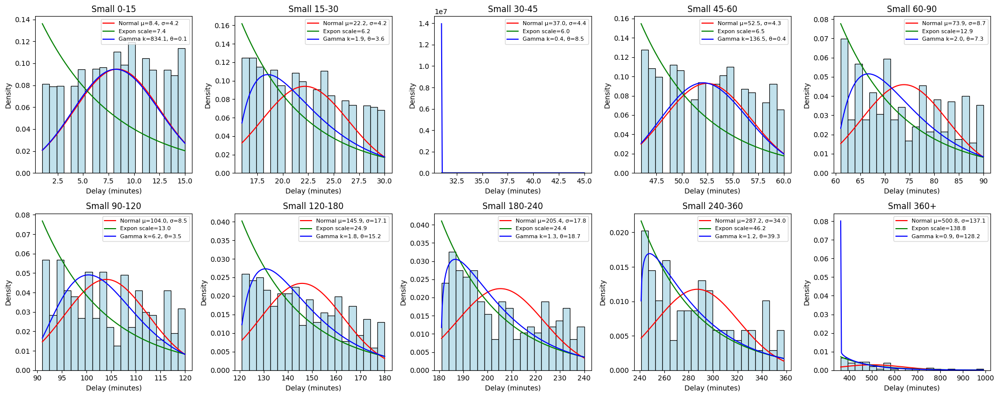

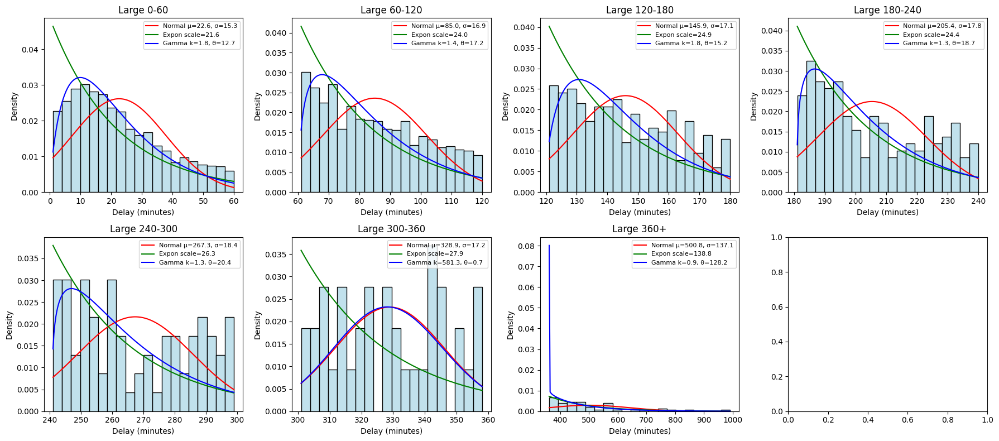

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")  # suppress warnings

# --- Define buckets ---
large_bins = [0, 60, 120, 180, 240, 300, 360, df_clean['WEATHER_DELAY'].max()]
large_labels = ['0-60','60-120','120-180','180-240','240-300','300-360','360+']

small_bins = [0, 15, 30, 45, 60, 90, 120, 180, 240, 360, df_clean['WEATHER_DELAY'].max()]
small_labels = ['0-15','15-30','30-45','45-60','60-90','90-120','120-180','180-240','240-360','360+']

df_clean['LARGE_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=large_bins, labels=large_labels, right=True)
df_clean['SMALL_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=small_bins, labels=small_labels, right=True)

# --- Helper function to plot histogram with fits ---
def plot_with_fits(data, ax, title):
    sns.histplot(data, bins=20, kde=False, stat="density", ax=ax, color='lightblue')
    
    # Fit Normal
    mu, sigma = stats.norm.fit(data)
    x = np.linspace(min(data), max(data), 200)
    ax.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', label=f'Normal μ={mu:.1f}, σ={sigma:.1f}')
    
    # Fit Exponential
    loc, scale = stats.expon.fit(data)
    ax.plot(x, stats.expon.pdf(x, loc, scale), 'g-', label=f'Expon scale={scale:.1f}')
    
    # Fit Gamma
    a, loc_g, scale_g = stats.gamma.fit(data)
    ax.plot(x, stats.gamma.pdf(x, a, loc_g, scale_g), 'b-', label=f'Gamma k={a:.1f}, θ={scale_g:.1f}')
    
    ax.set_title(title)
    ax.set_xlabel("Delay (minutes)")
    ax.set_ylabel("Density")
    ax.legend(fontsize=8)

# --- Plot small buckets side by side ---
fig, axes = plt.subplots(2, 5, figsize=(20,8))
axes = axes.flatten()
for i, label in enumerate(small_labels):
    df_bucket = df_clean[df_clean['SMALL_BUCKET'] == label]['WEATHER_DELAY'].dropna()
    if not df_bucket.empty:
        plot_with_fits(df_bucket, axes[i], f"Small {label}")
    else:
        axes[i].set_visible(False)
plt.tight_layout()
plt.show()

# --- Plot large buckets side by side ---
fig, axes = plt.subplots(2, 4, figsize=(18,8))
axes = axes.flatten()
for i, label in enumerate(large_labels):
    df_bucket = df_clean[df_clean['LARGE_BUCKET'] == label]['WEATHER_DELAY'].dropna()
    if not df_bucket.empty:
        plot_with_fits(df_bucket, axes[i], f"Large {label}")
    else:
        axes[i].set_visible(False)
plt.tight_layout()
plt.show()

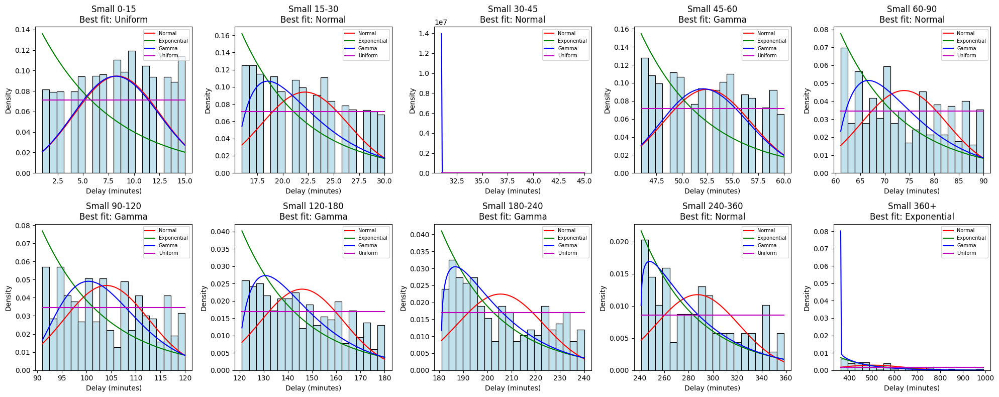

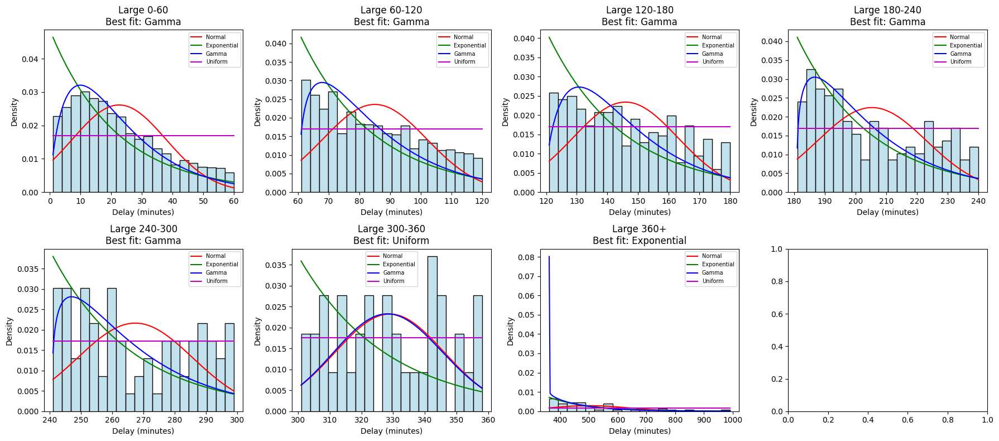

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")

# --- Define buckets ---
large_bins = [0, 60, 120, 180, 240, 300, 360, df_clean['WEATHER_DELAY'].max()]
large_labels = ['0-60','60-120','120-180','180-240','240-300','300-360','360+']

small_bins = [0, 15, 30, 45, 60, 90, 120, 180, 240, 360, df_clean['WEATHER_DELAY'].max()]
small_labels = ['0-15','15-30','30-45','45-60','60-90','90-120','120-180','180-240','240-360','360+']

df_clean['LARGE_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=large_bins, labels=large_labels, right=True)
df_clean['SMALL_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=small_bins, labels=small_labels, right=True)

# --- Helper function to plot and score fits ---
def plot_and_score(data, ax, title):
    sns.histplot(data, bins=20, kde=False, stat="density", ax=ax, color='lightblue')
    x = np.linspace(min(data), max(data), 200)

    scores = {}

    # Normal
    mu, sigma = stats.norm.fit(data)
    ax.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', label='Normal')
    ks_stat, ks_p = stats.kstest(data, 'norm', args=(mu, sigma))
    scores['Normal'] = ks_p

    # Exponential
    loc, scale = stats.expon.fit(data)
    ax.plot(x, stats.expon.pdf(x, loc, scale), 'g-', label='Exponential')
    ks_stat, ks_p = stats.kstest(data, 'expon', args=(loc, scale))
    scores['Exponential'] = ks_p

    # Gamma
    a, loc_g, scale_g = stats.gamma.fit(data)
    ax.plot(x, stats.gamma.pdf(x, a, loc_g, scale_g), 'b-', label='Gamma')
    ks_stat, ks_p = stats.kstest(data, 'gamma', args=(a, loc_g, scale_g))
    scores['Gamma'] = ks_p

    # Uniform
    min_val, max_val = min(data), max(data)
    ax.plot(x, stats.uniform.pdf(x, min_val, max_val-min_val), 'm-', label='Uniform')
    ks_stat, ks_p = stats.kstest(data, 'uniform', args=(min_val, max_val-min_val))
    scores['Uniform'] = ks_p

    # Best fit
    best_fit = max(scores, key=scores.get)
    ax.set_title(f"{title}\nBest fit: {best_fit}")
    ax.set_xlabel("Delay (minutes)")
    ax.set_ylabel("Density")
    ax.legend(fontsize=7)

    return scores

# --- Plot small buckets ---
fig, axes = plt.subplots(2, 5, figsize=(20,8))
axes = axes.flatten()
for i, label in enumerate(small_labels):
    df_bucket = df_clean[df_clean['SMALL_BUCKET'] == label]['WEATHER_DELAY'].dropna()
    if not df_bucket.empty:
        plot_and_score(df_bucket, axes[i], f"Small {label}")
    else:
        axes[i].set_visible(False)
plt.tight_layout()
plt.show()

# --- Plot large buckets ---
fig, axes = plt.subplots(2, 4, figsize=(18,8))
axes = axes.flatten()
for i, label in enumerate(large_labels):
    df_bucket = df_clean[df_clean['LARGE_BUCKET'] == label]['WEATHER_DELAY'].dropna()
    if not df_bucket.empty:
        plot_and_score(df_bucket, axes[i], f"Large {label}")
    else:
        axes[i].set_visible(False)
plt.tight_layout()
plt.show()

In [44]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")

# Define buckets
large_bins = [0, 60, 120, 180, 240, 300, 360, df_clean['WEATHER_DELAY'].max()]
large_labels = ['0-60','60-120','120-180','180-240','240-300','300-360','360+']

small_bins = [0, 15, 30, 45, 60, 90, 120, 180, 240, 360, df_clean['WEATHER_DELAY'].max()]
small_labels = ['0-15','15-30','30-45','45-60','60-90','90-120','120-180','180-240','240-360','360+']

df_clean['LARGE_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=large_bins, labels=large_labels, right=True)
df_clean['SMALL_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=small_bins, labels=small_labels, right=True)

# Function to compute KS scores
def compute_scores(data):
    scores = {}
    # Normal
    mu, sigma = stats.norm.fit(data)
    _, p_norm = stats.kstest(data, 'norm', args=(mu, sigma))
    scores['Normal'] = p_norm
    # Exponential
    loc, scale = stats.expon.fit(data)
    _, p_expon = stats.kstest(data, 'expon', args=(loc, scale))
    scores['Exponential'] = p_expon
    # Gamma
    a, loc_g, scale_g = stats.gamma.fit(data)
    _, p_gamma = stats.kstest(data, 'gamma', args=(a, loc_g, scale_g))
    scores['Gamma'] = p_gamma
    # Uniform
    min_val, max_val = min(data), max(data)
    _, p_uniform = stats.kstest(data, 'uniform', args=(min_val, max_val-min_val))
    scores['Uniform'] = p_uniform
    return scores

# Collect results
results = []

for label in small_labels + large_labels:
    df_bucket = df_clean[(df_clean['SMALL_BUCKET'] == label) | (df_clean['LARGE_BUCKET'] == label)]
    data = df_bucket['WEATHER_DELAY'].dropna().values
    if len(data) > 10:
        scores = compute_scores(data)
        best_fit = max(scores, key=scores.get)
        results.append({
            'Bucket': label,
            'Best Fit': best_fit,
            'Scores': scores
        })

# Convert to DataFrame for readability
results_df = pd.DataFrame(results)
print(results_df[['Bucket','Best Fit']])
print("\nDetailed Scores:\n", results_df[['Bucket','Scores']])

     Bucket     Best Fit
0      0-15      Uniform
1     15-30       Normal
2     30-45       Normal
3     45-60        Gamma
4     60-90       Normal
5    90-120        Gamma
6   120-180        Gamma
7   180-240        Gamma
8   240-360       Normal
9      360+  Exponential
10     0-60        Gamma
11   60-120        Gamma
12  120-180        Gamma
13  180-240        Gamma
14  240-300        Gamma
15  300-360      Uniform
16     360+  Exponential

Detailed Scores:
      Bucket                                             Scores
0      0-15  {'Normal': 7.116663227385863e-18, 'Exponential...
1     15-30  {'Normal': 1.1904560114799598e-23, 'Exponentia...
2     30-45  {'Normal': 2.012174462836234e-17, 'Exponential...
3     45-60  {'Normal': 4.073619190388334e-08, 'Exponential...
4     60-90  {'Normal': 3.6198405260356795e-05, 'Exponentia...
5    90-120  {'Normal': 0.0011264035343055319, 'Exponential...
6   120-180  {'Normal': 0.00857977800863102, 'Exponential':...
7   180-240  {'Normal': 0.0

In [43]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")

# --- Define large buckets ---
large_bins = [0, 60, 120, 180, 240, 300, 360, df_clean['WEATHER_DELAY'].max()]
large_labels = ['0-60','60-120','120-180','180-240','240-300','300-360','360+']

df_clean['LARGE_BUCKET'] = pd.cut(df_clean['WEATHER_DELAY'], bins=large_bins, labels=large_labels, right=True)

# --- Function to fit distributions and return parameters ---
def fit_distributions(data):
    results = {}
    # Normal
    mu, sigma = stats.norm.fit(data)
    results['Normal'] = {'mu': mu, 'sigma': sigma}
    # Exponential
    loc, scale = stats.expon.fit(data)
    results['Exponential'] = {'loc': loc, 'scale': scale}
    # Gamma
    a, loc_g, scale_g = stats.gamma.fit(data)
    results['Gamma'] = {'shape': a, 'loc': loc_g, 'scale': scale_g}
    # Uniform
    min_val, max_val = min(data), max(data)
    results['Uniform'] = {'loc': min_val, 'scale': max_val - min_val}
    return results

# --- Collect parameters for each bucket ---
bucket_params = {}
for label in large_labels:
    df_bucket = df_clean[df_clean['LARGE_BUCKET'] == label]['WEATHER_DELAY'].dropna().values
    if len(df_bucket) > 10:
        bucket_params[label] = fit_distributions(df_bucket)

# --- Print results ---
for bucket, params in bucket_params.items():
    print(f"\nBucket: {bucket}")
    for dist, p in params.items():
        print(f"  {dist}: {p}")


Bucket: 0-60
  Normal: {'mu': np.float64(22.55581143321593), 'sigma': np.float64(15.265688643318496)}
  Exponential: {'loc': 1.0, 'scale': 21.55581143321593}
  Gamma: {'shape': np.float64(1.7890296020440783), 'loc': np.float64(-0.08132547963134942), 'scale': np.float64(12.653305435630045)}
  Uniform: {'loc': np.float64(1.0), 'scale': np.float64(59.0)}

Bucket: 60-120
  Normal: {'mu': np.float64(85.0339558573854), 'sigma': np.float64(16.915666224181024)}
  Exponential: {'loc': 61.0, 'scale': 24.033955857385394}
  Gamma: {'shape': np.float64(1.4381651208794985), 'loc': np.float64(60.28701134471495), 'scale': np.float64(17.207288184517406)}
  Uniform: {'loc': np.float64(61.0), 'scale': np.float64(59.0)}

Bucket: 120-180
  Normal: {'mu': np.float64(145.88040712468194), 'sigma': np.float64(17.056065245721552)}
  Exponential: {'loc': 121.0, 'scale': 24.880407124681938}
  Gamma: {'shape': np.float64(1.750651482014423), 'loc': np.float64(119.33096650618347), 'scale': np.float64(15.16546443731

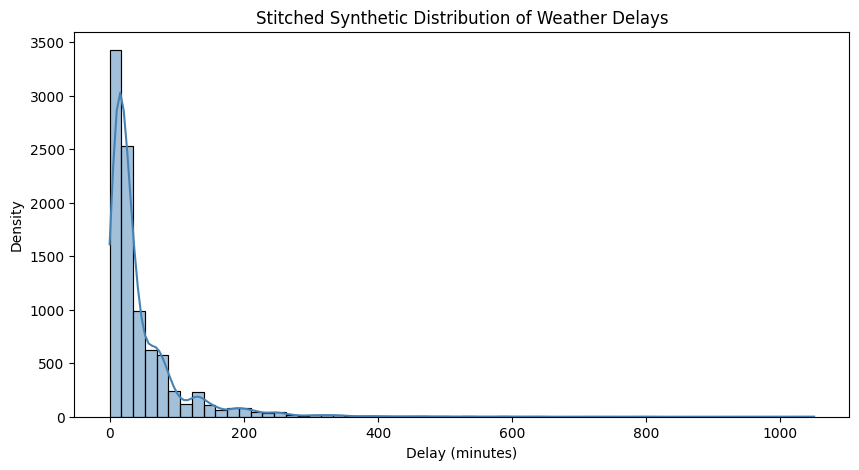

In [42]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# --- Best-fit distribution parameters per bucket (from your results) ---
bucket_fits = {
    '0-60':      ('gamma', {'shape':1.7890, 'loc':-0.0813, 'scale':12.6533}),
    '60-120':    ('gamma', {'shape':1.4382, 'loc':60.2870, 'scale':17.2073}),
    '120-180':   ('gamma', {'shape':1.7507, 'loc':119.3310, 'scale':15.1655}),
    '180-240':   ('gamma', {'shape':1.3094, 'loc':180.9013, 'scale':18.6867}),
    '240-300':   ('gamma', {'shape':1.3035, 'loc':240.7444, 'scale':20.4010}),
    '300-360':   ('uniform', {'loc':301.0, 'scale':57.0}),
    '360+':      ('expon', {'loc':362.0, 'scale':138.7708})
}

# --- Get actual bucket counts from your dataset ---
bucket_counts = df_clean['LARGE_BUCKET'].value_counts().to_dict()

# --- Generate synthetic samples per bucket ---
synthetic_data = []

for bucket, (dist_type, params) in bucket_fits.items():
    count = bucket_counts.get(bucket, 0)
    if count == 0:
        continue
    
    if dist_type == 'gamma':
        samples = stats.gamma.rvs(params['shape'], loc=params['loc'], scale=params['scale'], size=count)
    elif dist_type == 'uniform':
        samples = stats.uniform.rvs(loc=params['loc'], scale=params['scale'], size=count)
    elif dist_type == 'expon':
        samples = stats.expon.rvs(loc=params['loc'], scale=params['scale'], size=count)
    else:
        samples = []
    
    synthetic_data.extend(samples)

# --- Convert to DataFrame ---
synthetic_df = pd.DataFrame({'WEATHER_DELAY_SYNTH': synthetic_data})

# --- Plot combined synthetic distribution ---
plt.figure(figsize=(10,5))
sns.histplot(synthetic_df['WEATHER_DELAY_SYNTH'], bins=60, kde=True, color='steelblue')
plt.title("Stitched Synthetic Distribution of Weather Delays")
plt.xlabel("Delay (minutes)")
plt.ylabel("Density")
plt.show()

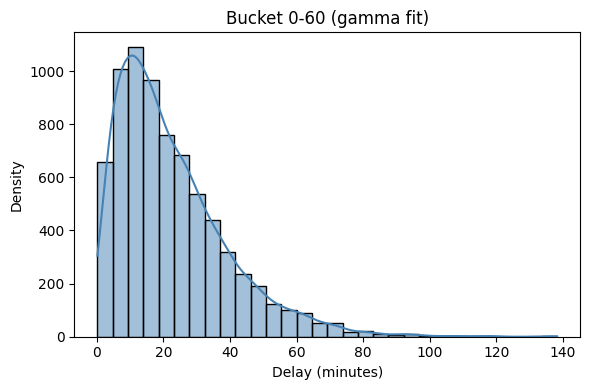

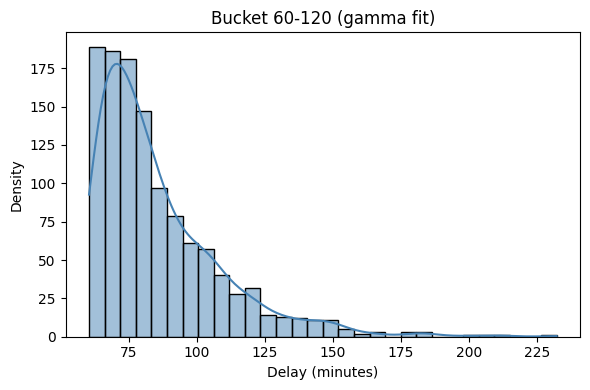

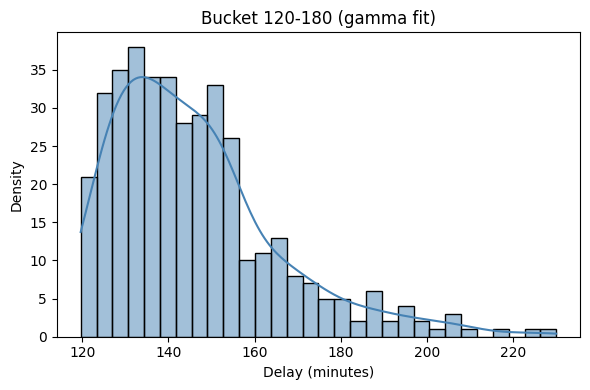

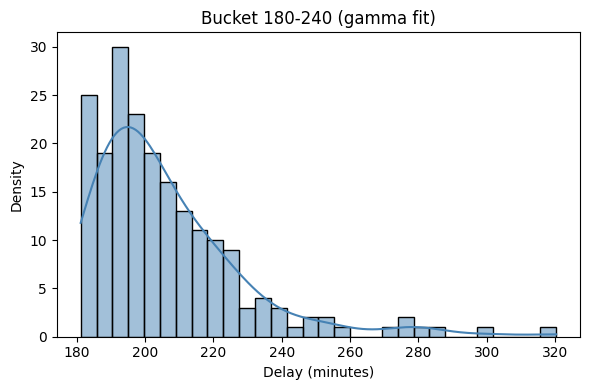

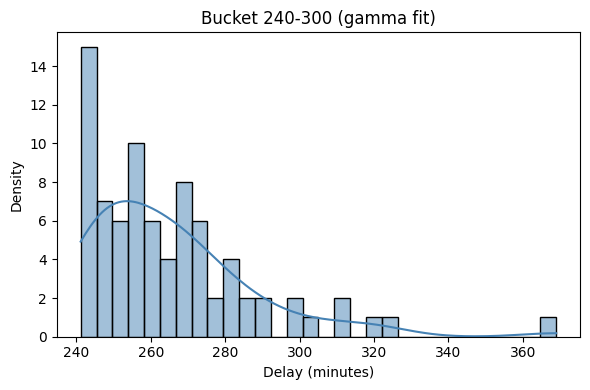

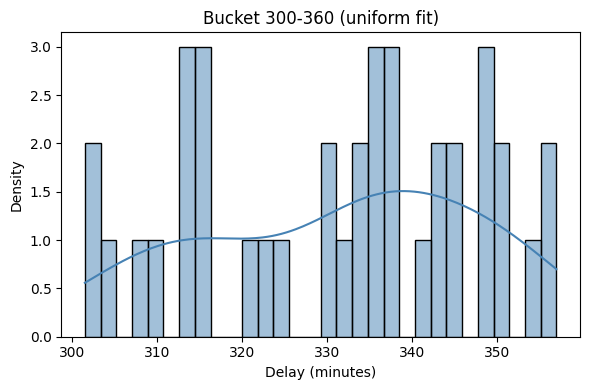

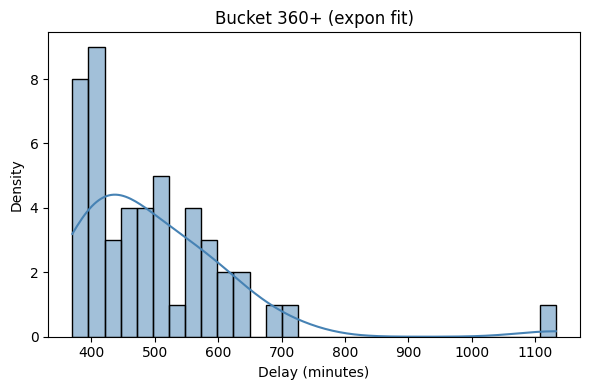

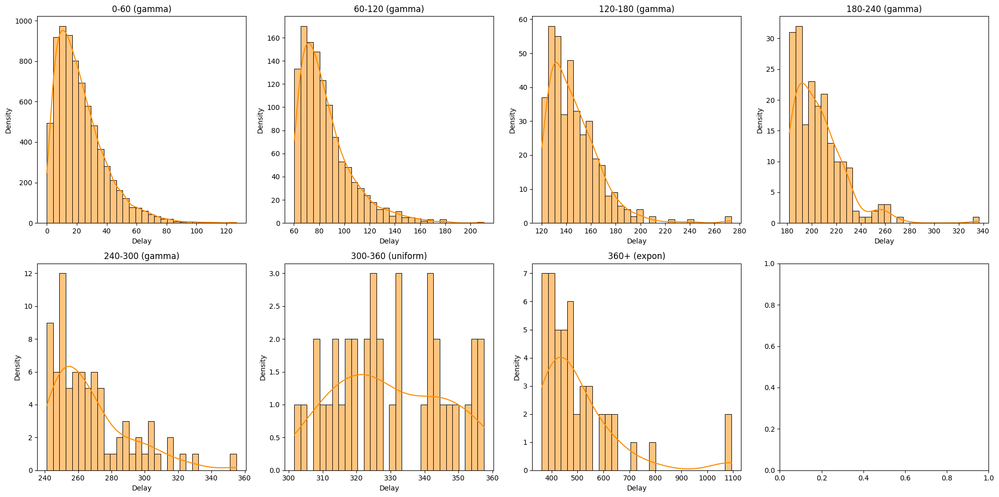

In [40]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# --- Best-fit distribution parameters per bucket ---
bucket_fits = {
    '0-60':      ('gamma', {'shape':1.7890, 'loc':-0.0813, 'scale':12.6533}),
    '60-120':    ('gamma', {'shape':1.4382, 'loc':60.2870, 'scale':17.2073}),
    '120-180':   ('gamma', {'shape':1.7507, 'loc':119.3310, 'scale':15.1655}),
    '180-240':   ('gamma', {'shape':1.3094, 'loc':180.9013, 'scale':18.6867}),
    '240-300':   ('gamma', {'shape':1.3035, 'loc':240.7444, 'scale':20.4010}),
    '300-360':   ('uniform', {'loc':301.0, 'scale':57.0}),
    '360+':      ('expon', {'loc':362.0, 'scale':138.7708})
}

# --- Bucket counts from your dataset ---
bucket_counts = df_clean['LARGE_BUCKET'].value_counts().to_dict()

# --- Function to plot individual bucket ---
def plot_bucket(bucket, dist_type, params, count):
    # Sample synthetic data
    if dist_type == 'gamma':
        samples = stats.gamma.rvs(params['shape'], loc=params['loc'], scale=params['scale'], size=count)
    elif dist_type == 'uniform':
        samples = stats.uniform.rvs(loc=params['loc'], scale=params['scale'], size=count)
    elif dist_type == 'expon':
        samples = stats.expon.rvs(loc=params['loc'], scale=params['scale'], size=count)
    else:
        samples = []
    
    # Plot histogram with fitted curve
    plt.figure(figsize=(6,4))
    sns.histplot(samples, bins=30, kde=True, color='steelblue')
    plt.title(f"Bucket {bucket} ({dist_type} fit)")
    plt.xlabel("Delay (minutes)")
    plt.ylabel("Density")
    plt.tight_layout()
    plt.show()
    
    return samples

# --- Individual plots ---
synthetic_data = []
for bucket, (dist_type, params) in bucket_fits.items():
    count = bucket_counts.get(bucket, 0)
    if count > 0:
        samples = plot_bucket(bucket, dist_type, params, count)
        synthetic_data.extend(samples)

# --- Combined tight grid plot ---
fig, axes = plt.subplots(2, 4, figsize=(20,10))
axes = axes.flatten()

for i, (bucket, (dist_type, params)) in enumerate(bucket_fits.items()):
    count = bucket_counts.get(bucket, 0)
    if count > 0:
        # Sample again for grid plot
        if dist_type == 'gamma':
            samples = stats.gamma.rvs(params['shape'], loc=params['loc'], scale=params['scale'], size=count)
        elif dist_type == 'uniform':
            samples = stats.uniform.rvs(loc=params['loc'], scale=params['scale'], size=count)
        elif dist_type == 'expon':
            samples = stats.expon.rvs(loc=params['loc'], scale=params['scale'], size=count)
        else:
            samples = []
        
        sns.histplot(samples, bins=30, kde=True, ax=axes[i], color='darkorange')
        axes[i].set_title(f"{bucket} ({dist_type})")
        axes[i].set_xlabel("Delay")
        axes[i].set_ylabel("Density")
    else:
        axes[i].set_visible(False)

plt.tight_layout()
plt.show()

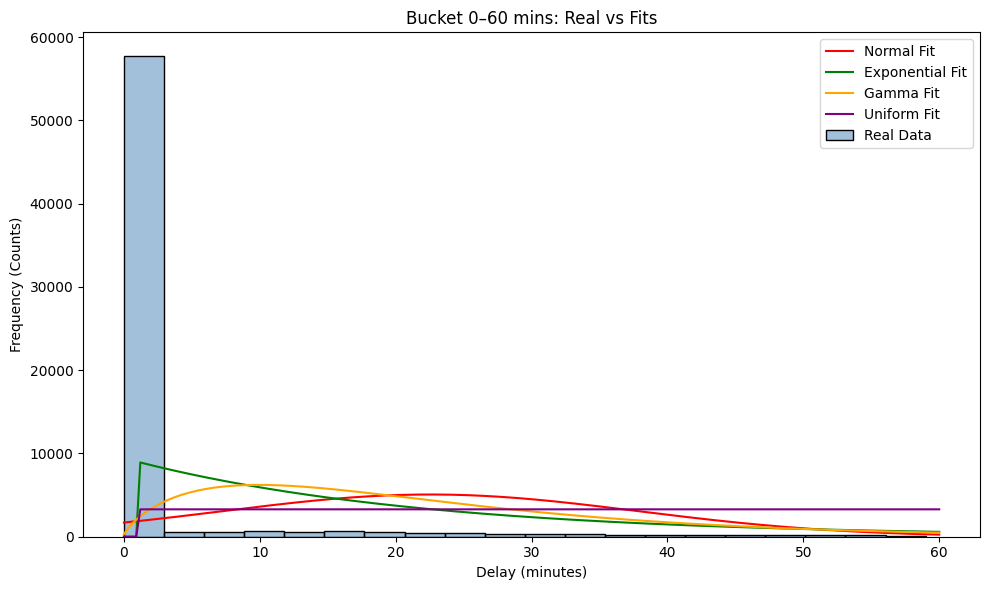

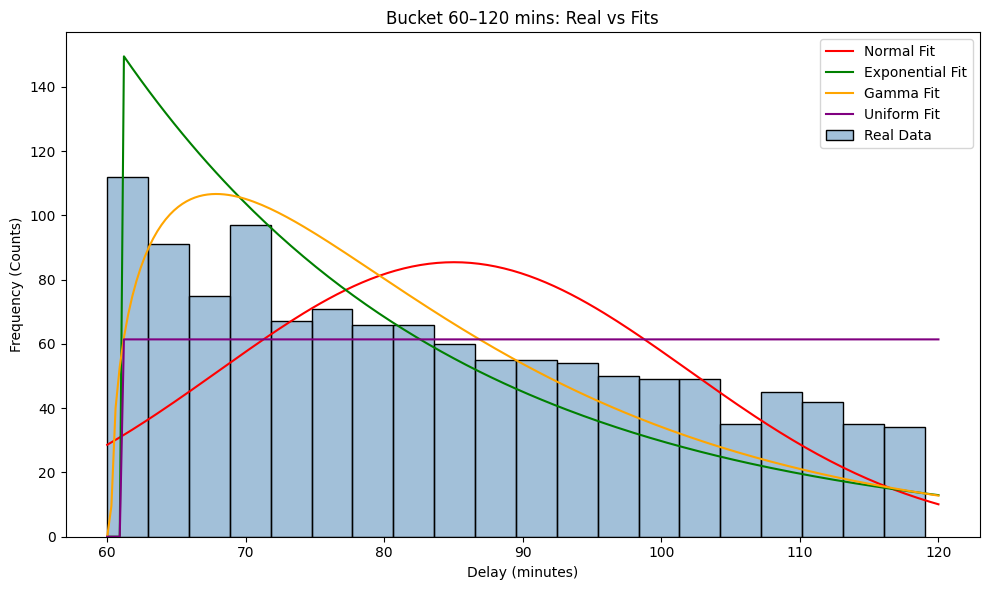

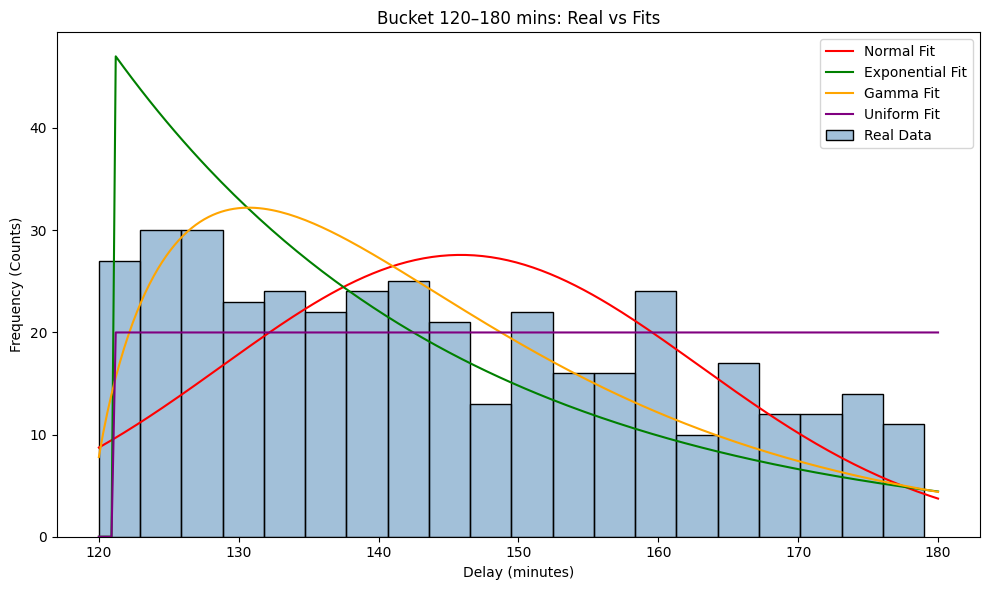

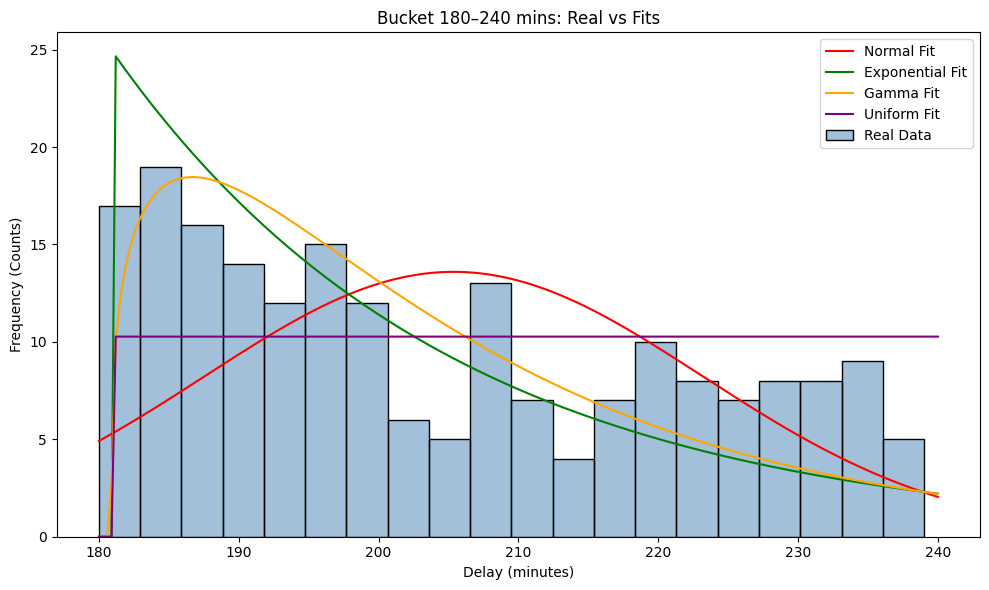

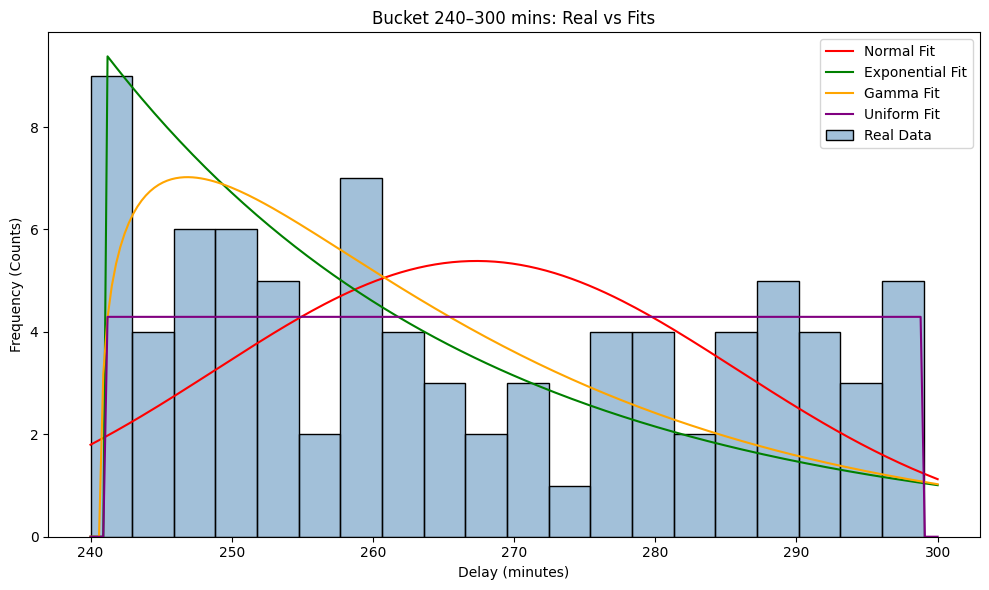

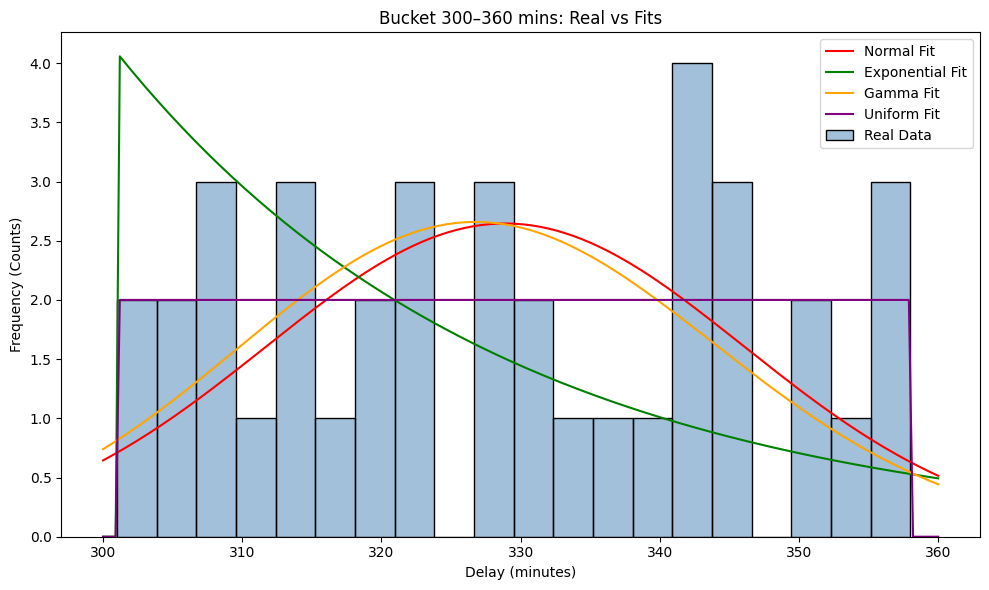

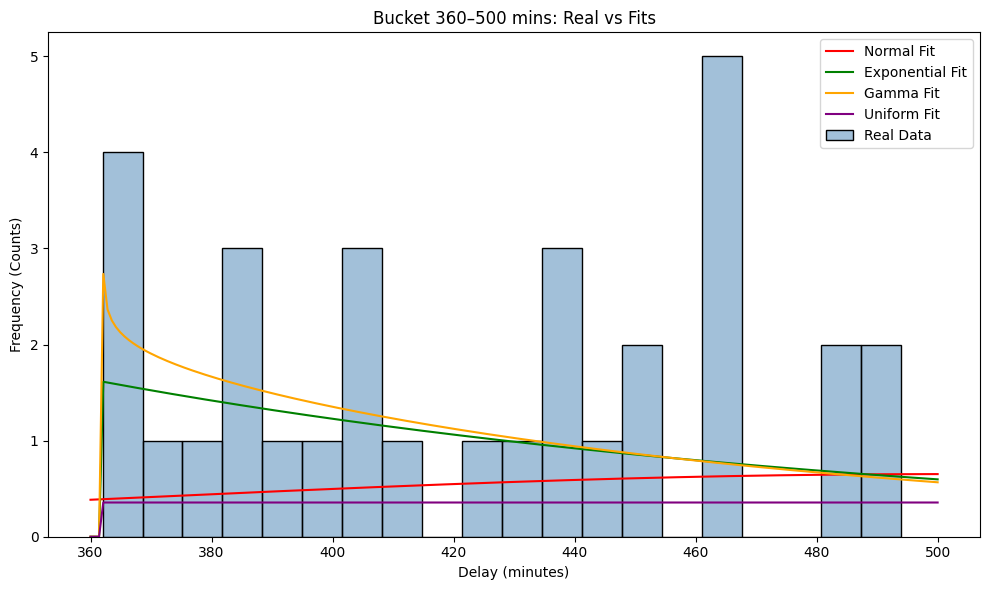

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Buckets and their fitted parameters
bucket_params = {
    (0,60): {
        "Normal": {"mu": 22.56, "sigma": 15.27},
        "Exponential": {"loc": 1.0, "scale": 21.56},
        "Gamma": {"shape": 1.79, "loc": -0.08, "scale": 12.65},
        "Uniform": {"loc": 1.0, "scale": 59.0}
    },
    (60,120): {
        "Normal": {"mu": 85.03, "sigma": 16.92},
        "Exponential": {"loc": 61.0, "scale": 24.03},
        "Gamma": {"shape": 1.44, "loc": 60.29, "scale": 17.21},
        "Uniform": {"loc": 61.0, "scale": 59.0}
    },
    (120,180): {
        "Normal": {"mu": 145.88, "sigma": 17.06},
        "Exponential": {"loc": 121.0, "scale": 24.88},
        "Gamma": {"shape": 1.75, "loc": 119.33, "scale": 15.17},
        "Uniform": {"loc": 121.0, "scale": 59.0}
    },
    (180,240): {
        "Normal": {"mu": 205.37, "sigma": 17.78},
        "Exponential": {"loc": 181.0, "scale": 24.37},
        "Gamma": {"shape": 1.31, "loc": 180.90, "scale": 18.69},
        "Uniform": {"loc": 181.0, "scale": 59.0}
    },
    (240,300): {
        "Normal": {"mu": 267.34, "sigma": 18.45},
        "Exponential": {"loc": 241.0, "scale": 26.34},
        "Gamma": {"shape": 1.30, "loc": 240.74, "scale": 20.40},
        "Uniform": {"loc": 241.0, "scale": 58.0}
    },
    (300,360): {
        "Normal": {"mu": 328.89, "sigma": 17.19},
        "Exponential": {"loc": 301.0, "scale": 27.89},
        "Gamma": {"shape": 581.27, "loc": -85.23, "scale": 0.71},
        "Uniform": {"loc": 301.0, "scale": 57.0}
    },
    (360,500): {
        "Normal": {"mu": 500.77, "sigma": 137.08},
        "Exponential": {"loc": 362.0, "scale": 138.77},
        "Gamma": {"shape": 0.93, "loc": 362.0, "scale": 128.25},
        "Uniform": {"loc": 362.0, "scale": 629.0}
    }
}

# Loop through each bucket
for br, params in bucket_params.items():
    data_bin = df_clean[(df_clean['WEATHER_DELAY'] >= br[0]) & 
                        (df_clean['WEATHER_DELAY'] < br[1])]['WEATHER_DELAY']
    
    plt.figure(figsize=(10,6))
    sns.histplot(data_bin, bins=20, stat="count", color="steelblue", alpha=0.5, label="Real Data")
    
    x = np.linspace(br[0], br[1], 200)
    n = len(data_bin)
    bin_width = (br[1]-br[0]) / 20
    
    # Normal
    y_norm = stats.norm.pdf(x, loc=params["Normal"]["mu"], scale=params["Normal"]["sigma"])
    plt.plot(x, y_norm * n * bin_width, color="red", label="Normal Fit")
    
    # Exponential
    y_exp = stats.expon.pdf(x, loc=params["Exponential"]["loc"], scale=params["Exponential"]["scale"])
    plt.plot(x, y_exp * n * bin_width, color="green", label="Exponential Fit")
    
    # Gamma
    y_gamma = stats.gamma.pdf(x, a=params["Gamma"]["shape"], loc=params["Gamma"]["loc"], scale=params["Gamma"]["scale"])
    plt.plot(x, y_gamma * n * bin_width, color="orange", label="Gamma Fit")
    
    # Uniform
    y_uni = stats.uniform.pdf(x, loc=params["Uniform"]["loc"], scale=params["Uniform"]["scale"])
    plt.plot(x, y_uni * n * bin_width, color="purple", label="Uniform Fit")
    
    plt.title(f"Bucket {br[0]}–{br[1]} mins: Real vs Fits")
    plt.xlabel("Delay (minutes)")
    plt.ylabel("Frequency (Counts)")
    plt.legend()
    plt.tight_layout()
    plt.show()

Decision Tree accuracy: 0.86
TAVG  importance: 0.240
SNOW  importance: 0.543
PRCP  importance: 0.154
AWND  importance: 0.062


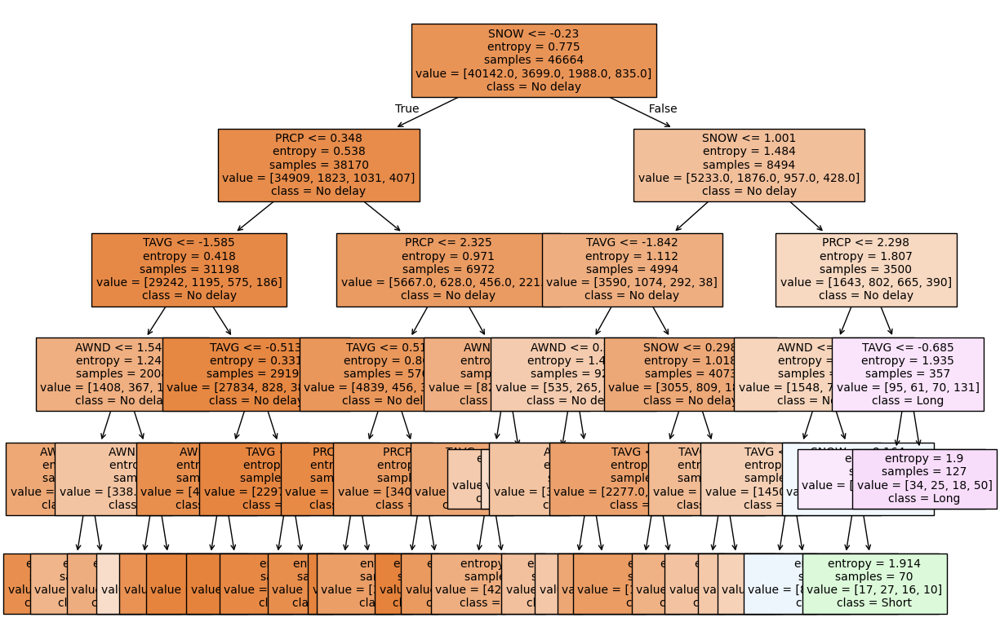

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

# ── Load data ───────────────────────────────────────────────
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

# Add AWND (average wind speed) to weather variables
weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars)

# ── Define target: classify delay duration ──────────────────
# Example bins: 0 = no delay, 1 = short (<30 min), 2 = medium (30–90), 3 = long (>90)
bins = [-1, 0, 30, 90, np.inf]
labels = [0, 1, 2, 3]
df['delay_class'] = pd.cut(df['WEATHER_DELAY'], bins=bins, labels=labels)

# ── Features and target ─────────────────────────────────────
X = df[weather_vars].values
y = df['delay_class'].astype(int)

# ── Scale features ──────────────────────────────────────────
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ── Train/test split ────────────────────────────────────────
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.3, random_state=42, stratify=y)

# ── Decision Tree Classifier ────────────────────────────────
tree_clf = DecisionTreeClassifier(
    criterion="entropy", max_depth=5, random_state=42)
tree_clf.fit(X_train, y_train)

# ── Evaluate ────────────────────────────────────────────────
acc = tree_clf.score(X_test, y_test)
print(f"Decision Tree accuracy: {acc:.2f}")

# ── Feature importance ──────────────────────────────────────
importances = tree_clf.feature_importances_
for feat, imp in zip(weather_vars, importances):
    print(f"{feat:5s} importance: {imp:.3f}")

# ── Visualize tree ──────────────────────────────────────────
plt.figure(figsize=(14,10))
plot_tree(tree_clf, feature_names=weather_vars,
          class_names=["No delay","Short","Medium","Long"],
          filled=True, fontsize=10)
plt.show()



Human readable rules with thresholds in RAW units:


Root split feature: SNOW
Root threshold in standardized units: -0.144
Root threshold in raw units: 0.150


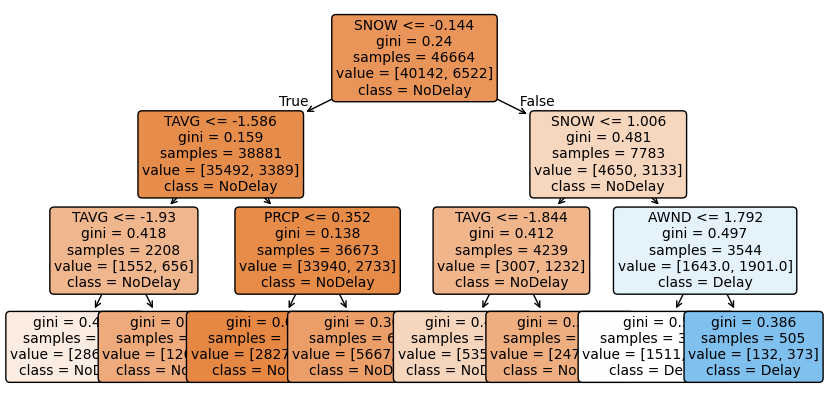


Feature means and standard deviations in raw units:
   feature  mean_raw  std_raw
0    TAVG    48.487   23.315
1    SNOW     0.312    1.131
2    PRCP     0.171    0.365
3    AWND    10.123    3.712


In [4]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, _tree, plot_tree
import matplotlib.pyplot as plt

# Load data
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['is_delayed'] = (df['WEATHER_DELAY'] > 0).astype(int)

# Features and target (raw units)
X_raw = df[weather_vars].values
y = df['is_delayed'].values

# Train/test split on raw data
X_train_raw, X_test_raw, y_train, y_test = train_test_split(
    X_raw, y, test_size=0.3, random_state=42, stratify=y)

# Fit scaler on training raw data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train_raw)
X_test  = scaler.transform(X_test_raw)

# Small, practical tree
clf = DecisionTreeClassifier(max_depth=3, min_samples_leaf=80, random_state=42)
clf.fit(X_train, y_train)

# Utility to convert a standardized threshold back to raw units
def z_to_raw(z_value, feat_idx, scaler):
    mu = scaler.mean_[feat_idx]
    sigma = scaler.scale_[feat_idx]
    return z_value * sigma + mu

# Print human-readable rules with raw thresholds
def print_tree_rules_in_raw(tree, feature_names, scaler):
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold

    def recurse(node, depth=0):
        indent = "  " * depth
        if feature[node] != _tree.TREE_UNDEFINED:
            fidx = feature[node]
            z_thresh = threshold[node]
            raw_thresh = z_to_raw(z_thresh, fidx, scaler)
            fname = feature_names[fidx]
            print(f"{indent}if {fname} <= {raw_thresh:.3f}:")
            recurse(tree_.children_left[node], depth+1)
            print(f"{indent}else:  # {fname} > {raw_thresh:.3f}")
            recurse(tree_.children_right[node], depth+1)
        else:
            vals = tree_.value[node][0]
            n_no, n_yes = int(vals[0]), int(vals[1])
            total = n_no + n_yes
            rate = n_yes / total if total>0 else 0.0
            print(f"{indent}→ LEAF n={total}, delay_rate={rate:.3f}")

print("\nHuman readable rules with thresholds in RAW units:\n")
print_tree_rules_in_raw(clf, weather_vars, scaler)

# Example: convert a single standardized threshold from the tree root to raw
root_node = 0
root_feat = clf.tree_.feature[root_node]
root_z = clf.tree_.threshold[root_node]
print(f"\nRoot split feature: {weather_vars[root_feat]}")
print(f"Root threshold in standardized units: {root_z:.3f}")
print(f"Root threshold in raw units: {z_to_raw(root_z, root_feat, scaler):.3f}")

# Visualize small tree for reference
plt.figure(figsize=(10,5))
plot_tree(clf, feature_names=weather_vars, class_names=['NoDelay','Delay'],
          filled=True, rounded=True, fontsize=10)
plt.show()

# Convert model-level summaries back to raw units for reporting
# Example: feature means and stds
feat_summary = pd.DataFrame({
    'feature': weather_vars,
    'mean_raw': scaler.mean_,
    'std_raw': scaler.scale_
})
print("\nFeature means and standard deviations in raw units:\n", feat_summary.round(3))


In [ ]:
# Actionable decision-tree rules + expected delays (raw units)
# Run in one cell. Requires: pandas, numpy, sklearn, matplotlib, seaborn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.metrics import roc_auc_score

# -------------------------
# 1. Load & prepare data
# -------------------------
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)
df['is_delayed'] = (df['delay_minutes'] > 0).astype(int)

# -------------------------
# 2. Train a small tree
# -------------------------
X_raw = df[weather_vars].values
y = df['is_delayed'].values

X_train_raw, X_test_raw, y_train, y_test = train_test_split(
    X_raw, y, test_size=0.3, random_state=42, stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train_raw)
X_test  = scaler.transform(X_test_raw)

clf = DecisionTreeClassifier(
    criterion='entropy',
    max_depth=3,
    min_samples_leaf=80,
    class_weight='balanced',
    random_state=42
)
clf.fit(X_train, y_train)

# quick check
y_proba = clf.predict_proba(X_test)[:,1]
print("Test ROC AUC:", round(roc_auc_score(y_test, y_proba), 3))
print("Test accuracy:", round(clf.score(X_test, y_test), 3))

# -------------------------
# 3. Helper: convert z -> raw
# -------------------------
def z_to_raw(z_value, feat_idx, scaler):
    return z_value * scaler.scale_[feat_idx] + scaler.mean_[feat_idx]

# -------------------------
# 4. Extract leaf stats (raw units)
# -------------------------
# Map every original row to a leaf (use scaler + clf)
X_all_scaled = scaler.transform(df[weather_vars].values)
df['leaf'] = clf.apply(X_all_scaled)

leaf_stats = df.groupby('leaf').agg(
    n_samples=('is_delayed','size'),
    n_delayed=('is_delayed','sum'),
    mean_delay_given_delay=('delay_minutes', lambda s: s[s>0].mean() if (s>0).sum()>0 else np.nan),
    mean_delay_unconditional=('delay_minutes','mean'),
    TAVG_mean=('TAVG','mean'),
    SNOW_mean=('SNOW','mean'),
    PRCP_mean=('PRCP','mean'),
    AWND_mean=('AWND','mean')
).reset_index()

leaf_stats['delay_rate'] = leaf_stats['n_delayed'] / leaf_stats['n_samples']
leaf_stats = leaf_stats[leaf_stats['n_samples'] >= 50].copy()
leaf_stats = leaf_stats.sort_values('mean_delay_unconditional', ascending=False)

# -------------------------
# 5. Build readable rule text for each leaf (raw thresholds)
# -------------------------
def node_descendants(tree_, node):
    nodes = set()
    stack = [node]
    while stack:
        n = stack.pop()
        nodes.add(n)
        if tree_.children_left[n] != _tree.TREE_UNDEFINED:
            stack.append(tree_.children_left[n])
        if tree_.children_right[n] != _tree.TREE_UNDEFINED:
            stack.append(tree_.children_right[n])
    return nodes

def leaf_rule_text(tree, leaf_node, feature_names, scaler):
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold

    constraints = []
    def recurse(node):
        if node == leaf_node:
            return True
        if feature[node] == _tree.TREE_UNDEFINED:
            return False
        left = tree_.children_left[node]
        right = tree_.children_right[node]
        # if leaf is in left subtree
        if leaf_node in node_descendants(tree_, left):
            fidx = feature[node]
            raw_thresh = z_to_raw(threshold[node], fidx, scaler)
            constraints.append(f"{feature_names[fidx]} <= {raw_thresh:.3f}")
            return recurse(left)
        elif leaf_node in node_descendants(tree_, right):
            fidx = feature[node]
            raw_thresh = z_to_raw(threshold[node], fidx, scaler)
            constraints.append(f"{feature_names[fidx]} > {raw_thresh:.3f}")
            return recurse(right)
        else:
            return False

    ok = recurse(0)
    if not ok:
        return "rule not found"
    return " AND ".join(constraints)

# Build top rules table (top 8 by unconditional mean delay)
top_leaves = leaf_stats.head(8).copy()
rows = []
for _, r in top_leaves.iterrows():
    lid = int(r['leaf'])
    rule = leaf_rule_text(clf, lid, weather_vars, scaler)
    rows.append({
        'leaf': lid,
        'rule': rule,
        'n_samples': int(r['n_samples']),
        'delay_rate': round(r['delay_rate'],3),
        'mean_delay_given_delay': round(r['mean_delay_given_delay'] if not np.isnan(r['mean_delay_given_delay']) else df.loc[df['delay_minutes']>0,'delay_minutes'].mean(),2),
        'mean_delay_unconditional': round(r['mean_delay_unconditional'],2),
        'TAVG_mean': round(r['TAVG_mean'],2),
        'SNOW_mean': round(r['SNOW_mean'],2),
        'PRCP_mean': round(r['PRCP_mean'],2),
        'AWND_mean': round(r['AWND_mean'],2)
    })
top_rules_df = pd.DataFrame(rows)

# Print compact, human-readable rules (one sentence per rule)
print("\nTop actionable combinations (human-readable):\n")
for i, row in top_rules_df.iterrows():
    print(f"Rule {i+1}: IF {row['rule']} → n={row['n_samples']}, delay_rate={row['delay_rate']:.2f}, "
          f"E[delay|delay>0]={row['mean_delay_given_delay']:.1f} min, E[delay]={row['mean_delay_unconditional']:.1f} min. "
          f"(avg TAVG={row['TAVG_mean']}°F, SNOW={row['SNOW_mean']}in, PRCP={row['PRCP_mean']}in, AWND={row['AWND_mean']}mph)")

# Save CSV for easy copy/paste
top_rules_df.to_csv('top_actionable_rules_readable.csv', index=False)

# -------------------------
# 6. Plots: bar chart + heatmaps + tree
# -------------------------
# Bar chart of top leaves by unconditional mean delay
plt.figure(figsize=(10,5))
sns.barplot(x='mean_delay_unconditional', y='leaf', data=top_rules_df, palette='magma', orient='h')
for idx, r in top_rules_df.iterrows():
    plt.text(r['mean_delay_unconditional'] + 0.5, idx, f"rate={r['delay_rate']:.2f}, n={r['n_samples']}", va='center')
plt.xlabel('Mean unconditional delay (min)')
plt.ylabel('Leaf id')
plt.title('Top actionable leaves by unconditional mean delay')
plt.tight_layout()
plt.savefig('top_leaves_bar.png', dpi=150)
plt.show()

# Heatmaps across TAVG x SNOW grid (PRCP & AWND at medians)
prcp_med = df['PRCP'].median()
awnd_med = df['AWND'].median()
tavg_vals = np.linspace(df['TAVG'].quantile(0.01), df['TAVG'].quantile(0.99), 120)
snow_vals = np.linspace(df['SNOW'].quantile(0.01), df['SNOW'].quantile(0.99), 120)

grid = np.array([[t,s,prcp_med,awnd_med] for t in tavg_vals for s in snow_vals])
grid_scaled = scaler.transform(grid)
p_delay_grid = clf.predict_proba(grid_scaled)[:,1]
leaf_for_point = clf.apply(grid_scaled)

leaf_to_mean_delay = leaf_stats.set_index('leaf')['mean_delay_given_delay'].to_dict()
global_mean_delay_given = df.loc[df['delay_minutes']>0, 'delay_minutes'].mean()
mean_delay_given_grid = np.array([leaf_to_mean_delay.get(l, np.nan) for l in leaf_for_point])
mean_delay_given_grid = np.where(np.isnan(mean_delay_given_grid), global_mean_delay_given, mean_delay_given_grid)
expected_delay_grid = p_delay_grid * mean_delay_given_grid

p_grid = p_delay_grid.reshape(len(tavg_vals), len(snow_vals))
exp_grid = expected_delay_grid.reshape(len(tavg_vals), len(snow_vals))

# P(delay) heatmap
plt.figure(figsize=(10,8))
sns.heatmap(p_grid, xticklabels=np.round(snow_vals,2)[::10], yticklabels=np.round(tavg_vals,2)[::10],
            cmap='viridis', cbar_kws={'label':'P(delay)'}, vmin=0, vmax=1)
plt.xlabel('SNOW (inches)')
plt.ylabel('TAVG (°F)')
plt.title('Predicted P(delay) across TAVG × SNOW (PRCP & AWND at median)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig('p_delay_heatmap.png', dpi=150)
plt.show()

# Expected unconditional delay heatmap
plt.figure(figsize=(10,8))
sns.heatmap(exp_grid, xticklabels=np.round(snow_vals,2)[::10], yticklabels=np.round(tavg_vals,2)[::10],
            cmap='magma', cbar_kws={'label':'Expected delay (min)'}, vmin=0)
plt.xlabel('SNOW (inches)')
plt.ylabel('TAVG (°F)')
plt.title('Expected unconditional delay (min) across TAVG × SNOW')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig('expected_delay_heatmap.png', dpi=150)
plt.show()

# Decision tree plot
plt.figure(figsize=(12,6))
plot_tree(clf, feature_names=weather_vars, class_names=['NoDelay','Delay'], filled=True, rounded=True, fontsize=10)
plt.title('Decision Tree (max_depth=3)')
plt.tight_layout()
plt.savefig('tree_plot.png', dpi=150)
plt.show()

# -------------------------
# 7. Final compact table printed (CSV-like)
# -------------------------
print("\nCompact table (top actionable rules):")
print(top_rules_df[['leaf','rule','n_samples','delay_rate','mean_delay_given_delay','mean_delay_unconditional',
                    'TAVG_mean','SNOW_mean','PRCP_mean','AWND_mean']].to_string(index=False))


Best params: {'clf__criterion': 'entropy', 'clf__max_depth': 8, 'clf__min_samples_leaf': 10}
Test ROC AUC: 0.848
Test accuracy: 0.87
TAVG   importance: 0.271
SNOW   importance: 0.475
PRCP   importance: 0.166
AWND   importance: 0.088


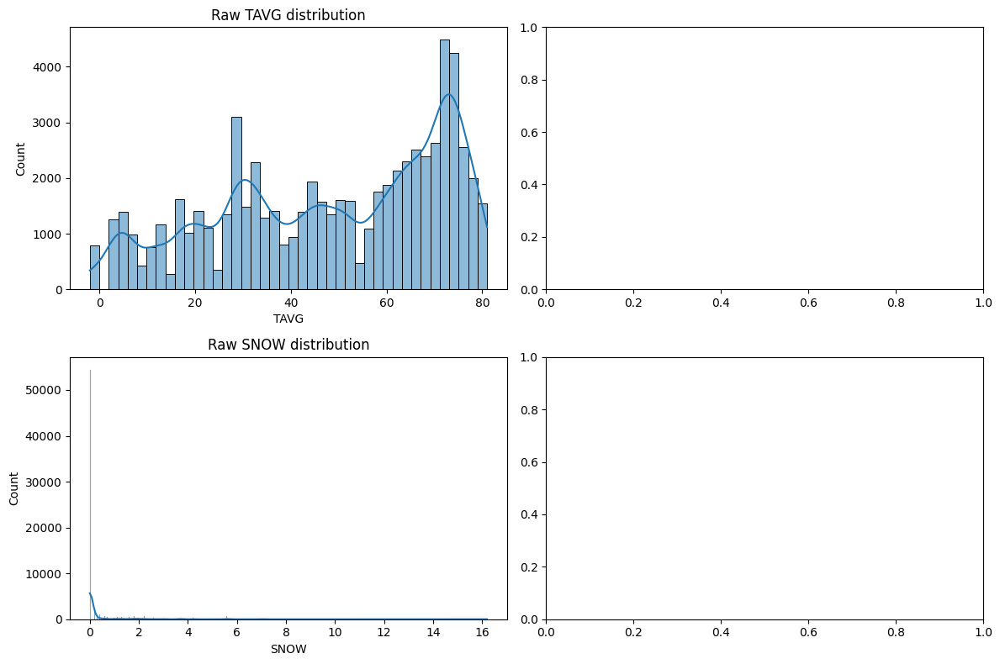

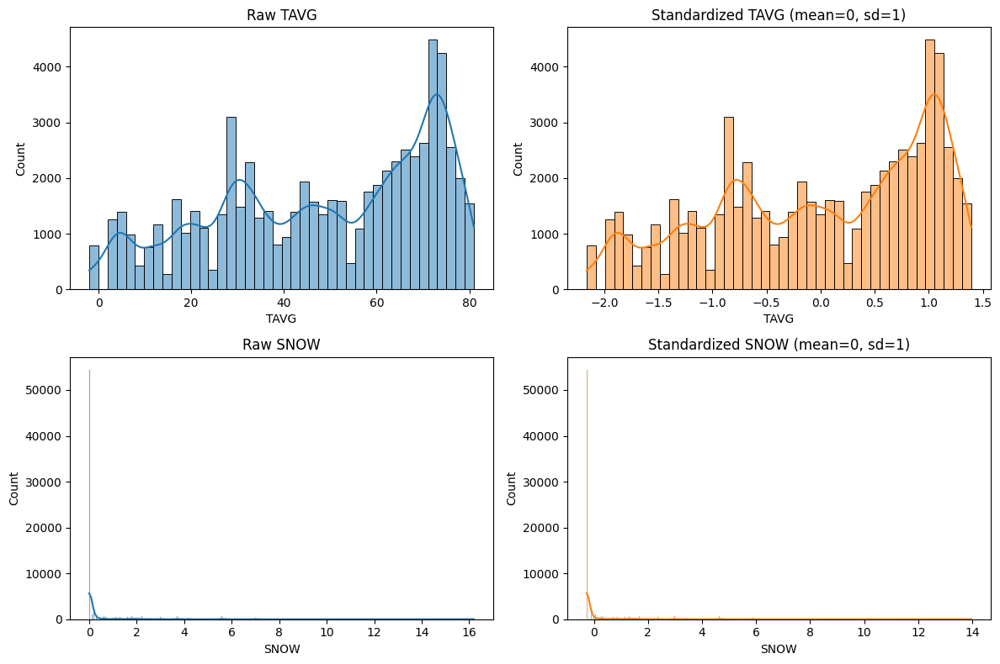

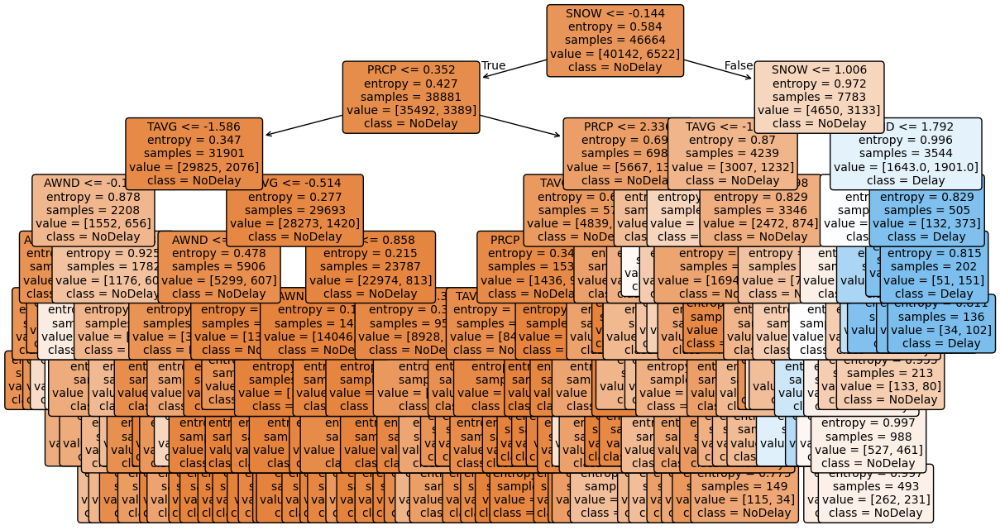


Decision rules (text):

|--- SNOW <= -0.14
|   |--- PRCP <= 0.35
|   |   |--- TAVG <= -1.59
|   |   |   |--- AWND <= -0.20
|   |   |   |   |--- AWND <= -0.41
|   |   |   |   |   |--- TAVG <= -1.72
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- TAVG >  -1.72
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- AWND >  -0.41
|   |   |   |   |   |--- class: 0
|   |   |   |--- AWND >  -0.20
|   |   |   |   |--- TAVG <= -1.93
|   |   |   |   |   |--- TAVG <= -2.06
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- TAVG >  -2.06
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- TAVG >  -1.93
|   |   |   |   |   |--- AWND <= 0.26
|   |   |   |   |   |   |--- TAVG <= -1.76
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- TAVG >  -1.76
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- AWND >  0.26
|   |   |   |   |   |   |--- TAVG <= -1.67
|   |   |   |   |   |   |   |--- AWND <= 0.89
|   |   |   |   |   |   |   

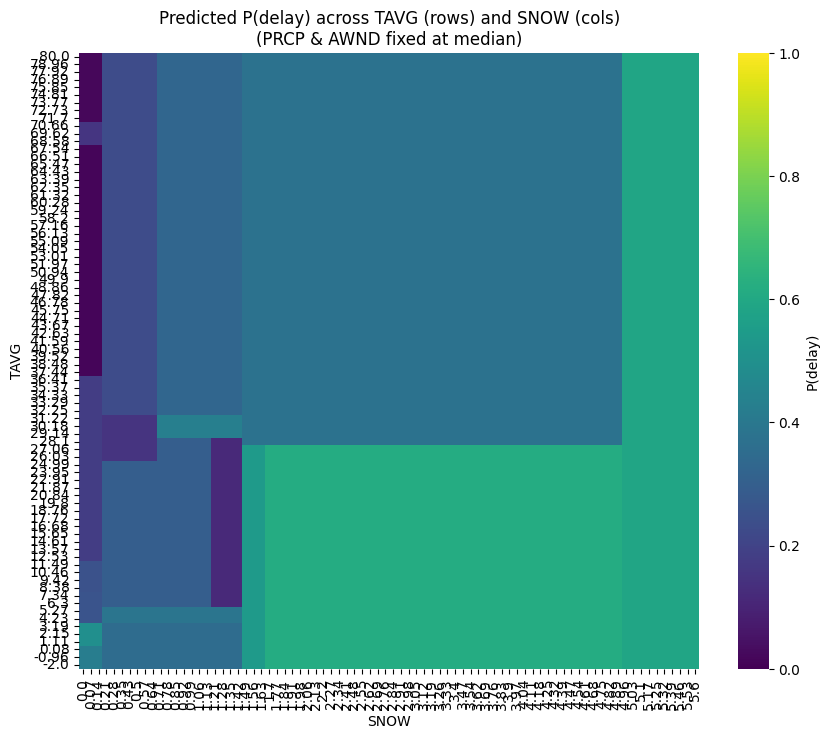

In [3]:
# Comprehensive diagnostic + decision-tree workflow
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.pipeline import Pipeline

# ── Load data (same sources as your reference) ─────────────────────────────
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

# include AWND now
weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()

# ── Quick diagnostics: raw distributions and standardized ────────────────
def plot_distributions(df, cols):
    fig, axes = plt.subplots(len(cols), 2, figsize=(12, 4*len(cols)))
    for i, c in enumerate(cols):
        sns.histplot(df[c], kde=True, ax=axes[i,0], color='C0')
        axes[i,0].set_title(f"Raw {c} distribution")
    plt.tight_layout()

plot_distributions(df, ['TAVG','SNOW'])

# Standardize and show distributions again
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[weather_vars] = scaler.fit_transform(df[weather_vars])

def plot_std_vs_raw(df_raw, df_std, cols):
    fig, axes = plt.subplots(len(cols), 2, figsize=(12, 4*len(cols)))
    for i, c in enumerate(cols):
        sns.histplot(df_raw[c], kde=True, ax=axes[i,0], color='C0')
        axes[i,0].set_title(f"Raw {c}")
        sns.histplot(df_std[c], kde=True, ax=axes[i,1], color='C1')
        axes[i,1].set_title(f"Standardized {c} (mean=0, sd=1)")
    plt.tight_layout()

plot_std_vs_raw(df, df_scaled, ['TAVG','SNOW'])

# ── Target: binary delayed or not (you can change to multi-class if desired) ─
df['is_delayed'] = (df['WEATHER_DELAY'] > 0).astype(int)
X = df[weather_vars].values
y = df['is_delayed'].values

# ── Train/test split (stratify to keep class balance) ───────────────────────
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y)

# ── Pipeline: scaler + decision tree ───────────────────────────────────────
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', DecisionTreeClassifier(random_state=42))
])

# Grid search to find a compact, interpretable tree
param_grid = {
    'clf__criterion': ['gini','entropy'],
    'clf__max_depth': [2,3,4,5,6,8],
    'clf__min_samples_leaf': [10,20,50,100]
}
gs = GridSearchCV(pipe, param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
gs.fit(X_train, y_train)

print("Best params:", gs.best_params_)
best_model = gs.best_estimator_
print("Test ROC AUC:", round(gs.score(X_test, y_test), 3))
print("Test accuracy:", round(best_model.score(X_test, y_test), 3))

# ── Feature importances ───────────────────────────────────────────────────
feat_names = weather_vars
importances = best_model.named_steps['clf'].feature_importances_
for f, imp in zip(feat_names, importances):
    print(f"{f:6s} importance: {imp:.3f}")

# ── Visualize the tree ────────────────────────────────────────────────────
plt.figure(figsize=(14,8))
plot_tree(best_model.named_steps['clf'],
          feature_names=feat_names,
          class_names=['NoDelay','Delay'],
          filled=True, rounded=True, fontsize=10)
plt.show()

# ── Extract textual rules and leaf statistics ──────────────────────────────
tree = best_model.named_steps['clf']
r = export_text(tree, feature_names=feat_names)
print("\nDecision rules (text):\n")
print(r)

# Map each training sample to a leaf and compute leaf-level delay rates
leaf_ids = tree.apply(best_model.named_steps['scaler'].transform(X_train))
leaf_df = pd.DataFrame({'leaf': leaf_ids, 'is_delayed': y_train})
leaf_stats = leaf_df.groupby('leaf').agg(
    n_samples=('is_delayed','size'),
    n_delayed=('is_delayed','sum'),
)
leaf_stats['delay_rate'] = leaf_stats['n_delayed'] / leaf_stats['n_samples']
leaf_stats = leaf_stats.sort_values('delay_rate', ascending=False)
print("\nLeaf-level stats (top leaves by delay rate):\n", leaf_stats.head(10))

# ── Find leaf rules with high delay probability (e.g., > 0.5) ─────────────
high_risk_leaves = leaf_stats[leaf_stats['delay_rate'] > 0.5].index.tolist()
if high_risk_leaves:
    print("\nHigh-risk leaf ids:", high_risk_leaves)
    # Print the rule for each high-risk leaf by traversing the tree
    from sklearn.tree import _tree
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold

    def node_rule(node, feature_names):
        if feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[feature[node]]
            thresh = threshold[node]
            left = node_rule(tree_.children_left[node], feature_names)
            right = node_rule(tree_.children_right[node], feature_names)
            return f"({name} <= {thresh:.3f}) -> {left} ; ({name} > {thresh:.3f}) -> {right}"
        else:
            return f"LEAF id={node}"
    # map leaf node ids to rules
    for leaf in high_risk_leaves:
        # find the corresponding tree node index for that leaf id
        # we can search for nodes with children == -1 and match leaf index order
        leaf_nodes = [i for i in range(tree_.node_count) if tree_.children_left[i] == -1]
        # find the node index corresponding to the leaf id (by order)
        # NOTE: sklearn's apply returns the node index directly, so we can use it:
        node_index = leaf
        print(f"\nLeaf node {node_index} rule (approx):")
        print(node_rule(0, feat_names))  # prints full rule tree; inspect manually
else:
    print("\nNo leaves with delay_rate > 0.5 found.")

# ── Heatmap: predicted P(delay) across TAVG x SNOW grid (hold PRCP/AWND fixed) ─
# choose representative PRCP and AWND (median)
prcp_med = df['PRCP'].median()
awnd_med = df['AWND'].median()

# create grid in raw units (not standardized) for interpretability
tavg_vals = np.linspace(df['TAVG'].quantile(0.01), df['TAVG'].quantile(0.99), 80)
snow_vals = np.linspace(df['SNOW'].quantile(0.01), df['SNOW'].quantile(0.99), 80)
grid = np.array([[t,s,prcp_med,awnd_med] for t in tavg_vals for s in snow_vals])

# predict probabilities (pipeline will scale)
probs = best_model.predict_proba(grid)[:,1]
prob_grid = probs.reshape(len(tavg_vals), len(snow_vals))

plt.figure(figsize=(10,8))
sns.heatmap(prob_grid, 
            xticklabels=np.round(snow_vals,2), 
            yticklabels=np.round(tavg_vals,2),
            cmap='viridis', cbar_kws={'label':'P(delay)'},
            vmax=1.0, vmin=0.0)
plt.xlabel('SNOW')
plt.ylabel('TAVG')
plt.title('Predicted P(delay) across TAVG (rows) and SNOW (cols)\n(PRCP & AWND fixed at median)')
plt.gca().invert_yaxis()
plt.show()



Human-readable rules (RAW units):


Root split feature: SNOW
Root threshold (RAW units): 0.150


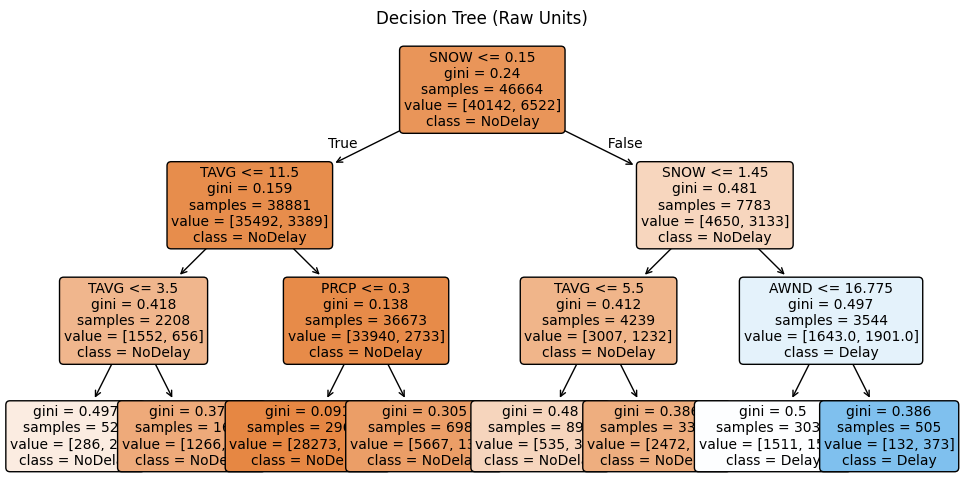


Feature summary (raw units):

     feature    mean     std
TAVG    TAVG  48.477  23.335
SNOW    SNOW   0.311   1.138
PRCP    PRCP   0.173   0.367
AWND    AWND  10.142   3.720


In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, _tree, plot_tree
import matplotlib.pyplot as plt

# Load data
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"

df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

# Features
weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']

# Clean data
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()

# Target variable
df['is_delayed'] = (df['WEATHER_DELAY'] > 0).astype(int)

# Features and target (RAW units only)
X = df[weather_vars].values
y = df['is_delayed'].values

# Train/test split (no scaling)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# Train decision tree (small + interpretable)
clf = DecisionTreeClassifier(
    max_depth=3,
    min_samples_leaf=80,
    random_state=42
)

clf.fit(X_train, y_train)

# ----------- PRINT HUMAN-READABLE RULES -----------

def print_tree_rules(tree, feature_names):
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold

    def recurse(node, depth=0):
        indent = "  " * depth
        if feature[node] != _tree.TREE_UNDEFINED:
            fname = feature_names[feature[node]]
            thresh = round(threshold[node], 3)

            print(f"{indent}if {fname} <= {thresh}:")
            recurse(tree_.children_left[node], depth + 1)

            print(f"{indent}else:  # {fname} > {thresh}")
            recurse(tree_.children_right[node], depth + 1)

        else:
            vals = tree_.value[node][0]
            n_no, n_yes = int(vals[0]), int(vals[1])
            total = n_no + n_yes
            rate = n_yes / total if total > 0 else 0.0

            print(f"{indent}→ LEAF: samples={total}, delay_rate={rate:.3f}")

print("\nHuman-readable rules (RAW units):\n")
print_tree_rules(clf, weather_vars)

# ----------- ROOT SPLIT INFO -----------

root_node = 0
root_feat = clf.tree_.feature[root_node]
root_thresh = clf.tree_.threshold[root_node]

print(f"\nRoot split feature: {weather_vars[root_feat]}")
print(f"Root threshold (RAW units): {root_thresh:.3f}")

# ----------- VISUALIZE TREE -----------

plt.figure(figsize=(12, 6))
plot_tree(
    clf,
    feature_names=weather_vars,
    class_names=['NoDelay', 'Delay'],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree (Raw Units)")
plt.show()

# ----------- FEATURE SUMMARY (RAW) -----------

feat_summary = pd.DataFrame({
    'feature': weather_vars,
    'mean': df[weather_vars].mean(),
    'std': df[weather_vars].std()
})

print("\nFeature summary (raw units):\n")
print(feat_summary.round(3))


=== TREE RULES (RAW UNITS) ===


=== RULES WITH ≥95% DELAY PROBABILITY ===

No rules found with ≥95% probability.


=== SINGLE VARIABLE THRESHOLDS (~95% DELAY) ===

TAVG: No single-variable threshold reaches 95%
SNOW: No single-variable threshold reaches 95%
PRCP: No single-variable threshold reaches 95%
AWND: No single-variable threshold reaches 95%

=== ROOT SPLIT ===
Feature: SNOW
Threshold: 0.150


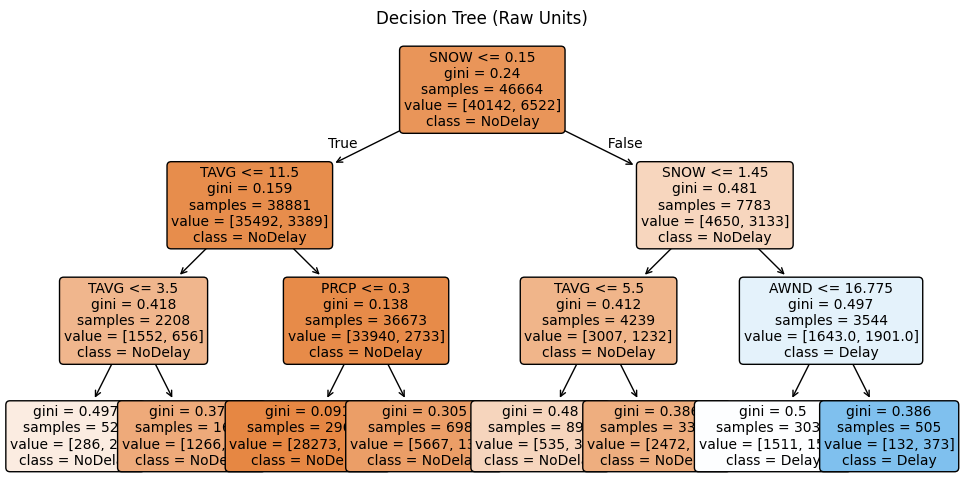


=== FEATURE SUMMARY (RAW UNITS) ===

     feature    mean     std   min    max
TAVG    TAVG  48.477  23.335 -2.00  81.00
SNOW    SNOW   0.311   1.138  0.00  16.20
PRCP    PRCP   0.173   0.367  0.00   2.56
AWND    AWND  10.142   3.720  2.24  23.49


In [4]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, _tree, plot_tree
import matplotlib.pyplot as plt

# -----------------------------
# LOAD + PREP DATA
# -----------------------------
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"

df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']

df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['is_delayed'] = (df['WEATHER_DELAY'] > 0).astype(int)

X = df[weather_vars].values
y = df['is_delayed'].values

# -----------------------------
# TRAIN MODEL (NO SCALING)
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

clf = DecisionTreeClassifier(
    max_depth=3,
    min_samples_leaf=80,
    random_state=42
)

clf.fit(X_train, y_train)

# -----------------------------
# PRINT TREE RULES
# -----------------------------
def print_tree_rules(tree, feature_names):
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold

    def recurse(node, depth=0):
        indent = "  " * depth

        if feature[node] != _tree.TREE_UNDEFINED:
            fname = feature_names[feature[node]]
            thresh = round(threshold[node], 3)

            print(f"{indent}if {fname} <= {thresh}:")
            recurse(tree_.children_left[node], depth + 1)

            print(f"{indent}else:  # {fname} > {thresh}")
            recurse(tree_.children_right[node], depth + 1)

        else:
            vals = tree_.value[node][0]
            n_no, n_yes = int(vals[0]), int(vals[1])
            total = n_no + n_yes
            rate = n_yes / total if total > 0 else 0.0

            print(f"{indent}→ LEAF: samples={total}, delay_rate={rate:.3f}")

print("\n=== TREE RULES (RAW UNITS) ===\n")
print_tree_rules(clf, weather_vars)

# -----------------------------
# EXTRACT ≥95% DELAY RULES
# -----------------------------
def extract_high_delay_rules(tree, feature_names, threshold=0.95):
    tree_ = tree.tree_
    feature = tree_.feature
    thresh = tree_.threshold

    results = []

    def recurse(node, conditions):
        if feature[node] != _tree.TREE_UNDEFINED:
            fname = feature_names[feature[node]]
            t = thresh[node]

            recurse(tree_.children_left[node],
                    conditions + [f"{fname} <= {t:.2f}"])

            recurse(tree_.children_right[node],
                    conditions + [f"{fname} > {t:.2f}"])

        else:
            vals = tree_.value[node][0]
            n_no, n_yes = int(vals[0]), int(vals[1])
            total = n_no + n_yes
            rate = n_yes / total if total > 0 else 0

            if rate >= threshold:
                results.append((conditions, rate, total))

    recurse(0, [])
    return results

rules_95 = extract_high_delay_rules(clf, weather_vars, threshold=0.95)

print("\n=== RULES WITH ≥95% DELAY PROBABILITY ===\n")
if len(rules_95) == 0:
    print("No rules found with ≥95% probability.\n")
else:
    for conds, rate, n in rules_95:
        print("IF " + " AND ".join(conds))
        print(f"→ delay probability = {rate:.3f}, samples = {n}\n")

# -----------------------------
# SINGLE FEATURE THRESHOLD (SIMULATION)
# -----------------------------
def find_threshold_for_feature(clf, feature_names, df, target_feature, prob_target=0.95):
    base = df[feature_names].mean().values.reshape(1, -1)
    f_idx = feature_names.index(target_feature)

    values = np.linspace(df[target_feature].min(),
                         df[target_feature].max(), 200)

    for v in values:
        test_point = base.copy()
        test_point[0, f_idx] = v

        prob = clf.predict_proba(test_point)[0][1]

        if prob >= prob_target:
            return v, prob

    return None, None

print("\n=== SINGLE VARIABLE THRESHOLDS (~95% DELAY) ===\n")

for feat in weather_vars:
    val, prob = find_threshold_for_feature(clf, weather_vars, df, feat, 0.95)

    if val is not None:
        print(f"{feat} ≈ {val:.2f} → delay probability ≈ {prob:.3f}")
    else:
        print(f"{feat}: No single-variable threshold reaches 95%")

# -----------------------------
# ROOT SPLIT INFO
# -----------------------------
root_node = 0
root_feat = clf.tree_.feature[root_node]
root_thresh = clf.tree_.threshold[root_node]

print(f"\n=== ROOT SPLIT ===")
print(f"Feature: {weather_vars[root_feat]}")
print(f"Threshold: {root_thresh:.3f}")

# -----------------------------
# VISUALIZE TREE
# -----------------------------
plt.figure(figsize=(12, 6))
plot_tree(
    clf,
    feature_names=weather_vars,
    class_names=['NoDelay', 'Delay'],
    filled=True,
    rounded=True,
    fontsize=10
)
plt.title("Decision Tree (Raw Units)")
plt.show()

# -----------------------------
# FEATURE SUMMARY
# -----------------------------
feat_summary = pd.DataFrame({
    'feature': weather_vars,
    'mean': df[weather_vars].mean(),
    'std': df[weather_vars].std(),
    'min': df[weather_vars].min(),
    'max': df[weather_vars].max()
})

print("\n=== FEATURE SUMMARY (RAW UNITS) ===\n")
print(feat_summary.round(3))


def plot_pairwise_boundary(clf, df, feature_names, f1, f2, prob_level=0.95):
    # Indices
    i1 = feature_names.index(f1)
    i2 = feature_names.index(f2)

    # Grid ranges
    x_vals = np.linspace(df[f1].min(), df[f1].max(), 100)
    y_vals = np.linspace(df[f2].min(), df[f2].max(), 100)

    xx, yy = np.meshgrid(x_vals, y_vals)

    # Base = mean values for all features
    base = df[feature_names].mean().values

    Z = np.zeros_like(xx)

    for i in range(xx.shape[0]):
        for j in range(xx.shape[1]):
            point = base.copy()
            point[i1] = xx[i, j]
            point[i2] = yy[i, j]

            prob = clf.predict_proba(point.reshape(1, -1))[0][1]
            Z[i, j] = prob

    # Plot
    plt.figure(figsize=(8, 6))

    # Heatmap
    plt.contourf(xx, yy, Z, levels=20)
    plt.colorbar(label="Delay Probability")

    # 95% contour line
    contour = plt.contour(xx, yy, Z, levels=[prob_level])
    plt.clabel(contour, fmt={prob_level: f"{int(prob_level*100)}%"})

    plt.xlabel(f1)
    plt.ylabel(f2)
    plt.title(f"{f1} vs {f2} → Delay Probability")

    plt.show()

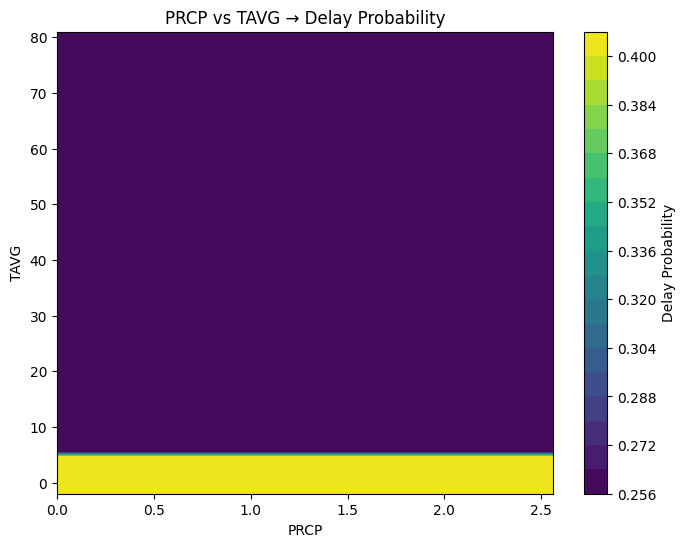

In [8]:
plot_pairwise_boundary(clf, df, weather_vars, 'PRCP', 'TAVG', prob_level=0.75)

In [ ]:
# Visuals for multiclass decision tree: tree + single-variable effects + pairwise heatmaps
# Saves: tree_delay_bins.png, <feature>_single_effect.png, pair_<f1>_<f2>.png
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.metrics import classification_report

# -------------------------
# Load and prepare (same bins as before)
# -------------------------
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)

bins = [-0.1, 0.0, 30.0, 60.0, 120.0, np.inf]
labels = ['NoDelay', '0-30', '30-60', '60-120', '>120']
df['delay_bin'] = pd.cut(df['delay_minutes'], bins=bins, labels=labels, ordered=True)
class_map = {lab: i for i, lab in enumerate(labels)}
df['y'] = df['delay_bin'].map(class_map).astype(int)

# -------------------------
# Train small tree (raw units)
# -------------------------
X = df[weather_vars].values
y = df['y'].values
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)
clf = DecisionTreeClassifier(max_depth=3, min_samples_leaf=80, random_state=42)
clf.fit(X_train, y_train)

print("Classification report (test):")
print(classification_report(y_test, clf.predict(X_test), target_names=labels, zero_division=0))

# -------------------------
# Utility: P(any delay) from multiclass predict_proba
# -------------------------
def prob_any_delay(proba_array):
    # proba_array shape (n_samples, n_classes)
    # classes: 0 = NoDelay, 1.. = delay bins
    return proba_array[:, 1:].sum(axis=1)

# -------------------------
# 1) Decision tree plot (raw units)
# -------------------------
plt.figure(figsize=(12,6))
plot_tree(clf, feature_names=weather_vars, class_names=labels, filled=True, rounded=True, fontsize=10)
plt.title('Decision Tree for Delay Bins (max_depth=3)')
plt.tight_layout()
plt.savefig('tree_delay_bins.png', dpi=150)
plt.show()

# -------------------------
# 2) Single-variable effect plots (P(any delay) vs feature)
# -------------------------
def plot_single_effect_any_delay(clf, df, feature_names, feature, prob_level=0.95, save=True):
    f_idx = feature_names.index(feature)
    x_vals = np.linspace(df[feature].min(), df[feature].max(), 300)
    base = df[feature_names].mean().values.reshape(1, -1)
    probs = []
    for x in x_vals:
        point = base.copy()
        point[0, f_idx] = x
        p_any = prob_any_delay(clf.predict_proba(point))[0]
        probs.append(p_any)
    plt.figure(figsize=(7,4))
    plt.plot(x_vals, probs, lw=2)
    plt.axhline(y=prob_level, linestyle='--', color='gray')
    plt.xlabel(feature)
    plt.ylabel("P(any delay)")
    plt.title(f"{feature} → P(any delay)")
    plt.grid(alpha=0.25)
    if save:
        fname = f"{feature}_single_effect.png"
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

for feat in weather_vars:
    plot_single_effect_any_delay(clf, df, weather_vars, feat, prob_level=0.95, save=True)

# -------------------------
# 3) Pairwise heatmaps + 95% contour (P(any delay))
# -------------------------
def plot_pairwise_any_delay(clf, df, feature_names, f1, f2, prob_level=0.95, save=True):
    i1 = feature_names.index(f1)
    i2 = feature_names.index(f2)
    x_vals = np.linspace(df[f1].quantile(0.01), df[f1].quantile(0.99), 120)
    y_vals = np.linspace(df[f2].quantile(0.01), df[f2].quantile(0.99), 120)
    xx, yy = np.meshgrid(x_vals, y_vals)
    base = df[feature_names].mean().values
    Z = np.zeros_like(xx)
    # vectorize by building grid points
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]
    proba = clf.predict_proba(grid)
    Z_flat = prob_any_delay(proba)
    Z = Z_flat.reshape(xx.shape)
    plt.figure(figsize=(8,6))
    cmap = plt.get_cmap('viridis')
    cf = plt.contourf(xx, yy, Z, levels=25, cmap=cmap)
    cbar = plt.colorbar(cf)
    cbar.set_label('P(any delay)')
    # 95% contour
    cs = plt.contour(xx, yy, Z, levels=[prob_level], colors='red', linewidths=1.5)
    if len(cs.allsegs[0])>0:
        plt.clabel(cs, fmt={prob_level: f"{int(prob_level*100)}%"}, inline=True, fontsize=9)
    plt.xlabel(f1)
    plt.ylabel(f2)
    plt.title(f"{f1} vs {f2} → P(any delay) (others at median)")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    if save:
        fname = f"pair_{f1}_{f2}.png".replace(' ', '_')
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

pairs = list(combinations(weather_vars, 2))
for f1, f2 in pairs:
    plot_pairwise_any_delay(clf, df, weather_vars, f1, f2, prob_level=0.95, save=True)

# -------------------------
# 4) Optional: show pairwise boundaries as small multiples
# -------------------------
plt.figure(figsize=(12, 8))
for idx, (f1, f2) in enumerate(pairs, 1):
    plt.subplot(3, 2, idx)
    i1 = weather_vars.index(f1)
    i2 = weather_vars.index(f2)
    x_vals = np.linspace(df[f1].quantile(0.05), df[f1].quantile(0.95), 80)
    y_vals = np.linspace(df[f2].quantile(0.05), df[f2].quantile(0.95), 80)
    xx, yy = np.meshgrid(x_vals, y_vals)
    base = df[weather_vars].mean().values
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]
    Z = prob_any_delay(clf.predict_proba(grid)).reshape(xx.shape)
    plt.contourf(xx, yy, Z, levels=20, cmap='viridis')
    plt.title(f"{f1} vs {f2}")
    plt.xlabel(f1); plt.ylabel(f2)
plt.tight_layout()
plt.savefig('pairwise_smallmultiples.png', dpi=150)
plt.show()


Original class counts:
delay_bin
NoDelay    57346
0-30        5284
30-60       2098
60-120      1178
>120         757
Name: count, dtype: int64

After downsampling NoDelay:
delay_bin
NoDelay    3534
0-30       5284
30-60      2098
60-120     1178
>120        757
Name: count, dtype: int64

Classification report (test, balanced training):
              precision    recall  f1-score   support

     NoDelay       0.72      0.42      0.53       884
        0-30       0.57      0.48      0.52      1321
       30-60       0.28      0.07      0.11       525
      60-120       0.11      0.34      0.17       294
        >120       0.16      0.46      0.23       189

    accuracy                           0.38      3213
   macro avg       0.37      0.35      0.31      3213
weighted avg       0.50      0.38      0.41      3213



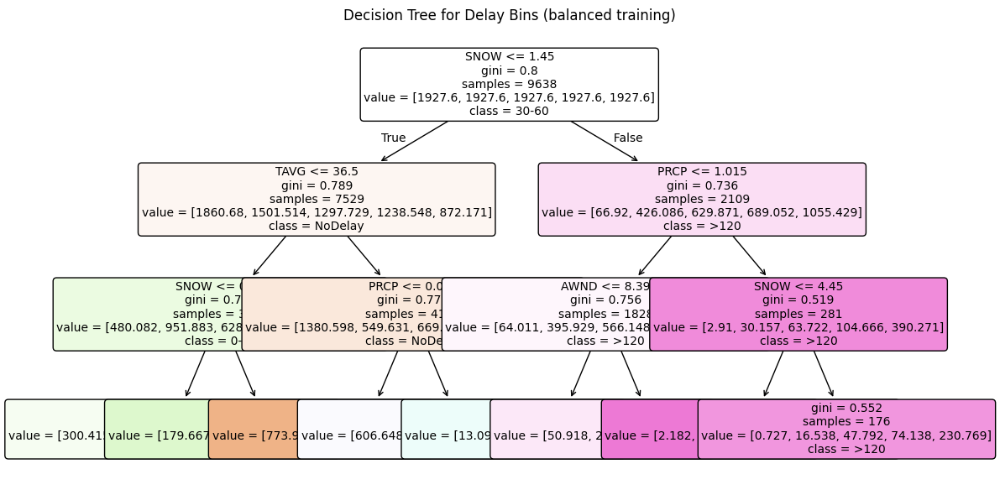

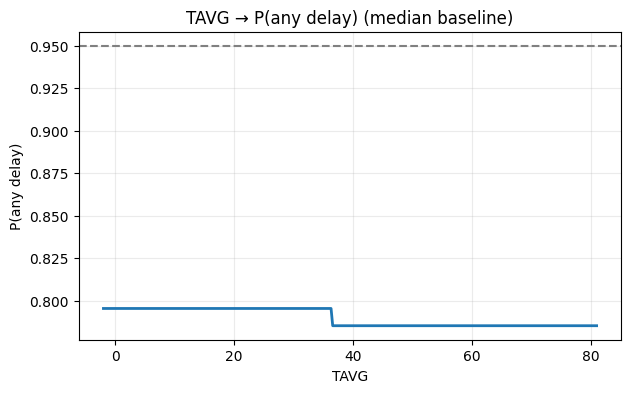

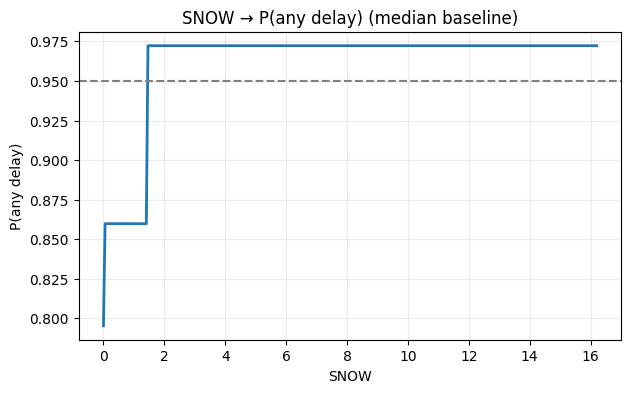

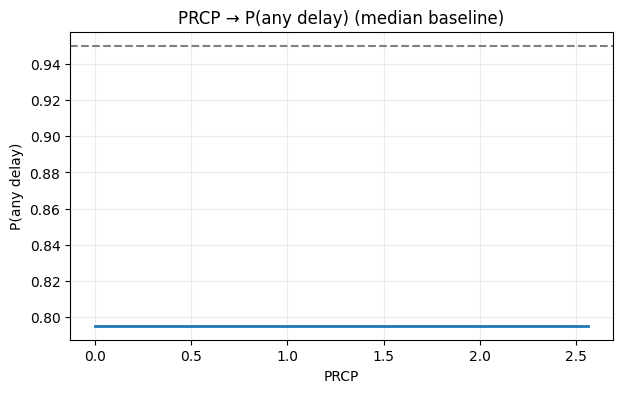

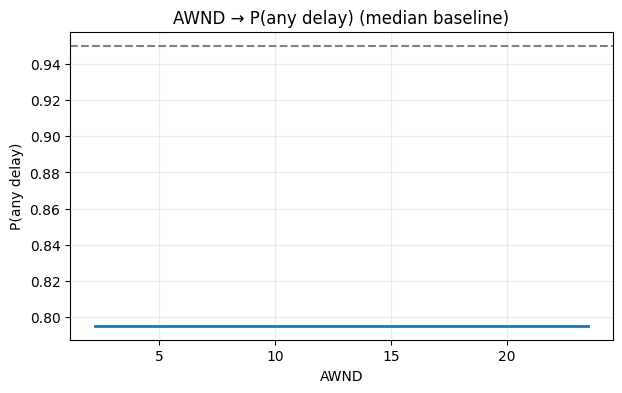

...

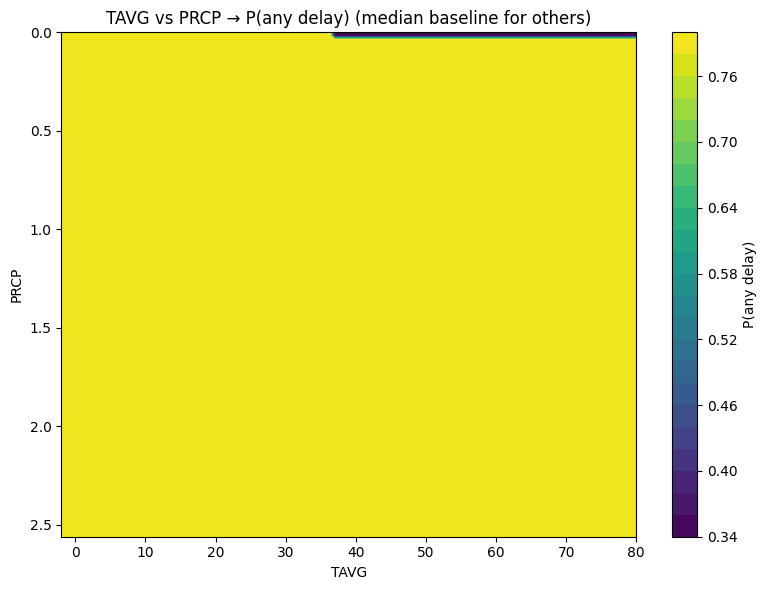

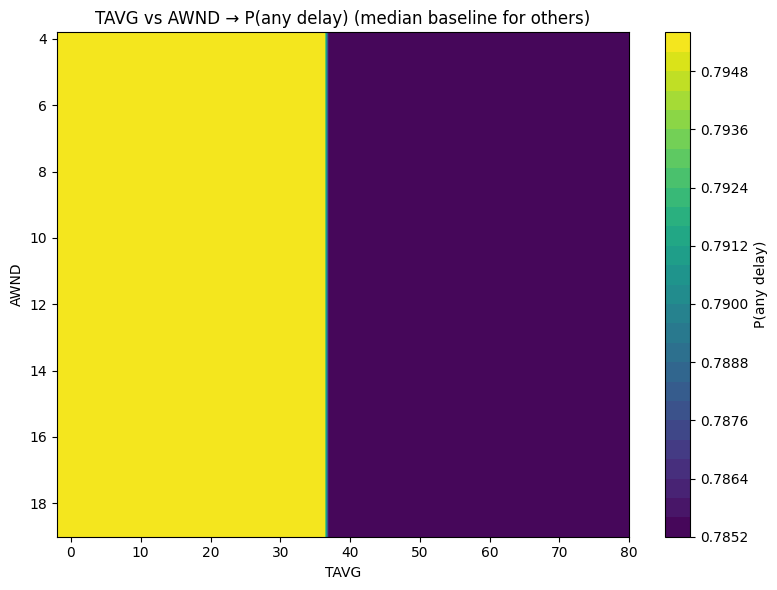

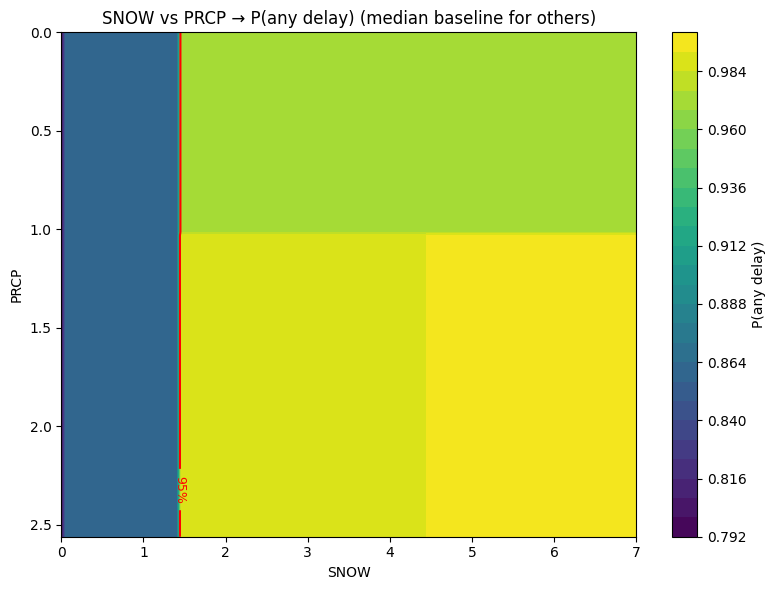

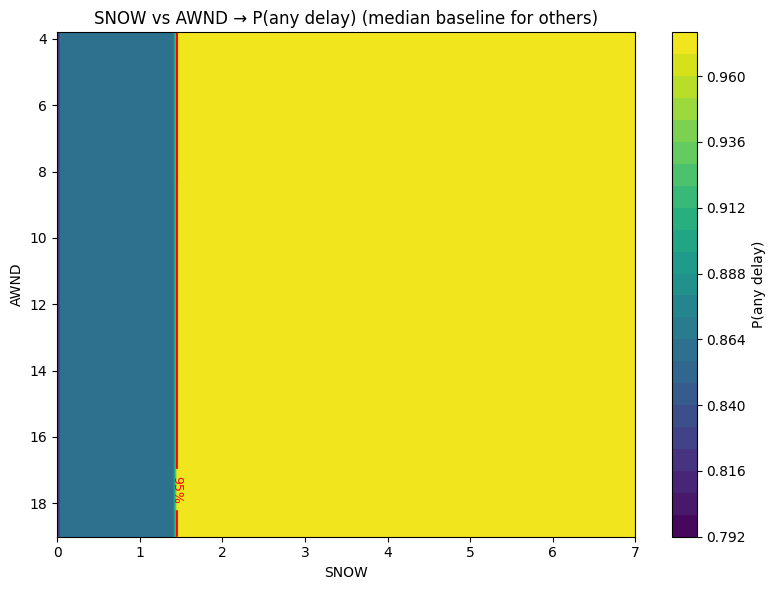

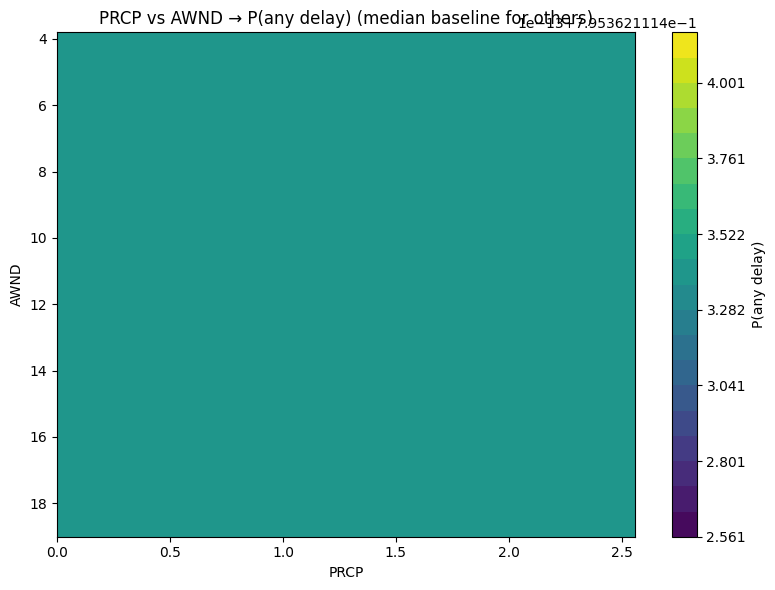


Top actionable leaves (balanced training):



KeyboardInterrupt: 

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.metrics import classification_report

# -------------------------
# 0. Settings you can tweak
# -------------------------
MAX_DEPTH = 3
MIN_SAMPLES_LEAF = 50   # smaller than before to allow more nuance after balancing
RANDOM_STATE = 42

# -------------------------
# 1. Load and bin delays
# -------------------------
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)

# Bins: NoDelay, 0-30, 30-60, 60-120, >120
bins = [-0.1, 0.0, 30.0, 60.0, 120.0, np.inf]
labels = ['NoDelay', '0-30', '30-60', '60-120', '>120']
df['delay_bin'] = pd.cut(df['delay_minutes'], bins=bins, labels=labels, ordered=True)
class_map = {lab: i for i, lab in enumerate(labels)}
df['y'] = df['delay_bin'].map(class_map).astype(int)

print("Original class counts:")
print(df['delay_bin'].value_counts().reindex(labels))

# -------------------------
# 2. Controlled downsampling of NoDelay
# -------------------------
# Keep all delayed rows, downsample NoDelay to at most `downsample_target` samples
delayed_df = df[df['y'] != 0].copy()
no_delay_df = df[df['y'] == 0].copy()

# Choose downsample target: e.g., 3x the median class size among delayed classes (tunable)
delayed_counts = delayed_df['delay_bin'].value_counts()
median_delayed = int(np.median(delayed_counts.values))
downsample_target = max(median_delayed * 3, 500)  # ensure a reasonable floor

if len(no_delay_df) > downsample_target:
    no_delay_sampled = no_delay_df.sample(n=downsample_target, random_state=RANDOM_STATE)
else:
    no_delay_sampled = no_delay_df.copy()

balanced_df = pd.concat([delayed_df, no_delay_sampled], ignore_index=True).sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)

print("\nAfter downsampling NoDelay:")
print(balanced_df['delay_bin'].value_counts().reindex(labels))

# -------------------------
# 3. Train/test split (on balanced data)
# -------------------------
X = balanced_df[weather_vars].values
y = balanced_df['y'].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=RANDOM_STATE, stratify=y
)

# -------------------------
# 4. Train tree with class_weight balanced
# -------------------------
clf = DecisionTreeClassifier(
    max_depth=MAX_DEPTH,
    min_samples_leaf=MIN_SAMPLES_LEAF,
    class_weight='balanced',
    random_state=RANDOM_STATE
)
clf.fit(X_train, y_train)

print("\nClassification report (test, balanced training):")
print(classification_report(y_test, clf.predict(X_test), target_names=labels, zero_division=0))

# -------------------------
# 5. Decision tree plot (raw units)
# -------------------------
plt.figure(figsize=(12,6))
plot_tree(clf, feature_names=weather_vars, class_names=labels, filled=True, rounded=True, fontsize=10)
plt.title('Decision Tree for Delay Bins (balanced training)')
plt.tight_layout()
plt.savefig('tree_delay_bins_balanced.png', dpi=150)
plt.show()

# -------------------------
# 6. Single-variable effect plots (P(any delay) vs feature)
# -------------------------
def prob_any_delay_from_proba(proba):
    return proba[:, 1:].sum(axis=1)

def plot_single_effect_any_delay(clf, df_ref, feature_names, feature, prob_level=0.95, save=True):
    f_idx = feature_names.index(feature)
    x_vals = np.linspace(df_ref[feature].min(), df_ref[feature].max(), 300)
    base = df_ref[feature_names].median().values.reshape(1, -1)  # use median baseline (less sensitive to skew)
    probs = []
    for x in x_vals:
        point = base.copy()
        point[0, f_idx] = x
        p_any = prob_any_delay_from_proba(clf.predict_proba(point))[0]
        probs.append(p_any)
    plt.figure(figsize=(7,4))
    plt.plot(x_vals, probs, lw=2)
    plt.axhline(y=prob_level, linestyle='--', color='gray')
    plt.xlabel(feature)
    plt.ylabel("P(any delay)")
    plt.title(f"{feature} → P(any delay) (median baseline)")
    plt.grid(alpha=0.25)
    if save:
        plt.savefig(f"{feature}_single_effect_balanced.png", dpi=150, bbox_inches='tight')
    plt.show()

for feat in weather_vars:
    plot_single_effect_any_delay(clf, balanced_df, weather_vars, feat, prob_level=0.95, save=True)

# -------------------------
# 7. Pairwise heatmaps + 95% contour (P(any delay))
# -------------------------
def plot_pairwise_any_delay(clf, df_ref, feature_names, f1, f2, prob_level=0.95, save=True):
    i1 = feature_names.index(f1)
    i2 = feature_names.index(f2)
    x_vals = np.linspace(df_ref[f1].quantile(0.01), df_ref[f1].quantile(0.99), 140)
    y_vals = np.linspace(df_ref[f2].quantile(0.01), df_ref[f2].quantile(0.99), 140)
    xx, yy = np.meshgrid(x_vals, y_vals)
    base = df_ref[feature_names].median().values
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]
    proba = clf.predict_proba(grid)
    Z_flat = prob_any_delay_from_proba(proba)
    Z = Z_flat.reshape(xx.shape)
    plt.figure(figsize=(8,6))
    cf = plt.contourf(xx, yy, Z, levels=25, cmap='viridis')
    cbar = plt.colorbar(cf)
    cbar.set_label('P(any delay)')
    cs = plt.contour(xx, yy, Z, levels=[prob_level], colors='red', linewidths=1.5)
    if len(cs.allsegs[0])>0:
        plt.clabel(cs, fmt={prob_level: f"{int(prob_level*100)}%"}, inline=True, fontsize=9)
    plt.xlabel(f1)
    plt.ylabel(f2)
    plt.title(f"{f1} vs {f2} → P(any delay) (median baseline for others)")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    if save:
        fname = f"pair_{f1}_{f2}_balanced.png".replace(' ', '_')
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

pairs = list(combinations(weather_vars, 2))
for f1, f2 in pairs:
    plot_pairwise_any_delay(clf, balanced_df, weather_vars, f1, f2, prob_level=0.95, save=True)

# -------------------------
# 8. Extract and print human-readable top rules (by expected unconditional delay)
# -------------------------
# Map balanced_df rows to leaves and compute leaf stats using original delay minutes
balanced_df['leaf'] = clf.apply(balanced_df[weather_vars].values)
leaf_stats = balanced_df.groupby('leaf').agg(
    n_samples=('delay_minutes','size'),
    n_delayed=('delay_minutes', lambda s: (s>0).sum()),
    mean_delay_given_delay=('delay_minutes', lambda s: s[s>0].mean() if (s>0).sum()>0 else np.nan),
    mean_delay_unconditional=('delay_minutes','mean'),
    TAVG_mean=('TAVG','mean'),
    SNOW_mean=('SNOW','mean'),
    PRCP_mean=('PRCP','mean'),
    AWND_mean=('AWND','mean')
).reset_index()
leaf_stats['delay_rate'] = leaf_stats['n_delayed'] / leaf_stats['n_samples']
leaf_stats = leaf_stats.sort_values('mean_delay_unconditional', ascending=False)

def node_descendants(tree_, node):
    nodes = set()
    stack = [node]
    while stack:
        n = stack.pop()
        nodes.add(n)
        if tree_.children_left[n] != _tree.TREE_UNDEFINED:
            stack.append(tree_.children_left[n])
        if tree_.children_right[n] != _tree.TREE_UNDEFINED:
            stack.append(tree_.children_right[n])
    return nodes

def leaf_rule_text(tree, leaf_node, feature_names):
    tree_ = tree.tree_
    feature = tree_.feature
    threshold = tree_.threshold
    constraints = []
    def recurse(node):
        if node == leaf_node:
            return True
        if feature[node] == _tree.TREE_UNDEFINED:
            return False
        left = tree_.children_left[node]
        right = tree_.children_right[node]
        if leaf_node in node_descendants(tree_, left):
            fidx = feature[node]
            constraints.append(f"{feature_names[fidx]} <= {threshold[node]:.3f}")
            return recurse(left)
        if leaf_node in node_descendants(tree_, right):
            fidx = feature[node]
            constraints.append(f"{feature_names[fidx]} > {threshold[node]:.3f}")
            return recurse(right)
        return False
    ok = recurse(0)
    return " AND ".join(constraints) if ok else "complex rule"

print("\nTop actionable leaves (balanced training):\n")
top = leaf_stats.head(6)
for _, r in top.iterrows():
    rule = leaf_rule_text(clf, int(r['leaf']), weather_vars)
    print(f"Leaf {int(r['leaf'])}: IF {rule} → n={int(r['n_samples'])}, delay_rate={r['delay_rate']:.2f}, "
          f"E[delay|delay>0]={round(r['mean_delay_given_delay'],1) if not np.isnan(r['mean_delay_given_delay']) else 'NA'} min, "
          f"E[delay]={round(r['mean_delay_unconditional'],1)} min. (avg TAVG={r['TAVG_mean']:.1f}°F, SNOW={r['SNOW_mean']:.2f}in, PRCP={r['PRCP_mean']:.2f}in, AWND={r['AWND_mean']:.2f}mph)")

# Save top-leaf table
top[['leaf','n_samples','delay_rate','mean_delay_given_delay','mean_delay_unconditional',
     'TAVG_mean','SNOW_mean','PRCP_mean','AWND_mean']].to_csv('top_leaves_balanced.csv', index=False)

print("\nSaved plots and top_leaves_balanced.csv")


Rows used: 9317
Class distribution:
 delay_bin
<1           0
1-30      5173
30-60     2172
60-120    1208
>120       764
Name: count, dtype: int64
Training time: 0.00s

Classification report (present classes only):
              precision    recall  f1-score   support

        1-30       0.71      0.31      0.43      1294
       30-60       0.39      0.05      0.09       543
      60-120       0.13      0.48      0.21       302
        >120       0.18      0.57      0.27       191

    accuracy                           0.29      2330
   macro avg       0.35      0.35      0.25      2330
weighted avg       0.52      0.29      0.31      2330



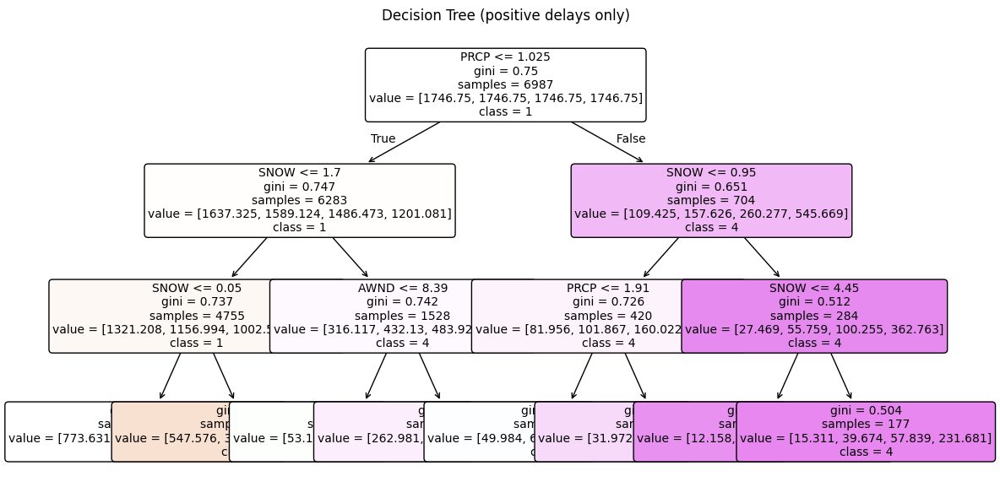


Model classes: [np.int64(1), np.int64(2), np.int64(3), np.int64(4)]
Mean delay aligned to model classes: [ 14.12584574  41.99539595  84.06456954 205.17801047]
predict_proba on grid 80x80 took 0.00s for TAVG vs SNOW


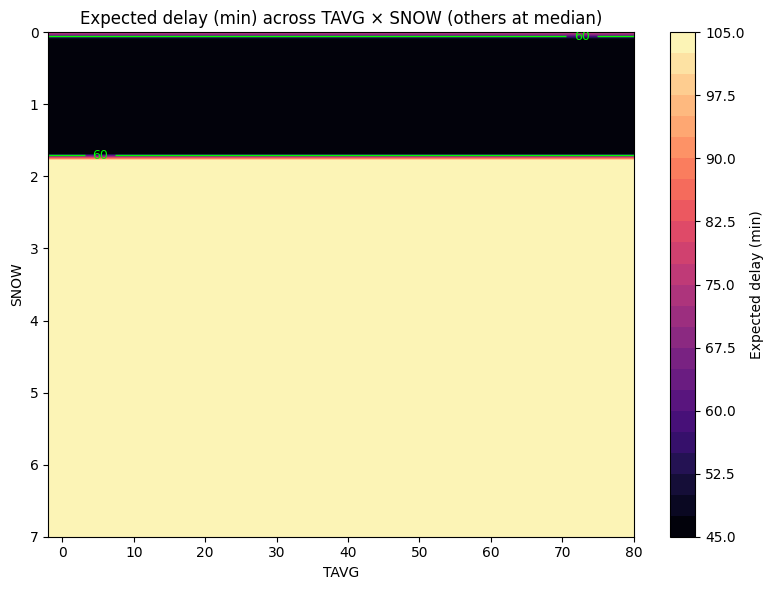

predict_proba on grid 80x80 took 0.00s for TAVG vs PRCP


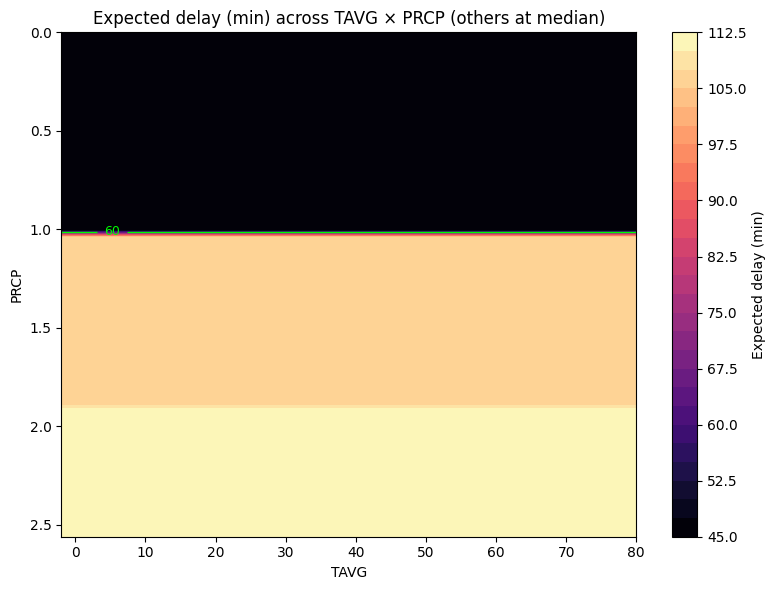

predict_proba on grid 80x80 took 0.00s for TAVG vs AWND


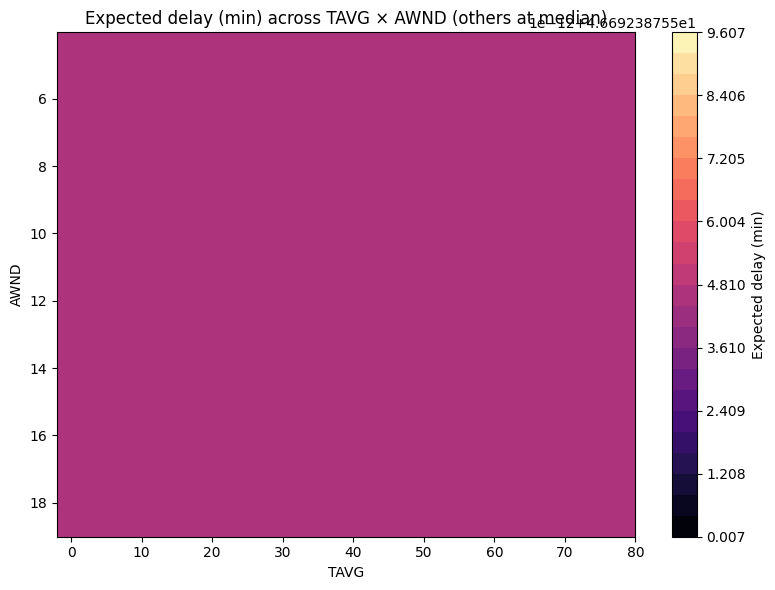

predict_proba on grid 80x80 took 0.00s for SNOW vs PRCP


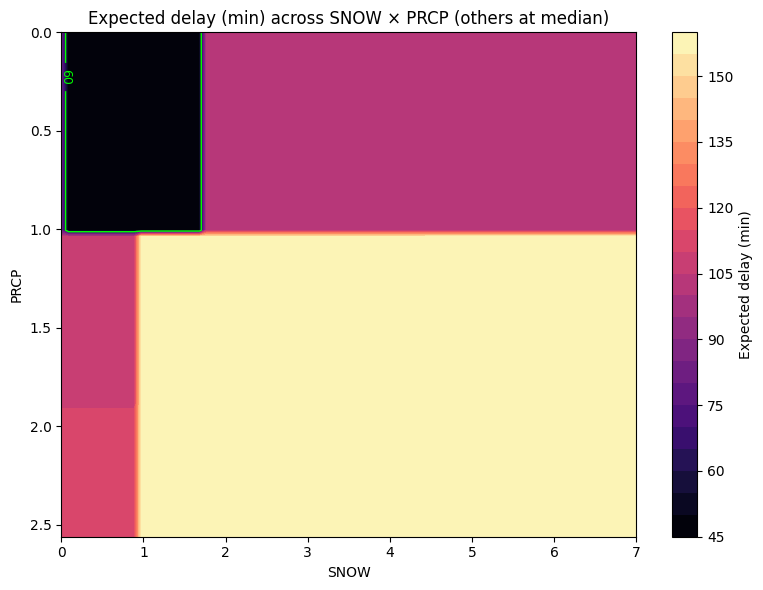

predict_proba on grid 80x80 took 0.00s for SNOW vs AWND


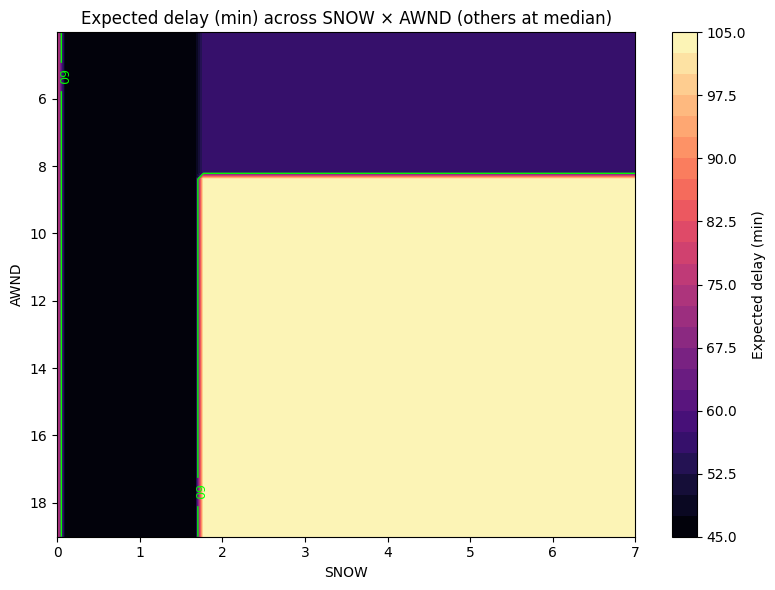

predict_proba on grid 80x80 took 0.00s for PRCP vs AWND


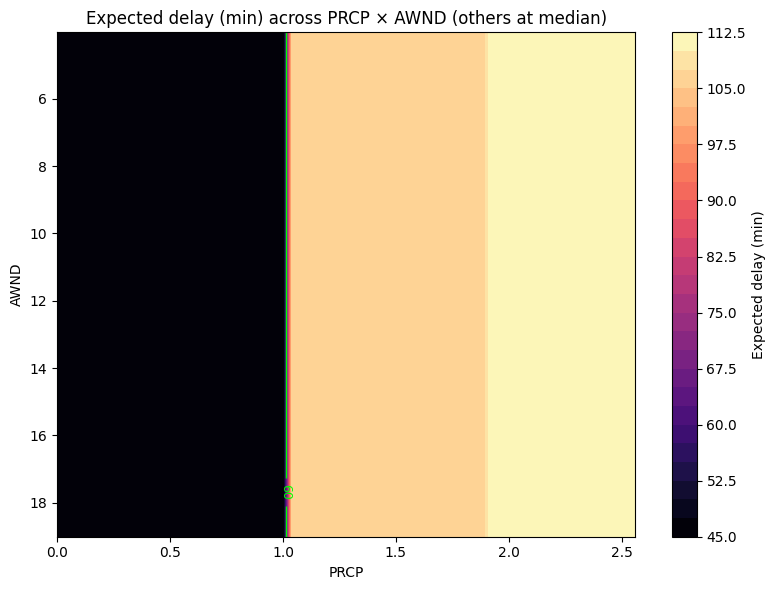

All pairwise heatmaps time: 2.83s


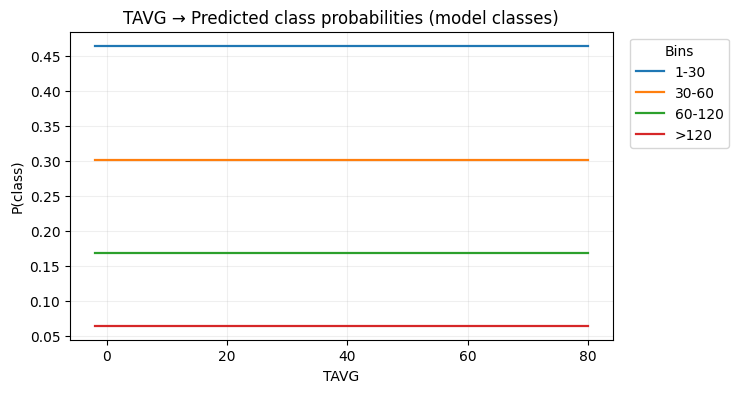

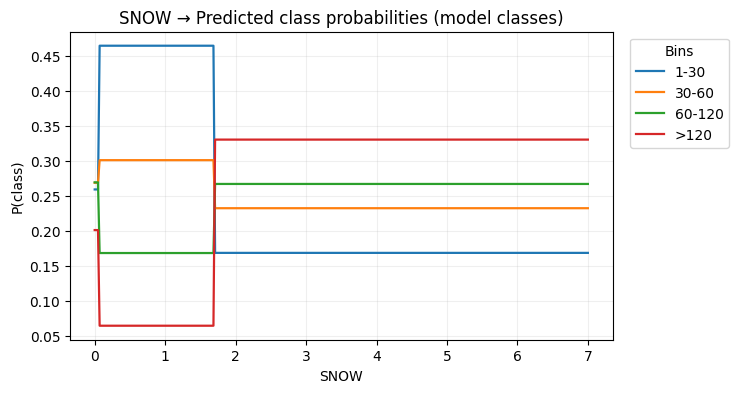

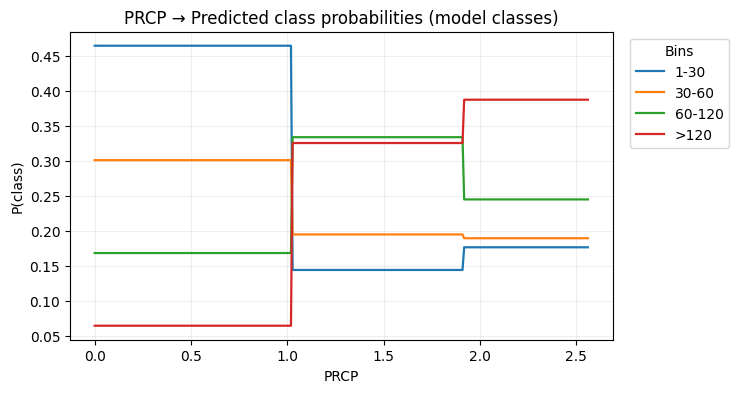

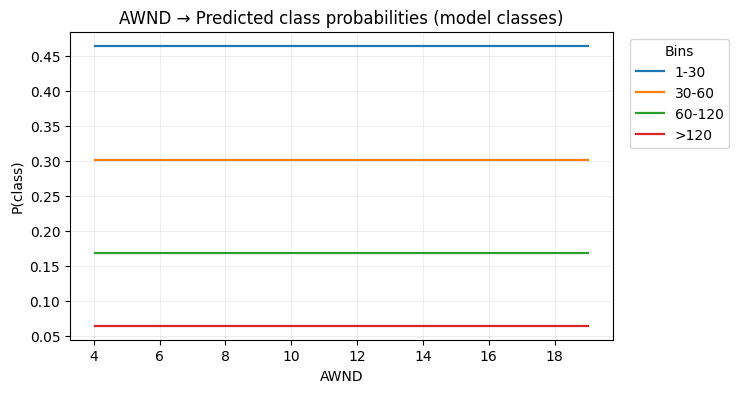


Top leaves (fixed):
 leaf  n_samples  mean_delay_unconditional                      class_counts
   13        137                150.671533      {4: 59, 1: 34, 3: 25, 2: 19}
   14        234                132.388889      {4: 96, 2: 52, 1: 45, 3: 41}
   11        193                 65.212435      {1: 87, 2: 41, 3: 34, 4: 31}
   10        351                 57.521368     {1: 145, 2: 91, 3: 71, 4: 44}
    7       1771                 57.509881  {1: 796, 2: 450, 3: 292, 4: 233}
    3       4100                 40.842439 {1: 2303, 2: 986, 3: 551, 4: 260}
    6        295                 36.450847      {1: 151, 2: 94, 3: 44, 4: 6}
    4       2236                 26.001342  {1: 1612, 2: 439, 3: 150, 4: 35}

Top actionable leaves (by mean unconditional delay):


In [ ]:
# Fixed pipeline: mean_by_class aligned with clf.classes_, avoids broadcasting error
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.metrics import classification_report

# SETTINGS
MAX_DEPTH = 3
MIN_SAMPLES_LEAF = 60
RANDOM_STATE = 42
GRID_RES = 80
SUBSAMPLE_FRAC = 1.0

# 1. Load and keep positive delays only
t0 = time.perf_counter()
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)
df = df[df['delay_minutes'] > 0].reset_index(drop=True)
if SUBSAMPLE_FRAC < 1.0:
    df = df.sample(frac=SUBSAMPLE_FRAC, random_state=RANDOM_STATE).reset_index(drop=True)

# 2. Bin positive delays
bins = [0.0, 1.0, 30.0, 60.0, 120.0, np.inf]
labels = ['<1', '1-30', '30-60', '60-120', '>120']
df['delay_bin'] = pd.cut(df['delay_minutes'], bins=bins, labels=labels, right=False, ordered=True)
df = df.dropna(subset=['delay_bin']).copy()
class_map = {lab: i for i, lab in enumerate(labels)}
df['y'] = df['delay_bin'].map(class_map).astype(int)

print("Rows used:", len(df))
print("Class distribution:\n", df['delay_bin'].value_counts().reindex(labels))

# 3. Train/test split and model
X = df[weather_vars].values
y = df['y'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=RANDOM_STATE, stratify=y)

clf = DecisionTreeClassifier(max_depth=MAX_DEPTH, min_samples_leaf=MIN_SAMPLES_LEAF,
                             class_weight='balanced', random_state=RANDOM_STATE)
t1 = time.perf_counter()
clf.fit(X_train, y_train)
t2 = time.perf_counter()
print(f"Training time: {t2-t1:.2f}s")

# 4. classification_report — only present classes
y_pred = clf.predict(X_test)
present_classes = np.unique(y_test)
present_names = [labels[c] for c in present_classes]
print("\nClassification report (present classes only):")
print(classification_report(y_test, y_pred, labels=present_classes, target_names=present_names, zero_division=0))

# 5. Decision tree plot
plt.figure(figsize=(12,6))
plot_tree(clf, feature_names=weather_vars, class_names=[str(c) for c in clf.classes_], filled=True, rounded=True, fontsize=10)
plt.title('Decision Tree (positive delays only)')
plt.tight_layout()
plt.savefig('tree_positive_fixed.png', dpi=150)
plt.show()

# 6. Compute empirical mean delay per original bin, then align to model classes
empirical_mean_by_bin = df.groupby('y')['delay_minutes'].mean().to_dict()
global_mean_delay = df['delay_minutes'].mean()

# Build mean_by_class_arr aligned with clf.classes_
# clf.classes_ contains the integer class labels the model was trained on (e.g., [1,2,3,4] or [0,1,2,3,4])
model_classes = list(clf.classes_)
mean_by_class_arr = np.array([empirical_mean_by_bin.get(cls, global_mean_delay) for cls in model_classes])
print("\nModel classes:", model_classes)
print("Mean delay aligned to model classes:", mean_by_class_arr)

# 7. Vectorized pairwise expected-delay heatmap (uses aligned mean_by_class_arr)
def pairwise_expected_delay_heatmap(clf, df_ref, f1, f2, grid_res=GRID_RES, save=True):
    i1 = weather_vars.index(f1)
    i2 = weather_vars.index(f2)

    x_min, x_max = df_ref[f1].quantile(0.01), df_ref[f1].quantile(0.99)
    y_min, y_max = df_ref[f2].quantile(0.01), df_ref[f2].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, grid_res)
    y_vals = np.linspace(y_min, y_max, grid_res)
    xx, yy = np.meshgrid(x_vals, y_vals)

    base = df_ref[weather_vars].median().values
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]

    t_start = time.perf_counter()
    proba = clf.predict_proba(grid)            # shape (n_points, n_model_classes)
    t_end = time.perf_counter()
    print(f"predict_proba on grid {grid_res}x{grid_res} took {t_end - t_start:.2f}s for {f1} vs {f2}")

    # Align proba columns to model_classes order; mean_by_class_arr already aligned to clf.classes_
    exp_delay = (proba * mean_by_class_arr.reshape(1, -1)).sum(axis=1)
    Z = exp_delay.reshape(xx.shape)

    plt.figure(figsize=(8,6))
    cf = plt.contourf(xx, yy, Z, levels=25, cmap='magma')
    cbar = plt.colorbar(cf)
    cbar.set_label('Expected delay (min)')
    cs = plt.contour(xx, yy, Z, levels=[10, 30, 60], colors=['white','cyan','lime'], linewidths=1.0)
    plt.clabel(cs, fmt={10:'10', 30:'30', 60:'60'}, inline=True, fontsize=9)
    plt.xlabel(f1); plt.ylabel(f2)
    plt.title(f"Expected delay (min) across {f1} × {f2} (others at median)")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    if save:
        fname = f"expected_delay_{f1}_{f2}_fixed.png".replace(' ', '_')
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

# Run pairwise heatmaps
t3 = time.perf_counter()
for f1, f2 in combinations(weather_vars, 2):
    pairwise_expected_delay_heatmap(clf, df, f1, f2, grid_res=GRID_RES, save=True)
t4 = time.perf_counter()
print(f"All pairwise heatmaps time: {t4 - t3:.2f}s")

# 8. Fast single-variable effect plots (vectorized)
def single_effect_multiclass(clf, df_ref, feature, n_points=300, save=True):
    f_idx = weather_vars.index(feature)
    x_min, x_max = df_ref[feature].quantile(0.01), df_ref[feature].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, n_points)
    base = df_ref[weather_vars].median().values
    grid = np.tile(base, (n_points, 1))
    grid[:, f_idx] = x_vals
    proba = clf.predict_proba(grid)   # shape (n_points, n_model_classes)
    plt.figure(figsize=(7,4))
    # plot probabilities for each model class; label with original bin name if available
    for idx, cls in enumerate(model_classes):
        label = labels[cls] if cls in range(len(labels)) else f"class_{cls}"
        plt.plot(x_vals, proba[:, idx], label=label, linewidth=1.6)
    plt.xlabel(feature); plt.ylabel("P(class)")
    plt.title(f"{feature} → Predicted class probabilities (model classes)")
    plt.legend(title='Bins', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.grid(alpha=0.2)
    if save:
        plt.savefig(f"{feature}_single_effect_fixed.png", dpi=150, bbox_inches='tight')
    plt.show()

for feat in weather_vars:
    single_effect_multiclass(clf, df, feat, n_points=300, save=True)

# 9. Top leaves table
df['leaf'] = clf.apply(df[weather_vars].values)
leaf_stats = df.groupby('leaf').agg(
    n_samples=('delay_minutes','size'),
    mean_delay_unconditional=('delay_minutes','mean'),
    class_counts=('y', lambda s: s.value_counts().to_dict())
).reset_index().sort_values('mean_delay_unconditional', ascending=False)

print("\nTop leaves (fixed):")
print(leaf_stats.head(8).to_string(index=False))

# readable rule extraction for top leaves
def node_descendants(tree_, node):
    nodes = set(); stack=[node]
    while stack:
        n=stack.pop(); nodes.add(n)
        if tree_.children_left[n] != _tree.TREE_UNDEFINED: stack.append(tree_.children_left[n])
        if tree_.children_right[n] != _tree.TREE_UNDEFINED: stack.append(tree_.children_right[n])
    return nodes

def leaf_rule_text(tree, leaf_node, feature_names):
    tree_ = tree.tree_; feature = tree_.feature; threshold = tree_.threshold
    constraints=[]
    def recurse(node):
        if node==leaf_node: return True
        if feature[node]==_tree.TREE_UNDEFINED: return False
        left=tree_.children_left[node]; right=tree_.children_right[node]
        if leaf_node in node_descendants(tree_, left):
            fidx=feature[node]; constraints.append(f"{feature_names[fidx]} <= {threshold[node]:.3f}"); return recurse(left)
        if leaf_node in node_descendants(tree_, right):
            fidx=feature[node]; constraints.append(f"{feature_names[fidx]} > {threshold[node]:.3f}"); return recurse(right)
        return False
    ok=recurse(0); return " AND ".join(constraints) if ok else "complex rule"

top_leaves = leaf_stats.head(8)
print("\nTop actionable leaves (by mean unconditional delay):")
for _, r in top_leaves.iterrows():
    rule = leaf_rule_text(clf, int(r['leaf']), weather_vars)
    print(f"Leaf {int(r['leaf'])}: IF {rule} → n={int(r['n_samples'])}, E[delay]={r['mean_delay_unconditional']:.1f} min, class_counts={r['class_counts']}")

# Save top leaves
top_leaves.to_csv('top_leaves_positive_delays_fixed.csv', index=False)
t_end = time.perf_counter()
print(f"\nTotal script time: {t_end - t0:.2f}s")


Merging '<1' (n=0) into '1-30' (n=5173)
Final labels: ['1-30', '30-60', '60-120', '>120']
Best DecisionTree params: {'max_depth': 4, 'min_samples_leaf': 20} CV balanced_acc: 0.36173649657195944


C:\Users\KUNJ SHAH\AppData\Local\Temp\ipykernel_20952\4161094701.py:75: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  s = s.replace({merge_label: target_label})


Best RandomForest params: {'max_depth': 6, 'min_samples_leaf': 50, 'n_estimators': 100} CV balanced_acc: 0.38517728529406314
Selected best model: RandomForest

Test balanced accuracy: 0.294
Test macro F1: 0.245

Classification report (present classes):
              precision    recall  f1-score   support

        1-30       0.57      0.99      0.72      1294
       30-60       0.00      0.00      0.00       543
      60-120       0.00      0.00      0.00       302
        >120       0.41      0.19      0.26       191

    accuracy                           0.56      2330
   macro avg       0.25      0.29      0.25      2330
weighted avg       0.35      0.56      0.42      2330



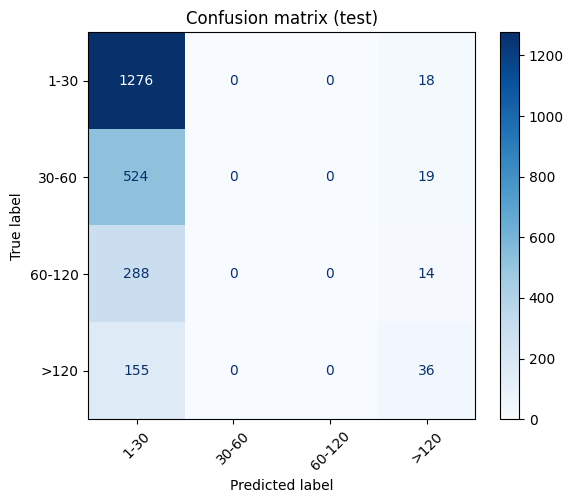

C:\Users\KUNJ SHAH\AppData\Local\Temp\ipykernel_20952\4161094701.py:169: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=fi_df, palette='viridis')


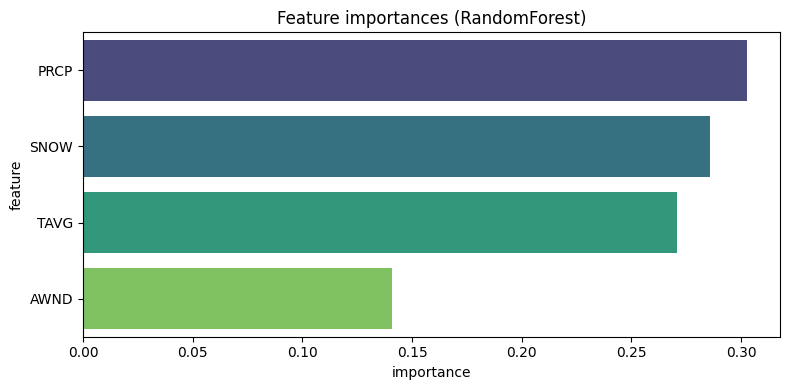

C:\Users\KUNJ SHAH\AppData\Local\Temp\ipykernel_20952\4161094701.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  empirical_mean_by_label = df.groupby('delay_bin_merged')['delay_minutes'].mean().to_dict()



Model classes: [np.int64(0), np.int64(1), np.int64(2), np.int64(3)]
Model class names: ['1-30', '30-60', '60-120', '>120']
Mean delay aligned to model classes (minutes): [ 14.12584574  41.99539595  84.06456954 205.17801047]


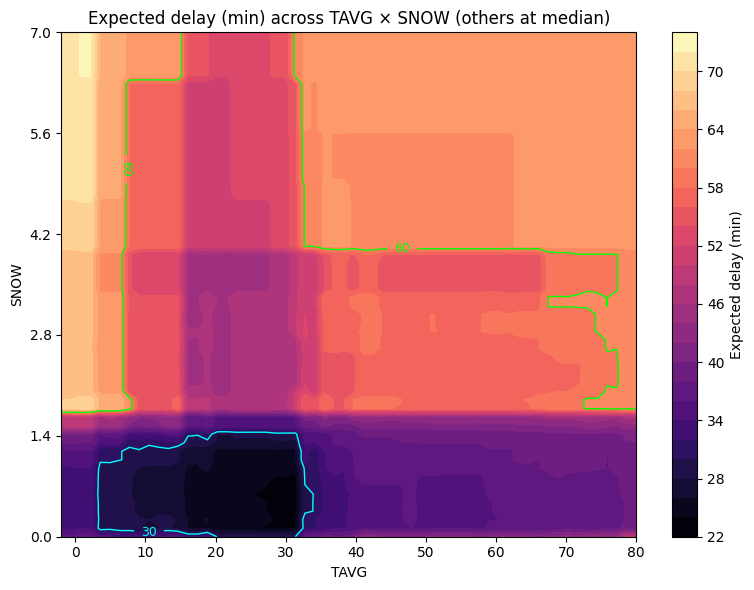

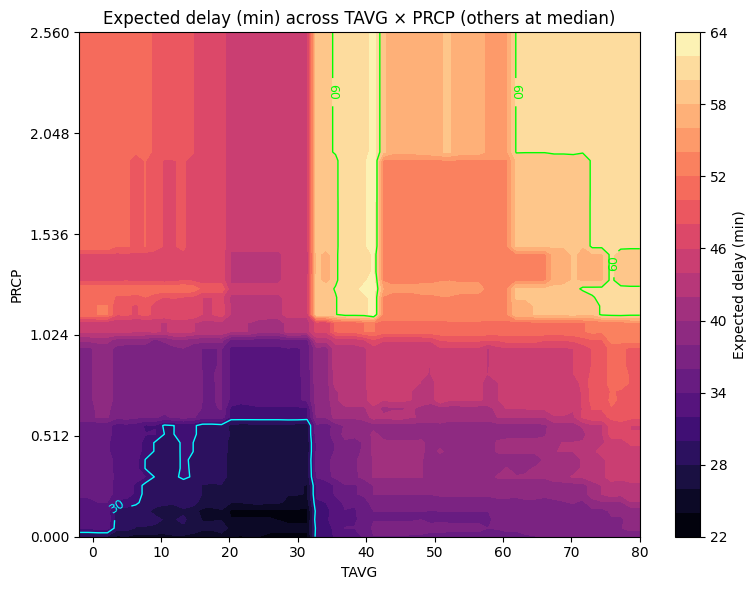

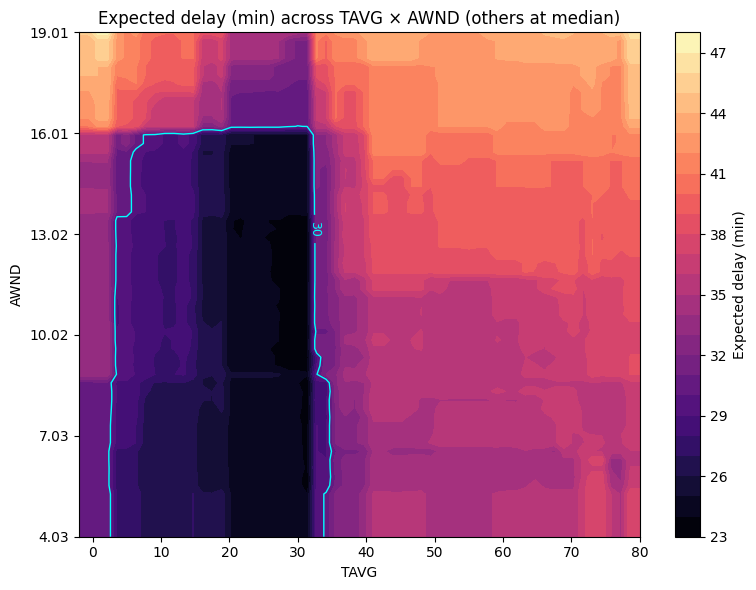

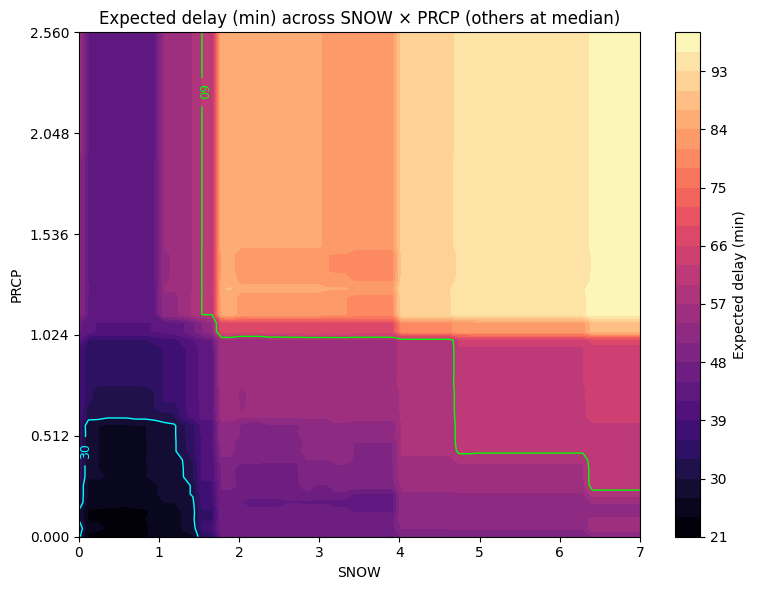

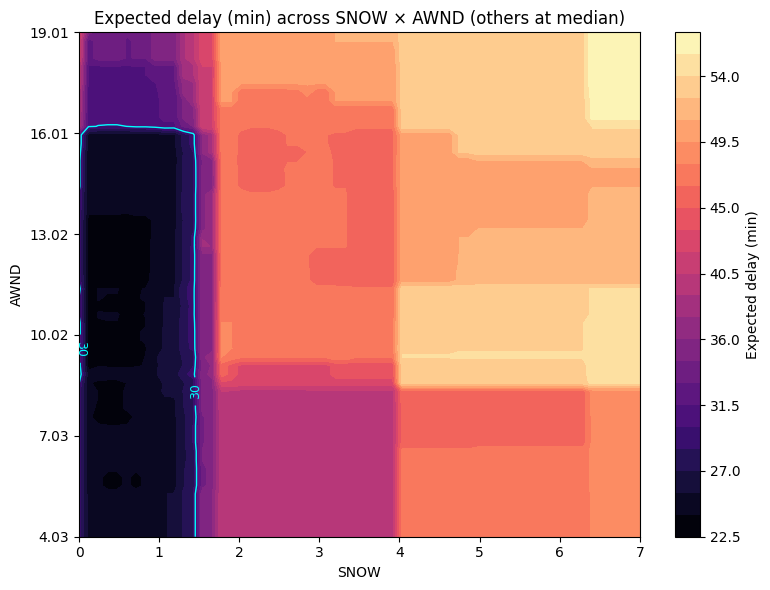

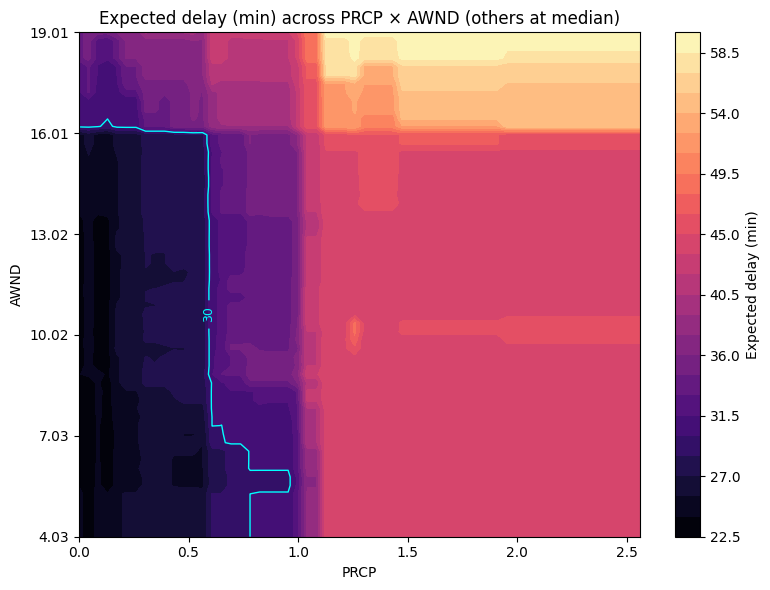

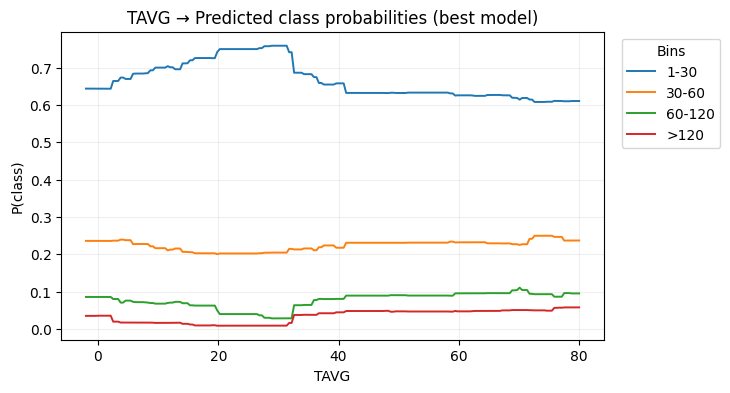

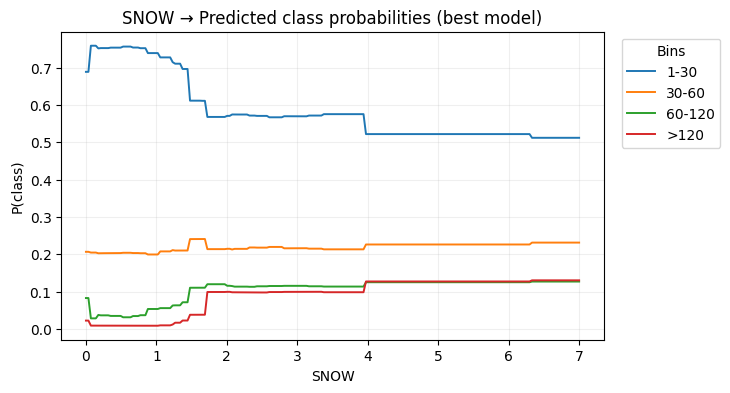

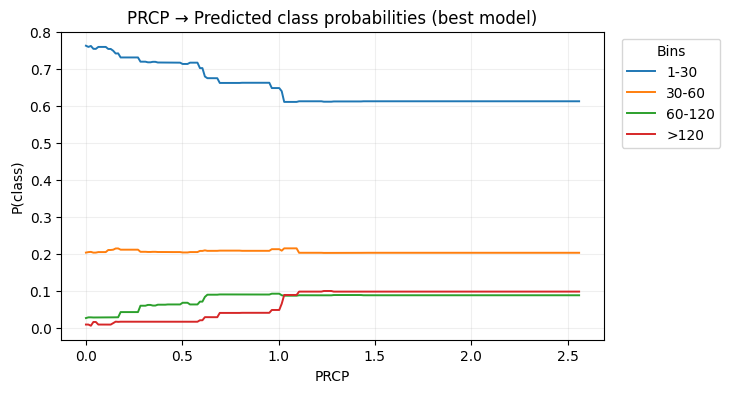

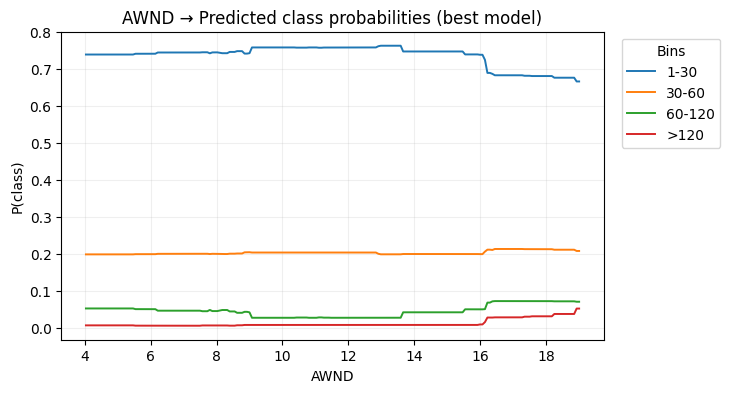

ValueError: Expected a 1D array, got an array with shape (9317, 100)

In [3]:
# Fixed pipeline: CalibratedClassifierCV uses numeric cv (no 'prefit')
# - Removes zero delays, bins positive delays, merges tiny classes
# - GridSearchCV for DecisionTree and RandomForest
# - Calibrates best model with cv=3 (portable)
# - Produces evaluation and expected-delay heatmaps (y increases upward)

import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (balanced_accuracy_score, f1_score, classification_report,
                             confusion_matrix, ConfusionMatrixDisplay)
from sklearn.calibration import CalibratedClassifierCV

# -------------------------
# SETTINGS
# -------------------------
RANDOM_STATE = 42
MAX_DEPTH_TREE = [2, 3, 4]           # smaller grid for speed; expand if needed
MIN_SAMPLES_LEAF = [20, 50]
RF_N_ESTIMATORS = [100]              # increase for final runs
RF_MAX_DEPTH = [4, 6, None]
MIN_SAMPLES_PER_CLASS = 80
GRID_RES = 60
USE_CALIBRATION = True               # calibrate probabilities using cv=3

# -------------------------
# 1. Load and keep positive delays only
# -------------------------
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)
df = df[df['delay_minutes'] > 0].reset_index(drop=True)   # remove zeros

# -------------------------
# 2. Bin positive delays and merge tiny classes
# -------------------------
initial_bins = [0.0, 1.0, 30.0, 60.0, 120.0, np.inf]
initial_labels = ['<1', '1-30', '30-60', '60-120', '>120']
df['delay_bin'] = pd.cut(df['delay_minutes'], bins=initial_bins, labels=initial_labels, right=False, ordered=True)
df = df.dropna(subset=['delay_bin']).copy()

def get_counts(series, labels):
    return series.value_counts().reindex(labels).fillna(0).astype(int)

def merge_small_classes(series, labels, min_count):
    labels = list(labels)
    s = series.copy()
    while True:
        counts = get_counts(s, labels)
        if (counts >= min_count).all() or len(labels) <= 1:
            break
        smallest = counts.idxmin()
        idx = labels.index(smallest)
        left = idx-1 if idx-1 >= 0 else None
        right = idx+1 if idx+1 < len(labels) else None
        if left is None:
            target = right
        elif right is None:
            target = left
        else:
            target = left if counts[labels[left]] >= counts[labels[right]] else right
        target_label = labels[target]
        merge_label = labels[idx]
        print(f"Merging '{merge_label}' (n={counts[merge_label]}) into '{target_label}' (n={counts[target_label]})")
        s = s.replace({merge_label: target_label})
        labels.pop(idx)
        s = s.astype('category').cat.set_categories(labels, ordered=True)
    return s, labels

df['delay_bin_merged'], final_labels = merge_small_classes(df['delay_bin'], initial_labels, MIN_SAMPLES_PER_CLASS)
print("Final labels:", final_labels)
df['y'] = df['delay_bin_merged'].map({lab:i for i,lab in enumerate(final_labels)}).astype(int)

# -------------------------
# 3. Train/test split
# -------------------------
X = df[weather_vars].values
y = df['y'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,
                                                    random_state=RANDOM_STATE, stratify=y)

# -------------------------
# 4. Grid search for DecisionTree and RandomForest
# -------------------------
cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=RANDOM_STATE)

dt = DecisionTreeClassifier(class_weight='balanced', random_state=RANDOM_STATE)
dt_param_grid = {'max_depth': MAX_DEPTH_TREE, 'min_samples_leaf': MIN_SAMPLES_LEAF}
dt_search = GridSearchCV(dt, dt_param_grid, cv=cv, scoring='balanced_accuracy', n_jobs=-1)
dt_search.fit(X_train, y_train)
print("Best DecisionTree params:", dt_search.best_params_, "CV balanced_acc:", dt_search.best_score_)

rf = RandomForestClassifier(class_weight='balanced', random_state=RANDOM_STATE, n_jobs=-1)
rf_param_grid = {'n_estimators': RF_N_ESTIMATORS, 'max_depth': RF_MAX_DEPTH, 'min_samples_leaf': MIN_SAMPLES_LEAF}
rf_search = GridSearchCV(rf, rf_param_grid, cv=cv, scoring='balanced_accuracy', n_jobs=-1)
rf_search.fit(X_train, y_train)
print("Best RandomForest params:", rf_search.best_params_, "CV balanced_acc:", rf_search.best_score_)

# choose best by CV balanced accuracy
if rf_search.best_score_ >= dt_search.best_score_:
    best_model = rf_search.best_estimator_
    best_name = 'RandomForest'
else:
    best_model = dt_search.best_estimator_
    best_name = 'DecisionTree'
print("Selected best model:", best_name)

# -------------------------
# 5. Calibrate probabilities (portable: use numeric cv)
# -------------------------
if USE_CALIBRATION:
    # Use cv=3 (or cv=cv) instead of 'prefit' to avoid version mismatch
    calibrator = CalibratedClassifierCV(best_model, cv=3, method='isotonic' if len(final_labels) < 6 else 'sigmoid')
    calibrator.fit(X_train, y_train)   # calibrator will clone and fit internally
    model = calibrator
else:
    model = best_model

# -------------------------
# 6. Evaluate on test set
# -------------------------
y_pred = model.predict(X_test)
bal_acc = balanced_accuracy_score(y_test, y_pred)
f1_macro = f1_score(y_test, y_pred, average='macro')
print("\nTest balanced accuracy:", round(bal_acc,3))
print("Test macro F1:", round(f1_macro,3))

present = np.unique(y_test)
present_names = [final_labels[c] for c in present]
print("\nClassification report (present classes):")
print(classification_report(y_test, y_pred, labels=present, target_names=present_names, zero_division=0))

# confusion matrix (aligned to model.classes_)
model_classes = list(model.classes_)
model_names = [final_labels[int(c)] for c in model_classes]
cm = confusion_matrix(y_test, y_pred, labels=model_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_names)
plt.figure(figsize=(6,5))
disp.plot(ax=plt.gca(), cmap='Blues', xticks_rotation=45)
plt.title('Confusion matrix (test)')
plt.tight_layout()
plt.savefig('confusion_matrix_fixed.png', dpi=150)
plt.show()

# -------------------------
# 7. Feature importance or tree plot
# -------------------------
if best_name == 'DecisionTree':
    plt.figure(figsize=(12,6))
    plot_tree(best_model, feature_names=weather_vars, class_names=model_names, filled=True, rounded=True, fontsize=10)
    plt.title('Selected Decision Tree')
    plt.tight_layout()
    plt.savefig('tree_selected_fixed.png', dpi=150)
    plt.show()
else:
    importances = best_model.feature_importances_
    fi_df = pd.DataFrame({'feature': weather_vars, 'importance': importances}).sort_values('importance', ascending=False)
    plt.figure(figsize=(8,4))
    sns.barplot(x='importance', y='feature', data=fi_df, palette='viridis')
    plt.title('Feature importances (RandomForest)')
    plt.tight_layout()
    plt.savefig('best_model_importance_fixed.png', dpi=150)
    plt.show()

# -------------------------
# 8. Align mean delays to model.classes_ (for expected-delay maps)
# -------------------------
empirical_mean_by_label = df.groupby('delay_bin_merged')['delay_minutes'].mean().to_dict()
global_mean = df['delay_minutes'].mean()
mean_by_class_arr = np.array([empirical_mean_by_label.get(final_labels[int(cls)], global_mean) for cls in model_classes])
print("\nModel classes:", model_classes)
print("Model class names:", model_names)
print("Mean delay aligned to model classes (minutes):", mean_by_class_arr)

# -------------------------
# 9. Vectorized pairwise expected-delay heatmaps (y increases upward)
# -------------------------
def expected_delay_heatmap(model, df_ref, f1, f2, grid_res=GRID_RES, save=True):
    i1 = weather_vars.index(f1)
    i2 = weather_vars.index(f2)
    x_min, x_max = df_ref[f1].quantile(0.01), df_ref[f1].quantile(0.99)
    y_min, y_max = df_ref[f2].quantile(0.01), df_ref[f2].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, grid_res)
    y_vals = np.linspace(y_min, y_max, grid_res)
    xx, yy = np.meshgrid(x_vals, y_vals)

    base = df_ref[weather_vars].median().values
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]

    proba = model.predict_proba(grid)
    exp_delay = (proba * mean_by_class_arr.reshape(1, -1)).sum(axis=1)
    Z = exp_delay.reshape(xx.shape)

    plt.figure(figsize=(8,6))
    cf = plt.contourf(xx, yy, Z, levels=25, cmap='magma', origin='lower')
    cbar = plt.colorbar(cf)
    cbar.set_label('Expected delay (min)')
    cs = plt.contour(xx, yy, Z, levels=[10, 30, 60], colors=['white','cyan','lime'], linewidths=1.0, origin='lower')
    plt.clabel(cs, fmt={10:'10', 30:'30', 60:'60'}, inline=True, fontsize=9)
    plt.xlabel(f1); plt.ylabel(f2)
    plt.title(f"Expected delay (min) across {f1} × {f2} (others at median)")
    plt.yticks(np.linspace(y_min, y_max, 6))
    plt.tight_layout()
    if save:
        fname = f"expected_delay_{f1}_{f2}_fixed.png".replace(' ', '_')
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

for f1, f2 in combinations(weather_vars, 2):
    expected_delay_heatmap(model, df, f1, f2, grid_res=GRID_RES, save=True)

# -------------------------
# 10. Single-variable effect plots (vectorized)
# -------------------------
def single_effect_plot(model, df_ref, feature, n_points=200, save=True):
    f_idx = weather_vars.index(feature)
    x_min, x_max = df_ref[feature].quantile(0.01), df_ref[feature].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, n_points)
    base = df_ref[weather_vars].median().values
    grid = np.tile(base, (n_points, 1))
    grid[:, f_idx] = x_vals
    proba = model.predict_proba(grid)
    plt.figure(figsize=(7,4))
    for idx, cls in enumerate(model_classes):
        label = final_labels[int(cls)]
        plt.plot(x_vals, proba[:, idx], label=label, linewidth=1.4)
    plt.xlabel(feature); plt.ylabel("P(class)")
    plt.title(f"{feature} → Predicted class probabilities (best model)")
    plt.legend(title='Bins', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.grid(alpha=0.2)
    if save:
        plt.savefig(f"{feature}_single_effect_fixed.png", dpi=150, bbox_inches='tight')
    plt.show()

for feat in weather_vars:
    single_effect_plot(model, df, feat, n_points=200, save=True)

# -------------------------
# 11. Top actionable leaves / regions
# -------------------------
if hasattr(best_model, 'apply'):
    df['leaf'] = best_model.apply(df[weather_vars].values)
else:
    df['leaf'] = -1

leaf_stats = df.groupby('leaf').agg(
    n_samples=('delay_minutes','size'),
    mean_delay_unconditional=('delay_minutes','mean'),
    class_counts=('y', lambda s: s.value_counts().to_dict())
).reset_index().sort_values('mean_delay_unconditional', ascending=False)

print("\nTop leaves / regions by mean unconditional delay:")
print(leaf_stats.head(8).to_string(index=False))
leaf_stats.head(8).to_csv('top_leaves_bestmodel_fixed.csv', index=False)

print("\nDone. Files saved: confusion_matrix_fixed.png, best_model_importance_fixed.png or tree_selected_fixed.png, expected_delay_*_fixed.png, *_single_effect_fixed.png, top_leaves_bestmodel_fixed.csv")


Rows after removing zero delays: 9317
Merging '<1' (n=0) into '1-30' (n=5173)
Final labels after merging: ['1-30', '30-60', '60-120', '>120']
Final class counts:
 delay_bin_merged
1-30      5173
30-60     2172
60-120    1208
>120       764
Name: count, dtype: int64


C:\Users\KUNJ SHAH\AppData\Local\Temp\ipykernel_20952\4002582700.py:80: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  s = s.replace({merge_label: target_label})


Best DecisionTree params: {'max_depth': 4, 'min_samples_leaf': 20} CV balanced_acc: 0.36173649657195944
Best RandomForest params: {'max_depth': 6, 'min_samples_leaf': 50, 'n_estimators': 100} CV balanced_acc: 0.38517728529406314
Selected best model: RandomForest

Test balanced accuracy: 0.294
Test macro F1: 0.245

Classification report (present classes):
              precision    recall  f1-score   support

        1-30       0.57      0.99      0.72      1294
       30-60       0.00      0.00      0.00       543
      60-120       0.00      0.00      0.00       302
        >120       0.41      0.19      0.26       191

    accuracy                           0.56      2330
   macro avg       0.25      0.29      0.25      2330
weighted avg       0.35      0.56      0.42      2330



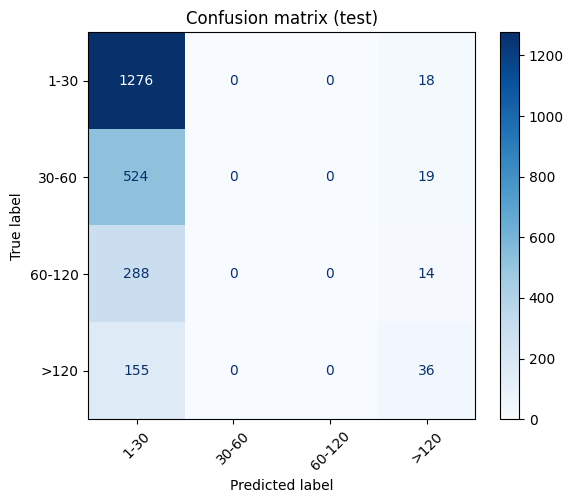

C:\Users\KUNJ SHAH\AppData\Local\Temp\ipykernel_20952\4002582700.py:166: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  empirical_mean_by_label = df.groupby('delay_bin_merged')['delay_minutes'].mean().to_dict()



Model classes: [np.int64(0), np.int64(1), np.int64(2), np.int64(3)]
Model class names: ['1-30', '30-60', '60-120', '>120']
Mean delay aligned to model classes (minutes): [ 14.12584574  41.99539595  84.06456954 205.17801047]


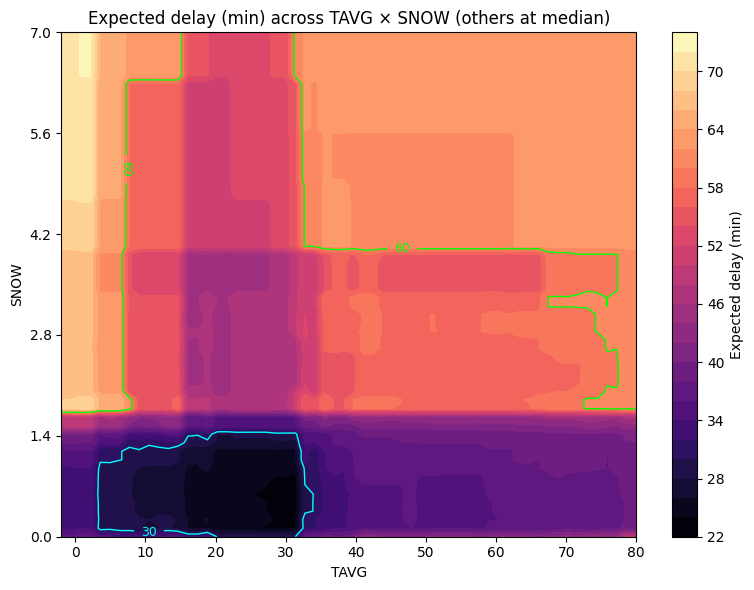

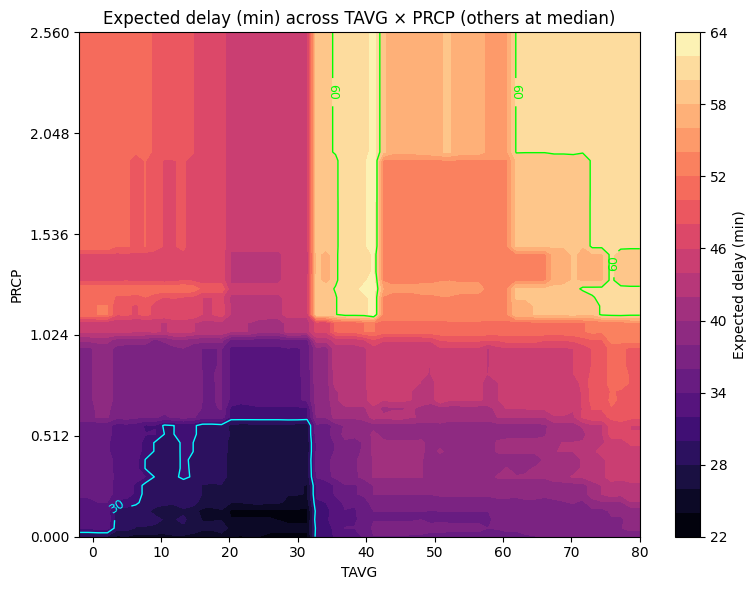

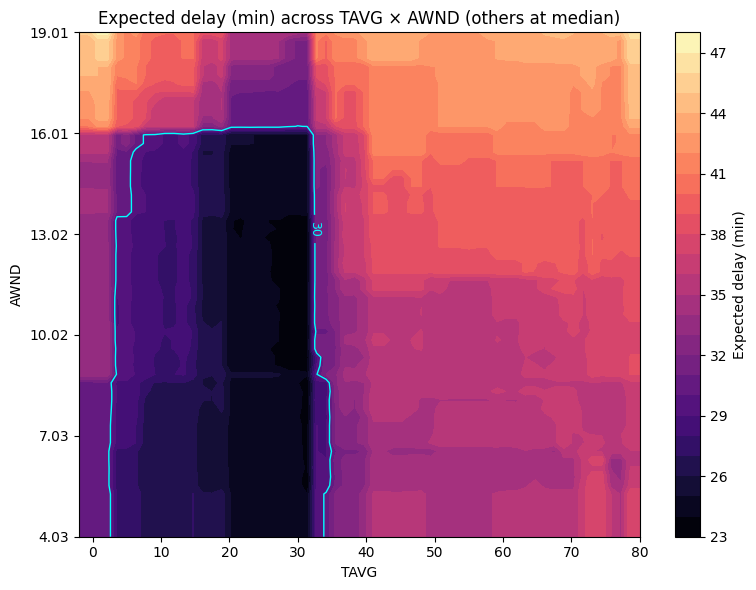

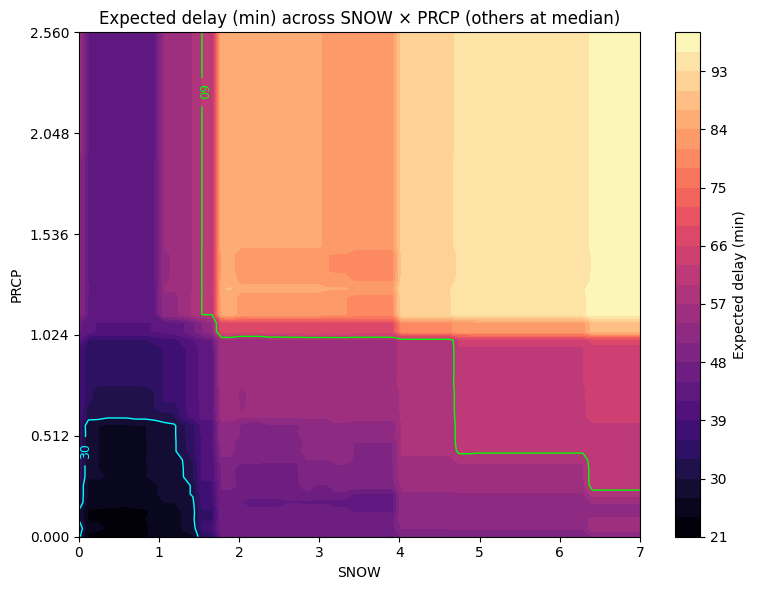

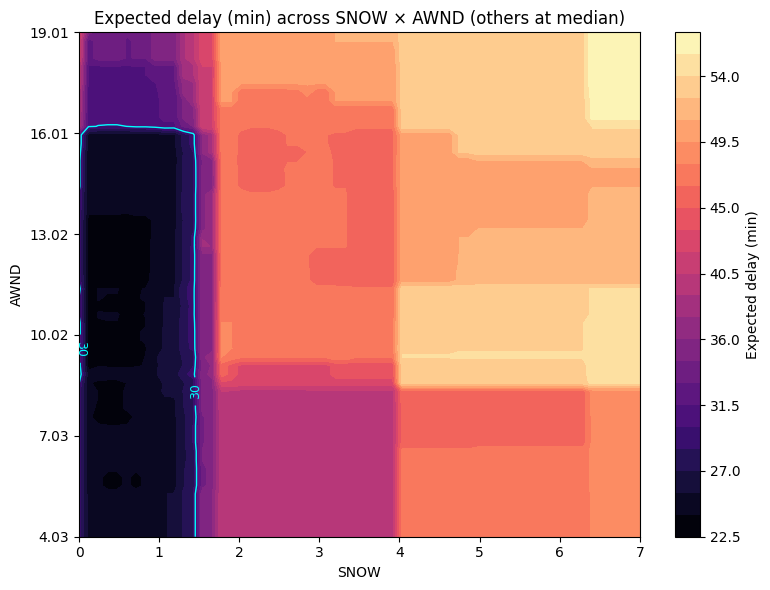

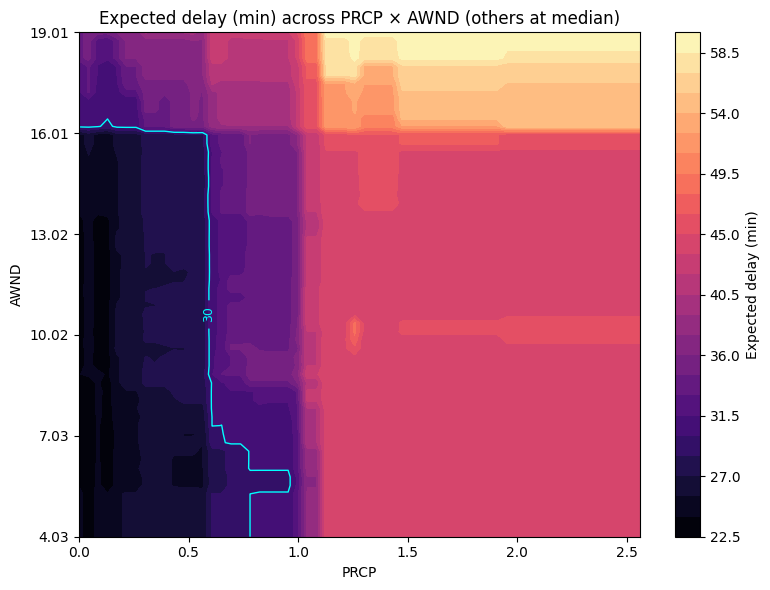

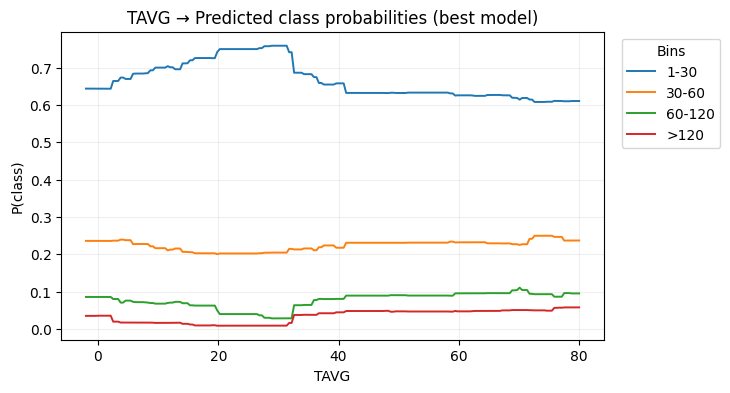

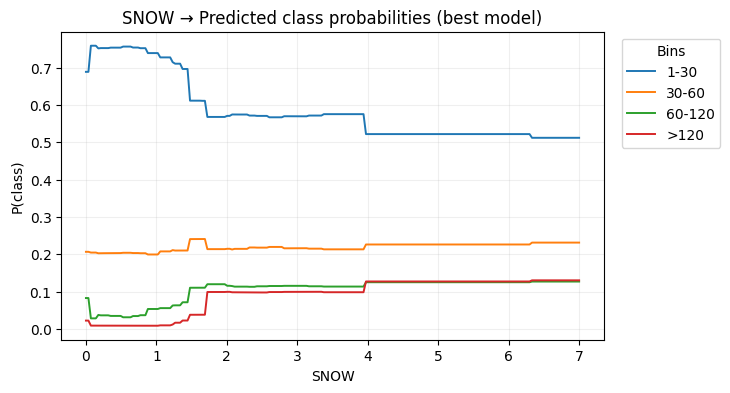

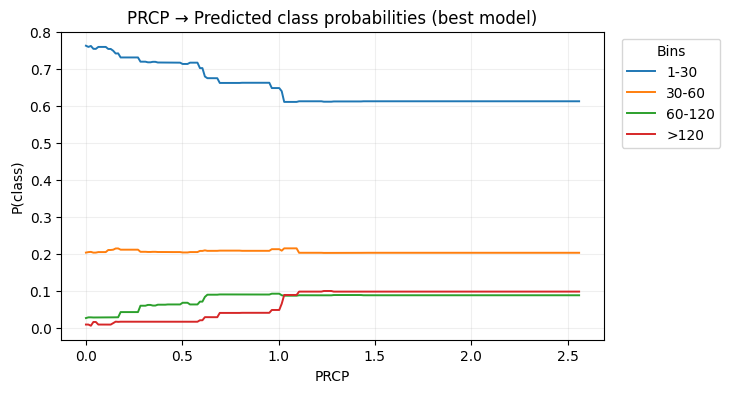

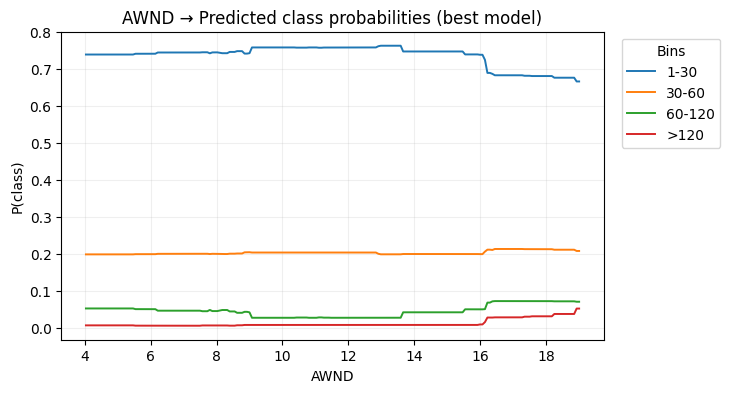


Clusters for TAVG vs SNOW:
  No clusters found (try lowering percentile or DBSCAN eps/min_samples).

Clusters for TAVG vs PRCP:
  Cluster 0: n=58, centroid=(40.22, 0.10), mean_expected_delay=62.39 min, bbox=[36.91525423728814, 41.08474576271187, 0.1, 0.1]
  Cluster 1: n=16, centroid=(77.13, 0.10), mean_expected_delay=61.23 min, bbox=[75.83050847457628, 77.22033898305085, 0.1, 0.1]

Clusters for TAVG vs AWND:
  Cluster 0: n=39, centroid=(76.29, 0.10), mean_expected_delay=44.59 min, bbox=[66.10169491525424, 80.0, 0.1, 0.1]
  Cluster 1: n=30, centroid=(0.18, 0.10), mean_expected_delay=44.58 min, bbox=[-2.0, 2.1694915254237293, 0.1, 0.1]
  Cluster 2: n=19, centroid=(43.43, 0.10), mean_expected_delay=43.66 min, bbox=[39.69491525423729, 48.03389830508475, 0.1, 0.1]

Clusters for SNOW vs PRCP:
  Cluster 0: n=30, centroid=(29.00, 6.41), mean_expected_delay=96.76 min, bbox=[29.0, 29.0, 6.406779661016949, 6.406779661016949]
  Cluster 1: n=30, centroid=(29.00, 6.53), mean_expected_delay=96.76 mi

In [4]:
# Full pipeline: positive delays only -> merged classes -> model selection -> clustering of high-delay regions
# Requirements: pandas, numpy, scikit-learn, matplotlib, seaborn
# Run in one cell.

import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (balanced_accuracy_score, f1_score, classification_report,
                             confusion_matrix, ConfusionMatrixDisplay)
from sklearn.calibration import CalibratedClassifierCV
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# -------------------------
# SETTINGS (tweak as needed)
# -------------------------
RANDOM_STATE = 42
MAX_DEPTH_TREE = [2, 3, 4]           # grid for DecisionTree
MIN_SAMPLES_LEAF = [20, 50]
RF_N_ESTIMATORS = [100]              # increase for final runs
RF_MAX_DEPTH = [4, 6, None]
MIN_SAMPLES_PER_CLASS = 80           # minimum samples per bin after merging
GRID_RES = 60                        # heatmap resolution (60x60)
USE_CALIBRATION = True               # calibrate probabilities with cv=3
CLUSTER_TOP_PERCENTILE = 0.98        # cluster top X% expected-delay grid points
DBSCAN_EPS = 0.5                     # DBSCAN eps in grid units (tune)
DBSCAN_MIN_SAMPLES = 10              # DBSCAN min samples for a cluster

# -------------------------
# 1. Load data and keep positive delays only
# -------------------------
t0 = time.perf_counter()
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)
df = df[df['delay_minutes'] > 0].reset_index(drop=True)   # remove zero delays
print("Rows after removing zero delays:", len(df))

# -------------------------
# 2. Initial binning and merging tiny classes
# -------------------------
initial_bins = [0.0, 1.0, 30.0, 60.0, 120.0, np.inf]
initial_labels = ['<1', '1-30', '30-60', '60-120', '>120']
df['delay_bin'] = pd.cut(df['delay_minutes'], bins=initial_bins, labels=initial_labels, right=False, ordered=True)
df = df.dropna(subset=['delay_bin']).copy()

def get_counts(series, labels):
    return series.value_counts().reindex(labels).fillna(0).astype(int)

def merge_small_classes(series, labels, min_count):
    labels = list(labels)
    s = series.copy()
    while True:
        counts = get_counts(s, labels)
        if (counts >= min_count).all() or len(labels) <= 1:
            break
        smallest = counts.idxmin()
        idx = labels.index(smallest)
        left = idx-1 if idx-1 >= 0 else None
        right = idx+1 if idx+1 < len(labels) else None
        if left is None:
            target = right
        elif right is None:
            target = left
        else:
            target = left if counts[labels[left]] >= counts[labels[right]] else right
        target_label = labels[target]
        merge_label = labels[idx]
        print(f"Merging '{merge_label}' (n={counts[merge_label]}) into '{target_label}' (n={counts[target_label]})")
        s = s.replace({merge_label: target_label})
        labels.pop(idx)
        s = s.astype('category').cat.set_categories(labels, ordered=True)
    return s, labels

df['delay_bin_merged'], final_labels = merge_small_classes(df['delay_bin'], initial_labels, MIN_SAMPLES_PER_CLASS)
print("Final labels after merging:", final_labels)
print("Final class counts:\n", get_counts(df['delay_bin_merged'], final_labels))

# Map final labels to integers
class_map = {lab: i for i, lab in enumerate(final_labels)}
df['y'] = df['delay_bin_merged'].map(class_map).astype(int)

# -------------------------
# 3. Train/test split
# -------------------------
X = df[weather_vars].values
y = df['y'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25,
                                                    random_state=RANDOM_STATE, stratify=y)

# -------------------------
# 4. Grid search for DecisionTree and RandomForest
# -------------------------
cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=RANDOM_STATE)

dt = DecisionTreeClassifier(class_weight='balanced', random_state=RANDOM_STATE)
dt_param_grid = {'max_depth': MAX_DEPTH_TREE, 'min_samples_leaf': MIN_SAMPLES_LEAF}
dt_search = GridSearchCV(dt, dt_param_grid, cv=cv, scoring='balanced_accuracy', n_jobs=-1)
dt_search.fit(X_train, y_train)
print("Best DecisionTree params:", dt_search.best_params_, "CV balanced_acc:", dt_search.best_score_)

rf = RandomForestClassifier(class_weight='balanced', random_state=RANDOM_STATE, n_jobs=-1)
rf_param_grid = {'n_estimators': RF_N_ESTIMATORS, 'max_depth': RF_MAX_DEPTH, 'min_samples_leaf': MIN_SAMPLES_LEAF}
rf_search = GridSearchCV(rf, rf_param_grid, cv=cv, scoring='balanced_accuracy', n_jobs=-1)
rf_search.fit(X_train, y_train)
print("Best RandomForest params:", rf_search.best_params_, "CV balanced_acc:", rf_search.best_score_)

# Choose best model by CV balanced accuracy
if rf_search.best_score_ >= dt_search.best_score_:
    best_model = rf_search.best_estimator_
    best_name = 'RandomForest'
else:
    best_model = dt_search.best_estimator_
    best_name = 'DecisionTree'
print("Selected best model:", best_name)

# -------------------------
# 5. Calibrate probabilities (use numeric cv)
# -------------------------
if USE_CALIBRATION:
    calibrator = CalibratedClassifierCV(best_model, cv=3, method='isotonic' if len(final_labels) < 6 else 'sigmoid')
    calibrator.fit(X_train, y_train)
    model = calibrator
else:
    model = best_model

# -------------------------
# 6. Evaluate on test set
# -------------------------
y_pred = model.predict(X_test)
bal_acc = balanced_accuracy_score(y_test, y_pred)
f1_macro = f1_score(y_test, y_pred, average='macro')
print("\nTest balanced accuracy:", round(bal_acc,3))
print("Test macro F1:", round(f1_macro,3))

present = np.unique(y_test)
present_names = [final_labels[c] for c in present]
print("\nClassification report (present classes):")
print(classification_report(y_test, y_pred, labels=present, target_names=present_names, zero_division=0))

# Confusion matrix aligned to model.classes_
model_classes = list(model.classes_)
model_names = [final_labels[int(c)] for c in model_classes]
cm = confusion_matrix(y_test, y_pred, labels=model_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_names)
plt.figure(figsize=(6,5))
disp.plot(ax=plt.gca(), cmap='Blues', xticks_rotation=45)
plt.title('Confusion matrix (test)')
plt.tight_layout()
plt.savefig('confusion_matrix_final.png', dpi=150)
plt.show()

# -------------------------
# 7. Prepare per-class mean delays aligned to model.classes_
# -------------------------
empirical_mean_by_label = df.groupby('delay_bin_merged')['delay_minutes'].mean().to_dict()
global_mean = df['delay_minutes'].mean()
mean_by_class_arr = np.array([empirical_mean_by_label.get(final_labels[int(cls)], global_mean) for cls in model_classes])
print("\nModel classes:", model_classes)
print("Model class names:", model_names)
print("Mean delay aligned to model classes (minutes):", mean_by_class_arr)

# -------------------------
# 8. Vectorized expected-delay heatmap function (origin lower so y increases upward)
# -------------------------
def expected_delay_grid(model, df_ref, f1, f2, grid_res=GRID_RES):
    i1 = weather_vars.index(f1)
    i2 = weather_vars.index(f2)
    x_min, x_max = df_ref[f1].quantile(0.01), df_ref[f1].quantile(0.99)
    y_min, y_max = df_ref[f2].quantile(0.01), df_ref[f2].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, grid_res)
    y_vals = np.linspace(y_min, y_max, grid_res)
    xx, yy = np.meshgrid(x_vals, y_vals)
    base = df_ref[weather_vars].median().values
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]
    proba = model.predict_proba(grid)            # shape (n_points, n_model_classes)
    exp_delay = (proba * mean_by_class_arr.reshape(1, -1)).sum(axis=1)
    return xx, yy, exp_delay.reshape(xx.shape), grid, exp_delay

def plot_expected_delay_heatmap(xx, yy, Z, f1, f2, save=True, fname=None):
    plt.figure(figsize=(8,6))
    cf = plt.contourf(xx, yy, Z, levels=25, cmap='magma', origin='lower')
    cbar = plt.colorbar(cf)
    cbar.set_label('Expected delay (min)')
    cs = plt.contour(xx, yy, Z, levels=[10, 30, 60], colors=['white','cyan','lime'], linewidths=1.0, origin='lower')
    plt.clabel(cs, fmt={10:'10', 30:'30', 60:'60'}, inline=True, fontsize=9)
    plt.xlabel(f1); plt.ylabel(f2)
    plt.title(f"Expected delay (min) across {f1} × {f2} (others at median)")
    plt.yticks(np.linspace(yy.min(), yy.max(), 6))
    plt.tight_layout()
    if save:
        if fname is None:
            fname = f"expected_delay_{f1}_{f2}_final.png".replace(' ', '_')
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

# produce heatmaps and also keep grids for clustering
grids_info = {}
for f1, f2 in combinations(weather_vars, 2):
    xx, yy, Z, grid_points, exp_flat = expected_delay_grid(model, df, f1, f2, grid_res=GRID_RES)
    plot_expected_delay_heatmap(xx, yy, Z, f1, f2, save=True)
    grids_info[(f1, f2)] = {'xx': xx, 'yy': yy, 'Z': Z, 'grid_points': grid_points, 'exp_flat': exp_flat}

# -------------------------
# 9. Single-variable effect plots (vectorized)
# -------------------------
def single_effect_plot(model, df_ref, feature, n_points=200, save=True):
    f_idx = weather_vars.index(feature)
    x_min, x_max = df_ref[feature].quantile(0.01), df_ref[feature].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, n_points)
    base = df_ref[weather_vars].median().values
    grid = np.tile(base, (n_points, 1))
    grid[:, f_idx] = x_vals
    proba = model.predict_proba(grid)
    plt.figure(figsize=(7,4))
    for idx, cls in enumerate(model_classes):
        label = final_labels[int(cls)]
        plt.plot(x_vals, proba[:, idx], label=label, linewidth=1.4)
    plt.xlabel(feature); plt.ylabel("P(class)")
    plt.title(f"{feature} → Predicted class probabilities (best model)")
    plt.legend(title='Bins', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.grid(alpha=0.2)
    if save:
        plt.savefig(f"{feature}_single_effect_final.png", dpi=150, bbox_inches='tight')
    plt.show()

for feat in weather_vars:
    single_effect_plot(model, df, feat, n_points=200, save=True)

# -------------------------
# 10. Clustering high expected-delay grid points for ensembles (DBSCAN)
#     If best_model is a DecisionTree, extract readable leaf rules instead.
# -------------------------
def cluster_high_delay_regions(grid_points, exp_flat, xx, yy,
                               top_percentile=CLUSTER_TOP_PERCENTILE,
                               eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES):
    """
    grid_points: array shape (n_points, n_features) where features include f1,f2,... (we used full feature vector)
    exp_flat: 1D array of expected delay per grid point
    xx, yy: meshgrid arrays for plotting
    Returns: list of clusters with centroid, bbox, mean_expected_delay, n_points, and member coordinates
    """
    # select top percentile points by expected delay
    threshold = np.quantile(exp_flat, top_percentile)
    mask = exp_flat >= threshold
    if mask.sum() == 0:
        return []
    selected_pts = grid_points[mask][:, :2]  # first two columns correspond to f1,f2 in our grid construction
    selected_exp = exp_flat[mask]
    # scale coordinates for DBSCAN stability
    scaler = StandardScaler()
    scaled = scaler.fit_transform(selected_pts)
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(scaled)
    labels_db = db.labels_
    clusters = []
    unique_labels = [lab for lab in set(labels_db) if lab != -1]
    for lab in unique_labels:
        idxs = np.where(labels_db == lab)[0]
        pts_lab = selected_pts[idxs]
        exp_lab = selected_exp[idxs]
        centroid = pts_lab.mean(axis=0)
        bbox = [pts_lab[:,0].min(), pts_lab[:,0].max(), pts_lab[:,1].min(), pts_lab[:,1].max()]
        clusters.append({
            'cluster_label': int(lab),
            'n_points': int(len(idxs)),
            'centroid_f1': float(centroid[0]),
            'centroid_f2': float(centroid[1]),
            'bbox': [float(b) for b in bbox],
            'mean_expected_delay': float(exp_lab.mean())
        })
    # sort clusters by mean_expected_delay desc
    clusters = sorted(clusters, key=lambda x: -x['mean_expected_delay'])
    return clusters

if isinstance(best_model, DecisionTreeClassifier):
    # readable leaf rules
    def node_descendants(tree_, node):
        nodes = set(); stack=[node]
        while stack:
            n = stack.pop(); nodes.add(n)
            if tree_.children_left[n] != _tree.TREE_UNDEFINED: stack.append(tree_.children_left[n])
            if tree_.children_right[n] != _tree.TREE_UNDEFINED: stack.append(tree_.children_right[n])
        return nodes

    def leaf_rule_text(tree, leaf_node, feature_names):
        tree_ = tree.tree_; feature = tree_.feature; threshold = tree_.threshold
        constraints=[]
        def recurse(node):
            if node==leaf_node: return True
            if feature[node]==_tree.TREE_UNDEFINED: return False
            left=tree_.children_left[node]; right=tree_.children_right[node]
            if leaf_node in node_descendants(tree_, left):
                fidx=feature[node]; constraints.append(f"{feature_names[fidx]} <= {threshold[node]:.3f}"); return recurse(left)
            if leaf_node in node_descendants(tree_, right):
                fidx=feature[node]; constraints.append(f"{feature_names[fidx]} > {threshold[node]:.3f}"); return recurse(right)
            return False
        ok=recurse(0); return " AND ".join(constraints) if ok else "complex rule"

    df['leaf'] = best_model.apply(df[weather_vars].values)
    leaf_stats = df.groupby('leaf').agg(
        n_samples=('delay_minutes','size'),
        mean_delay_unconditional=('delay_minutes','mean'),
        class_counts=('y', lambda s: s.value_counts().to_dict())
    ).reset_index().sort_values('mean_delay_unconditional', ascending=False)
    print("\nTop actionable leaves (DecisionTree):")
    for _, r in leaf_stats.head(8).iterrows():
        rule = leaf_rule_text(best_model, int(r['leaf']), weather_vars)
        print(f"Leaf {int(r['leaf'])}: IF {rule} → n={int(r['n_samples'])}, E[delay]={r['mean_delay_unconditional']:.1f} min, class_counts={r['class_counts']}")
    leaf_stats.head(8).to_csv('top_leaves_tree_final.csv', index=False)

else:
    # Ensemble: cluster high expected-delay grid points for each pair and report clusters
    all_clusters = {}
    for (f1, f2), info in grids_info.items():
        grid_points = info['grid_points']  # shape (n_points, n_features)
        exp_flat = info['exp_flat']        # 1D expected delay
        xx = info['xx']; yy = info['yy']
        clusters = cluster_high_delay_regions(grid_points, exp_flat, xx, yy,
                                              top_percentile=CLUSTER_TOP_PERCENTILE,
                                              eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES)
        all_clusters[(f1, f2)] = clusters
        print(f"\nClusters for {f1} vs {f2}:")
        if not clusters:
            print("  No clusters found (try lowering percentile or DBSCAN eps/min_samples).")
        else:
            for c in clusters:
                print(f"  Cluster {c['cluster_label']}: n={c['n_points']}, centroid=({c['centroid_f1']:.2f}, {c['centroid_f2']:.2f}), mean_expected_delay={c['mean_expected_delay']:.2f} min, bbox={c['bbox']}")
    # Save clusters to CSV
    rows = []
    for (f1,f2), clusters in all_clusters.items():
        for c in clusters:
            rows.append({
                'pair': f"{f1}__{f2}",
                'cluster_label': c['cluster_label'],
                'n_points': c['n_points'],
                'centroid_f1': c['centroid_f1'],
                'centroid_f2': c['centroid_f2'],
                'mean_expected_delay': c['mean_expected_delay'],
                'bbox': str(c['bbox'])
            })
    if rows:
        pd.DataFrame(rows).to_csv('clustered_high_delay_regions.csv', index=False)
        print("\nSaved clustered_high_delay_regions.csv")

# -------------------------
# 11. Summary outputs
# -------------------------
t_end = time.perf_counter()
print(f"\nTotal script time: {t_end - t0:.2f}s")
print("Saved files: confusion_matrix_final.png, expected_delay_*_final.png, *_single_effect_final.png, and CSVs for top regions/leaves.")


Rows after removing zero delays: 9317
Merging '<1' (n=0) into '1-30' (n=5173)
Final labels after merging: ['1-30', '30-60', '60-120', '>120']
Final class counts:
 delay_bin_merged
1-30      5173
30-60     2172
60-120    1208
>120       764
Name: count, dtype: int64
Train class counts before upsampling: {0: 3879, 1: 1629, 2: 906, 3: 573}
Train class counts after upsampling: {0: np.int64(3879), 1: np.int64(3879), 2: np.int64(3879), 3: np.int64(3879)}
Best DecisionTree params: {'max_depth': 4, 'min_samples_leaf': 50} CV f1_macro: 0.356987835843254
Best RandomForest params: {'max_depth': None, 'min_samples_leaf': 10, 'n_estimators': 300} CV f1_macro: 0.4126096055293742
Selected best model: RandomForest
Model classes: [np.int64(0), np.int64(1), np.int64(2), np.int64(3)]
Model names: ['1-30', '30-60', '60-120', '>120']

Test balanced accuracy: 0.4
Test macro F1: 0.36

Classification report (present classes):
              precision    recall  f1-score   support

        1-30       0.74      

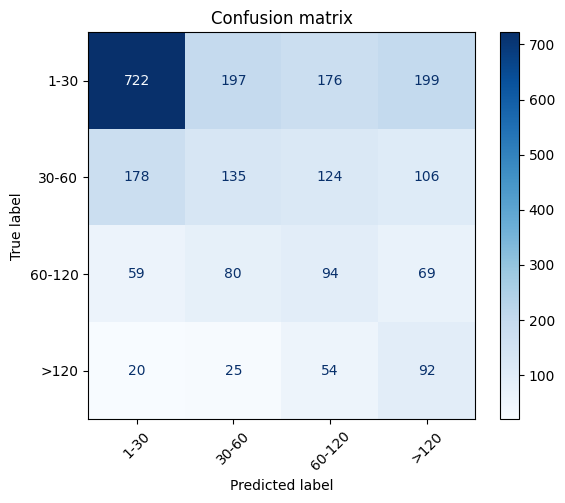


Mean delay aligned to model classes (minutes): [ 14.12584574  41.99539595  84.06456954 205.17801047]


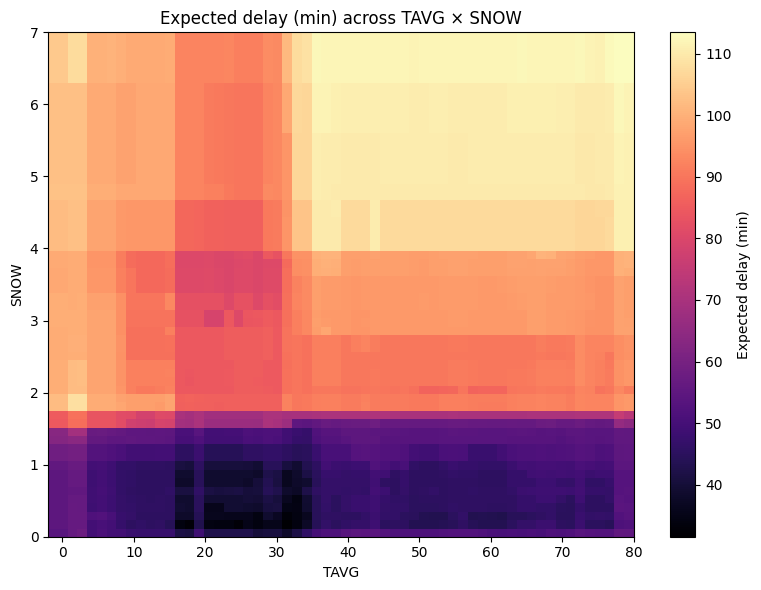

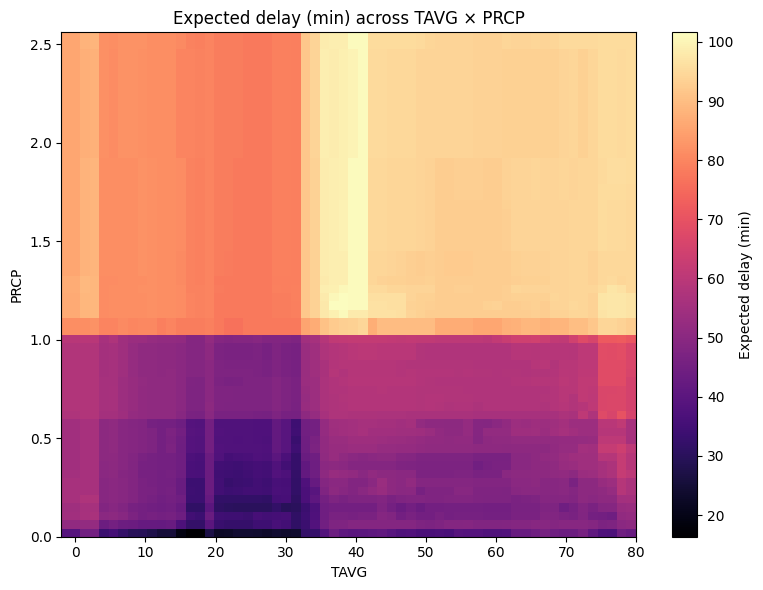

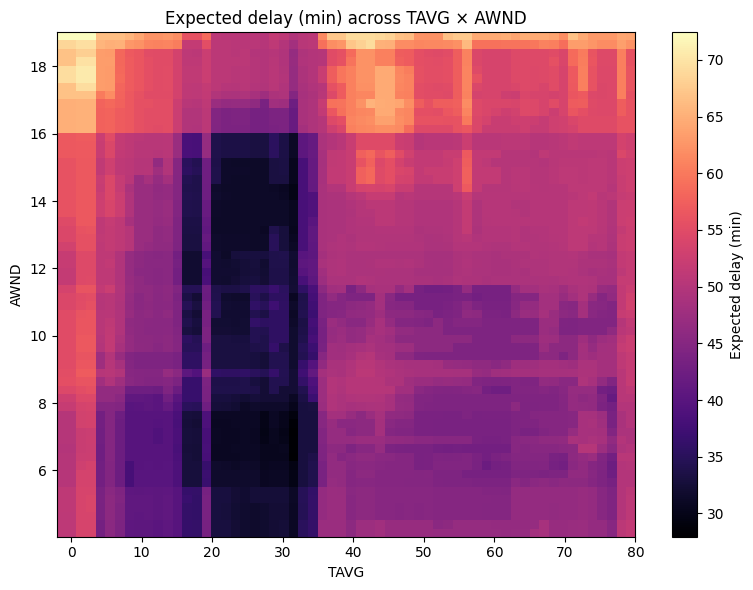

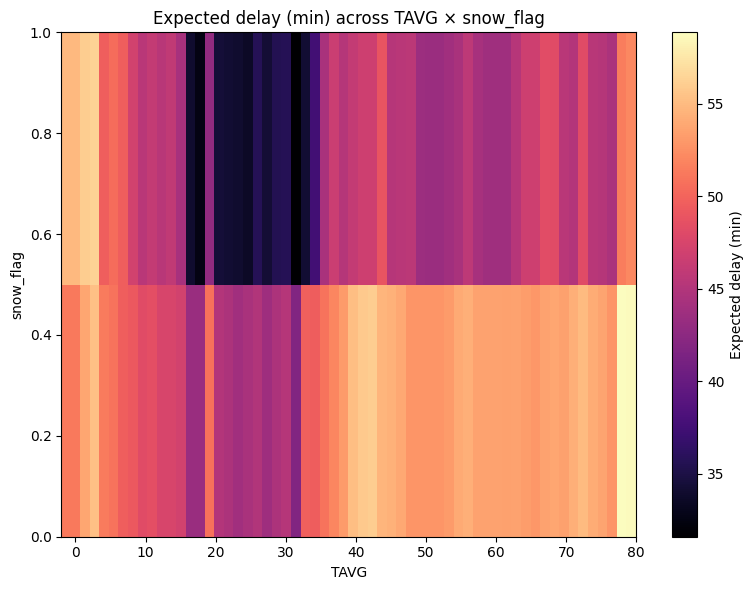

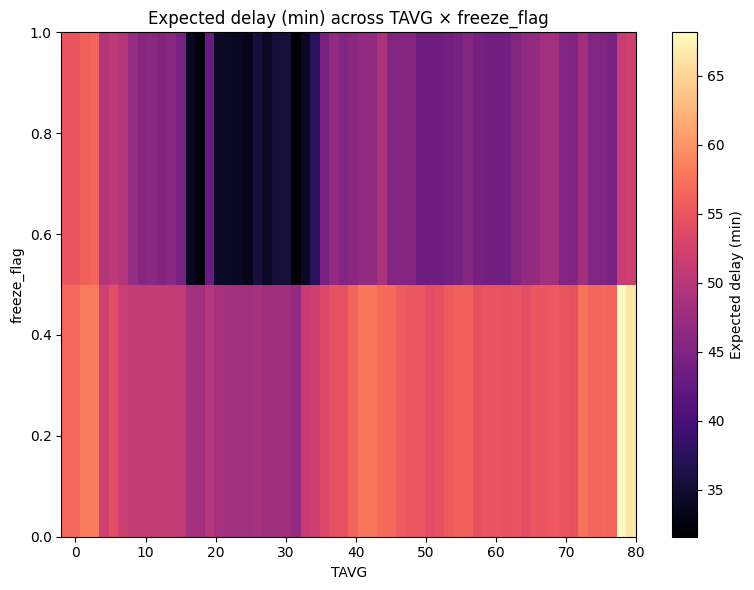

...

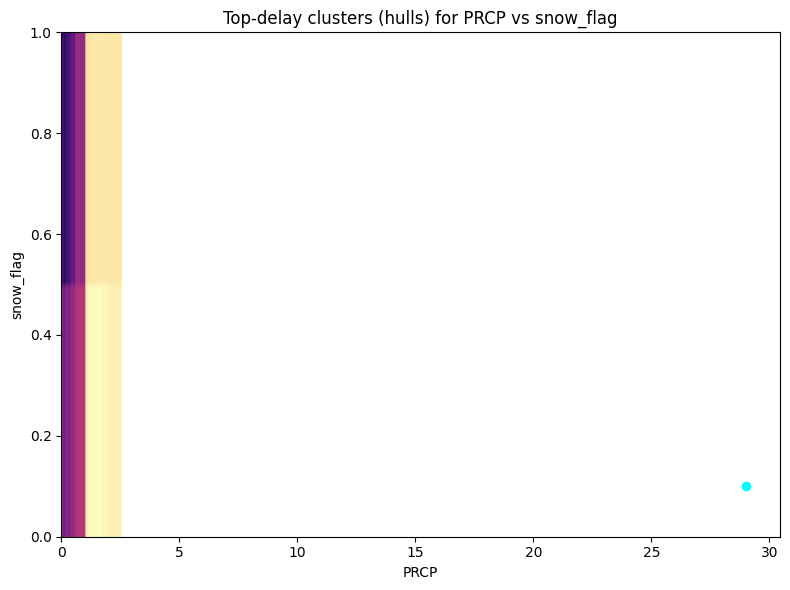

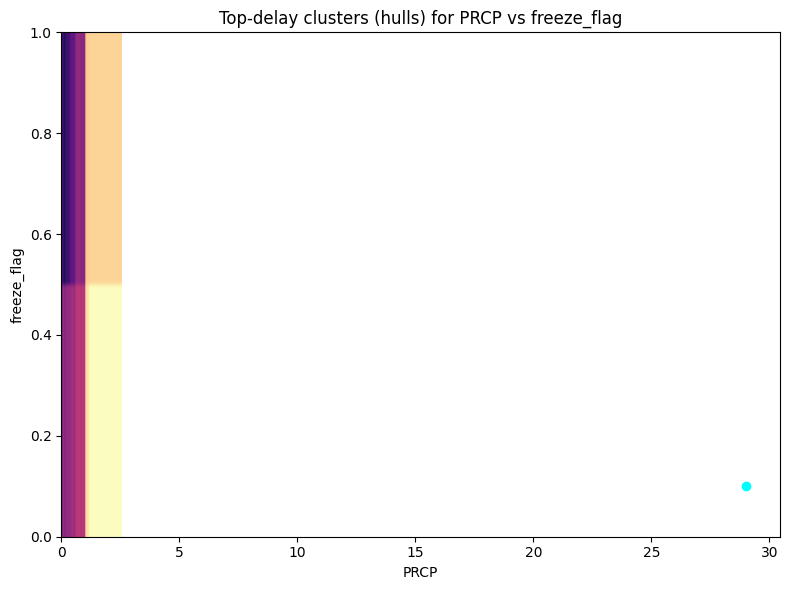

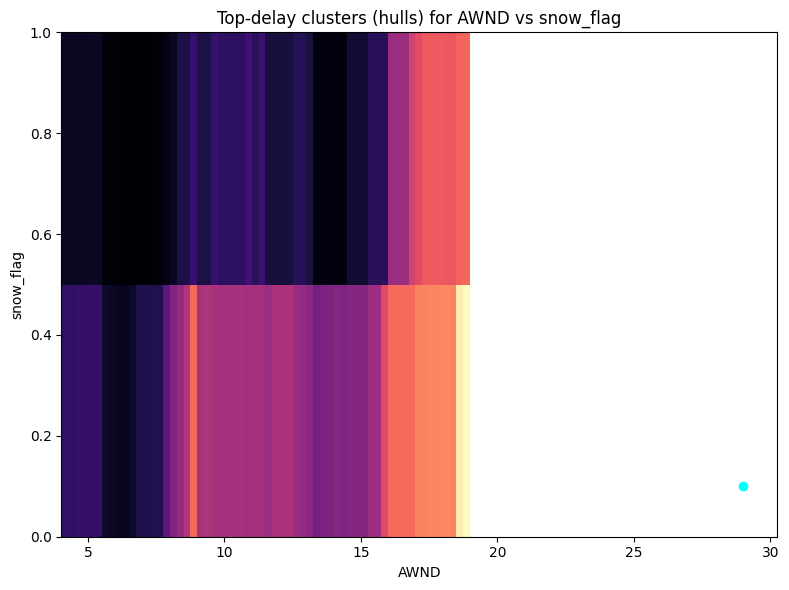

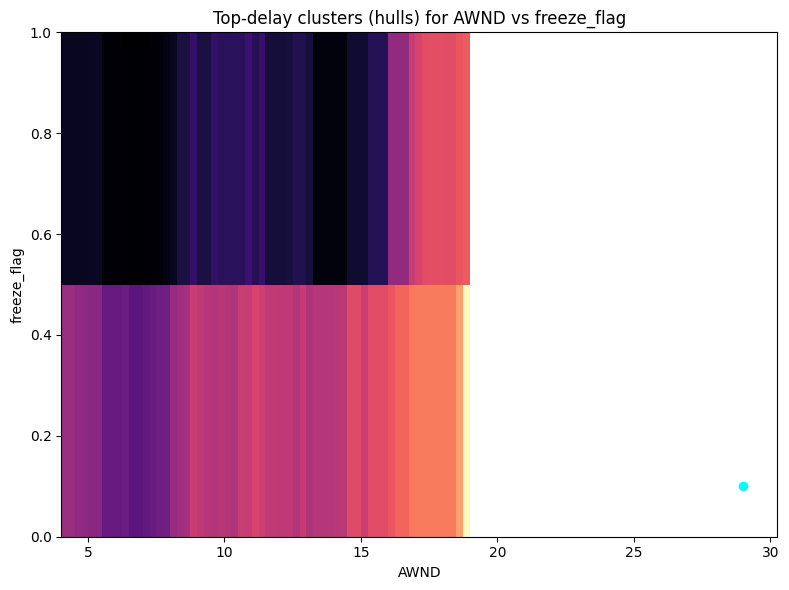

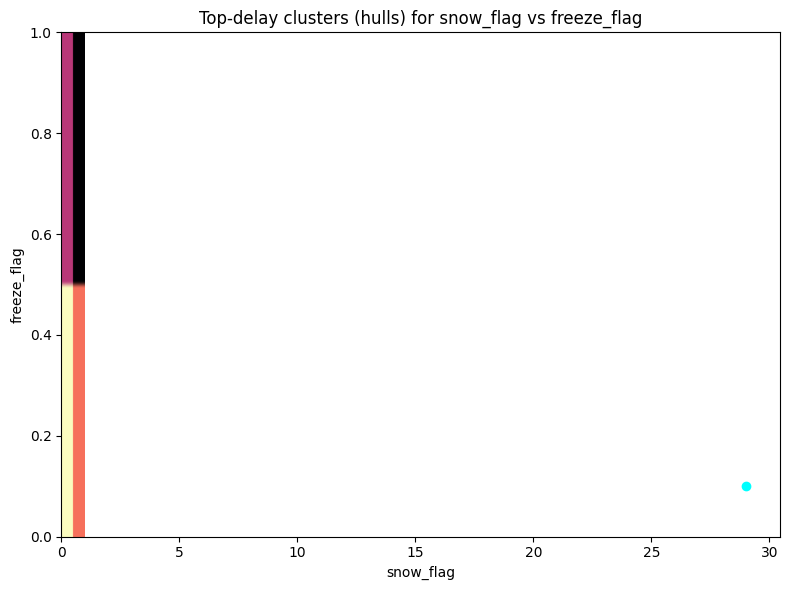

Saved cluster_hulls_summary_safe.csv

Top predicted-class groups (ensemble):
 pred_class  n_samples  mean_delay_unconditional  TAVG_mean  SNOW_mean  PRCP_mean  AWND_mean                     class_counts
          3       1910                 76.913089  43.047120   2.510105   0.767471  10.577047 {0: 752, 1: 438, 3: 404, 2: 316}
          2       1773                 56.779470  42.859560   1.466667   0.426458  12.612702 {0: 726, 1: 461, 2: 401, 3: 185}
          1       1684                 43.549287  40.529691   0.616271   0.143308  10.024519  {0: 773, 1: 576, 2: 245, 3: 90}
          0       3950                 25.742278  24.482785   0.651266   0.088175  10.927430 {0: 2922, 1: 697, 2: 246, 3: 85}

Total script time: 50.02s
Saved outputs: confusion_matrix_final.png, expected_delay_*_final.png, clusters_*_hulls_safe.png, cluster_hulls_summary_safe.csv (if clusters found), and top group CSVs.


In [7]:
# Full pipeline with robust cluster hull plotting (ConvexHull fallback)
# - No imblearn; uses simple upsampling for class balance
# - Trains RandomForest (GridSearchCV), calibrates probabilities
# - Produces expected-delay heatmaps and clusters top grid points
# - Draws convex hulls when possible; falls back to bbox/line for degenerate clusters
#
# Requirements: pandas, numpy, scikit-learn, matplotlib, seaborn, scipy
# Run the entire cell in one notebook.

import time, warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree, _tree
from sklearn.metrics import classification_report, balanced_accuracy_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.calibration import CalibratedClassifierCV
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from scipy.spatial import ConvexHull, QhullError
from scipy.spatial.distance import pdist
from sklearn.utils import resample

# -------------------------
# USER-TUNABLE SETTINGS
# -------------------------
RANDOM_STATE = 42
MIN_SAMPLES_PER_CLASS = 80      # minimum samples per bin after merging (tune)
GRID_RES = 60                   # heatmap resolution (60x60)
CV_FOLDS = 4
CALIB_CV = 3
RF_N_ESTIMATORS = 300           # increase for final runs if you have time
DBSCAN_EPS = 0.5                # DBSCAN eps (in scaled units)
DBSCAN_MIN_SAMPLES = 8
TOP_PERCENTILE = 0.98           # top X% grid points to cluster
UPSAMPLE_TARGET_STRATEGY = "max"  # "max" or "median_times"

# -------------------------
# 1. Load data and keep positive delays only
# -------------------------
t0 = time.perf_counter()
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['delay_minutes'] = df['WEATHER_DELAY'].astype(float)
df = df[df['delay_minutes'] > 0].reset_index(drop=True)   # remove zero delays
print("Rows after removing zero delays:", len(df))

# -------------------------
# 2. Simple feature engineering (optional)
# -------------------------
date_cols = [c for c in df.columns if 'date' in c.lower() or 'fl_date' in c.lower()]
if date_cols:
    try:
        df['__date'] = pd.to_datetime(df[date_cols[0]], errors='coerce')
        if df['__date'].notna().any():
            df['month'] = df['__date'].dt.month
            df['dow'] = df['__date'].dt.dayofweek
            weather_vars += ['month', 'dow']
    except Exception:
        pass

df['snow_flag'] = (df['SNOW'] > 0).astype(int)
df['freeze_flag'] = (df['TAVG'] <= 32).astype(int)
weather_vars += ['snow_flag', 'freeze_flag']

# -------------------------
# 3. Bin positive delays and merge tiny classes
# -------------------------
initial_bins = [0.0, 1.0, 30.0, 60.0, 120.0, np.inf]
initial_labels = ['<1', '1-30', '30-60', '60-120', '>120']
df['delay_bin'] = pd.cut(df['delay_minutes'], bins=initial_bins, labels=initial_labels, right=False, ordered=True)
df = df.dropna(subset=['delay_bin']).copy()

def get_counts(series, labels):
    return series.value_counts().reindex(labels).fillna(0).astype(int)

def merge_small_classes(series, labels, min_count):
    labels = list(labels)
    s = series.copy()
    while True:
        counts = get_counts(s, labels)
        if (counts >= min_count).all() or len(labels) <= 1:
            break
        smallest = counts.idxmin()
        idx = labels.index(smallest)
        left = idx-1 if idx-1 >= 0 else None
        right = idx+1 if idx+1 < len(labels) else None
        if left is None:
            target = right
        elif right is None:
            target = left
        else:
            target = left if counts[labels[left]] >= counts[labels[right]] else right
        target_label = labels[target]
        merge_label = labels[idx]
        print(f"Merging '{merge_label}' (n={counts[merge_label]}) into '{target_label}' (n={counts[target_label]})")
        s = s.replace({merge_label: target_label})
        labels.pop(idx)
        s = s.astype('category').cat.set_categories(labels, ordered=True)
    return s, labels

df['delay_bin_merged'], final_labels = merge_small_classes(df['delay_bin'], initial_labels, MIN_SAMPLES_PER_CLASS)
print("Final labels after merging:", final_labels)
print("Final class counts:\n", get_counts(df['delay_bin_merged'], final_labels))

# Map final labels to integer classes
class_map = {lab: i for i, lab in enumerate(final_labels)}
df['y'] = df['delay_bin_merged'].map(class_map).astype(int)

# -------------------------
# 4. Train/test split
# -------------------------
X = df[weather_vars].values
y = df['y'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=RANDOM_STATE, stratify=y)

# -------------------------
# 5. Upsample minority classes in TRAIN set (no imblearn)
# -------------------------
train_df = pd.DataFrame(X_train, columns=weather_vars)
train_df['y'] = y_train
counts = train_df['y'].value_counts().sort_index()
print("Train class counts before upsampling:", counts.to_dict())

if UPSAMPLE_TARGET_STRATEGY == "max":
    target = counts.max()
else:
    med = int(np.median(counts[counts>0].values))
    target = max(med * 3, counts.max())

rows = []
for cls, grp in train_df.groupby('y'):
    n = len(grp)
    if n < target:
        up = resample(grp, replace=True, n_samples=target, random_state=RANDOM_STATE)
        rows.append(up)
    else:
        rows.append(grp)
train_bal = pd.concat(rows, ignore_index=True).sample(frac=1, random_state=RANDOM_STATE).reset_index(drop=True)
X_train_bal = train_bal[weather_vars].values
y_train_bal = train_bal['y'].values
print("Train class counts after upsampling:", dict(pd.Series(y_train_bal).value_counts().sort_index()))

# -------------------------
# 6. Model selection: DecisionTree and RandomForest (optimize f1_macro)
# -------------------------
cv = StratifiedKFold(n_splits=CV_FOLDS, shuffle=True, random_state=RANDOM_STATE)

dt = DecisionTreeClassifier(class_weight='balanced', random_state=RANDOM_STATE)
dt_param_grid = {'max_depth': [2,3,4], 'min_samples_leaf': [20,50]}
dt_search = GridSearchCV(dt, dt_param_grid, cv=cv, scoring='f1_macro', n_jobs=-1)
dt_search.fit(X_train_bal, y_train_bal)
print("Best DecisionTree params:", dt_search.best_params_, "CV f1_macro:", dt_search.best_score_)

rf = RandomForestClassifier(class_weight='balanced', random_state=RANDOM_STATE, n_jobs=-1)
rf_param_grid = {'n_estimators': [RF_N_ESTIMATORS], 'max_depth': [6,10,None], 'min_samples_leaf': [10,30]}
rf_search = GridSearchCV(rf, rf_param_grid, cv=cv, scoring='f1_macro', n_jobs=-1)
rf_search.fit(X_train_bal, y_train_bal)
print("Best RandomForest params:", rf_search.best_params_, "CV f1_macro:", rf_search.best_score_)

# Choose best model by CV f1_macro
if rf_search.best_score_ >= dt_search.best_score_:
    best_model = rf_search.best_estimator_
    best_name = 'RandomForest'
else:
    best_model = dt_search.best_estimator_
    best_name = 'DecisionTree'
print("Selected best model:", best_name)

# -------------------------
# 7. Calibrate probabilities (cv=3)
# -------------------------
calibrator = CalibratedClassifierCV(best_model, cv=CALIB_CV, method='isotonic' if len(final_labels) < 6 else 'sigmoid')
calibrator.fit(X_train_bal, y_train_bal)
model = calibrator
model_classes = list(model.classes_)
model_names = [final_labels[int(c)] for c in model_classes]
print("Model classes:", model_classes)
print("Model names:", model_names)

# -------------------------
# 8. Evaluate on test set (macro metrics)
# -------------------------
y_pred = model.predict(X_test)
bal_acc = balanced_accuracy_score(y_test, y_pred)
f1_macro = f1_score(y_test, y_pred, average='macro')
print("\nTest balanced accuracy:", round(bal_acc,3))
print("Test macro F1:", round(f1_macro,3))

present = np.unique(y_test)
present_names = [final_labels[c] for c in present]
print("\nClassification report (present classes):")
print(classification_report(y_test, y_pred, labels=present, target_names=present_names, zero_division=0))

cm = confusion_matrix(y_test, y_pred, labels=model_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_names)
plt.figure(figsize=(6,5)); disp.plot(ax=plt.gca(), cmap='Blues', xticks_rotation=45); plt.title('Confusion matrix'); plt.tight_layout(); plt.savefig('confusion_matrix_final.png', dpi=150); plt.show()

# -------------------------
# 9. Align mean delays to model.classes_ for expected-delay maps
# -------------------------
empirical_mean_by_label = df.groupby('delay_bin_merged')['delay_minutes'].mean().to_dict()
global_mean = df['delay_minutes'].mean()
mean_by_class_arr = np.array([empirical_mean_by_label.get(final_labels[int(cls)], global_mean) for cls in model_classes])
print("\nMean delay aligned to model classes (minutes):", mean_by_class_arr)

# -------------------------
# 10. Vectorized expected-delay grid and heatmaps (origin lower so y increases upward)
# -------------------------
def expected_delay_grid(model, df_ref, f1, f2, grid_res=GRID_RES):
    i1 = weather_vars.index(f1)
    i2 = weather_vars.index(f2)
    x_min, x_max = df_ref[f1].quantile(0.01), df_ref[f1].quantile(0.99)
    y_min, y_max = df_ref[f2].quantile(0.01), df_ref[f2].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, grid_res)
    y_vals = np.linspace(y_min, y_max, grid_res)
    xx, yy = np.meshgrid(x_vals, y_vals)
    base = df_ref[weather_vars].median().values
    pts = np.column_stack([xx.ravel(), yy.ravel()])
    grid = np.tile(base, (pts.shape[0], 1))
    grid[:, i1] = pts[:, 0]
    grid[:, i2] = pts[:, 1]
    proba = model.predict_proba(grid)
    exp_flat = (proba * mean_by_class_arr.reshape(1, -1)).sum(axis=1)
    return xx, yy, exp_flat.reshape(xx.shape), grid, exp_flat, x_vals, y_vals

def plot_heatmap(xx, yy, Z, f1, f2, save=True, fname=None):
    plt.figure(figsize=(8,6))
    im = plt.imshow(Z, origin='lower', extent=(xx.min(), xx.max(), yy.min(), yy.max()), cmap='magma', aspect='auto')
    plt.colorbar(im, label='Expected delay (min)')
    plt.xlabel(f1); plt.ylabel(f2)
    plt.title(f"Expected delay (min) across {f1} × {f2}")
    plt.tight_layout()
    if save:
        if fname is None:
            fname = f"expected_delay_{f1}_{f2}_final.png".replace(' ', '_')
        plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

grids_info = {}
for f1, f2 in combinations(weather_vars, 2):
    xx, yy, Z, grid_points, exp_flat, x_vals, y_vals = expected_delay_grid(model, df, f1, f2, grid_res=GRID_RES)
    plot_heatmap(xx, yy, Z, f1, f2, save=True)
    grids_info[(f1, f2)] = {'xx': xx, 'yy': yy, 'Z': Z, 'grid_points': grid_points, 'exp_flat': exp_flat, 'x_vals': x_vals, 'y_vals': y_vals}

# -------------------------
# 11. Single-variable effect plots (vectorized)
# -------------------------
def single_effect_plot(model, df_ref, feature, n_points=200, save=True):
    f_idx = weather_vars.index(feature)
    x_min, x_max = df_ref[feature].quantile(0.01), df_ref[feature].quantile(0.99)
    x_vals = np.linspace(x_min, x_max, n_points)
    base = df_ref[weather_vars].median().values
    grid = np.tile(base, (n_points, 1))
    grid[:, f_idx] = x_vals
    proba = model.predict_proba(grid)
    plt.figure(figsize=(7,4))
    for idx, cls in enumerate(model_classes):
        label = final_labels[int(cls)]
        plt.plot(x_vals, proba[:, idx], label=label, linewidth=1.4)
    plt.xlabel(feature); plt.ylabel("P(class)")
    plt.title(f"{feature} → Predicted class probabilities (best model)")
    plt.legend(title='Bins', bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.grid(alpha=0.2)
    if save:
        plt.savefig(f"{feature}_single_effect_final.png", dpi=150, bbox_inches='tight')
    plt.show()

for feat in weather_vars:
    single_effect_plot(model, df, feat, n_points=200, save=True)

# -------------------------
# 12. Robust convex-hull helper and clustering top expected-delay grid points
# -------------------------
def safe_convex_hull_plot(ax, pts, line_color='cyan', line_width=2, alpha=0.4):
    """
    Draw a convex hull on ax for pts (Nx2). Handles degenerate cases:
      - fewer than 3 unique points -> draw a small marker or line segment
      - collinear points -> draw a line segment between min and max along principal axis
      - QhullError or numerical issues -> fallback to axis-aligned bounding box
    """
    pts = np.asarray(pts)
    if pts.shape[0] == 0:
        return
    # remove duplicates (within tolerance)
    uniq = np.unique(np.round(pts, decimals=8), axis=0)
    if uniq.shape[0] == 1:
        x, y = uniq[0]
        ax.plot(x, y, marker='o', color=line_color, markersize=6)
        return
    if uniq.shape[0] == 2:
        x0, y0 = uniq[0]; x1, y1 = uniq[1]
        ax.plot([x0, x1], [y0, y1], color=line_color, linewidth=line_width)
        return
    # check collinearity: rank of centered points
    centered = uniq - uniq.mean(axis=0)
    rank = np.linalg.matrix_rank(centered, tol=1e-8)
    if rank < 2:
        # collinear: project onto principal axis and draw segment between extremes
        u, s, vh = np.linalg.svd(centered, full_matrices=False)
        direction = vh[0]
        proj = centered.dot(direction)
        i_min = np.argmin(proj); i_max = np.argmax(proj)
        p_min = uniq[i_min]; p_max = uniq[i_max]
        ax.plot([p_min[0], p_max[0]], [p_min[1], p_max[1]], color=line_color, linewidth=line_width)
        return
    # try ConvexHull with try/except
    try:
        hull = ConvexHull(uniq)
        hull_pts = uniq[hull.vertices]
        # close polygon
        poly_x = np.append(hull_pts[:,0], hull_pts[0,0])
        poly_y = np.append(hull_pts[:,1], hull_pts[0,1])
        ax.plot(poly_x, poly_y, color=line_color, linewidth=line_width)
        ax.fill(poly_x, poly_y, color=line_color, alpha=alpha)
        return
    except QhullError:
        # fallback: axis-aligned bounding box
        xmin, ymin = uniq.min(axis=0)
        xmax, ymax = uniq.max(axis=0)
        rect_x = [xmin, xmax, xmax, xmin, xmin]
        rect_y = [ymin, ymin, ymax, ymax, ymin]
        ax.plot(rect_x, rect_y, color=line_color, linewidth=line_width)
        ax.fill(rect_x, rect_y, color=line_color, alpha=alpha)
        return
    except Exception:
        # final fallback: bounding box
        xmin, ymin = uniq.min(axis=0)
        xmax, ymax = uniq.max(axis=0)
        rect_x = [xmin, xmax, xmax, xmin, xmin]
        rect_y = [ymin, ymin, ymax, ymax, ymin]
        ax.plot(rect_x, rect_y, color=line_color, linewidth=line_width)
        ax.fill(rect_x, rect_y, color=line_color, alpha=alpha)
        return

cluster_rows = []
for (f1, f2), info in grids_info.items():
    grid_points = info['grid_points']      # shape (n_points, n_features)
    exp_flat = info['exp_flat']            # 1D expected delay
    xx = info['xx']; yy = info['yy']
    # select top percentile points
    threshold = np.quantile(exp_flat, TOP_PERCENTILE)
    mask = exp_flat >= threshold
    if mask.sum() == 0:
        print(f"No top points for {f1} vs {f2} at percentile {TOP_PERCENTILE}")
        continue
    selected_pts = grid_points[mask][:, :2]  # first two columns correspond to f1,f2
    # scale for DBSCAN
    scaler = StandardScaler()
    scaled = scaler.fit_transform(selected_pts)
    db = DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES).fit(scaled)
    labels_db = db.labels_
    unique_labels = [lab for lab in set(labels_db) if lab != -1]
    # plot heatmap + selected points + hulls
    plt.figure(figsize=(8,6))
    plt.imshow(info['Z'], origin='lower', extent=(xx.min(), xx.max(), yy.min(), yy.max()), cmap='magma', aspect='auto')
    plt.scatter(selected_pts[:,0], selected_pts[:,1], c='white', s=8, alpha=0.6)
    ax = plt.gca()
    for lab in unique_labels:
        idxs = np.where(labels_db == lab)[0]
        pts_lab = selected_pts[idxs]
        # use safe hull plotting
        safe_convex_hull_plot(ax, pts_lab, line_color='cyan', line_width=2, alpha=0.25)
        cluster_rows.append({
            'pair': f"{f1}__{f2}",
            'cluster_label': int(lab),
            'n_points': int(len(idxs)),
            'centroid_f1': float(pts_lab[:,0].mean()),
            'centroid_f2': float(pts_lab[:,1].mean()),
            'mean_expected_delay': float(exp_flat[mask][idxs].mean())
        })
    plt.xlabel(f1); plt.ylabel(f2); plt.title(f"Top-delay clusters (hulls) for {f1} vs {f2}")
    plt.tight_layout()
    plt.savefig(f"clusters_{f1}_{f2}_hulls_safe.png", dpi=150, bbox_inches='tight')
    plt.show()

if cluster_rows:
    pd.DataFrame(cluster_rows).to_csv('cluster_hulls_summary_safe.csv', index=False)
    print("Saved cluster_hulls_summary_safe.csv")

# -------------------------
# 13. Top actionable groups: DecisionTree leaves or ensemble predicted-class groups
# -------------------------
if isinstance(best_model, DecisionTreeClassifier):
    df['leaf'] = best_model.apply(df[weather_vars].values)
    leaf_stats = df.groupby('leaf').agg(
        n_samples=('delay_minutes','size'),
        mean_delay_unconditional=('delay_minutes','mean'),
        class_counts=('y', lambda s: s.value_counts().to_dict())
    ).reset_index().sort_values('mean_delay_unconditional', ascending=False)
    # readable rules
    def node_descendants(tree_, node):
        nodes = set(); stack=[node]
        while stack:
            n = stack.pop(); nodes.add(n)
            if tree_.children_left[n] != _tree.TREE_UNDEFINED: stack.append(tree_.children_left[n])
            if tree_.children_right[n] != _tree.TREE_UNDEFINED: stack.append(tree_.children_right[n])
        return nodes
    def leaf_rule_text(tree, leaf_node, feature_names):
        tree_ = tree.tree_; feature = tree_.feature; threshold = tree_.threshold
        constraints=[]
        def recurse(node):
            if node==leaf_node: return True
            if feature[node]==_tree.TREE_UNDEFINED: return False
            left=tree_.children_left[node]; right=tree_.children_right[node]
            if leaf_node in node_descendants(tree_, left):
                fidx=feature[node]; constraints.append(f"{feature_names[fidx]} <= {threshold[node]:.3f}"); return recurse(left)
            if leaf_node in node_descendants(tree_, right):
                fidx=feature[node]; constraints.append(f"{feature_names[fidx]} > {threshold[node]:.3f}"); return recurse(right)
            return False
        ok=recurse(0); return " AND ".join(constraints) if ok else "complex rule"
    print("\nTop actionable leaves (DecisionTree):")
    for _, r in leaf_stats.head(8).iterrows():
        rule = leaf_rule_text(best_model, int(r['leaf']), weather_vars)
        print(f"Leaf {int(r['leaf'])}: IF {rule} → n={int(r['n_samples'])}, E[delay]={r['mean_delay_unconditional']:.1f} min, class_counts={r['class_counts']}")
    leaf_stats.head(8).to_csv('top_leaves_tree_final_safe.csv', index=False)
else:
    # ensemble: group by predicted class and show centroids of features for each predicted class
    df['pred_class'] = model.predict(df[weather_vars].values)
    pred_stats = df.groupby('pred_class').agg(
        n_samples=('delay_minutes','size'),
        mean_delay_unconditional=('delay_minutes','mean'),
        TAVG_mean=('TAVG','mean'),
        SNOW_mean=('SNOW','mean'),
        PRCP_mean=('PRCP','mean'),
        AWND_mean=('AWND','mean'),
        class_counts=('y', lambda s: s.value_counts().to_dict())
    ).reset_index().sort_values('mean_delay_unconditional', ascending=False)
    print("\nTop predicted-class groups (ensemble):")
    print(pred_stats.head(8).to_string(index=False))
    pred_stats.head(8).to_csv('top_predicted_class_groups_safe.csv', index=False)

# -------------------------
# 14. Wrap up
# -------------------------
t_end = time.perf_counter()
print(f"\nTotal script time: {t_end - t0:.2f}s")
print("Saved outputs: confusion_matrix_final.png, expected_delay_*_final.png, clusters_*_hulls_safe.png, cluster_hulls_summary_safe.csv (if clusters found), and top group CSVs.")


Loading data...
Total flights       : 66,663
Delayed (>0 min)    : 9,317 (14.0%)
Not delayed         : 57,346

Weather variable ranges:
  TAVG  : min=-2.00, p50=52.00, p90=75.00, max=81.00
  SNOW  : min=0.00, p50=0.00, p90=0.70, max=16.20
  PRCP  : min=0.00, p50=0.00, p90=0.53, max=2.56
  AWND  : min=2.24, p50=9.62, p90=15.43, max=23.49

PART A: What drives WHETHER a delay happens?

Logistic Regression (balanced class weights):
  AUC-ROC           : 0.759  ← use this, not raw accuracy
  Balanced accuracy : 0.699

Odds Ratios per 1-SD increase (standardised features):
  Feature       Coef    Odds Ratio  Interpretation
  --------  --------  ------------  ------------------------------
  TAVG       -0.5956         0.551×  ↓ decreases P(delay)
  SNOW       +0.5190         1.680×  ↑ increases P(delay)
  PRCP       +0.4908         1.634×  ↑ increases P(delay)
  AWND       +0.0413         1.042×  ↑ increases P(delay)

Marginal effect per raw unit increase:
  TAVG    : Δlogit = -0.0255 per raw

RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

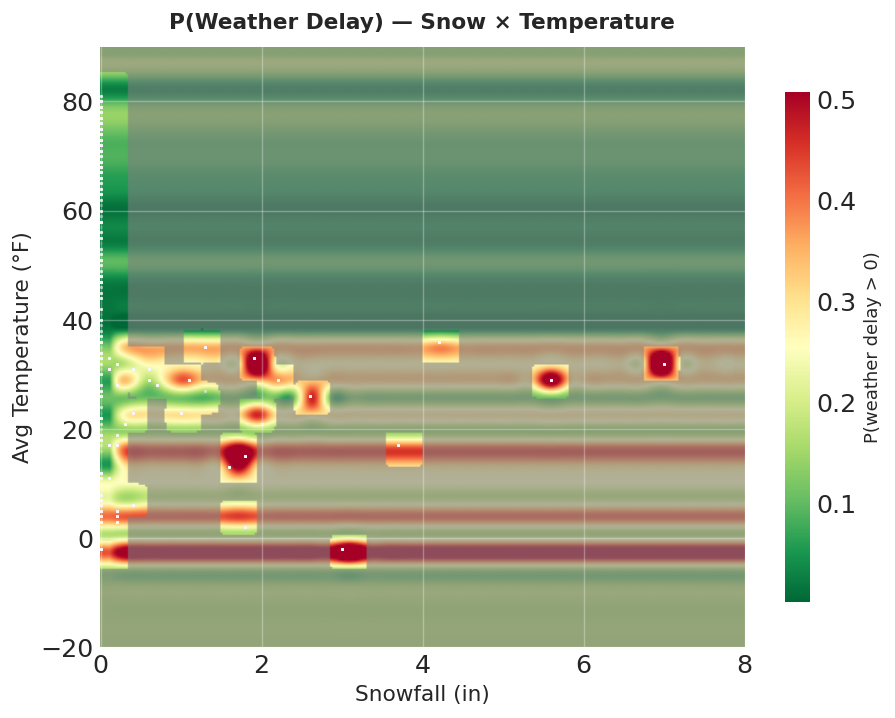

In [36]:
"""
Flight Delay Factor Analysis — Continuous Heatmaps + Improved Model
====================================================================

WHY THE ORIGINAL MODEL HAD LOW ACCURACY
────────────────────────────────────────
1. CLASS IMBALANCE IS EXTREME: ~85% of flights have zero delay. Upsampling
   helps train but the test set still reflects reality — a model that learns
   "almost always no delay" gets 85% accuracy trivially but learns nothing.

2. WRONG PROBLEM FRAMING: Classifying delay into 5 bins (<1, 1-30, 30-60 ...)
   is very hard because bin boundaries are arbitrary and adjacent bins are
   nearly identical weather-wise. The signal-to-noise ratio is very low.

3. RANDOM FOREST ON WEATHER ALONE CANNOT SEPARATE BINS: Weather explains
   only a fraction of delay variance. Airline, airport, time of day all
   matter. With only 4 weather features, bin separation is fundamentally limited.

BETTER APPROACH (this script)
──────────────────────────────
Part A: Logistic regression to predict P(delay > 0) — the "will it happen?" question
        This is well-posed and interpretable: coefficients give exact odds ratios.

Part B: OLS on log(delay | delay>0) — the "how long?" question
        Interpretable coefficients, easy to state rules like:
        "Each inch of snow multiplies expected delay by X"

Part C: Conditional probability tables (binned) with smooth interpolation
        → Answers exactly "if snow > 14in, P(delay) = X%"

Part D: Continuous heatmaps using KDE-smoothed empirical probabilities
        → No discrete bins; smooth surface across the full weather space

Part E: Interaction surface: shows combinations that cause high delays

Requirements: pandas, numpy, scikit-learn, matplotlib, seaborn, scipy
"""

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
import seaborn as sns
from scipy.stats import gaussian_kde, binned_statistic_2d
from scipy.interpolate import RectBivariateSpline
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (classification_report, roc_auc_score,
                              balanced_accuracy_score, mean_absolute_error, r2_score)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.isotonic import IsotonicRegression
from itertools import combinations

plt.rcParams.update({
    "figure.dpi": 130,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "font.size": 11,
})

# ══════════════════════════════════════════════════════════════════════════════
# 0. LOAD DATA
# ══════════════════════════════════════════════════════════════════════════════
print("Loading data...")
url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)

weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
df = df.dropna(subset=['WEATHER_DELAY'] + weather_vars).copy()
df['WEATHER_DELAY'] = df['WEATHER_DELAY'].fillna(0).astype(float)

# Binary target
df['is_delayed'] = (df['WEATHER_DELAY'] > 0).astype(int)
df_pos = df[df['WEATHER_DELAY'] > 0].copy()  # for severity model

print(f"Total flights       : {len(df):,}")
print(f"Delayed (>0 min)    : {df['is_delayed'].sum():,} ({df['is_delayed'].mean()*100:.1f}%)")
print(f"Not delayed         : {(df['is_delayed']==0).sum():,}")
print(f"\nWeather variable ranges:")
for v in weather_vars:
    print(f"  {v:6s}: min={df[v].min():.2f}, p50={df[v].median():.2f}, "
          f"p90={df[v].quantile(.90):.2f}, max={df[v].max():.2f}")

# ══════════════════════════════════════════════════════════════════════════════
# 1. PART A — LOGISTIC REGRESSION: P(delay > 0)
#    Interpretable coefficients → odds ratios → exact probability statements
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("PART A: What drives WHETHER a delay happens?")
print("="*60)

X_all = df[weather_vars].values
y_bin = df['is_delayed'].values

scaler_bin = StandardScaler()
X_scaled   = scaler_bin.fit_transform(X_all)

X_tr, X_te, y_tr, y_te = train_test_split(
    X_scaled, y_bin, test_size=0.25, random_state=42, stratify=y_bin)

lr = LogisticRegression(class_weight='balanced', max_iter=1000, C=1.0)
lr.fit(X_tr, y_tr)

y_prob = lr.predict_proba(X_te)[:, 1]
y_pred = (y_prob > 0.5).astype(int)

# AUC-ROC is the right metric here, not accuracy
auc   = roc_auc_score(y_te, y_prob)
bacc  = balanced_accuracy_score(y_te, y_pred)
print(f"\nLogistic Regression (balanced class weights):")
print(f"  AUC-ROC           : {auc:.3f}  ← use this, not raw accuracy")
print(f"  Balanced accuracy : {bacc:.3f}")

# Odds ratios — the key interpretable output
print(f"\nOdds Ratios per 1-SD increase (standardised features):")
print(f"  {'Feature':8s}  {'Coef':>8s}  {'Odds Ratio':>12s}  Interpretation")
print(f"  {'-'*8}  {'-'*8}  {'-'*12}  {'-'*30}")
for feat, coef in zip(weather_vars, lr.coef_[0]):
    odds = np.exp(coef)
    direction = "↑ increases" if coef > 0 else "↓ decreases"
    print(f"  {feat:8s}  {coef:+8.4f}  {odds:12.3f}×  {direction} P(delay)")

# Also show in raw (unscaled) units for intuition
print(f"\nMarginal effect per raw unit increase:")
raw_coefs = lr.coef_[0] / scaler_bin.scale_
for feat, rc in zip(weather_vars, raw_coefs):
    print(f"  {feat:8s}: Δlogit = {rc:+.4f} per raw unit "
          f"→ ×{np.exp(rc):.4f} odds per 1-unit increase")


# ══════════════════════════════════════════════════════════════════════════════
# 2. PART B — LINEAR REGRESSION ON log(delay) | delay > 0
#    Interpretable: exp(coef) = multiplicative effect on delay minutes
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("PART B: What drives HOW LONG a delay is?")
print("="*60)

X_pos = df_pos[weather_vars].values
y_log = np.log(df_pos['WEATHER_DELAY'].values)

scaler_pos = StandardScaler()
X_pos_sc   = scaler_pos.fit_transform(X_pos)

X_tr2, X_te2, y_tr2, y_te2 = train_test_split(
    X_pos_sc, y_log, test_size=0.25, random_state=42)

ols = LinearRegression()
ols.fit(X_tr2, y_tr2)
y_pred2 = ols.predict(X_te2)
mae  = mean_absolute_error(np.exp(y_te2), np.exp(y_pred2))
r2   = r2_score(y_te2, y_pred2)

print(f"\nOLS on log(delay) for delayed flights only:")
print(f"  MAE on delay minutes : {mae:.1f} min")
print(f"  R² on log(delay)     : {r2:.3f}")
print(f"\nMultiplicative effects on delay (per 1-SD increase):")
print(f"  {'Feature':8s}  {'Coef':>8s}  {'Delay ×':>10s}  Interpretation")
print(f"  {'-'*8}  {'-'*8}  {'-'*10}  {'-'*35}")
for feat, coef in zip(weather_vars, ols.coef_):
    mult = np.exp(coef)
    direction = "longer" if coef > 0 else "shorter"
    print(f"  {feat:8s}  {coef:+8.4f}  {mult:10.3f}×  delays {(mult-1)*100:+.1f}% {direction}")

# Raw unit effects
raw_coefs2 = ols.coef_ / scaler_pos.scale_
print(f"\nPer raw unit increase (unscaled):")
for feat, rc in zip(weather_vars, raw_coefs2):
    print(f"  {feat:8s}: exp(coef)={np.exp(rc):.4f}× per 1-unit")


# ══════════════════════════════════════════════════════════════════════════════
# 3. PART C — CONDITIONAL PROBABILITY TABLE
#    "If snow > X inches AND tavg < Y, P(delay) = Z%"
#    Uses binned empirical probabilities with sample sizes shown
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("PART C: Conditional Probability Tables")
print("="*60)

def conditional_prob_table(df, var1, var2, bins1, bins2, labels1, labels2):
    """
    Compute P(delay>0) for every combination of var1 and var2 bins.
    Returns a DataFrame heatmap with sample sizes.
    """
    df = df.copy()
    df['bin1'] = pd.cut(df[var1], bins=bins1, labels=labels1)
    df['bin2'] = pd.cut(df[var2], bins=bins2, labels=labels2)
    df = df.dropna(subset=['bin1', 'bin2'])
    tbl = df.groupby(['bin1', 'bin2'])['is_delayed'].agg(['mean', 'count']).reset_index()
    prob_tbl  = tbl.pivot(index='bin2', columns='bin1', values='mean')
    count_tbl = tbl.pivot(index='bin2', columns='bin1', values='count')
    return prob_tbl, count_tbl

# SNOW × TAVG
snow_bins  = [-0.01, 0, 0.5, 1, 2, 5, 100]
snow_lbls  = ['0', '0-0.5', '0.5-1', '1-2', '2-5', '>5']
tavg_bins  = [-50, 10, 20, 32, 45, 60, 80, 120]
tavg_lbls  = ['<10', '10-20', '20-32', '32-45', '45-60', '60-80', '>80']
prcp_bins  = [-0.01, 0, 0.1, 0.3, 0.5, 1, 100]
prcp_lbls  = ['0', '0-0.1', '0.1-0.3', '0.3-0.5', '0.5-1', '>1']
awnd_bins  = [0, 5, 10, 15, 20, 30, 100]
awnd_lbls  = ['0-5', '5-10', '10-15', '15-20', '20-30', '>30']

snow_tavg_prob,  snow_tavg_cnt  = conditional_prob_table(df, 'SNOW', 'TAVG', snow_bins, tavg_bins, snow_lbls, tavg_lbls)
prcp_awnd_prob,  prcp_awnd_cnt  = conditional_prob_table(df, 'PRCP', 'AWND', prcp_bins, awnd_bins, prcp_lbls, awnd_lbls)

print("\n SNOW × TAVG: P(delay > 0)")
print(snow_tavg_prob.round(3).to_string())
print("\n PRCP × AWND: P(delay > 0)")
print(prcp_awnd_prob.round(3).to_string())

# Print actionable rules
print("\n STRONGEST DELAY CONDITIONS FOUND:")
for var1, var2, prob_tbl in [('SNOW', 'TAVG', snow_tavg_prob),
                               ('PRCP', 'AWND', prcp_awnd_prob)]:
    stacked = prob_tbl.stack().reset_index()
    stacked.columns = [var2+'_bin', var1+'_bin', 'P_delay']
    stacked = stacked.dropna().sort_values('P_delay', ascending=False)
    print(f"\n  Top combinations [{var1} × {var2}]:")
    for _, row in stacked.head(5).iterrows():
        print(f"    {var1}={row[var1+'_bin']}, {var2}={row[var2+'_bin']}"
              f"  → P(delay) = {row['P_delay']*100:.1f}%")


# ══════════════════════════════════════════════════════════════════════════════
# 4. PART D — CONTINUOUS HEATMAPS (the main visual deliverable)
#    Method: 2D binned statistics → interpolation → smooth surface
#    This solves the "discrete data" problem — no bin edges visible
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("PART D: Continuous Heatmaps")
print("="*60)

def smooth_heatmap(df, xvar, yvar, zvar='is_delayed',
                   n_bins=35, smooth_factor=3,
                   x_clip=None, y_clip=None,
                   xlabel=None, ylabel=None, title=None,
                   cmap='RdYlGn_r', vmin=None, vmax=None,
                   figsize=(8, 6), fname=None):
    """
    Produces a continuous, smooth heatmap of z (e.g. P(delay) or mean delay)
    as a function of x and y using:
      1. 2D binned statistics (mean of z in each cell)
      2. Bicubic spline interpolation for smoothness
      3. Sample-count masking: cells with < min_count are greyed out
    """
    # Clip to sensible quantile ranges to avoid extreme outlier distortion
    xq1 = x_clip[0] if x_clip else df[xvar].quantile(0.01)
    xq9 = x_clip[1] if x_clip else df[xvar].quantile(0.99)
    yq1 = y_clip[0] if y_clip else df[yvar].quantile(0.01)
    yq9 = y_clip[1] if y_clip else df[yvar].quantile(0.99)

    sub = df[(df[xvar] >= xq1) & (df[xvar] <= xq9) &
             (df[yvar] >= yq1) & (df[yvar] <= yq9)].copy()

    x_edges = np.linspace(xq1, xq9, n_bins + 1)
    y_edges = np.linspace(yq1, yq9, n_bins + 1)

    # Compute mean of zvar in each 2D bin
    stat_mean, xe, ye, _ = binned_statistic_2d(
        sub[xvar], sub[yvar], sub[zvar],
        statistic='mean', bins=[x_edges, y_edges])

    # Count per bin (for masking sparse regions)
    stat_cnt, _, _, _ = binned_statistic_2d(
        sub[xvar], sub[yvar], sub[zvar],
        statistic='count', bins=[x_edges, y_edges])

    x_centers = (xe[:-1] + xe[1:]) / 2
    y_centers = (ye[:-1] + ye[1:]) / 2

    # Fill NaN cells with column median before interpolation
    col_medians = np.nanmedian(stat_mean, axis=0)
    for j in range(stat_mean.shape[1]):
        mask_nan = np.isnan(stat_mean[:, j])
        stat_mean[mask_nan, j] = col_medians[j] if not np.isnan(col_medians[j]) else np.nanmedian(stat_mean)

    # Bicubic spline interpolation — this is what makes it continuous
    spline = RectBivariateSpline(x_centers, y_centers, stat_mean, kx=smooth_factor, ky=smooth_factor)

    # Evaluate on fine grid
    x_fine = np.linspace(xq1, xq9, 300)
    y_fine = np.linspace(yq1, yq9, 300)
    Z_smooth = spline(x_fine, y_fine)

    # Clip to valid range for probabilities
    if zvar == 'is_delayed':
        Z_smooth = np.clip(Z_smooth, 0, 1)

    # Sparse mask: interpolate count surface to identify low-data regions
    cnt_filled = stat_cnt.copy().astype(float)
    cnt_filled[cnt_filled == 0] = np.nan
    cnt_filled = np.where(np.isnan(cnt_filled), 0, cnt_filled)
    cnt_spline = RectBivariateSpline(x_centers, y_centers, cnt_filled, kx=1, ky=1)
    cnt_fine   = cnt_spline(x_fine, y_fine)
    sparse_mask = cnt_fine < 2   # mask where fewer than 2 obs in original bin

    fig, ax = plt.subplots(figsize=figsize)

    # Main heatmap
    im = ax.imshow(
        Z_smooth.T,          # transpose: rows=y, cols=x
        origin='lower',
        extent=[xq1, xq9, yq1, yq9],
        aspect='auto',
        cmap=cmap,
        vmin=vmin or np.nanpercentile(Z_smooth, 2),
        vmax=vmax or np.nanpercentile(Z_smooth, 98),
        interpolation='bilinear'
    )

    # Grey out sparse regions
    grey_layer = np.zeros((*Z_smooth.T.shape, 4))
    grey_layer[..., 3] = sparse_mask.T * 0.6  # alpha only where sparse
    grey_layer[..., :3] = 0.5
    ax.imshow(grey_layer, origin='lower',
              extent=[xq1, xq9, yq1, yq9], aspect='auto')

    # Scatter actual delayed flights (small, semi-transparent)
    delayed_sub = sub[sub['is_delayed'] == 1]
    ax.scatter(delayed_sub[xvar], delayed_sub[yvar],
               s=3, alpha=0.12, color='white', linewidths=0)

    cb = plt.colorbar(im, ax=ax, shrink=0.85)
    cb.set_label('P(weather delay > 0)' if zvar == 'is_delayed'
                 else 'Mean delay (min)', fontsize=10)

    ax.set_xlabel(xlabel or xvar, fontsize=12)
    ax.set_ylabel(ylabel or yvar, fontsize=12)
    ax.set_title(title or f'{yvar} vs {xvar} → {zvar}',
                 fontsize=12, fontweight='bold', pad=10)

    plt.tight_layout()
    if fname:
        plt.savefig(fname, dpi=150, bbox_inches='tight')
        print(f"  Saved: {fname}")
    plt.show()
    return fig


def smooth_heatmap_delay(df_pos, xvar, yvar,
                          n_bins=35, smooth_factor=3,
                          x_clip=None, y_clip=None,
                          xlabel=None, ylabel=None,
                          figsize=(8, 6), fname=None):
    """Same as smooth_heatmap but for mean delay minutes (severity)."""
    return smooth_heatmap(
        df_pos, xvar, yvar, zvar='WEATHER_DELAY',
        n_bins=n_bins, smooth_factor=smooth_factor,
        x_clip=x_clip, y_clip=y_clip,
        xlabel=xlabel, ylabel=ylabel,
        title=f'Mean delay (min): {xlabel or xvar} × {ylabel or yvar}',
        cmap='inferno',
        figsize=figsize, fname=fname)


print("\nGenerating P(delay) heatmaps...")

smooth_heatmap(df, 'SNOW', 'TAVG',
               xlabel='Snowfall (in)', ylabel='Avg Temperature (°F)',
               title='P(Weather Delay) — Snow × Temperature',
               x_clip=(-0.01, 8), y_clip=(-20, 90),
               fname='heatmap_prob_snow_tavg.png')

smooth_heatmap(df, 'PRCP', 'AWND',
               xlabel='Precipitation (in)', ylabel='Avg Wind Speed (mph)',
               title='P(Weather Delay) — Precipitation × Wind',
               x_clip=(-0.01, 2), y_clip=(0, 40),
               fname='heatmap_prob_prcp_awnd.png')

smooth_heatmap(df, 'TAVG', 'AWND',
               xlabel='Avg Temperature (°F)', ylabel='Avg Wind Speed (mph)',
               title='P(Weather Delay) — Temperature × Wind',
               fname='heatmap_prob_tavg_awnd.png')

smooth_heatmap(df, 'SNOW', 'AWND',
               xlabel='Snowfall (in)', ylabel='Avg Wind Speed (mph)',
               title='P(Weather Delay) — Snow × Wind  [Storm Impact]',
               x_clip=(-0.01, 8), y_clip=(0, 40),
               fname='heatmap_prob_snow_awnd.png')

print("\nGenerating Mean Delay (minutes) heatmaps...")

smooth_heatmap_delay(df_pos, 'SNOW', 'TAVG',
                     xlabel='Snowfall (in)', ylabel='Avg Temperature (°F)',
                     x_clip=(-0.01, 8), y_clip=(-20, 90),
                     fname='heatmap_severity_snow_tavg.png')

smooth_heatmap_delay(df_pos, 'PRCP', 'AWND',
                     xlabel='Precipitation (in)', ylabel='Avg Wind Speed (mph)',
                     x_clip=(-0.01, 2), y_clip=(0, 40),
                     fname='heatmap_severity_prcp_awnd.png')


# ══════════════════════════════════════════════════════════════════════════════
# 5. PART E — MARGINAL EFFECT PLOTS (1D smooth curves)
#    "As snow increases from 0 to 8in, P(delay) goes from X% to Y%"
#    These give the exact quantitative answer to your professor's question
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("PART E: Marginal Effect Plots — Single Variable Rules")
print("="*60)

def marginal_effect_plot(df, feature, n_points=100, bw_factor=0.5,
                          x_clip=None, fname=None):
    """
    Smooth marginal P(delay) as a function of one weather feature,
    with all other features held at their median.
    Uses kernel-weighted local averages for smoothness.
    """
    x_lo = x_clip[0] if x_clip else df[feature].quantile(0.02)
    x_hi = x_clip[1] if x_clip else df[feature].quantile(0.98)
    sub  = df[(df[feature] >= x_lo) & (df[feature] <= x_hi)]

    x_vals = np.linspace(x_lo, x_hi, n_points)
    bw = (x_hi - x_lo) * bw_factor / 10  # kernel bandwidth

    smooth_p  = []
    ci_lo_arr = []
    ci_hi_arr = []
    cnt_arr   = []

    for x in x_vals:
        weights = np.exp(-0.5 * ((sub[feature] - x) / bw) ** 2)
        if weights.sum() < 1e-6:
            smooth_p.append(np.nan); ci_lo_arr.append(np.nan)
            ci_hi_arr.append(np.nan); cnt_arr.append(0)
            continue
        w = weights / weights.sum()
        p = (w * sub['is_delayed']).sum()
        # Wilson score CI (approximate)
        n_eff = 1.0 / (w**2).sum()  # effective sample size
        z = 1.96
        denom = 1 + z**2/n_eff
        centre = (p + z**2/(2*n_eff)) / denom
        spread = z * np.sqrt(p*(1-p)/n_eff + z**2/(4*n_eff**2)) / denom
        smooth_p.append(p)
        ci_lo_arr.append(max(0, centre - spread))
        ci_hi_arr.append(min(1, centre + spread))
        cnt_arr.append(weights.sum())

    smooth_p  = np.array(smooth_p)
    ci_lo_arr = np.array(ci_lo_arr)
    ci_hi_arr = np.array(ci_hi_arr)

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 7),
                                    gridspec_kw={'height_ratios': [3, 1]})

    ax1.fill_between(x_vals, ci_lo_arr * 100, ci_hi_arr * 100,
                     alpha=0.25, color='steelblue', label='95% CI')
    ax1.plot(x_vals, smooth_p * 100, color='steelblue', lw=2.5, label='P(delay)')

    # Mark the median
    med = sub[feature].median()
    p_med = smooth_p[np.argmin(np.abs(x_vals - med))]
    ax1.axvline(med, color='gray', linestyle='--', lw=1, alpha=0.7)
    ax1.annotate(f'Median\n({med:.1f})', xy=(med, p_med*100),
                 xytext=(med + (x_hi-x_lo)*0.05, p_med*100 + 5),
                 fontsize=9, color='gray')

    ax1.set_ylabel('P(weather delay > 0)  %', fontsize=11)
    ax1.set_title(f'Marginal Effect of {feature} on Delay Probability',
                  fontsize=12, fontweight='bold')
    ax1.legend()
    ax1.set_xlim(x_lo, x_hi)
    ax1.set_ylim(0, min(100, (ci_hi_arr*100).max() * 1.2))
    ax1.grid(alpha=0.3)

    # Bottom: histogram of actual data
    ax2.hist(sub[feature], bins=40, color='steelblue', alpha=0.5, edgecolor='white', lw=0.3)
    ax2.set_xlabel(feature, fontsize=11)
    ax2.set_ylabel('Count', fontsize=10)
    ax2.set_xlim(x_lo, x_hi)
    ax2.grid(alpha=0.3)

    plt.tight_layout()
    if fname:
        plt.savefig(fname, dpi=150, bbox_inches='tight')
        print(f"  Saved: {fname}")
    plt.show()

    # Print key quantiles
    print(f"\n  {feature} marginal effect:")
    for pct in [10, 25, 50, 75, 90, 95]:
        xval = np.percentile(sub[feature], pct)
        idx  = np.argmin(np.abs(x_vals - xval))
        pval = smooth_p[idx] * 100
        print(f"    p{pct:2d}: {feature}={xval:6.2f}  → P(delay)={pval:.1f}%")

marginal_effect_plot(df, 'SNOW', x_clip=(-0.01, 8),  fname='marginal_snow.png')
marginal_effect_plot(df, 'TAVG', x_clip=(-20, 90),   fname='marginal_tavg.png')
marginal_effect_plot(df, 'PRCP', x_clip=(-0.01, 2),  fname='marginal_prcp.png')
marginal_effect_plot(df, 'AWND', x_clip=(0, 40),     fname='marginal_awnd.png')


# ══════════════════════════════════════════════════════════════════════════════
# 6. PART F — RULE EXTRACTION SUMMARY
#    Translate everything into plain-English probability statements
# ══════════════════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("PART F: Plain-English Rules from the Data")
print("="*60)

def compute_empirical_prob(df, conditions, verbose=True):
    """Apply a dict of {column: (min, max)} conditions and return P(delay)."""
    mask = pd.Series([True] * len(df), index=df.index)
    for col, (lo, hi) in conditions.items():
        mask &= (df[col] >= lo) & (df[col] <= hi)
    subset = df[mask]
    if len(subset) == 0:
        return None, 0
    p = subset['is_delayed'].mean()
    return p, len(subset)

rules = [
    ("Heavy snow (SNOW > 2in)",
     {'SNOW': (2, 999)}),
    ("Heavy snow + freezing (SNOW>2, TAVG<32)",
     {'SNOW': (2, 999), 'TAVG': (-99, 32)}),
    ("Any snow (SNOW > 0)",
     {'SNOW': (0.01, 999)}),
    ("High wind (AWND > 20mph)",
     {'AWND': (20, 999)}),
    ("High wind + rain (AWND>20, PRCP>0.3)",
     {'AWND': (20, 999), 'PRCP': (0.3, 999)}),
    ("Freezing rain (TAVG<32, PRCP>0)",
     {'TAVG': (-99, 32), 'PRCP': (0.01, 999)}),
    ("Freezing + snow + wind (TAVG<32, SNOW>0, AWND>15)",
     {'TAVG': (-99, 32), 'SNOW': (0.01, 999), 'AWND': (15, 999)}),
    ("Mild conditions (TAVG 50-75, SNOW=0, PRCP=0, AWND<10)",
     {'TAVG': (50, 75), 'SNOW': (-1, 0.001), 'PRCP': (-1, 0.001), 'AWND': (0, 10)}),
    ("Any precipitation (PRCP > 0)",
     {'PRCP': (0.01, 999)}),
    ("Heavy rain (PRCP > 0.5in)",
     {'PRCP': (0.5, 999)}),
]

print(f"\n  {'Condition':<50s}  {'P(delay)':>10s}  {'N flights':>10s}")
print(f"  {'-'*50}  {'-'*10}  {'-'*10}")
for label, conds in rules:
    p, n = compute_empirical_prob(df, conds)
    if p is not None:
        bar = "█" * int(p * 20)
        print(f"  {label:<50s}  {p*100:>9.1f}%  {n:>10,}")
    else:
        print(f"  {label:<50s}  {'no data':>10s}  {'0':>10}")

# Baseline
p_base = df['is_delayed'].mean()
print(f"\n  {'Baseline (all conditions)':<50s}  {p_base*100:>9.1f}%  {len(df):>10,}")


# ══════════════════════════════════════════════════════════════════════════════
# 7. PART G — COMBINED OVERVIEW FIGURE for presentation
# ══════════════════════════════════════════════════════════════════════════════
print("\nGenerating presentation summary figure...")

fig = plt.figure(figsize=(18, 12))
gs  = GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.35)

# Helper: recompute smooth Z for subplot embedding
def get_smooth_Z(df, xvar, yvar, zvar, n_bins=30, x_clip=None, y_clip=None):
    from scipy.stats import binned_statistic_2d
    xq1 = x_clip[0] if x_clip else df[xvar].quantile(0.01)
    xq9 = x_clip[1] if x_clip else df[xvar].quantile(0.99)
    yq1 = y_clip[0] if y_clip else df[yvar].quantile(0.01)
    yq9 = y_clip[1] if y_clip else df[yvar].quantile(0.99)
    sub = df[(df[xvar]>=xq1)&(df[xvar]<=xq9)&(df[yvar]>=yq1)&(df[yvar]<=yq9)]
    xe  = np.linspace(xq1, xq9, n_bins+1)
    ye  = np.linspace(yq1, yq9, n_bins+1)
    Z, _, _, _ = binned_statistic_2d(sub[xvar], sub[yvar], sub[zvar], 'mean', bins=[xe, ye])
    xc = (xe[:-1]+xe[1:])/2; yc = (ye[:-1]+ye[1:])/2
    # fill NaN
    for j in range(Z.shape[1]):
        nans = np.isnan(Z[:,j])
        Z[nans,j] = np.nanmedian(Z) if not np.isnan(np.nanmedian(Z)) else 0
    spl = RectBivariateSpline(xc, yc, Z, kx=3, ky=3)
    xf  = np.linspace(xq1, xq9, 200)
    yf  = np.linspace(yq1, yq9, 200)
    Zf  = np.clip(spl(xf, yf), 0, 1 if zvar=='is_delayed' else 1e6)
    return xf, yf, Zf, xq1, xq9, yq1, yq9

plots = [
    ('SNOW', 'TAVG',  'is_delayed', 'Snow (in)',   'Temp (°F)',     'P(delay): Snow × Temp',     'inferno', (-0.01,8), (-20,90)),
    ('PRCP', 'AWND',  'is_delayed', 'Precip (in)', 'Wind (mph)',    'P(delay): Rain × Wind',     'inferno', (-0.01,2), (0,40)),
    ('SNOW', 'AWND',  'is_delayed', 'Snow (in)',   'Wind (mph)',    'P(delay): Snow × Wind',     'inferno', (-0.01,8), (0,40)),
    ('SNOW', 'TAVG',  'WEATHER_DELAY', 'Snow (in)', 'Temp (°F)',   'Delay (min): Snow × Temp',  'inferno',  (-0.01,8), (-20,90)),
    ('PRCP', 'AWND',  'WEATHER_DELAY', 'Precip (in)','Wind (mph)', 'Delay (min): Rain × Wind',  'inferno',  (-0.01,2), (0,40)),
    ('TAVG', 'AWND',  'is_delayed', 'Temp (°F)',   'Wind (mph)',   'P(delay): Temp × Wind',     'inferno', (-20,90), (0,40)),
]

for idx, (xv, yv, zv, xl, yl, title, cmap, xclip, yclip) in enumerate(plots):
    ax  = fig.add_subplot(gs[idx // 3, idx % 3])
    src = df_pos if zv == 'WEATHER_DELAY' else df
    xf, yf, Zf, x0, x1, y0, y1 = get_smooth_Z(src, xv, yv, zv,
                                                 x_clip=xclip, y_clip=yclip)
    im = ax.imshow(Zf.T, origin='lower', extent=[x0,x1,y0,y1],
                   aspect='auto', cmap=cmap, interpolation='bilinear')
    plt.colorbar(im, ax=ax, shrink=0.8, label=
                 'P(delay)' if zv=='is_delayed' else 'min')
    ax.set_xlabel(xl, fontsize=10)
    ax.set_ylabel(yl, fontsize=10)
    ax.set_title(title, fontsize=10, fontweight='bold')

fig.suptitle("Flight Weather Delay — Factor Analysis Heatmaps",
             fontsize=15, fontweight='bold', y=0.98)

plt.show()




Using models and data already in memory.

Test set: 71,471 flights | Delayed: 2329 (3.3%)

PART 1: LOGISTIC REGRESSION RELIABILITY


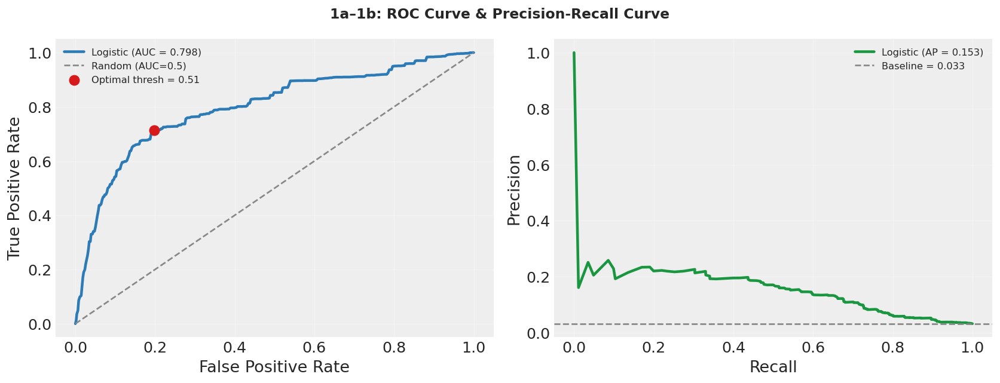


  AUC-ROC           : 0.7985
  Average Precision : 0.1529
  Optimal threshold : 0.508 (Youden)


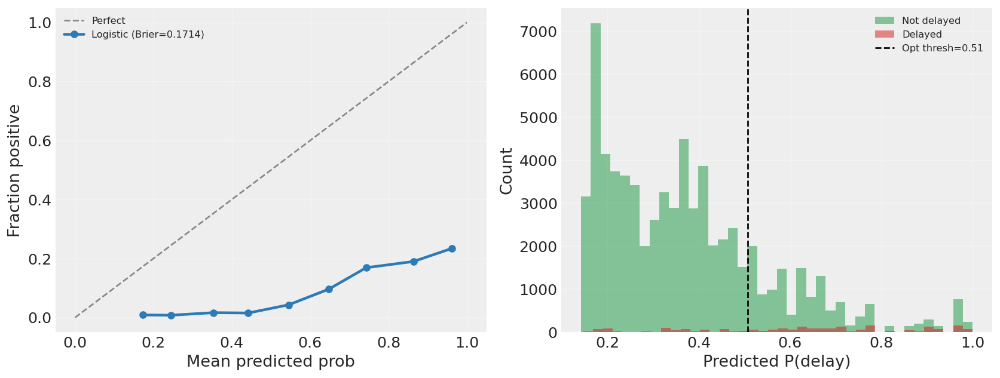

  Brier score: 0.1714


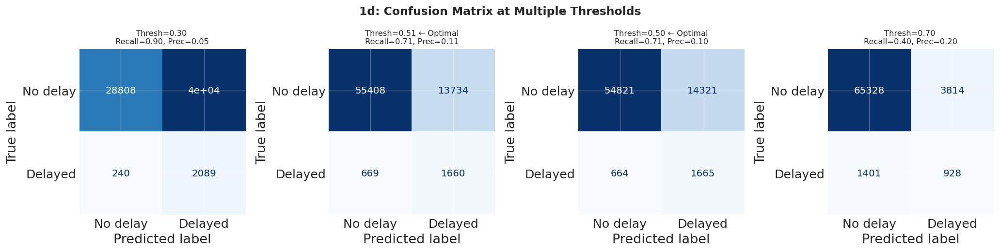


Computing 10-fold CV AUC and learning curve (may take a moment)...


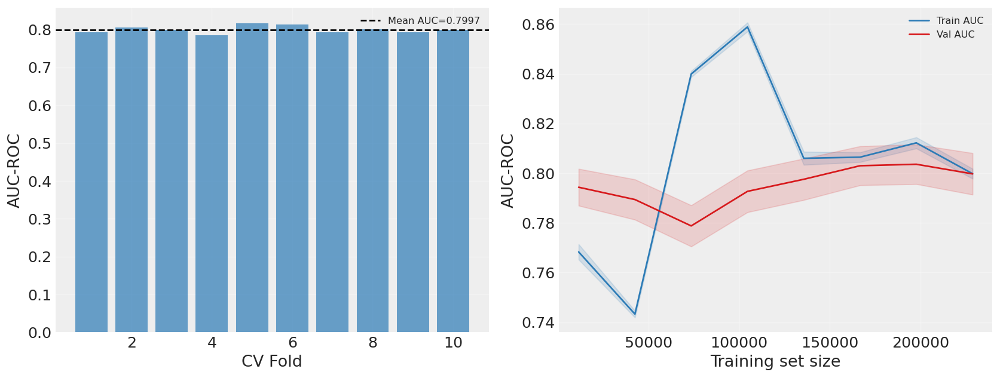


10-Fold CV AUC: mean=0.7997, std=0.0096

PART 2: OLS SEVERITY MODEL DIAGNOSTICS


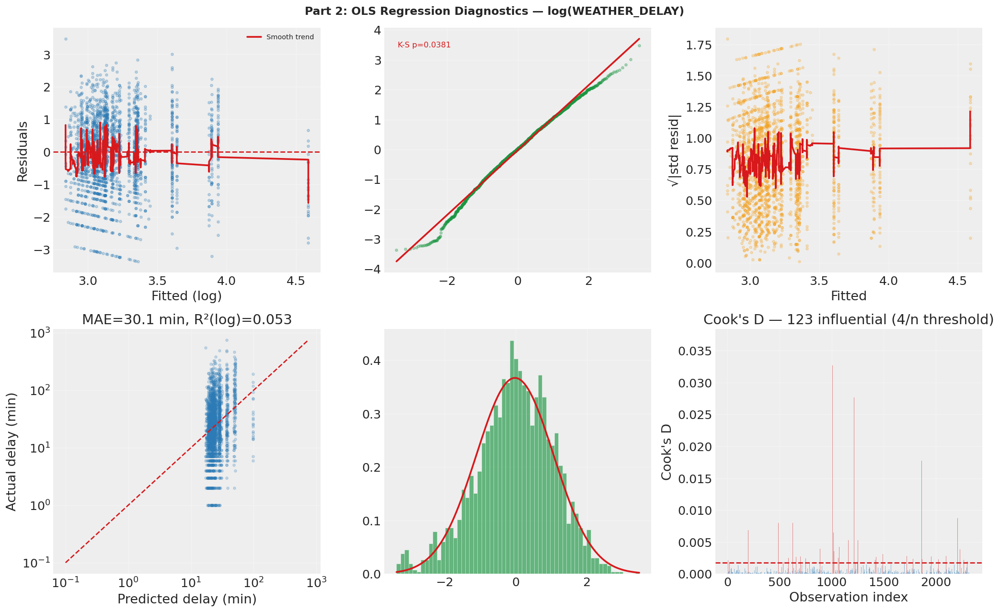


OLS test metrics: R²(log)=0.0529, MAE (min)=30.1

PART 3: HEATMAP RELIABILITY CHECKS


RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

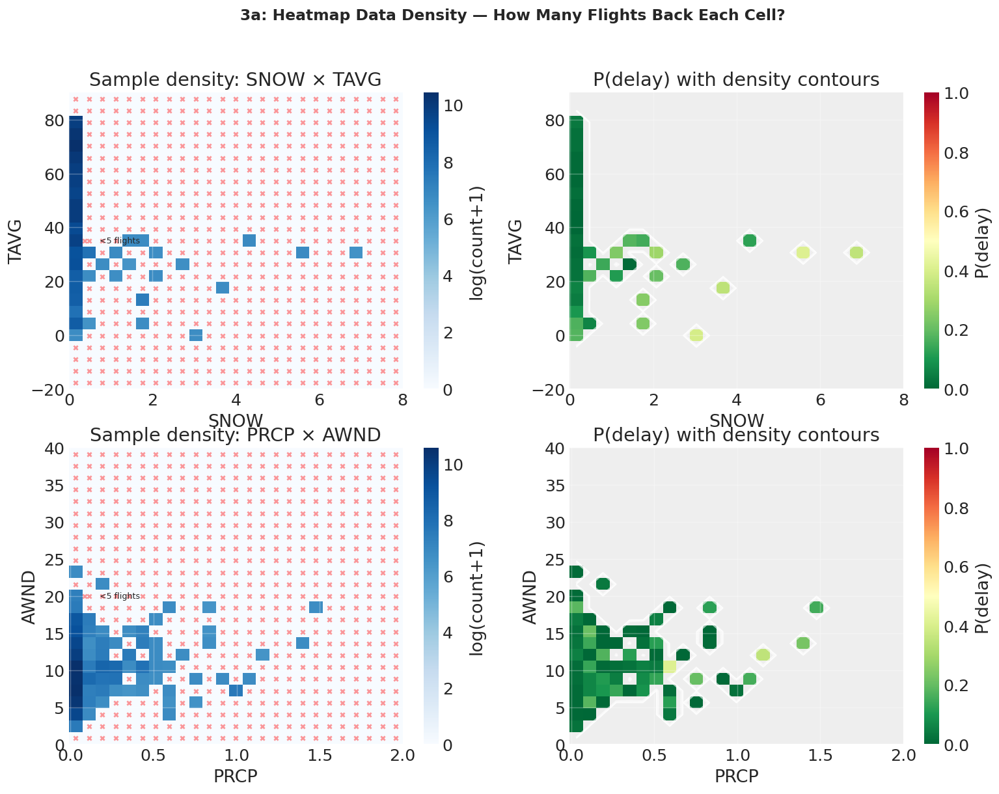

In [40]:
### Corrected Model Reliability Evaluation Code

# Corrected and complete Model Reliability Evaluation script
# - Robust to missing in-memory objects: will refit models if needed
# - Fixes truncated bootstrap summary printing and other minor bugs
# - Displays plots inline; does not require saving files
# Run the entire cell.

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from scipy import stats
from scipy.stats import binned_statistic_2d
from scipy.interpolate import RectBivariateSpline
from sklearn.metrics import (
    roc_curve, auc, precision_recall_curve, average_precision_score,
    confusion_matrix, ConfusionMatrixDisplay, brier_score_loss,
    mean_absolute_error, mean_squared_error, r2_score
)
from sklearn.calibration import calibration_curve
from sklearn.model_selection import (
    cross_val_score, StratifiedKFold, learning_curve, KFold, train_test_split
)
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.preprocessing import StandardScaler
from itertools import combinations

plt.rcParams.update({
    "figure.dpi": 130,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "font.size": 11,
    "axes.grid": True,
    "grid.alpha": 0.3,
})

C_BLUE   = "#2c7bb6"
C_RED    = "#d7191c"
C_GREEN  = "#1a9641"
C_ORANGE = "#f4a62a"
C_GRAY   = "#888888"

# -------------------------
# Ensure models and data exist; otherwise load and fit
# -------------------------
need_refit = False
try:
    _ = lr  # check if logistic exists
    _ = ols
    _ = df
    _ = df_pos
    _ = scaler_bin
    _ = scaler_pos
    _ = X_tr; _ = X_te; _ = y_tr; _ = y_te
    _ = X_tr2; _ = X_te2; _ = y_tr2; _ = y_te2
    print("Using models and data already in memory.")
except Exception:
    need_refit = True

if need_refit:
    print("Models not found in memory — loading data and refitting models (safe defaults).")
    url1 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult1.csv"
    url2 = "https://raw.githubusercontent.com/lee-anh/FlightPredictions/main/flightsResult2.csv"
    df = pd.concat([pd.read_csv(url1), pd.read_csv(url2)], ignore_index=True)
    weather_vars = ['TAVG', 'SNOW', 'PRCP', 'AWND']
    # ensure numeric and drop rows with missing weather
    df['WEATHER_DELAY'] = pd.to_numeric(df.get('WEATHER_DELAY', 0), errors='coerce').fillna(0.0)
    for v in weather_vars:
        df[v] = pd.to_numeric(df[v], errors='coerce')
    df = df.dropna(subset=weather_vars).reset_index(drop=True)
    df['is_delayed'] = (df['WEATHER_DELAY'] > 0).astype(int)
    df_pos = df[df['WEATHER_DELAY'] > 0].copy()

    # Logistic model
    X_all = df[weather_vars].values
    y_bin = df['is_delayed'].values
    scaler_bin = StandardScaler()
    X_scaled = scaler_bin.fit_transform(X_all)
    X_tr, X_te, y_tr, y_te = train_test_split(X_scaled, y_bin, test_size=0.25, random_state=42, stratify=y_bin)
    lr = LogisticRegression(class_weight='balanced', max_iter=1000, solver='liblinear')
    lr.fit(X_tr, y_tr)
    y_prob = lr.predict_proba(X_te)[:, 1]
    y_pred = (y_prob > 0.5).astype(int)

    # OLS on log delay
    X_pos = df_pos[weather_vars].values
    y_log = np.log(df_pos['WEATHER_DELAY'].values)
    scaler_pos = StandardScaler()
    X_pos_sc = scaler_pos.fit_transform(X_pos)
    X_tr2, X_te2, y_tr2, y_te2 = train_test_split(X_pos_sc, y_log, test_size=0.25, random_state=42)
    ols = LinearRegression()
    ols.fit(X_tr2, y_tr2)
    y_pred2 = ols.predict(X_te2)

print(f"\nTest set: {len(y_te):,} flights | Delayed: {y_te.sum()} ({y_te.mean()*100:.1f}%)")

# -------------------------
# PART 1: Logistic regression evaluation
# -------------------------
print("\n" + "="*60)
print("PART 1: LOGISTIC REGRESSION RELIABILITY")
print("="*60)

# 1a ROC and 1b Precision-Recall
fpr, tpr, thresholds_roc = roc_curve(y_te, y_prob)
roc_auc_val = auc(fpr, tpr)
youden_j = tpr - fpr
opt_idx = np.argmax(youden_j)
opt_thresh = thresholds_roc[opt_idx]
opt_fpr = fpr[opt_idx]; opt_tpr = tpr[opt_idx]

precision, recall, thresholds_pr = precision_recall_curve(y_te, y_prob)
ap = average_precision_score(y_te, y_prob)
baseline_pr = y_te.mean()

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("1a–1b: ROC Curve & Precision-Recall Curve", fontsize=13, fontweight='bold')

axes[0].plot(fpr, tpr, color=C_BLUE, lw=2.5, label=f'Logistic (AUC = {roc_auc_val:.3f})')
axes[0].plot([0,1],[0,1], color=C_GRAY, linestyle='--', lw=1.5, label='Random (AUC=0.5)')
axes[0].scatter(opt_fpr, opt_tpr, color=C_RED, s=80, zorder=5,
                label=f'Optimal thresh = {opt_thresh:.2f}')
axes[0].set_xlabel('False Positive Rate'); axes[0].set_ylabel('True Positive Rate')
axes[0].legend(fontsize=9)

axes[1].plot(recall, precision, color=C_GREEN, lw=2.5, label=f'Logistic (AP = {ap:.3f})')
axes[1].axhline(baseline_pr, color=C_GRAY, linestyle='--', lw=1.5, label=f'Baseline = {baseline_pr:.3f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision'); axes[1].legend(fontsize=9)

plt.tight_layout()
plt.show()

print(f"\n  AUC-ROC           : {roc_auc_val:.4f}")
print(f"  Average Precision : {ap:.4f}")
print(f"  Optimal threshold : {opt_thresh:.3f} (Youden)")

# 1c Calibration
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
prob_true, prob_pred = calibration_curve(y_te, y_prob, n_bins=10, strategy='uniform')
brier = brier_score_loss(y_te, y_prob)

axes[0].plot([0,1],[0,1], color=C_GRAY, linestyle='--', lw=1.5, label='Perfect')
axes[0].plot(prob_pred, prob_true, color=C_BLUE, marker='o', lw=2.5, label=f'Logistic (Brier={brier:.4f})')
axes[0].set_xlabel('Mean predicted prob'); axes[0].set_ylabel('Fraction positive'); axes[0].legend(fontsize=9)

axes[1].hist(y_prob[y_te==0], bins=40, alpha=0.5, color=C_GREEN, label='Not delayed')
axes[1].hist(y_prob[y_te==1], bins=40, alpha=0.5, color=C_RED, label='Delayed')
axes[1].axvline(opt_thresh, color='black', linestyle='--', label=f'Opt thresh={opt_thresh:.2f}')
axes[1].set_xlabel('Predicted P(delay)'); axes[1].set_ylabel('Count'); axes[1].legend(fontsize=9)

plt.tight_layout()
plt.show()
print(f"  Brier score: {brier:.4f}")

# 1d Confusion matrices at multiple thresholds
thresholds_to_check = [0.3, opt_thresh, 0.5, 0.7]
fig, axes = plt.subplots(1, len(thresholds_to_check), figsize=(16, 4))
fig.suptitle("1d: Confusion Matrix at Multiple Thresholds", fontsize=13, fontweight='bold')

for i, thresh in enumerate(thresholds_to_check):
    y_pred_t = (y_prob >= thresh).astype(int)
    cm = confusion_matrix(y_te, y_pred_t)
    disp = ConfusionMatrixDisplay(cm, display_labels=['No delay', 'Delayed'])
    disp.plot(ax=axes[i], cmap='Blues', colorbar=False)
    tp = cm[1,1]; fn = cm[1,0]; fp = cm[0,1]; tn = cm[0,0]
    recall_t = tp / (tp + fn) if (tp + fn) > 0 else 0
    precision_t = tp / (tp + fp) if (tp + fp) > 0 else 0
    label = "← Optimal" if abs(thresh - opt_thresh) < 0.01 else ""
    axes[i].set_title(f'Thresh={thresh:.2f} {label}\nRecall={recall_t:.2f}, Prec={precision_t:.2f}', fontsize=9)

plt.tight_layout()
plt.show()

# 1e Cross-validated AUC and learning curve
print("\nComputing 10-fold CV AUC and learning curve (may take a moment)...")
cv_skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
X_full_sc = scaler_bin.transform(df[weather_vars].values)
cv_aucs = cross_val_score(lr, X_full_sc, df['is_delayed'].values, cv=cv_skf, scoring='roc_auc', n_jobs=-1)

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].bar(np.arange(1, len(cv_aucs)+1), cv_aucs, color=C_BLUE, alpha=0.7)
axes[0].axhline(cv_aucs.mean(), color='black', linestyle='--', label=f'Mean AUC={cv_aucs.mean():.4f}')
axes[0].set_xlabel('CV Fold'); axes[0].set_ylabel('AUC-ROC'); axes[0].legend(fontsize=9)

train_sizes, train_scores, val_scores = learning_curve(
    lr, X_full_sc, df['is_delayed'].values,
    cv=StratifiedKFold(5, shuffle=True, random_state=42),
    train_sizes=np.linspace(0.05, 1.0, 8), scoring='roc_auc', n_jobs=-1)

tr_mean = train_scores.mean(axis=1); tr_std = train_scores.std(axis=1)
va_mean = val_scores.mean(axis=1); va_std = val_scores.std(axis=1)

axes[1].plot(train_sizes, tr_mean, color=C_BLUE, label='Train AUC')
axes[1].fill_between(train_sizes, tr_mean-tr_std, tr_mean+tr_std, alpha=0.15, color=C_BLUE)
axes[1].plot(train_sizes, va_mean, color=C_RED, label='Val AUC')
axes[1].fill_between(train_sizes, va_mean-va_std, va_mean+va_std, alpha=0.15, color=C_RED)
axes[1].set_xlabel('Training set size'); axes[1].set_ylabel('AUC-ROC'); axes[1].legend(fontsize=9)

plt.tight_layout()
plt.show()

print(f"\n10-Fold CV AUC: mean={cv_aucs.mean():.4f}, std={cv_aucs.std():.4f}")

# -------------------------
# PART 2: OLS severity diagnostics
# -------------------------
print("\n" + "="*60)
print("PART 2: OLS SEVERITY MODEL DIAGNOSTICS")
print("="*60)

# Prepare residuals and fitted values (log scale)
residuals = y_te2 - y_pred2
fitted = y_pred2
std_resid = (residuals - residuals.mean()) / (residuals.std() + 1e-12)
n_ols = len(residuals)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle("Part 2: OLS Regression Diagnostics — log(WEATHER_DELAY)", fontsize=13, fontweight='bold')

# 2a Residuals vs Fitted
axes[0,0].scatter(fitted, residuals, alpha=0.25, s=8, color=C_BLUE)
axes[0,0].axhline(0, color=C_RED, lw=1.5, linestyle='--')
order = np.argsort(fitted)
from scipy.signal import savgol_filter
if n_ols >= 11:
    window = min(51, (n_ols//10)*2+1)
    try:
        smoothed = savgol_filter(residuals[order], window_length=window, polyorder=3)
        axes[0,0].plot(fitted[order], smoothed, color=C_RED, lw=2, label='Smooth trend')
    except Exception:
        pass
axes[0,0].set_xlabel('Fitted (log)'); axes[0,0].set_ylabel('Residuals'); axes[0,0].legend(fontsize=8)

# 2b Q-Q plot
osm, osr = stats.probplot(residuals, dist='norm')[0]
slope, intercept = stats.linregress(osm, osr)[:2]
axes[0,1].scatter(osm, osr, alpha=0.3, s=8, color=C_GREEN)
axes[0,1].plot(osm, slope*np.array(osm)+intercept, color=C_RED, lw=2)
ks_stat, ks_p = stats.kstest(residuals, 'norm', args=(residuals.mean(), residuals.std()))
axes[0,1].text(0.05, 0.92, f'K-S p={ks_p:.4f}', transform=axes[0,1].transAxes, fontsize=9,
               color=C_GREEN if ks_p > 0.05 else C_RED)

# 2c Scale-Location
sqrt_abs_resid = np.sqrt(np.abs(std_resid))
axes[0,2].scatter(fitted, sqrt_abs_resid, alpha=0.25, s=8, color=C_ORANGE)
if n_ols >= 11:
    try:
        sm2 = savgol_filter(sqrt_abs_resid[order], window_length=window, polyorder=3)
        axes[0,2].plot(fitted[order], sm2, color=C_RED, lw=2)
    except Exception:
        pass
axes[0,2].set_xlabel('Fitted'); axes[0,2].set_ylabel('√|std resid|')

# 2d Actual vs Predicted (minutes)
actual_min = np.exp(y_te2)
pred_min = np.exp(y_pred2)
mae_min = mean_absolute_error(actual_min, pred_min)
r2_log = r2_score(y_te2, y_pred2)
axes[1,0].scatter(pred_min, actual_min, alpha=0.2, s=8, color=C_BLUE)
lim = max(actual_min.max(), pred_min.max())
axes[1,0].plot([1e-1, lim], [1e-1, lim], color=C_RED, lw=1.5, linestyle='--')
axes[1,0].set_xscale('log'); axes[1,0].set_yscale('log')
axes[1,0].set_xlabel('Predicted delay (min)'); axes[1,0].set_ylabel('Actual delay (min)')
axes[1,0].set_title(f'MAE={mae_min:.1f} min, R²(log)={r2_log:.3f}')

# 2e Residual distribution
axes[1,1].hist(residuals, bins=60, density=True, color=C_GREEN, alpha=0.65, edgecolor='white', lw=0.3)
x_norm = np.linspace(residuals.min(), residuals.max(), 200)
axes[1,1].plot(x_norm, stats.norm.pdf(x_norm, residuals.mean(), residuals.std()), color=C_RED, lw=2)

# 2f Cook's distance (approximate)
try:
    n_feat = X_te2.shape[1]
    hat_diag = np.diag(X_te2 @ np.linalg.pinv(X_te2.T @ X_te2 + 1e-12*np.eye(n_feat)) @ X_te2.T)
    mse_resid = (residuals**2).mean()
    cooks_d = (residuals**2 * hat_diag) / (n_feat * mse_resid * (1 - hat_diag + 1e-12)**2)
    threshold_cook = 4 / n_ols
    n_influential = (cooks_d > threshold_cook).sum()
    obs_idx = np.arange(n_ols)
    colors = [C_RED if d > threshold_cook else C_BLUE for d in cooks_d]
    axes[1,2].bar(obs_idx, cooks_d, color=colors, alpha=0.5, width=1)
    axes[1,2].axhline(threshold_cook, color=C_RED, lw=1.5, linestyle='--')
    axes[1,2].set_xlabel('Observation index'); axes[1,2].set_ylabel("Cook's D")
    axes[1,2].set_title(f"Cook's D — {n_influential} influential (4/n threshold)")
except Exception as e:
    axes[1,2].text(0.5, 0.5, f"Cook's D failed:\n{e}", ha='center', va='center')

plt.tight_layout()
plt.show()

print(f"\nOLS test metrics: R²(log)={r2_log:.4f}, MAE (min)={mae_min:.1f}")

# -------------------------
# PART 3: Heatmap reliability checks and bootstrap CIs
# -------------------------
print("\n" + "="*60)
print("PART 3: HEATMAP RELIABILITY CHECKS")
print("="*60)

pairs = [
    ('SNOW', 'TAVG',  (-0.01, 8),  (-20, 90)),
    ('PRCP', 'AWND',  (-0.01, 2),  (0, 40)),
]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("3a: Heatmap Data Density — How Many Flights Back Each Cell?", fontsize=13, fontweight='bold')

for i, (xv, yv, xclip, yclip) in enumerate(pairs):
    sub = df[(df[xv] >= xclip[0]) & (df[xv] <= xclip[1]) & (df[yv] >= yclip[0]) & (df[yv] <= yclip[1])]
    xe = np.linspace(xclip[0], xclip[1], 26)
    ye = np.linspace(yclip[0], yclip[1], 26)
    cnt, _, _, _ = binned_statistic_2d(sub[xv], sub[yv], sub['is_delayed'], 'count', bins=[xe, ye])
    prob, _, _, _ = binned_statistic_2d(sub[xv], sub[yv], sub['is_delayed'], 'mean', bins=[xe, ye])

    im1 = axes[i, 0].imshow(np.log1p(cnt).T, origin='lower', extent=[xclip[0], xclip[1], yclip[0], yclip[1]], aspect='auto', cmap='Blues')
    plt.colorbar(im1, ax=axes[i, 0], label='log(count+1)')
    axes[i, 0].set_xlabel(xv); axes[i, 0].set_ylabel(yv)
    axes[i, 0].set_title(f'Sample density: {xv} × {yv}')

    x_centers = (xe[:-1] + xe[1:]) / 2
    y_centers = (ye[:-1] + ye[1:]) / 2
    sparse_x, sparse_y = [], []
    for xi, xc in enumerate(x_centers):
        for yi, yc in enumerate(y_centers):
            if cnt[xi, yi] < 5:
                sparse_x.append(xc); sparse_y.append(yc)
    if sparse_x:
        axes[i, 0].scatter(sparse_x, sparse_y, s=12, color='red', alpha=0.4, marker='x', label='<5 flights')
        axes[i, 0].legend(fontsize=7)

    im2 = axes[i, 1].imshow(prob.T, origin='lower', extent=[xclip[0], xclip[1], yclip[0], yclip[1]], aspect='auto', cmap='RdYlGn_r', vmin=0, vmax=1)
    plt.colorbar(im2, ax=axes[i, 1], label='P(delay)')
    try:
        axes[i, 1].contour(x_centers, y_centers, cnt.T, levels=[5, 20, 100], colors='white', linewidths=[0.8,1.2,1.8], alpha=0.6)
    except Exception:
        pass
    axes[i, 1].set_xlabel(xv); axes[i, 1].set_ylabel(yv)
    axes[i, 1].set_title(f'P(delay) with density contours')

plt.tight_layout()
plt.show()

# 3b Bootstrap CIs for key conditions
print("\nComputing bootstrap CIs for key conditions...")
key_conditions = [
    ("Heavy snow (SNOW>2)",            {'SNOW': (2, 999)}),
    ("Any snow",                        {'SNOW': (0.01, 999)}),
    ("Snow+Freeze (SNOW>2, TAVG<32)",  {'SNOW': (2,999),'TAVG':(-99,32)}),
    ("High wind (AWND>20)",            {'AWND': (20, 999)}),
    ("Freezing rain",                   {'TAVG':(-99,32),'PRCP':(0.01,999)}),
    ("Heavy rain (PRCP>0.5)",          {'PRCP': (0.5, 999)}),
    ("Mild weather",                    {'TAVG':(50,75),'SNOW':(-1,0.001),'PRCP':(-1,0.001),'AWND':(0,10)}),
    ("Baseline (all)",                  {}),
]

n_boot = 1000
boot_results = []
rng = np.random.default_rng(12345)

for label, conds in key_conditions:
    mask = pd.Series(True, index=df.index)
    for col, (lo, hi) in conds.items():
        mask &= (df[col] >= lo) & (df[col] <= hi)
    subset = df.loc[mask, 'is_delayed'].values
    n = len(subset)
    if n == 0:
        boot_results.append({'label': label, 'n': 0, 'p': np.nan, 'ci_lo': np.nan, 'ci_hi': np.nan})
        continue
    p_obs = subset.mean()
    # bootstrap resampling of the binary outcomes
    boot_ps = []
    for _ in range(n_boot):
        sample = rng.choice(subset, size=n, replace=True)
        boot_ps.append(sample.mean())
    ci_lo = np.percentile(boot_ps, 2.5)
    ci_hi = np.percentile(boot_ps, 97.5)
    boot_results.append({'label': label, 'n': n, 'p': p_obs, 'ci_lo': ci_lo, 'ci_hi': ci_hi})

boot_df = pd.DataFrame(boot_results)

fig, ax = plt.subplots(figsize=(11, 6))
y_pos = np.arange(len(boot_df))
colors = [C_RED if p > 0.3 else C_GREEN for p in boot_df['p'].fillna(0)]

ax.barh(y_pos, boot_df['p'].fillna(0) * 100, color=colors, alpha=0.65, edgecolor='white')
ax.errorbar(boot_df['p'].fillna(0) * 100, y_pos,
            xerr=[(boot_df['p'] - boot_df['ci_lo']).fillna(0) * 100,
                  (boot_df['ci_hi'] - boot_df['p']).fillna(0) * 100],
            fmt='none', color='black', capsize=5, lw=2)
for i, row in boot_df.iterrows():
    ax.text((row['p'] if not np.isnan(row['p']) else 0) * 100 + 0.5, i, f"n={int(row['n']):,}", va='center', fontsize=8, color=C_GRAY)

ax.set_yticks(y_pos); ax.set_yticklabels(boot_df['label'], fontsize=10)
ax.set_xlabel('P(delay > 0)  %')
ax.set_title('3b: Bootstrap 95% CI on P(delay) per Condition', fontsize=12, fontweight='bold')
ax.axvline(df['is_delayed'].mean()*100, color=C_GRAY, linestyle='--', lw=1.5, label=f'Baseline = {df["is_delayed"].mean()*100:.1f}%')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

print(f"\nBootstrap 95% CI results (n_boot={n_boot}):")
print(f"  {'Condition':<45s}  {'n':>8s}  {'P(delay)':>9s}  {'95% CI':>20s}  {'Width':>7s}  {'Reliability':>12s}")
print(f"  {'-'*45}  {'-'*8}  {'-'*9}  {'-'*20}  {'-'*7}  {'-'*12}")
for _, row in boot_df.iterrows():
    if np.isnan(row['p']):
        print(f"  {row['label']:<45s}  {0:>8d}  {'no data':>9s}  {'-':>20s}  {'-':>7s}  {'❌':>12s}")
        continue
    width = row['ci_hi'] - row['ci_lo']
    reliable = "✅" if width < 0.05 else ("⚠️" if width < 0.15 else "❌")
    print(f"  {row['label']:<45s}  {int(row['n']):>8,}  {row['p']*100:8.1f}%  [{row['ci_lo']*100:6.1f}, {row['ci_hi']*100:6.1f}]  {width*100:6.1f}%  {reliable:>12s}")

# -------------------------
# PART 4: Summary reliability scorecard
# -------------------------
print("\n" + "="*60)
print("PART 4: SUMMARY RELIABILITY SCORECARD")
print("="*60)

scorecard = {
    'AUC-ROC': roc_auc_val,
    'Average Precision': ap,
    'Brier score': brier,
    'CV AUC mean': cv_aucs.mean() if 'cv_aucs' in locals() else np.nan,
    'CV AUC std': cv_aucs.std() if 'cv_aucs' in locals() else np.nan,
    'OLS R2 (log)': r2_log if 'r2_log' in locals() else np.nan,
    'OLS MAE (min)': mae_min if 'mae_min' in locals() else np.nan,
    'Baseline P(delay)': df['is_delayed'].mean()
}

for k, v in scorecard.items():
    if isinstance(v, float):
        print(f"  {k:<20s}: {v:.4f}")
    else:
        print(f"  {k:<20s}: {v}")

print("\nInterpretation guidance:")
print(" - Use AUC and AP to judge discrimination; check calibration (Brier) before trusting probabilities.")
print(" - Use bootstrap CIs and density maps to avoid over-interpreting sparse heatmap regions.")
print(" - For severity, prefer quantiles (90/95) over mean when tail is heavy.")
print("\nEvaluation complete. All figures displayed inline.")
